In [5]:
### EDA Pkgs
import pandas as pd


In [6]:
# Data Viz Pkg
import matplotlib.pyplot as plt
import seaborn as sns

In [7]:
# Hiden warnings
import warnings
warnings.filterwarnings('ignore')


In [8]:
# Load Dataset
df = pd.read_csv("https://raw.githubusercontent.com/gabrielpreda/covid-19-tweets/master/covid19_tweets.csv") 


In [9]:
# preview
df.head()

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet
0,ᏉᎥ☻լꂅϮ,astroworld,wednesday addams as a disney princess keepin i...,2017-05-26 05:46:42,624,950,18775,False,2020-07-25 12:27:21,If I smelled the scent of hand sanitizers toda...,NaN,Twitter for iPhone,False
1,Tom Basile 🇺🇸,"New York, NY","Husband, Father, Columnist & Commentator. Auth...",2009-04-16 20:06:23,2253,1677,24,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,NaN,Twitter for Android,False
2,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9275,9525,7254,False,2020-07-25 12:27:14,@diane3443 @wdunlap @realDonaldTrump Trump nev...,['COVID19'],Twitter for Android,False
3,ethel mertz,Stuck in the Middle,#Browns #Indians #ClevelandProud #[]_[] #Cavs ...,2019-03-07 01:45:06,197,987,1488,False,2020-07-25 12:27:10,@brookbanktv The one gift #COVID19 has give me...,['COVID19'],Twitter for iPhone,False
4,DIPR-J&K,Jammu and Kashmir,🖊️Official Twitter handle of Department of Inf...,2017-02-12 06:45:15,101009,168,101,False,2020-07-25 12:27:08,25 July : Media Bulletin on Novel #CoronaVirus...,"['CoronaVirusUpdates', 'COVID19']",Twitter for Android,False


 #### Task
    + Text
        - Text Preprocessing
        - Sentiment Analysis
        - Keyword Extraction
        - Entity Extraction

In [10]:
# Check Columns
df.columns

Index(['user_name', 'user_location', 'user_description', 'user_created',
       'user_followers', 'user_friends', 'user_favourites', 'user_verified',
       'date', 'text', 'hashtags', 'source', 'is_retweet'],
      dtype='object')

In [11]:
# Datatype
df.dtypes

user_name           object
user_location       object
user_description    object
user_created        object
user_followers       int64
user_friends         int64
user_favourites      int64
user_verified         bool
date                object
text                object
hashtags            object
source              object
is_retweet            bool
dtype: object

In [12]:
# Source/ Value Count/Distribution of the Sources
df['source'].unique()

array(['Twitter for iPhone', 'Twitter for Android', 'Twitter Web App',
       'Buffer', 'TweetDeck', 'Twitter for iPad', 'Africa Newsroom',
       'Blood Donors India', 'TweetCaster for Android',
       'Alexander Higgins', 'IFTTT', 'Hootsuite Inc.', 'Sprout Social',
       'Sprinklr', 'assarofficial', 'IAMBLOG2TWITTER', 'CrowdControlHQ',
       'COVID19-Updates', 'EveryoneSocial', 'Dynamic Signal', 'Instagram',
       'TweetCaster for iOS', 'GlobalPandemic.NET', 'Venrap Radio',
       'HeyOrca', 'Twitter for Advertisers', 'Paper.li',
       'Twitter Media Studio', 'Twitter for Mac', 'dlvr.it',
       'Cheap Bots, Done Quick!', 'Prof. Shanku', 'LaterMedia',
       'SEMrush Social Media Tool', 'Twitterrific for iOS',
       "Sebastian's Twitter Bot", 'Threader_client', 'COVID19FactoidBot',
       'PwC UK SMART', 'tweet pro stiff', 'UK COVID-19 Alerts',
       'Resistbot Open Letters', 'preprint-alert', 'ContentStudio.io',
       'Peeping Moon', 'TweetAutomaticos', 'Orlo', 'AgoraPulse Ma

In [13]:
# Source/ Value Count/Distribution of the Sources
df['source'].value_counts()

Twitter Web App                  56891
Twitter for Android              40179
Twitter for iPhone               35472
TweetDeck                         8543
Hootsuite Inc.                    7321
                                 ...  
CletusDroo                           1
Covid19MT                            1
Boost Old Posts                      1
TMZ iPhone Social Application        1
SiteAssist Social Posting            1
Name: source, Length: 610, dtype: int64

In [14]:
# Plot the top value_counts
df['source'].value_counts().nlargest(30)

Twitter Web App            56891
Twitter for Android        40179
Twitter for iPhone         35472
TweetDeck                   8543
Hootsuite Inc.              7321
Twitter for iPad            4336
Buffer                      2728
Sprout Social               1833
Instagram                   1759
IFTTT                       1545
dlvr.it                      681
GlobalPandemic.NET           679
LinkedIn                     628
COVID19-Updates              625
Twitter Media Studio         596
WordPress.com                537
HubSpot                      513
Sprinklr                     497
FS Poster                    414
Dynamic Signal               391
Resistbot Open Letters       390
Cheap Bots, Done Quick!      335
Paper.li                     322
Twitter for Advertisers      317
Blood Donors India           281
IAMBLOG2TWITTER              266
Alexander Higgins            225
Zoho Social                  224
The Social Jukebox           216
Fabrik.fm                    209
Name: sour

<AxesSubplot:>

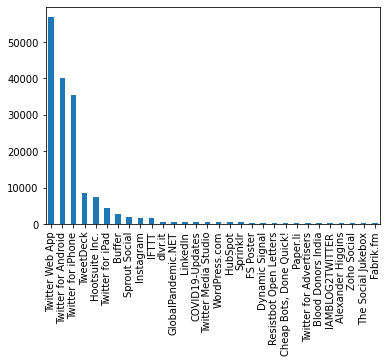

In [15]:
# Plot the top value_counts
df['source'].value_counts().nlargest(30).plot(kind='bar')

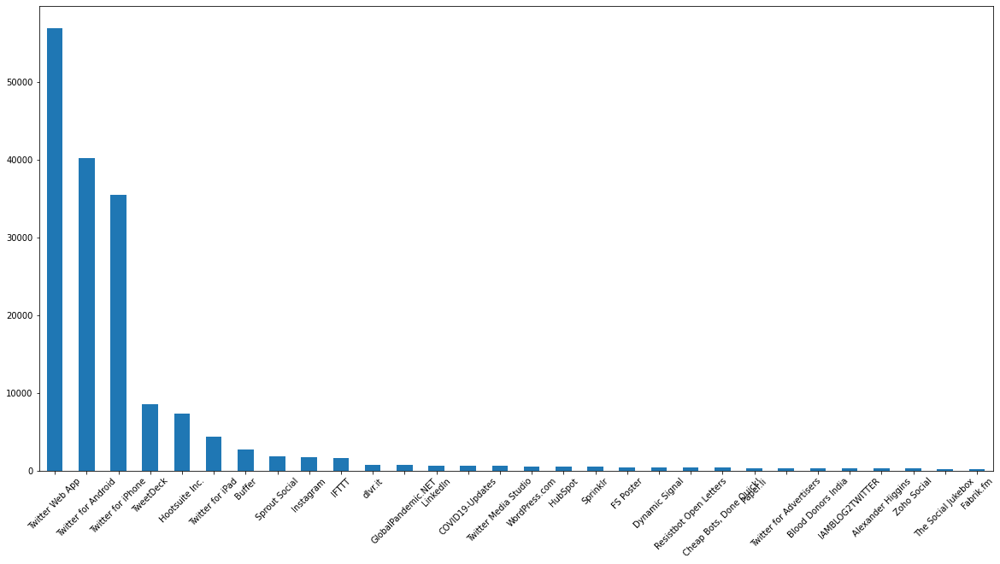

In [16]:
# Plot the top value_counts
plt.figure(figsize=(20,10))
df['source'].value_counts().nlargest(30).plot(kind='bar')
plt.xticks(rotation=45)
plt.show()

In [17]:
# Load Text Cleaning Package
import neattext.functions as nfx

In [18]:
# Methods/Attrib
dir(nfx)

['BTC_ADDRESS_REGEX',
 'CURRENCY_REGEX',
 'CURRENCY_SYMB_REGEX',
 'Counter',
 'DATE_REGEX',
 'EMAIL_REGEX',
 'EMOJI_REGEX',
 'HASTAG_REGEX',
 'MASTERCard_REGEX',
 'MD5_SHA_REGEX',
 'MOST_COMMON_PUNCT_REGEX',
 'NUMBERS_REGEX',
 'PHONE_REGEX',
 'PoBOX_REGEX',
 'SPECIAL_CHARACTERS_REGEX',
 'STOPWORDS',
 'STOPWORDS_de',
 'STOPWORDS_en',
 'STOPWORDS_es',
 'STOPWORDS_fr',
 'STOPWORDS_ru',
 'STOPWORDS_yo',
 'STREET_ADDRESS_REGEX',
 'TextFrame',
 'URL_PATTERN',
 'USER_HANDLES_REGEX',
 'VISACard_REGEX',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__generate_text',
 '__loader__',
 '__name__',
 '__numbers_dict',
 '__package__',
 '__spec__',
 '_lex_richness_herdan',
 '_lex_richness_maas_ttr',
 'clean_text',
 'defaultdict',
 'digit2words',
 'extract_btc_address',
 'extract_currencies',
 'extract_currency_symbols',
 'extract_dates',
 'extract_emails',
 'extract_emojis',
 'extract_hashtags',
 'extract_html_tags',
 'extract_mastercard_addr',
 'extract_md5sha',
 'extract_numbers',
 'extr

In [19]:
df['text'].iloc[2]

'@diane3443 @wdunlap @realDonaldTrump Trump never once claimed #COVID19 was a hoax. We all claim that this effort to… https://t.co/Jkk8vHWHb3'


Noise

    - remove mentions/userhandles
    - remove hashtags
    - urls
    - emojis
    - special char



In [20]:
df.head()

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet
0,ᏉᎥ☻լꂅϮ,astroworld,wednesday addams as a disney princess keepin i...,2017-05-26 05:46:42,624,950,18775,False,2020-07-25 12:27:21,If I smelled the scent of hand sanitizers toda...,NaN,Twitter for iPhone,False
1,Tom Basile 🇺🇸,"New York, NY","Husband, Father, Columnist & Commentator. Auth...",2009-04-16 20:06:23,2253,1677,24,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,NaN,Twitter for Android,False
2,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9275,9525,7254,False,2020-07-25 12:27:14,@diane3443 @wdunlap @realDonaldTrump Trump nev...,['COVID19'],Twitter for Android,False
3,ethel mertz,Stuck in the Middle,#Browns #Indians #ClevelandProud #[]_[] #Cavs ...,2019-03-07 01:45:06,197,987,1488,False,2020-07-25 12:27:10,@brookbanktv The one gift #COVID19 has give me...,['COVID19'],Twitter for iPhone,False
4,DIPR-J&K,Jammu and Kashmir,🖊️Official Twitter handle of Department of Inf...,2017-02-12 06:45:15,101009,168,101,False,2020-07-25 12:27:08,25 July : Media Bulletin on Novel #CoronaVirus...,"['CoronaVirusUpdates', 'COVID19']",Twitter for Android,False


In [21]:
df['text'].apply(nfx.extract_hashtags)

0                                      []
1                                      []
2                              [#COVID19]
3                              [#COVID19]
4         [#CoronaVirusUpdates, #COVID19]
                       ...               
179103                       [#WearAMask]
179104                         [#COVID19]
179105                                 []
179106                         [#COVID19]
179107                                 []
Name: text, Length: 179108, dtype: object

In [22]:
df['extracted_hashtags'] = df['text'].apply(nfx.extract_hashtags)

In [23]:
df[['extracted_hashtags','hashtags']]

,extracted_hashtags,hashtags
0,[],NaN
1,[],NaN
2,[#COVID19],['COVID19']
3,[#COVID19],['COVID19']
4,"[#CoronaVirusUpdates, #COVID19]","['CoronaVirusUpdates', 'COVID19']"
...,...,...
179103,[#WearAMask],['WearAMask']
179104,[#COVID19],['COVID19']
179105,[],NaN
179106,[#COVID19],['COVID19']


In [24]:
# Cleaning Text
df['clean_tweet'] = df['text'].apply(nfx.remove_hashtags)

In [25]:
df[['text','clean_tweet']]

,text,clean_tweet
0,If I smelled the scent of hand sanitizers toda...,If I smelled the scent of hand sanitizers toda...
1,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,Hey @Yankees @YankeesPR and @MLB - wouldn't it...
2,@diane3443 @wdunlap @realDonaldTrump Trump nev...,@diane3443 @wdunlap @realDonaldTrump Trump nev...
3,@brookbanktv The one gift #COVID19 has give me...,@brookbanktv The one gift has give me is an ...
4,25 July : Media Bulletin on Novel #CoronaVirus...,25 July : Media Bulletin on Novel \n@kansa...
...,...,...
179103,Thanks @IamOhmai for nominating me for the @WH...,Thanks @IamOhmai for nominating me for the @WH...
179104,2020! The year of insanity! Lol! #COVID19 http...,2020! The year of insanity! Lol! https://t.c...
179105,@CTVNews A powerful painting by Juan Lucena. I...,@CTVNews A powerful painting by Juan Lucena. I...
179106,"More than 1,200 students test positive for #CO...","More than 1,200 students test positive for a..."


In [26]:
df['clean_tweet'] = df['clean_tweet'].apply(lambda x: nfx.remove_userhandles(x))

In [27]:
df[['text','clean_tweet']]

,text,clean_tweet
0,If I smelled the scent of hand sanitizers toda...,If I smelled the scent of hand sanitizers toda...
1,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,Hey and - wouldn't it have made more sen...
2,@diane3443 @wdunlap @realDonaldTrump Trump nev...,Trump never once claimed was a hoax. W...
3,@brookbanktv The one gift #COVID19 has give me...,The one gift has give me is an appreciatio...
4,25 July : Media Bulletin on Novel #CoronaVirus...,25 July : Media Bulletin on Novel \n ...
...,...,...
179103,Thanks @IamOhmai for nominating me for the @WH...,Thanks for nominating me for the challen...
179104,2020! The year of insanity! Lol! #COVID19 http...,2020! The year of insanity! Lol! https://t.c...
179105,@CTVNews A powerful painting by Juan Lucena. I...,A powerful painting by Juan Lucena. It's a t...
179106,"More than 1,200 students test positive for #CO...","More than 1,200 students test positive for a..."


In [28]:
from textblob import TextBlob

In [29]:
def get_sentiment(text):
    blob = TextBlob(text)
    sentiment_polarity = blob.sentiment.polarity
    sentiment_subjectivity = blob.sentiment.subjectivity
    if sentiment_polarity > 0:
        sentiment_label = 'Positive'
    elif sentiment_polarity < 0:
        sentiment_label = 'Negative'
    else:
        sentiment_label = 'Neutral'
    result = {'polarity':sentiment_polarity,
              'subjectivity':sentiment_subjectivity,
              'sentiment':sentiment_label}
    return result

In [30]:
# Text
ex1 = df['clean_tweet'].iloc[0]

In [31]:
get_sentiment(ex1)

{'polarity': -0.25, 'subjectivity': 0.25, 'sentiment': 'Negative'}

In [32]:
df['sentiment_results'] = df['clean_tweet'].apply(get_sentiment)

In [33]:
df['sentiment_results']

0         {'polarity': -0.25, 'subjectivity': 0.25, 'sen...
1         {'polarity': 0.5, 'subjectivity': 0.5, 'sentim...
2         {'polarity': 0.0, 'subjectivity': 0.0, 'sentim...
3         {'polarity': 0.0, 'subjectivity': 0.3571428571...
4         {'polarity': 0.0, 'subjectivity': 0.0, 'sentim...
                                ...                        
179103    {'polarity': 0.2, 'subjectivity': 0.2, 'sentim...
179104    {'polarity': 1.0, 'subjectivity': 0.7, 'sentim...
179105    {'polarity': 0.3, 'subjectivity': 1.0, 'sentim...
179106    {'polarity': 0.26325757575757575, 'subjectivit...
179107    {'polarity': 0.0, 'subjectivity': 0.0, 'sentim...
Name: sentiment_results, Length: 179108, dtype: object

In [34]:
df['sentiment_results'].iloc[0]

{'polarity': -0.25, 'subjectivity': 0.25, 'sentiment': 'Negative'}

In [35]:
pd.json_normalize(df['sentiment_results'].iloc[0])


,polarity,subjectivity,sentiment
0,-0.25,0.25,Negative


In [36]:
df = df.join(pd.json_normalize(df['sentiment_results']))
df.head()

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet,extracted_hashtags,clean_tweet,sentiment_results,polarity,subjectivity,sentiment
0,ᏉᎥ☻լꂅϮ,astroworld,wednesday addams as a disney princess keepin i...,2017-05-26 05:46:42,624,950,18775,False,2020-07-25 12:27:21,If I smelled the scent of hand sanitizers toda...,NaN,Twitter for iPhone,False,[],If I smelled the scent of hand sanitizers toda...,"{'polarity': -0.25, 'subjectivity': 0.25, 'sen...",-0.25,0.250000,Negative
1,Tom Basile 🇺🇸,"New York, NY","Husband, Father, Columnist & Commentator. Auth...",2009-04-16 20:06:23,2253,1677,24,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,NaN,Twitter for Android,False,[],Hey and - wouldn't it have made more sen...,"{'polarity': 0.5, 'subjectivity': 0.5, 'sentim...",0.50,0.500000,Positive
2,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9275,9525,7254,False,2020-07-25 12:27:14,@diane3443 @wdunlap @realDonaldTrump Trump nev...,['COVID19'],Twitter for Android,False,[#COVID19],Trump never once claimed was a hoax. W...,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.00,0.000000,Neutral
3,ethel mertz,Stuck in the Middle,#Browns #Indians #ClevelandProud #[]_[] #Cavs ...,2019-03-07 01:45:06,197,987,1488,False,2020-07-25 12:27:10,@brookbanktv The one gift #COVID19 has give me...,['COVID19'],Twitter for iPhone,False,[#COVID19],The one gift has give me is an appreciatio...,"{'polarity': 0.0, 'subjectivity': 0.3571428571...",0.00,0.357143,Neutral
4,DIPR-J&K,Jammu and Kashmir,🖊️Official Twitter handle of Department of Inf...,2017-02-12 06:45:15,101009,168,101,False,2020-07-25 12:27:08,25 July : Media Bulletin on Novel #CoronaVirus...,"['CoronaVirusUpdates', 'COVID19']",Twitter for Android,False,"[#CoronaVirusUpdates, #COVID19]",25 July : Media Bulletin on Novel \n ...,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.00,0.000000,Neutral


In [37]:
df['sentiment'].value_counts()



Neutral     75519
Positive    74212
Negative    29377
Name: sentiment, dtype: int64

<AxesSubplot:>

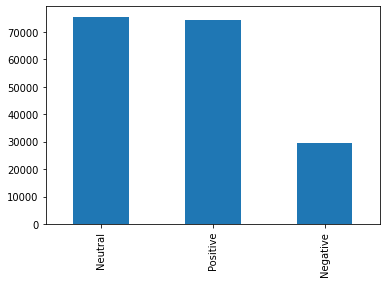

In [38]:
df['sentiment'].value_counts().plot(kind='bar')

<AxesSubplot:xlabel='sentiment', ylabel='count'>

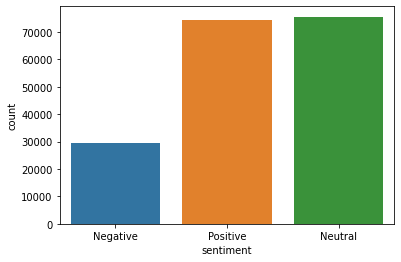

In [39]:
# Plot with seaborn
sns.countplot(df['sentiment'])

In [40]:
positive_tweet = df[df['sentiment'] == 'Positive']['clean_tweet']
neutral_tweet = df[df['sentiment'] == 'Neutral']['clean_tweet']
negative_tweet = df[df['sentiment'] == 'Negative']['clean_tweet']
positive_tweet

1         Hey     and   - wouldn't it have made more sen...
6         How   Will Change Work in General (and recruit...
8         Praying for good health and recovery of   .\n \n 
12        👋🏻    — no one will be safe from   until every...
13        Let's all protect ourselves from  \nIt's real ...
                                ...                        
179096    We were really bummed we couldn’t cop one of t...
179103    Thanks   for nominating me for the     challen...
179104    2020! The year of insanity! Lol!   https://t.c...
179105      A powerful painting by Juan Lucena. It's a t...
179106    More than 1,200 students test positive for   a...
Name: clean_tweet, Length: 74212, dtype: object

In [41]:
# Remove Stopwords and Convert to Tokens
positive_tweet_list = positive_tweet.apply(nfx.remove_stopwords).tolist()
negative_tweet_list = negative_tweet.apply(nfx.remove_stopwords).tolist()
neutral_tweet_list = neutral_tweet.apply(nfx.remove_stopwords).tolist()

In [42]:
positive_tweet_list

['Hey - sense players pay respects A… https://t.co/1QvW0zgyPu',
 'Change Work General (and recruiting, specifically) via/ https://t.co/bjZxzGPMbK',
 'Praying good health recovery .',
 '👋🏻 — safe safe. commit ensure… https://t.co/aWCJo6eKvC',
 "Let's protect real numbers climbing fast Continent. Let's n… https://t.co/byMSfxltrw",
 'Second wave Flanders..back again... https://t.co/9swImZACMN',
 'COVID Update: infection rate Florida following natural curve experts predicted initial cu… https://t.co/hmEwE747WK',
 'Good Patriots! Volunteer Election Judge. Polls open without… https://t.co/qA3mA4zedZ',
 'comprehensive review &amp; Analysis: key ways WASH help reduce transmission… https://t.co/eCsfDmo9b4',
 'crosses 2 lakh mark 1,50,055 ppp recovered far. positive today 6988/total… https://t.co/QdJkpcc7qv',
 "Actor father Mr.G.K.Reddy tested positive 15/20 days back.. 's… https://t.co/V5Lo8NRLWY",
 'safe place visit? guests said, "The hotel meticulous applying hand sanitation als… https://t.co

In [43]:
# Tokenization
for line in positive_tweet_list:
#     print(line)
    for token in line.split():
        print(token)

Hey
-
sense
players
pay
respects
A…
https://t.co/1QvW0zgyPu
Change
Work
General
(and
recruiting,
specifically)
via/
https://t.co/bjZxzGPMbK
Praying
good
health
recovery
.
👋🏻
—
safe
safe.
commit
ensure…
https://t.co/aWCJo6eKvC
Let's
protect
real
numbers
climbing
fast
Continent.
Let's
n…
https://t.co/byMSfxltrw
Second
wave
Flanders..back
again...
https://t.co/9swImZACMN
COVID
Update:
infection
rate
Florida
following
natural
curve
experts
predicted
initial
cu…
https://t.co/hmEwE747WK
Good
Patriots!
Volunteer
Election
Judge.
Polls
open
without…
https://t.co/qA3mA4zedZ
comprehensive
review
&amp;
Analysis:
key
ways
WASH
help
reduce
transmission…
https://t.co/eCsfDmo9b4
crosses
2
lakh
mark
1,50,055
ppp
recovered
far.
positive
today
6988/total…
https://t.co/QdJkpcc7qv
Actor
father
Mr.G.K.Reddy
tested
positive
15/20
days
back..
's…
https://t.co/V5Lo8NRLWY
safe
place
visit?
guests
said,
"The
hotel
meticulous
applying
hand
sanitation
als…
https://t.co/PVCji8s1Eg
CEO
live
WSU
talking
about,
“The
e

-
Burke
High
School
https://t.co/G0mwLt7FtU
Covid-19
stressing
out?
8
ways
sleep
better
https://t.co/jKrwLrlSrW
New
preprint:
Mathematical
modelling
dynamics
containment
COVID-19
Ukraine
https://t.co/mVyxkGxeu1
10
cases
confirmed
https://t.co/twjNgzxNLh
New
preprint:
SARS-CoV-2
serosurvey
Health
Care
Workers
Veneto
Region
https://t.co/ZIzMbHvmqX
story
saying
good
dead
South
Africa.
hard
feel
anguish
left
b…
https://t.co/dpyVhuDFGf
5,144
new
cases
58
new
deaths
India
[13:05
GMT]
Win
Big
Trump
Reduces
Drug
costs
Seniors
benefit
huge
Medicare
people
costs
down…
https://t.co/OjaWD11MCJ
New
preprint:
Sentiment
Informed
Timeseries
Analyzing
AI
(SITALA)
curb
spread
COVID-19
Houston
https://t.co/jUTzJvBKtx
🔔Did
miss
webinar?
share
new
growth
opportunities
connected
the…
https://t.co/HNafOZIKWy
New
preprint:
Concerns,
quality
life,
access
care
productivity
general
population
during…
https://t.co/ILc6qS7uim
ICYMI:
Youssef
Belhaissi,
tv
host
&amp;
union
leader
fired
workers
MED1
TV
sought
better


easy
steps.
Stop
acting
like
3
stooges.
https://t.co/VG8U8xNzmJ
Day
day
worse
claiming
eminent
personalities.
Scared
next?
https://t.co/gVuyGmQrTs
friends
Walter
worse
kind
cancer...he
c…
https://t.co/OqqM7VkDdP
arrange
bed
patient
temple
premises;
important!!
Ahead
Mega
Ram
Temple…
https://t.co/SHrAinKSmZ
Allcure
Lifescience
delivering
rich
quality
Hand
Sanitizers.
details,
contact
contact
leave
your…
https://t.co/5B5RB2kOa4
good
Best
Products
Lowest
price.
looking
for,
solution
vis…
https://t.co/TeHeO0fNQK
Early
elections
rages?
Political
opportunism/cynicism
runs
deep,
midst
global
cri…
https://t.co/r1GcecBnbM
According
official,
responsible
collecting
uploading
daily
provincial
tests
government…
https://t.co/U744o1BI73
Can't
believe
visited
Scotland
skipping
entire
mainland
going
straight
Orkney,
t…
https://t.co/3syZIMBMqw
experience
March
bothered
look
like?
the…
https://t.co/wWwJi0aub1
party
going
!
https://t.co/tAdQhyheTH
man,
like
medical
colleagues,
hero.
https://t.co/DGZg4tO4

better
of…
https://t.co/D9pijViN81
new
opportunity
involved
research
vaccine
https://t.co/SR5arke5qb
faces
possible
fine
taking
photos
fans.
https://t.co/F4A5TCMWGL
Brief,
impact
Girls,
Adolescent
Girls
Young
https://t.co/wWtkjAtLGZ
7.
study
describes
cluster
high
school
Israel,
demonstrating
potential
mass
transmi…
https://t.co/lWGQLRBwF1
2,803
new
cases
reported
taking
total
number
cases
36,314:
State
Health
Department
Day
136
Reported
Cases
15.759
million
Record
High
July
23
-
282.7K
9
Day
rolling
average
241.75…
https://t.co/rlHPI6zjik
125
new
cases
2
new
deaths
Madagascar
[12:25
GMT]
Here's
list
doctors
available
teleconsultation
9am
5
pm
telemedicine
OPD,
Sir
Sun…
https://t.co/GrgPwcEdx9
microscopic
virus
called
world
it’s
knees,
challenging
human
capacity
&amp;
it’s
social
fabri…
https://t.co/SYmahiUUi6
First,
"Conspiracy
theories
necessary
avenue
truth."
Second,
question
Fauci
serv…
https://t.co/QDJka4eoyW
Ba
vision.
life
saver!
..
send
contributions
account
details
below:
BAN…

symp…
https://t.co/lh1Bgapnar
great
thread
expect
https://t.co/hFLrO46U5q
10
worst/useless
gifts
2020:
10.
Year
planner
9.
...
Work
way
up!
https://t.co/XODEb4dUuw
Live
Press
briefing
https://t.co/MB9yPD2Cyf
"A
days
ago,
following
Stars
League
protocol,
tested
positive
test…
https://t.co/AQHvAfmLLZ
"Americans
receive
vaccine
free
"
.....
100
mln?
https://t.co/7hQgMLUsDc
kind
mask
acceptable,
want
wear
3
ply
reports
2,803
fresh
cases
24
hours.
Total
number
cases
state
rises…
https://t.co/dRrdrg7AOO
Paying
civil
servants
stay
home
COVID-19
pandemic
far
cost
Ottaw…
https://t.co/c1k1OVsZ3e
Good
you!
model
superior,
viral
mutation
creates
defective
genomes
allow
virus
replicate
but…
https://t.co/1j9ulo41Rs
NYC
Philly
media
jobs,
major
scandal.
Kurt's
FB
oage
detailed
analysi…
https://t.co/Bn6Urxa0lY
February.
test
week.
Feeling
extended
family
and…
https://t.co/ona6nihnv4
Thankyou
excellent
study
exploring
social
determinants
health
patients.…
https://t.co/YBZmOvKkxW
fucks
much,
cunts
think

women
risk
death
in...
https://t.co/qBaek0qYUS
long
term
consequences
women
workplace
real.
Fortunate
work
in…
https://t.co/EuxJTkxP2H
COVID-19
cases
announced
Cyprus
Friday,
persons
travel
history
contact
confirmed
cases…
https://t.co/yV0PZw35cj
Load,
upload
taking
COVID19
protection
guidelines
issued
WHO.
details
visit…
https://t.co/5tsUjnI6TA
guys
paid
way
consider
oen
pay
cut?…
https://t.co/SlNcr6uxwJ
Madhya
Pradesh
Chief
Minister
Shivraj
Singh
Chouhan
tests
positive
.
danger
that…
https://t.co/Ue56NKrNHd
Diane
Sweet
Not?
https://t.co/Hv7fYIbKVv
Chiefs'
Duvernay-Tardif
first...
https://t.co/fJThFGLRpX
talk
French,
info
gets
lost.
https://t.co/1eytB4oaw9
total
344
confirmed
cases
Funny
"Contactless"
Caption
T-Shirt
https://t.co/qCbony1r1q
previous
saw
huge
rise
patients
what’s
policy
govt
th…
https://t.co/Wz2Rj2UyMc
U.S.
infectious
diseases
expert
Dr.
said
Friday
vaccine
deter…
https://t.co/lGOoOSPWpw
great
efforts
providing
aid
countries
enhance
capabilities
facing
as…
https://t.co

Humanitarians
partners
supporting
government
response…
https://t.co/DInAUiney2
Bangladesh
reports
2,520
new
cases
38
new
deaths
https://t.co/xejenWY5Ju
https://t.co/fIKdkHSau1
Ministry
Finance
extended
special
procurement
procedure
July
31
October
1,202…
https://t.co/8TpBLLjmRG
Frequent
handwashing
🙌
soap
🧼
water
touching
surfaces,
critical
protecting
and…
https://t.co/f74bo8OlW1
said
Mona
Siddiqui
Radio
Sco
Shareen
prog
-
stressing
unique
Scottish
approach
pandemic.
pandemic
sure
follow
tips
loved
one's
heart
strong
healthy!
To…
https://t.co/QAOu9BPBG1
Brilliant
training
morning
thinking
curiosity
children
they…
https://t.co/1CzRq82EKZ
Madhya
Pradesh
CM
Shivraj
Singh
Chouhan
says
tested
positive
Degraded
environments
pollution
likely
encounter
novel
viruses
vulnerable
tho…
https://t.co/uxXEd1v0OF
Exciting
News!
We’re
running
2
day
Grinding
&amp;
Polishing
Training
huge
demand
🎓
Limited
Pl…
https://t.co/51AnObeo0R
Latest
data
ward-wise
cases
Pune.
Kasba-Vishrambagwada
Dhole
Patil
highe

87,325
babies
aborted
-
that's
64,389
deaths
Th…
https://t.co/GRTBV5jjIT
FAA
issues
emergency
AD
2,000
Boeing
737s,
-
300
-
900
variants
bleed
air
check
valves
i…
https://t.co/meKp3CHt6O
55
new
cases
23
new
deaths
Afghanistan
[10:37
GMT]
Health
authorities
reported
659
new
cases
Friday,
bringing
total
infections
country
t…
https://t.co/Eu3WKP4P9E
time
handling
established
proper,…
https://t.co/XkNGV0V5km
.
"the
wealthiest
10%
responsible
half
emissions,
[…].
regulations
forced
1…
https://t.co/ehNZ7JQDZu
National
Memorial
loved
ones
lost
https://t.co/Jq4niAcJRd
UGANDA:
14
new
infections
confirmed
Uganda’s
cases
rise
1,103.
new
cases
include
truck
driv…
https://t.co/anUmQB09wi
Exactly
that's
question?
https://t.co/6BSV88qbu2
challenged
healthcare
systems
world.
unique
pressure
global
pandemic
overwhelm…
https://t.co/2UqJPH9kKA
Tanzania’s
Zanzibar
thanks
support
COVID-19
https://t.co/TXb65Hu3ha
https://t.co/GZA88CQSKy
COVID
19
astonishing
rise
cause
death
2020
https://t.co/lYYpJPgmFn
news

hope
generosity
Australians,"
says
Join
pledging
solidar…
https://t.co/zvQJmQkU34
Bureau
Corrections
spokesperson
Gabriel
Chaclag
refutes
reports
high
profile
inmate
Raymond
Domi…
https://t.co/gkQ9dW6sau
‘I
Miss
You’
hearts
available
Send
smile
hug
haven’t
seen
f…
https://t.co/AkIljrSPyy
TRACK
!!
Happy
proud
share
new
hit🔥❤
Check
https://t.co/50vOIz3O1p
https://t.co/uiXEbVXOXX
Cabinet
Secretary
reviews
management
9
States
high
active
caseload
Advises
Telangana,
An…
https://t.co/Ywa8I9mAM8
Hatutachoka
kukukumbusha
ukeep
safe,
wear
mask
properly,
maintain
social
distance.
Frequently
w…
https://t.co/xjivPuBHcx
1.5
crore
samples
tested
far:
https://t.co/6mNH8lcksR
v…
https://t.co/EWcKGngeJA
'It
feels
like
over':
Psychology
prof
explains
rise
COVID-19
young
people
|
|
https://t.co/peSMeDNmxY
Yes!
again,
tonight
everyone,
join
8
till
9pm
love
LR…
https://t.co/eaNlap71Yo
Philippine
foreign
service
posts
today
reported
31
new
confirmed
cases
Americas,
Asia
P…
https://t.co/Y2xKsrJ7sf
Follow
mor

Medical
appliance
business
completely
dominated
Chinese
cos.
Fogging
machines
Pulse
oximeter,
thermomete…
https://t.co/ZUeNBETOHL
sold
thanks
buyer
Check
in:
https://t.co/tEuab6lYnL…
https://t.co/fcbSKQHwK8
$BNTX
Bullish
hammer
candlestick
near
85.00
https://t.co/7rqYmtIlTm
start
making
masks,
addictive..anyone
got
loads
stock
supplies
cut
ready
ke…
https://t.co/5miiWvprWo
kind
world
live
people
don’t
care
safety
them.
https://t.co/WyYCXoPo2A
CANTU
Hydrating
Cream
Conditioner.
3,000
naira.
-
Helps
hair
retain
natural
oils.
-
Reveals
healthier,
hydrated…
https://t.co/52obRlizXg
UPDATE:
13
Presidential
communications
office
personnel
positive
Andanar
https://t.co/v1lVB6s2Mw
hardest
pandemics
social
behavior
change
risk
virus
humans
behavior
Remember
country
joke
swear;
government
assist
you,
hustle
money
busines…
https://t.co/xZaqqZBqiV
https://t.co/O7YXjzF1b4
COVID-19
cases
India
cross
13
lakh
nearly
49,000
new
cases
recorded
'A
quiet
day
fantastic
day':
Meet
detectives:
Inside
HSE’s
co

pandemic
keeps
pummeling
global
air
industry,
China
Eastern
Airlines
set
new
branch
Xia…
https://t.co/MW2pwdyE6o
UPDATE:
PCOO
employees
test
positive
total
13.
|
Superb
work
Co.
Nijmegen
entire
team!
look
in…
https://t.co/UrswZkcSDT
rollercoaster
ride
deliver
exciting
new
service,
teamwork
amazing
within…
https://t.co/YTf0tlJbJE
tested
positive
𝐊𝐚𝐫𝐦𝐚
𝐡𝐚𝐬
𝐧𝐨
𝐦𝐞𝐧𝐮.
𝐘𝐨𝐮
𝐠𝐞𝐭
𝐬𝐞𝐭
𝐬𝐞𝐫𝐯𝐞𝐝
𝐰𝐡𝐚𝐭
𝐲𝐨𝐮
𝐝𝐞𝐬𝐞𝐫𝐯𝐞…
https://t.co/QZUXcmevjS
🇵🇭
confirms
78,412
total
confirmed
cases
(
late
fresh
cases)
nationwide,
25,752
total
recoveries
and…
https://t.co/ZPYSKStrNm
BREAKING:
DOH
counts
2,000
cases
3rd
straight
day
https://t.co/TpxmIHLIlJ
liberals
speak
It’s
true
Democrats
House
Senate
help
pass…
https://t.co/krvBpyZEZo
Reminder:
applications
Round
1
£191m
Sustainable
Innovation
Fund
supporting
recovery
closes
one…
https://t.co/pPXMjYcICG
documentary
“my
75
days
lockdown
journey
“
inspiring
story.…
https://t.co/2fXgBEUvub
Oh
no!
RELIGIOUS
concert!!
dang
people
right
religion.
Meanwhile,
Fauci
sits
in…
htt

significant
extension
time
horizon
fiscal
policy”,
says
Heikki
Oksane…
https://t.co/tDVv4aE27Z
PTI_News:
139
new
cases
tally
2,654,
active
cases
1,055;
toll
rises
38
3
deat…
https://t.co/P3pQKsPm7P
Pure
Computer
generated
....hands
maya
https://t.co/rdBvEdbt4Q
PTI_News:
Madhya
Pradesh
CM
Shivraj
Singh
Chouhan
says
tested
positive
PTI_News:
CM
Uddhav
Thackeray
says
favour
complete
lifting
Maharashtra,
says
there…
https://t.co/bKAC8rxRxU
offer
self-paced
COVID-19
contact
tracing
course
absolutely
FREE.
opportunit…
https://t.co/5diTXkKgpV
Funny
cretins
masks
started
piping
now,
they've
mute
months
streets
f*…
https://t.co/k05IgOmm8q
willing
risk
health
child
forcing
other…
https://t.co/QoLmUIvxSp
Life
perfect
good
opportunity
use
it.
Yes!!!
That's
it!
infact
are…
https://t.co/OKQVWVu4TD
patriotism!
Fighting
constitutional
rights
protest.
I'm
proud
veterans,
moms,
young
ad…
https://t.co/WzUxvr0lBB
Feeling
traumatised
normal
response
abnormal
situation.
employees
manage
trauma
associat…
htt

extremely
underground
artist
semi-professional
sound,
check
music
:)…
https://t.co/LD1I9Na0u6
BULL$H*T
COIN$
worth
Jack!
Nuclear
Exchange
PC's
ERASED!
(Hell
Biological
one…
https://t.co/y0B5DACgl8
Requirements
RE-ENTER
HOME.
READY
$$$
APPLY
EXEMPTION
https://t.co/o1d2wzKkXE
Hot
stuff,
can't
enough.
https://t.co/I6Bqo0cQmp
9/11
governed
crisis
worldwide.…
https://t.co/G4TpwSnbJb
➖➖➖➖➖➖➖➖➖➖➖
➕
17,459
New
Cases,
➕
990
New
Deaths,
➖➖➖➖➖➖➖➖➖➖➖
➡️
15,948,904
Cases,
➡️
642,875
Dea…
https://t.co/2t5ACtwYT3
think
watching
crawls
back.
Nightclubs
o…
https://t.co/TmlhnqJZ4k
normal
30
years
ago.
women
NI
contributions.
https://t.co/ZbQ0RfB2WT
It’s
funny
break
social
distancing
rules
way
another,
people
shit
it.
New
COVID-19
Data
2020-07-25
03:31:01
EDT
https://t.co/6kpHl1e6Aw
positive
time
areas
life
begin
re-open
-
https://t.co/YYSrtBr9HN
https://t.co/aiOxedRGZi
MP
Chief
Minister
Shivraj
Singh
Chouhan
tests
COVID-19
positive
Madhya
Pradesh
Chie…
https://t.co/krts6yWq0D
Public
Health
Emergency
Ope

https://t.co/CWnx6WSaG1
139
new
cases
reported
Puducherry
today
till
10am,
taking
total
number
cases
Union
Territ…
https://t.co/Kk6erkIRex
1,320
new
positive
cases
reported
Odisha,
taking
total
number
cases
24,013
includin…
https://t.co/Ppf1XX9EmE
Total
positive
cases
Maharashtra
Police
stand
8,232
including
1,825
active
cases,
6,314
recoveries
a…
https://t.co/gcRPTVL8Ql
557
new
positive
cases
6
deaths
reported
Rajasthan
till
10.30
today.
total
number
cases
i…
https://t.co/kyCyMDZFQu
Life!
"Covid19"
Social
Strife!
vid
YouTube
https://t.co/IoUilfaVTk
report
District,
July
24:
Block/ULB
wise
break-up
,47+ve
cases:
CMC-35
Nischintakoili-1
Dam…
https://t.co/3f1ipMU6GN
7
months
virus
emerged
closer
finding
preventative
medi…
https://t.co/EgZCQEemXH
Thailand
records
3
new
COVID-19
cases
state
quarantine
Saturday
https://t.co/qzS6QzDSCu
Happiness
journey
https://t.co/bxrGxUDUWF
Let's
breath
heavily
sweat
close
lot
people
gym
avoid
catching
Sounds…
https://t.co/01pgvCbdWo
Chief
Minister
tests


protect
COVID
don’t
risk
w…
https://t.co/5PyxszkBwD
reports
1,320
fresh
cases
24
hours.
Total
number
cases
state
rises…
https://t.co/ux5lkXwwez
we're
extremely
well,
better
expected
doom
gloom
media…
https://t.co/LSpUABTmE6
Mexico
reports
7,573
new
cases
737
new
deaths
https://t.co/ntLdm0bYd3
https://t.co/P9vI6dEe75
&amp;
start
exploring
potentials
fruit
trade
mutually
beneficial.
count…
https://t.co/eRQT4O1TS7
4,248,492
cases
148,492
deaths
reported
United
States
date.
165
new
cases
2
new…
https://t.co/zRGcZjnY37
:
candidates
final
trials
'good
results'
https://t.co/X2cbkNH92V
Love
tell
faces
70k+
families
directly
affected
b…
https://t.co/GzBpncJ6dK
Afghan
women
campaign
right
reveal
name.
'Rabia'
returned
home,
pain
fever…
https://t.co/ZnAw21bidA
open
today
8am
til
2pm.
dentist
Dr
Stewart
Beggs
alongside
talented
hygienist
Brooke.…
https://t.co/VKqpbSCn5K
LIVE
|
Odisha's
tally
crosses
24,000
mark
1,320
new
cases
Catch
LIVE
updates
her…
https://t.co/XmxWBDUWbR
Ireland
Confirmed
Cases

includes
self-love.
care
yourself,
body,
mind…
https://t.co/o6tXvVrIzU
indoors
join
&amp;
redistribute
unpaid
care
&amp;
domestic
workloa…
https://t.co/0gGb7N8aKr
Machiavelli
it,
Paraguayan
President
Mario
Abdo
Benitez
managed
situation
great
deal
of…
https://t.co/VabVWLZAza
Special
vote
thanks
dedicated
hardworking
clinical
staff
Ms.
Aarti
Bagadia.
Patient
satisfaction
a…
https://t.co/MmEtvufAXO
Nature
wants
feel
like
person
heart.
ask
day,
“Did
hurt
anyon…
https://t.co/FDExVXFpRt
health
ministry
said
Saturday
morning
757
new
deaths
fresh
48,916
positiv…
https://t.co/mipBXln8zi
supporting
kids
teens
friends
at…
https://t.co/qpK9ZRI6vO
4
Die
J&amp;K
Toll
302
https://t.co/2qVlZcC2P9
Access
free
e-Learning
programme
Developed
Su…
https://t.co/RWb7YrWkV7
GOOD
NEWS:
SABC
notified
IPO
open
proposals
solutions
affected
productions
case…
https://t.co/4hIBovWFXP
looking
hire
100
contact
tracers.
hiring?
https://t.co/5ECpApf3So
age,
powerful
tool
raise
Rice
producers
c…
https://t.co/8BPN70U26g


total
shut…
https://t.co/a44KLyquEz
|
28
new
positive
cases
reported
district,
18
local
cases
Details
👇
https://t.co/dcqnn8GYBv
Today's
total
positive
till
10.30
557
(Death
reported-
6)
Alwar
313
Hanumagarh
4
Banswa…
https://t.co/EZhqYFvU2f
12,733
Samples
Tested
July
24.
1320
positive
cases.
Covid
Positive
Rate
declines
10.37%…
https://t.co/Ew58okG1DS
super
rich
guy
understanding
societal
problems
white
guy
brought
https://t.co/zXZGWbAfIy
Younger
children
don’t
appear
transmit
COVID-19
easily,
experts
|
|
|
https://t.co/zM3FPsnsiq
Younger
children
don’t
appear
transmit
COVID-19
easily,
experts
|
|
|
https://t.co/Peg0Zeyn2n
latest
MightyDutchMan®-Times!
https://t.co/74KMQJiC1h
Thanks
Ondo
records
29
new
cases.
New
COVID-19
Data
2020-07-25
01:30:01
EDT
https://t.co/sWwwZXP2ok
20
countries.
Data
Johns
Hopkins.
model
perfect,
careful
numbers.
https://t.co/GGmcC6cXhY
Today's
total
positive
till
10.30
557
(Death
reported-
6)
Alwar
313
Hanumagarh
4
Banswa…
https://t.co/pJL96DfXxG
crisis
accel

friends,
reach
regularly
those…
https://t.co/ZBzL1lywPn
New
COVID-19
Data
2020-07-25
01:00:02
EDT
https://t.co/5ct2s5ZyGe
latest
Op-Ed
Executive
Director,
explains
research
provides
bricks
an…
https://t.co/uxVezpPtjO
transforming
education?
noteworthy
panelists
Live
Symposium
discuss
Tr…
https://t.co/6DlVe45PS4
university
10
confirmed
cases
COVID
orientation
&amp;
want
open
fall.
🙃🙃
Recheck
reshare!
Beware
sure
recheck
verify
news
passing
or…
https://t.co/mgWyCc00Ow
speculation
provincial
election
intensifies,
B.C.'s
doctor
says
looking
ways
safely
ho…
https://t.co/yCl2vt6vhY
CoronaVirus
Latest
Updates
Andhra
Pradesh,
Telangana
India
10:30
25th
July
2020.…
https://t.co/jZGDdDk6uk
High
tracking
testing
rates
helped
Bahrain
global
lead
fight
Covid-19,
r…
https://t.co/OzlcHl44ia
safe
save
lives.
,
,
https://t.co/Rc0aNliAtI
symbol
truck
looks
like
god
death.
https://t.co/EodBMuPvrW
ever,
let's
practice
wisdom.
Let's
send
love.
Let's
compassion
community,
neighbors,…
https://t.co/iwyL4acEoa

24
hours
Quarantine:
887
Local
Contacts:
433
(I&amp;PR
Dept)
India's
cases
soar
13,36,861
48,916
fresh
infections,
757
fatalities
push
death
toll
31,358:…
https://t.co/A6zszCbJ3E
Narcissists
psychopaths
likely
refuse
wear
masks
https://t.co/dlmEMznNy6
surprised
that.
😷
State-wise
details
Total
Confirmed
cases
(till
25
July,
2020,
8
AM)
https://t.co/38SICvLc5e
Thailand
situation,
25
July
2020,
11:30
A.M.
-
Total
confirmed:
3,282
(+3,
Sudan
1
USA
2)
-
Recovered:
3,109(+…
https://t.co/4N8zRa5JmU
Coming
11:
Fighting
technology.
break
intetesting,
creative
gadgets
agenc…
https://t.co/QSrndzqqjA
Home
Decoration
wholesalers
provide
material
competitive
rates.for
query
related
plywoo…
https://t.co/TZDEb8epj8
news:
Coronavirus
(COVID-19)
Update:
FDA
Authorizes
Diagnostic
Test
Screening
People
...…
https://t.co/uZ4U1QyZnS
news:
LA
County
reports
1900
coronavirus
cases
44
additional
deaths
https://t.co/KHDjd8ofoi
news:
Corpus
Christi,
coronavirus
hot
spot,
braces
Tropical
Storm
Hanna…
https://t.c

positive
cases
&amp;
757
deaths
India
24
hours.
Total
positive
cas…
https://t.co/1Ek0AL1xXk
Single-day
spike
48,916
positive
cases
&amp;
757
deaths
India
24
hours.
Total
positive
case…
https://t.co/CA69FzQaBE
Thousands
LSIs
gather
Manila
prior
trips
home.
Read
more:
https://t.co/S8lZ9jMJgz
https://t.co/erCsHy8nfZ
Single-day
spike
48,916
positive
cases
&amp;
757
deaths
India
24
hours.
Total
positive
cas…
https://t.co/KpHPygoBTt
India
reports
48,916
new
cases
757
new
deaths.
Total
1.3
million
cases
31,358
deaths.…
https://t.co/j5eakmcSF6
Wuzup?
come
grand
new
way
shit,
society,
implementing
equity?
saw…
https://t.co/N8niAAgEqF
Single-day
spike
48,916
positive
cases
&amp;
757
deaths
India
24
hours.
Total
positive
cas…
https://t.co/LXfpTijADw
Single-day
spike
48,916
positive
cases
&amp;
757
deaths
reported
India
24
hours.
Total…
https://t.co/MbkY3SxnxT
Single-day
spike
48,916
positive
cases
&amp;
757
deaths
24
hours.
Total
po…
https://t.co/Fk8L3WFdhe
Single-day
spike
48,916
positive
cases


“His
favorite
thing
find
slowest
people
Spartan
cour…
https://t.co/bvPUReeMjB
July
24
status
update
includes:
🎥
-
video
update
stay
healthy
😷
–
Face
Covering
&amp;
Mask
F…
https://t.co/PruTY7OexE
Rajasthan
Political
Crisis:
Action
shifts
SC,
Gehlot
parades
MLAs
for…
https://t.co/VOpLT8PSsy
clear
released
biological…
https://t.co/py87rixuqJ
Tom
Frieden
director
CDC.
entire
thread
worth
reading
&amp;
agree
w
last…
https://t.co/vIv9DQlfET
stay
safe.
stay
home
https://t.co/bXUnHw8asG
country’s
response
fulfilling
promise
jobs.
s…
https://t.co/cw7BH84rlw
face
covering
thing
isn’t
bad.
makes
eyes
super
important,
&amp;
adds
little
sexy
mystery.
https://t.co/NoDHul6jlm
63
new
cases
2
new
deaths
Haiti
[4:30
GMT]
cases
rise
LA
city
remains
open
here's
tips
safe
road
whethe…
https://t.co/CJd7uDaPMo
called
learning.
knowledge
responsibility
comes
learning.
new
facts…
https://t.co/BdmxQvKVH1
Super
Mario
90s
safe
travelling
Pandemic!
Defeat
COVID-19
lik…
https://t.co/GMb1blo8SA
New
testing
site
add

r…
https://t.co/bmEpkl0kLG
Ohhhhh
strange
creature.
refused
right
attend
church,…
https://t.co/sisUDWpxqK
Senate
primary
Tennessee
pits
Trump’s
candidate
conservative
insurgency
https://t.co/qjT6j6mLxy
👈
cl…
https://t.co/899wLpt6Wj
Remember
connected
😎
glad
se…
https://t.co/Gwrt21dYkd
wondered
happen
face
major
domestic
international
incident
-…
https://t.co/S2V1FBeaFZ
right.
infected
1,040,004
Albertans.
Masks
help
one.
Frontline
curbing
spread
Kindly
CRS
Bishop
House.
ACK.
Impressive.
👍
"Why
Europe
successfully
emerge
epidemic
America
struggles
eve…
https://t.co/sOmmOJWhKK
mean
pointy
hats
good
water
cups
PM
Narendra
Modi
inaugurate
3
new
high
throughput
labs
July
27
https://t.co/cMqMRgBz0B
https://t.co/gcBM8gA6KJ
thanks
showing
lives
numbers.
wonderful
people
lost.…
https://t.co/ScN1o5b6pe
golfs
wasting
taxpayer's
money
I'm
sure
https://t.co/kC2TY8LJCB
lockdowns
dictating
lives
weighing
minds,
great
time
check
ou…
https://t.co/i7a3IeFtxq
Oh
great....our
county
added
list
'hot
spots'

pretend!
;)
Jose
Cuervo
Pin
https://t.co/vMfujhVK8f
..
https://t.co/B0TeENbapA
prepares
welcome
thousands
amid
pandemic,
University
Museum
events
hold
as…
https://t.co/2w6G1q2ACT
developed
Self-Checker.
online
guide
helps
individuals
decisions
seek
appro…
https://t.co/9Sgb1ThysV
States,
districts,
schools
improve
coherence
clarity
messages
provid…
https://t.co/bc8MyazB4c
new
cases
Interior
officials
report
27
new
cases
today,
new
outbreak
Haida…
https://t.co/SYBW7JGhZf
'
|
24
hours,
20
patients
died
suspected
hospitals
coun…
https://t.co/5yLaJxJtUa
Today's
big
accomplishment:
met
new
socially
distanced
beer
laugh.
small
i…
https://t.co/gG5yKCKBh8
Wow!
🐕🦮🐕‍🦺Diagnoses
dog
noses
–
Dogs
sniff
patients
COVID-19
https://t.co/xobOfytiAz
Best
...I’m
reliving
youth.
Falling
aleep
listening
Mike
Shannon
tell
baseball.
Completely
true.
/
media
assisted.
testing.…
https://t.co/oiDDt5wWmp
couldn’t
resist
$1
1
wing
&amp;
3
fries
deal!!!
😂
Follow
recipes
🍟🍗🍻🍻🍻🍻
https://t.co/P9HMN6aZMn
cases
grew
145


things
March.
Nice
backpa…
https://t.co/CMIUzVlDxe
weekend’s
highlight
fridge
audit.
Exciting
times
https://t.co/Vuf0Rp8mFe
Watching
strikes
we’ve
prioritized
testing
professional
athlete…
https://t.co/zy9AgZGaEl
stock
market
took
downturn
response
COVID-19.
Let’s
review
important
terms.
https://t.co/6rNemdH4NK
Etsy
business,
idea
hurts.
Amazingly
people
(mostly)
understanding.
will…
https://t.co/4wT258j0PR
Covid-19
attack
blood
cells,
important
sure
body
produce
new
ones
efficient…
https://t.co/w9s6PDeSMt
Arizona
figured
stop
rising
cases
lockdown.
How?
Mandate
masks
close
bars,…
https://t.co/FpKwCWmdP3
⁦Congratulations
Dr.
Mitchell
Fox
(in
middle),
stop
great
PGY-4
rotation
⁦
https://t.co/1YozYaIpKb
gets
lively
Microsoft
Paint.
this?!
https://t.co/3gYX6y6UWp
Andanar:
office
disinfection
continue
carried
New
Executive…
https://t.co/qD01TT8Qz2
happy
errands
today
gas
up,
etc.
3
stores
visited
western…
https://t.co/Hdnc8M7QSu
sobering
reminder
vulnerability
elderly
patients
pandemic.
Gr

Arizona
second
highest
Arkansas,…
https://t.co/rjlmFMHcFt
Disease
detectives
country
working
overtime,
trace
movements
positive
cases.
If…
https://t.co/2j6cfJzURa
Hanoi
suggested
build
new
airport
boost
economic
linkages
https://t.co/ywD7w6GnXw
Tamilnadu,
KARNATAKA
AndhraPradesh
new
point
concern
India
https://t.co/ZDQILiS76X
Learn
impacted
pandemic
latest
data
report,
now…
https://t.co/i29g8qEGdD
Straight
Cash
Money
https://t.co/luNOJKtUjJ
Holyoke,
Worcester.
live
need
east
tests.
https://t.co/zF7ihQg54W
Masks
simple,
effective
way
slow
spread
&amp;
fellow
Hoosiers
safe.
Hoosiers
always…
https://t.co/Zjz6bqw9OI
stats
Fri.
July
24,
2020
Deaths
191(+1)
Confirmed
3419(+27)
Active
294(-10)
Hospitalized
12(-4)
ICU…
https://t.co/DhMQF9J2wn
winning
worst
countries
rampaging
Particularly
light
wor…
https://t.co/xqk2OBieH3
early
March
unintended
thought
looked
pretty…
https://t.co/4EDSRmTcsz
unique
way
great
-
1.
stop
testing;
2.
Label
Covid
patients
category.…
https://t.co/OyOlX9yGIT
REAL
rea

also.…
https://t.co/bPu6e97U1A
absolute
cowardice
wanting
cut
hours
workers
risking
li…
https://t.co/nLDqAsSOdB
entrepreneurs
area
cool
things
biz
live
year's
reinvented
global
competition
fun,
healthy
and,
cases,
wi…
https://t.co/rMrIUtEohl
Significant
improvement
number
recoveries
Covid-19
Pakistan
https://t.co/UVeCT2xydB
Tampa
General
Hospital.
strength,
unity,
courage
looks
like.
proud
COVID
unit
rockstars…
https://t.co/FzdGFia9QN
sure
sign
autism
referring
reminds
me...
removed
video
making
fun
5G
/
conspiracy
theorists.
clearly
st…
https://t.co/gxyKd6QRKI
Update
grandmother’s
nursing
home:
51
total
residents
29
residents
positive
18
staff
members
a…
https://t.co/FZSX2K9p7C
Coronavirus
Seriously,
Olympic
Rowers
Got
-
New
York
Times
https://t.co/TDZhETLjot
posted
01/01/2020
"Britains
Death
Knell"
https://t.co/gEqBbgfqhC
https://t.co/RpfXyamdRN
need
stop
making
daily
release
sound
like
Tattslotto
draw
announced
government
super…
https://t.co/9l50Am9eYC
Tell
favorite
blood
hands
send

U
Daily!
https://t.co/1FWSTJr9th
Thanks
Texas
reports
287
new
cases
2
new
deaths
bringing
total
confirmed
cases
385,324
4,904
total
deaths…
https://t.co/mfe05lIoAA
says
narcissists
&amp;
psychopaths
likely
refuse
Narcissists
&amp;
psychopaths
are…
https://t.co/9KeNysFOY0
"
teaching
things,
know
standout
lesson
future...."
Find
t…
https://t.co/q7QOlGXmAo
time
message:
"If
don’t
live
you,
distance"
https://t.co/08mz5nhvwb
r
families
kids
lost
parents
COVID.
them.
USA/UAE/India/Italy.
fam…
https://t.co/LqwuvHm5dv
Eyeglasses
fog
up?
what.
deal
adapt.
Stay
healthy
healthy.
https://t.co/x6S7fhC51d
Umm,
different
again?
I’m
sure
didn’t
hear
correctly...
https://t.co/XTRDkXwR6e
3
New
Cases
Coronavirus
Confirmed
Whitman
County
-
total
76:
https://t.co/zzg26KoStv
https://t.co/2Uh6VPCmBu
“Carers
good
expertise...they
standing
capacity
manage
[
evidence
suggests…
https://t.co/xOao5SqZJ7
HEALTH
UPDATE
|
note
new
advice
NSW
Health
visiting
health
facilities.
https://t.co/HDKdEs2NZN
serve
customers
r

launch
new
Task
Force
Prompt
Payment
Practices
Subcontractors
&amp;
Supplier…
https://t.co/TCVPNOEWAu
Dear
Planet
Earth
85
half
population
California?
sincerely
Observer
one-month
old…
https://t.co/3ejsIKBizE
involved
running
death
warehouses
given
fair
trial
strung
up.
https://t.co/oxrKNgzDev
Drive-thru
ordering
plenty
outdoor
seating.
Pretty
busy
-
good
example
local
businesses
adapting
to…
https://t.co/Qh7C1Idwz4
Immediate
way
...
Best
method
apply
Defeating
https://t.co/7g0BRYPXKi
Zero
positive
cases
latest
round
testing.
https://t.co/oHEQbjpjUz
Himachal
Pradesh
reports
21
new
cases
today,
taking
total
number
cases
2,072
including
869
activ…
https://t.co/52nzHez3GI
thing
deniers,
conspiracy
people
Karens.
Read
connected
link
se…
https://t.co/ST2mVyIteB
131
new
cases
tally
2,787,
active
cases
1,102;
toll
rises
40
2
deaths:
Health
official
agree,
(
governments)
clear,
firm,
early
figures
(
cases)…
https://t.co/iVlXTRiZMG
Highest
recoveries
registered
single
day;
36,000
patients
disch

Quarantine.
2
main
weapons.
Surprise
fear
cheap
flight…
https://t.co/Qbk6ZdeUlh
charity,
rely
everyone's
support,
aspects
business
rely
able
welcome
visitors…
https://t.co/P9ysl6I07I
time
reported
50000
new
cases
single
day
25th
July
we're
million
new
cases
4
days
worldwide...
"To
brutally
honest,
beginning
outbreak,
thought
[
virus
probably
nothing…
https://t.co/CLUMZISpWd
Catalonia
Aragon
Galicia
possibly
Madrid
showing
marked
rises
rise
Catalonia
linked…
https://t.co/hjsG1621tW
710
new
cases
7
new
deaths
Israel
[9:54
GMT]
lift
Father
high
worship!
amid
|
greater
risk
Covid
illness
death.
Prime
Minister…
https://t.co/AIgALpnGhV
need
play
strongly
defeat
spread
said
https://t.co/1p9QpVO5zh
“Corona
destroyed
dreams
future
unexpected
way."
Heartbreaking
important
https://t.co/OLPgU6G0cW
good
squash
lies
fake
news
https://t.co/Z3uWh2QBmB
|
phase
I,
vaccine
tested
healthy
375
volunteers
co-morbid
conditions
aged
betw…
https://t.co/C9r472KRcx
like
,
calm
person
love
u
ooo
🤷‍♂️🤷‍♂️🤷‍♂️
Hope

Science’
I’ve
read
conflicting
‘science’
shake
stick
at.
go…
https://t.co/NKiMQdWQGR
day
work
today
find
contemplation
mood.
Looking
life
far.
Evaluating
child…
https://t.co/AQEJglghKL
:
Tokyo
confirms
239
new
cases
Sunday
,
bringing
total
capital
11,214.
https://t.co/0CYZvWMwDH
321
new
cases
5
new
deaths
Armenia
[9:16
GMT]
switched
disliked
way
Went
local
pub
night.
stayed
inside
adhered
social
distancing.
Beer
garden?
Packe…
https://t.co/vgt1D1QJOP
Spread
Joy
....Not
Germs
😷
IN:
today
reports
36
new
cases
Filipinos
Asia
Pacific
European
regions
no…
https://t.co/aGNMbhZaFO
Honoured
host
livestream
Q&amp;A
partners
➡️
Ask
questions
live
t…
https://t.co/f41UYJfmYx
"We
enforcing
law
people
aren’t
acting
responsibly"
https://t.co/Wksmxlccns
friends
family
social
distancing?
moment
explain
important
somebody
close
to…
https://t.co/Z9MKYwg3i4
Wish
soon.
tested
positive
w…
https://t.co/GtUZGJMly6
lot
responses
latest
webinar
'Applying
Travel
Ban
Exemption'.
missed
it,
se…
https://t.co/LcjIff

https://t.co/Y1eth11v8n
problems
infection
prevention
methods
Central
Asia
social
distancing…
https://t.co/ylwyRGpZvJ
useful
reminder
way.
bear
mind
assessment
the…
https://t.co/v31gPIxo7C
yesterday
recorded
highest
number
positive
cases
single
day
(472)
bringin…
https://t.co/8p7WHgGLki
High
temperature
symptoms,
associated
Regular
temperature
checks
very…
https://t.co/XdwKUYqRv7
Important
information
travellers
returning
(England,
Northern
Ireland,
Scotland
Wale…
https://t.co/AmF2278NVI
[JUST
IN]
MOH
confirmed
481
new
cases
Covid-19
Singapore,
12pm
July
26.
5
community
c…
https://t.co/fZYn7faahu
Himachal
Pradesh
reports
21
new
cases
today,
taking
total
number
cases
2,072
including
869
activ…
https://t.co/iMKUwtAEOH
5,765
new
cases
77
new
deaths
Russia
[8:43
GMT]
Mountains
north.⛰
Islands
south.
🏝
Sunday
lockdown
ways,
stay
safe
🙏🏻
@
Jo…
https://t.co/n8CQZJpusA
Himachal
Pradesh
reports
21
new
cases
today,
taking
total
number
cases
2,072
including
869
activ…
https://t.co/OSUJCFN4Tq
seco

6
655
https://t.co/74DDqxXoHB
https://t.co/90zR0jIshv
⚰️
Seven
States
outrank
countries
global
Top-10
deaths
million
ppl
1.
New
Jersey
1785
2.
New…
https://t.co/R4fTuwRGJH
🇮🇶
Iraq
registered
daily
new
record
high
number
cases
entered
worldwide
Top-10
first…
https://t.co/QHMIPQjRcY
312
new
deaths
bring
total
6
655
https://t.co/2QkZj6zeK4
https://t.co/Byrd04d5Wl
Top-10
daily
new
cases
country
Jul
25
1.
USA
+67
413
(1)
2.
India
+48
472
(3)
3.
Brazil
+48
234
(2…
https://t.co/EQdBz8W4TY
Gauhati
High
Court
seeks
know
Assam
Govt
number
Covid-19
positive
cases
detected
of…
https://t.co/dt8i7G1Le4
312
new
deaths
bring
total
6
655
https://t.co/72L1qHf0nT
https://t.co/oWNOGgtzAf
312
new
deaths
bring
total
6
655
https://t.co/RB5f1V0v2H
https://t.co/kNmuOrykOt
312
new
deaths
bring
total
6
655
https://t.co/977KBx9m7O
https://t.co/MlJPEYzwIP
312
new
deaths
bring
total
6
655
https://t.co/naHVkPmppW
https://t.co/WATNSx2buH
312
new
deaths
bring
total
6
655
https://t.co/HY6EbMw7bf
https://t.co/1BvGTzlbra

thought
fun
enough,
toys
home.
https://t.co/UR6dawN8Vk
Latest
data
confirmed
cases
06:00
GMT,
July
26:
World:
16,048,100
US:
4,178,027
Brazil:
2,394,5…
https://t.co/Qnw9yLwl6o
SA
records
12k
new
cases,another
minister
tests
positive
https://t.co/92cZkJGf96
reported
10
deaths
24
hours,
taking
number
fatalities
state
140,…
https://t.co/MPW8pG2rdC
Trump's
tired
needs
rest.
takes
lot
energy
kill
citizens
pandemic…
https://t.co/IkIVMTjawa
Tamil
Nadu:
Streets
Chennai
wear
deserted
look
state
observes
complete
lockdown
Sunday;
visuals
from…
https://t.co/hcLhIcN7kP
https://t.co/TRDXpm5x8z
Pretty
simply
-
holiday
isn’t
‘essential
international
travel’!
middle
o…
https://t.co/egOrSk3kle
Uttarakhand:
Streets
deserted
shops
closed
following
detection
15
new
positive
cases
Dharchu…
https://t.co/cr9cIWb4id
health
care
system
improvement
the…
https://t.co/f9rX6dcHxa
6,000
tenants
face
eviction
nonpayment
rent
new
figures
https://t.co/9Jjdth1az7
latest
Great
Investments
Programme
Daily
Newsletter
Alpe

AIDS,
began
infecting
humans
virus
movie
released
to…
https://t.co/HBp5BYjTub
|
10
new
cases
detected
district
today,
5
local
contact
(Details
👇)
https://t.co/alWGawCZnT
Chinese
health
authority
said
received
reports
46
newly
confirmed
COVID-19
cases
Chinese
mainland
F…
https://t.co/RnGvIyQgNz
Hey
ya'll
icus
full.
wanna...
oh
mind.
hospice.
need
Personal
Premium
LinkedIn
account
real
qualified
leads!
https://t.co/xtmYylWE2h
Latest
data
confirmed
cases
06:00
GMT,
July
26:
World:
16,048,100
US:
4,178,027
Brazil:
2,394,513…
https://t.co/J4PZFfwPxR
WONDERFUL
Rajneeti
Karne
Nahi,
Badalne
aaye
Hai!!
Modi
Govt
prepare
plan
states
Follow…
https://t.co/HpUhK9fUkM
eleventh
hour,
Republican
Governors
bandwagon
masks
social
distancing
prevent
th…
https://t.co/paxb8CTJA8
CNN
chart
clearly
demonstrates
exponential
growth
potential
United
States.
fin…
https://t.co/159gT2PQUA
Today's
Report
New
Positive
Cases:
1376
Quarantine:
917
Local
Contacts:
459
new
study
published
stated
over-emphasis
sole
focus

prolonged
contact
somebody
tes…
https://t.co/va7Nw9Egqv
Good
morning
Maldives
...
good
Sunday
...
Remember
precautions
...
Wear
mask
about…
https://t.co/d3jw7U5ZYy
—
Middle
East
need
investment,
hydrocarbons
renewable
Read…
https://t.co/WzZHbxnp6B
Read
today's
edition
Peninsula
Sport
(June
26)
latest
updates
https://t.co/qWBCpmTtoM
Coronavirus
covered
Health
Insurance
Policies.
Reach
info
9845684754
https://t.co/UGiubrZbN0
detects
1,376
new
positive
cases,
taking
total
number
cases
25,389
including
15,928
reco…
https://t.co/2ZxECuX2VS
social
distancing
Apparently
touch
them.
https://t.co/8BnoxvVmjO
minibus
drivers
register
free
tests
Monday
https://t.co/fpbFTGEr0i
I’m
willing
bet
CDC
created
mess
flu
shot,
makes
sense
elders
children
group…
https://t.co/57C90quIPA
.
father
recovered
completely
week
ago
https://t.co/Cgb2DqRVeI
Today's
world
over.
Great
W…
https://t.co/OkQURAGTc1
Father,
Good
Morning
--
Always.😔💜🖤7
https://t.co/UWE7si9yYq
time
hear
‘just
more,
eat
less’,
feel
free
share


bringing
total
number
confirme…
https://t.co/Z3WuiFk6gA
Victoria
recorded
459
new
cases
(
yesterday,
total
number
cases
now…
https://t.co/bsBnEl6mjv
Total
positive
cases
Maharashtra
Police
stand
8,483
including
1,919
active
cases,
6,471
recoveries
a…
https://t.co/gI9fvFptSp
Single-day
spike
48,661
positive
cases
&amp;
705
deaths
India
24
hours.
Total
positive
case…
https://t.co/f1iCNlCsgp
LIVE
|
reported
single-day
spike
48,661
cases
&amp;
705
fatalities
pushing
country’s
caseload…
https://t.co/5rUvyYm0wW
Join
speak
respected
voices
health
&amp;
medicine,
Prof.
K
Srinath
Reddy
PHFI
'…
https://t.co/wEy4T0btuR
new
positive
cases
detected
24
hrs.
Tally
stands
361.
Kazakhstan
reports
1,494
new
cases
563
new
recoveries
https://t.co/yC0qEGQX8y
https://t.co/Qw46hefzk4
AEC
Hackathon
Online
winding
Sunday
26
July.
view
presentations
free,
including…
https://t.co/AhyhWd9WrX
Single-day
spike
48,661
positive
cases
&amp;
705
deaths
India
24
hours.
Total
positive
case…
https://t.co/jdcJrjT5jy
COVID-

-
Total
confirmed:
16,202,385
-
Recovered:
9,913,795
-
Active
cases:…
https://t.co/Gpkkz1gUM2
Big
teen
party
Lee’s
Summit
linked
Officials
want
tested.
Read
mor…
https://t.co/nzYkpinMf2
Study
identifies
different
"types"
discovery
potentially
open
new
possibilities
how…
https://t.co/XmJ7Vu2BHr
3,000
Patients
Missing
Amid
Huge
Spike
https://t.co/1GNn6W0a18
things
there,
raining,
there's
real
wind…
https://t.co/yA83QxYxof
https://t.co/AUMC02VwOA
.
15X
kids
die
FLU
encourages
schools
reopen.
Wash,
wash,
wash
nice
clean!
-
info…
https://t.co/6aqnawipXs
confirmed
cases
rise
Saturday
5.
🇦🇮
😷
https://t.co/sdaTH9g15e
Sounds
right
rabid
anti-facemask
proponent
got
infected
thing
calling
hoax.
P…
https://t.co/XKq3lu5XtA
Coping
Pandemic:
Positive
Psychology
Perspective
Writes:
Alisha
Chettri
https://t.co/VPmm9z2kUm
PM
inaugurate
hospital
situation,,
Haa.
Ok
he…
https://t.co/CRWpgszLYZ
SAFELY
USE
HAND
SANITIZERS
2020
https://t.co/iYtxquKipN
https://t.co/fcxFIEXF4f
Thank
team
award
Synoptiq.
motiva

“Hong
Kong
Week”.
latest
HK
sent
weekly
new…
https://t.co/V5g6bhwG73
¡Together
United,
VS
Pandemic
Coronavirus
End!
¡I
Love
You,
3000!
🎬⭐
Posting
Ulang
@
Fitness
Plati…
https://t.co/ZbpjucGriM
played
4
hrs
straight
face
mask
I'm
fine.
🤷‍♀️
quality
articles
ridiculous.
trying
proclaim
lady
interested
fact
she's…
https://t.co/GkFA2TSytL
understand
family
members
want
comfort
dying
loved
ones,
dying
perso…
https://t.co/ek8gPc0yxN
Rio
de
Janeiro
cancels
traditional
New
Year’s
Eve
celebrations
Copacabana
beach
https://t.co/fHethWS30W
Healthcare
Facilities
&amp;
Retirement
Homes
looking
QUALITY
NITRILE
GLOVES
great
price
shall
contact
us.
Bul…
https://t.co/PdrvEkBWQ4
New
Jersey.
know:
-178,858
positive
cases
-13,856
deaths
-831
people
hospitalized
-56
venti…
https://t.co/4P1zoeMaYb
Texas
reporting
8,112
new
cases
coronavirus
168
new
deaths
Saturday.
375,846
cases
4,8…
https://t.co/za4Z24UFOe
Americans
died
killed
World
War
I.
Global
COVID-19
Cases
Near
16
Million
643k
Deaths
https://t.co/u96

transmission
mother
child,
eve…
https://t.co/zD2zMtYczJ
safe,
mask
up!
😷🦠
https://t.co/3WxwtM95F7
Doesn’t
Beautifully
written
“Heroes
monsters
health”
https://t.co/RycvQ1R9Fg
suffering.
💔
that’s
8
deaths
today.
Hospitals
full.
tornado
watch.…
https://t.co/p7DQT6OKbF
"Mask
Hole"
person
people
group
wearing
face
mask.
new
W…
https://t.co/aE2RAcNgc0
Dr.
Anthony
Fauci
gives
latest
timetable
coronavirus
vaccine
widely
available
public,
it…
https://t.co/B5Kfdz6KZH
Venrap
Radio
Playing
Venrap
Radio
Stay
safe
love
Download
app
listen
on…
https://t.co/zhYKuh5WP0
Latest
official
infections
death
rate
country.
Source
Coronavirus
pandemic
TV
channel.
https://t.co/J9tgrgh3Ad
UPDATE:
New
cases
Colombia
(+7254,
tot.
240795)
(+1825,
tot.
68281)
U…
https://t.co/74ulqZvymS
Ocean
County
Health
Department
says
10,169
confirmed
cumulative
positive
cases
the…
https://t.co/irtUtYWJfx
“Up
70%
new
cases
California’s
fertile
San
Joaquin
Valley
Latino
workers,
advoc…
https://t.co/GtjualZnYW
economic
damage
touri

deck
batter?
wearing
batting
gloves.
Yes
great
question.
actually
horrified
installed
stops
th…
https://t.co/WlS3c2rsmy
came
interesting
article
“Tight”
surgical
mask
better
N95
😷
I’ve
thought…
https://t.co/U5DS3lmdUe
Coronavirus
‘Category
5
emergency’
Florida’s
older
population
READ
MORE:
https://t.co/0831uN4QZW
https://t.co/7IwsNDPzjV
identifying
70,000
new
cases
day
US.
There’s
86,400
seconds
day.
2…
https://t.co/BwPZGcDk96
ALERT:
LA
County
reports
3,600
new
coronavirus
cases
53
related
deaths
-
Global
Pandemic
News
|…
https://t.co/8DF8AulZy7
'Countries
world
scrambling
ensure
receive
effective
jab.
But…
https://t.co/WFY7GTpceu
Looking
Motivation??
Listen
recent
episode
o…
https://t.co/JS9BWJhi1L
stop
quoting
containing
pandemic
foreign
policy
issue.
3,000
Patients
"Untraceable"
Amid
Huge
Spike
https://t.co/wnH0oeGULe
Latest
watch,
July
26:
https://t.co/oVb41BEDRA
-Brazilian
president
tests
negative
-Egypt
registers
511…
https://t.co/squuu2UMfW
right
thing
Washington
support
$600
be

seen?
latest
white
paper
looks
t…
https://t.co/fwuVljtMlk
Live
Wednesday
&gt;
changing
human
trafficking
smuggling
patterns
Africa?
la…
https://t.co/QZFGNb6v9h
new
Redundancy
Service
quickly
help
staff
new
work,
you’ve
the…
https://t.co/AsrAiqM96o
Branded
Hand
Sanitiser
Dispensers
🖐️
customise
logo!
Place
high
traffic
areas
(offices,…
https://t.co/mmbN8a1kZJ
Good
news
Coronavirus
UK
https://t.co/TG8iyuVfJU
shirts
"keep
safe
distance
"
"सुरक्षित
अंतर
ठेवा
"
Printed
edition
possible
world
getting
huge
"reset"
(like
Control
+
Alt
+
Delete
computer?).
ch…
https://t.co/IhAWy8OqEK
new
Redundancy
Service
quickly
help
staff
new
work,
you’ve
the…
https://t.co/RDBbSt9yjW
Latest
updates:
Date:
27/7/2020
https://t.co/9l1ZgCHudr
cost-effective
phone-based
system
developed
Dr
Rosalind
Parkes-Ratanshi
Ugandan
colleagues
t…
https://t.co/l7V3riwQmm
👋
—
safe
safe.
commit
ensure…
https://t.co/d3rnX26pTR
services,
Veterinary
Doctors
available
convenience.
visit
site:…
https://t.co/LhYJJHQeBZ
Bosses
want
£

highest
deaths
world.
thought
fkn
best
c…
https://t.co/GGLPfLdTOj
Quick
One!
💯🔥
https://t.co/7kCzAes69J
Today,
given
opportunity
refocus
globally
integrated
In…
https://t.co/63teZSk6Ql
5199
new
confirmed
cases
reported
24
hours.
Info.
via:
stats
vs
Vital
info
India
Odisha
Growth
rate
3.6%
5.91%
D…
https://t.co/pOANmgqK6t
feed
ready
dispatch
Silver's
ponds.
Tilapia
cat
fish.
things
survival
necessity
m…
https://t.co/r5ePFC9hYe
-
-
want
holiday
money
UK.
Precautions
far
far
stricter
https://t.co/st9Ju4U3gC
"Vietnam
evacuate
80,000
people
Da
Nang
local
cases
recorded
100
days"
https://t.co/CWyDrLYv0B
...These
assumptions
underpin
5-6%
overall
growth
rate
forecast
graphite
demand
2021
2030,
highe…
https://t.co/M8Qh6rXt42
2019
October
4th
-
2020
July
27th
-
Prohibition
requisite
wear
face
mask
announced
3pm
thanks
STAY
HOME
COOK
HEALTHY
FOOD.
.
.
.
.
Stay
Home..!!
Stay
Safe..!!
https://t.co/NjhZiWwTwy
locKDOWnbLOggerY:
'fly
wall'
(27/July/20)
https://t.co/19H8WXOmpP
...
https://t.co/v1p6jLo

V…
https://t.co/GYZheFayGQ
Hope
Worldwide
Storm!
video
-&gt;
​https://t.co/NmgB7lVpI9​
​
​
https://t.co/3kAkUHIFxT
new
rules
effect
Wednesday,
local
television
channels
Cable
TV
TV
said,
authorities
w…
https://t.co/p80gwe8VW1
Cases
830,054
https://t.co/aNWeyZ6zPw
took
123
days
case
of…
https://t.co/S368kQaSsz
26-July
per-state
chart
cumulative
deaths
capita
trends.
24
52
higher
(worsenin…
https://t.co/wshKFYq88a
Right
now.
America.
Approximately
30,000
people
month
dying
alone.
Drowning
snot.
be…
https://t.co/mMjXzWzKdF
Important
genetic
discovery
partner
colleagues
-
in…
https://t.co/1bNvzCY9D4
claims
hundreds
lives
https://t.co/PwsRzwSzjw
https://t.co/z9uATN34T1
Focus
good
news
found
vaccine
tracker
(thx
)
I'll
consulting
fre…
https://t.co/0VyVIYsgwJ
*were*
contacting
potentially
exposed
passengers
aren't.
"Effective
March
27th,
[airline]…
https://t.co/tIO3TieMsG
smile,
hug
kind
word
change
trajectory
person's
day.
lift
moods
fill
their…
https://t.co/5FyohhD6H0
covid
survivor
group
I

Practice
safe,
good
habits
–
mind
body
thank
you.
share
recommended
habits
othe…
https://t.co/IBLxaRM2G3
rumblings
extended
lock
Melbourne,
fair
people
partners
allowed
visit
one…
https://t.co/XVhmndHZhx
confirmed
cases
deaths
Western
Pacific
Region
10
Manila
time
27
July
👇
➡
For…
https://t.co/EdZ3XMHKdF
2023:
justice,
fair
play,
South-East
produce
president
Nigeria
—
Babatope
https://t.co/nMyKK3bF1A
🤘🤘🤘…
https://t.co/Anda38Fiqc
Covid-19
Daily
Statistics
Confirmed
Cases:
4,233,923
Total
Deaths:
146,935
Total
Recoveries:
1,297,863
New
Conf…
https://t.co/vLf8SoCMW8
555
new
cases
reported
Nigeria
https://t.co/fdpAcAuCXC
🧼
🧴
🧽
🧻
situation
spread
important
way
prevent
epidemi…
https://t.co/B1Q1ecNDWQ
vulnerable
groups
hit
hardest
pandemic,
including
older
persons,
persons
disabilitie…
https://t.co/CPdiW1Lhwa
eye-opener
all.
bring
peace
hearts
loved
ones.
https://t.co/0FvnWTUFDg
CREATIVE
adult
child
survived....
danshiki
season.
DM
today.
retweet
🙏…
https://t.co/GdDH9ByqMg
reports
biggest
sp

need
homework
India
first...
workplace
free
Follow
whitepaper
safety
precautions
Dow…
https://t.co/98NDOb7XSL
▪
COVID-19
SOUTH
KOREA
S.
Korea
reports
25
new
COVID-19
cases
Monday,
1
additional
death
https://t.co/2pJTAnFKLC
Gone
nights,
glad
company
there....
thankful
grateful
have.....
.
.
.
.…
https://t.co/ObdqU8dRbv
think
sexy
hookup
bathroom
https://t.co/ZS52YXnieT
Air
cargo
played
vital
COVID-19
crisis
delivering
much-needed
medicines,…
https://t.co/8HLzhGlF7Z
India
achieves
record
number
5,15,472
tests
single
day
July
26,
2…
https://t.co/VboOlDcM4T
High
Rate
Transmission
Choir
Practice
France
Beginning
Pandemic
-
https://t.co/jCyfBRGHuS
Train
mind
good
everything.
Positivity
choice.
happiness
life
depends
qu…
https://t.co/bkrTHjPtOj
|
post-pandemic
world,
self-storage
segment
direct
beneficiary
disru…
https://t.co/VSVxxMhf8Y
completely
understand
happen
don’t
learning.
kids
don’t
wel…
https://t.co/Dl7OeZglAN
Urgent
meeting
Village
Resource
Persons
Tehatta
II
block
recently.
playin

COVID-19
Crisis;
Sharp
Increase
Operating
Free
Cash
Flow
https://t.co/KIXYEWhDEz
time
year😞
Hopefully,
pandemic
ends
soon
safely
enjoy
nights
like…
https://t.co/5EXfZJUu6O
nice
King
https://t.co/kH98l3QWnX
Join
Aadhan
-
read
short
news
fingertips
earn
real
cash!.
Download
App
Now:…
https://t.co/JIQgBsLzPO
days
history
country!
road
100k
covid19
cases!
rally
pa
more!
labas
pa
more…
https://t.co/OxBH2ZY9qr
biotech
company
Moderna
launch
human
trials
patients
US.
https://t.co/cfXA3XtGII
era
memorable
efforts
side!
https://t.co/RwFqJs6MQV
Check
latest
update
📌Increase
COVID-19
cases
24
hrs:
49594
dist…
https://t.co/ZWq88OJzs5
SC
hear
Today,
Clutch
pleas
challenging
UGC
Guidelines
hold
final
year
university
exams
amid
https://t.co/SDpQOSaw9H
100
new
confirmed
cases
5
days
row
2nd
wave
overlooked
crack…
https://t.co/zD0xY6rbEL
places
use
layer.
best
use
Surgical
Mask
+
Face
Shield
+
Hand
Gl…
https://t.co/FcZiUbhX5p
Ireland
Confirmed
Cases
Covid-19.
-Number
Confirmed
Cases:
25869
-Number
New


Reopen
Gov.
Deaths
-
5,854
Gov.…
https://t.co/Dfnq5QvH3b
.
mayor
Alan
Hall
urging
local
community
heed
latest
advice
Premier…
https://t.co/CAhWHXXnPp
natural
political
analysts
&amp;
commentators
want
impose
worldviews
thinking
probl…
https://t.co/z6K2lmsQyj
Indian
companies
looking
import
test
potential
vaccines,
developed
internationally,
c…
https://t.co/hJp9mgoyZB
UN
releasing
policy
briefs
help
govts
address
impacts.
latest
Arab
Stat…
https://t.co/NzSe700hMw
😂
resources
connections
relief
program.
Especially
employees.…
https://t.co/Id5sGA60CO
positive
news
week
boost
winning
war
victory…
https://t.co/huiu6XdYnb
Awww
look
wants
"
work
"
sudden.
cute,
Republicans
waste
6
mos
denyin…
https://t.co/0NB4HHl8mA
Awww
look
wants
"
work
"
sudden.
cute,
Repub…
https://t.co/Lezr1tVQYT
Somebody
thing
new
fuse!
Reach
Agreement
Relief;
$600
Unemployment
Boost
70%
'…
https://t.co/tDgZanOlIl
predictions
going
2020
future
no-one
predicted
He…
https://t.co/8IPiAiHrLl
43
people
tested
positive
Kasarg

$10M
Crisis
Funding
Spinal
Cord
Injury
Communities
an…
https://t.co/r6n4dQEbvj
Pennsylvania
state
needs
purchasing
tests.
Manufacturing
tests.
state
legislat…
https://t.co/KkdOAEbQgo
live
https://t.co/vxo8l4ybFW
going
y'all,
straight
Cam's
mouth
inside
...
"COVID
19
QUARANTINE
prison"…
https://t.co/ZRY2umlZFL
Community
Schooling
underway
Tangnar,
Budgam
Central
Kashmir
amidst
pandemic.
Social
distancing
bein…
https://t.co/own4sS5XO8
visual
journey
amazon
gripped
I’ve
beautiful
columbian
b…
https://t.co/RiAtWtKvO0
🔔Did
miss
webinar?
share
new
growth
opportunities
connected
the…
https://t.co/rIymjGuqcC
1,110
new
,,,,,
,,,
....…
https://t.co/y3o8Fnlysj
reports
Victoria's
aged
care
facilities
banned
accepting
new
residents
insta…
https://t.co/daY6EPuW2u
midst
crisis,
imperative
good
seeds,
farm
inputs
reach
farmers
ti…
https://t.co/QeHwRDC4rn
Subharti
University
offers
Value
Based
Education
students
learn
expert
guidance
leading
academic…
https://t.co/37NO4RPm9n
sunday
7/26:
united
states


vary)
https://t.co/7anzYf9deu…
https://t.co/yqkpmY0OgK
1200
Marines
arrived
bed
NT.
arrived
4
waves
far
testing
positive.
Mixing…
https://t.co/hagTAHZRoH
Ideal
time
convert
religious
work
ship
place
MASK
manufacturing
centres
upbeat
moral
Common
m…
https://t.co/mY511I5sM2
Field
Hospitals
kind
AID
debated
Friday
Hildago
County.
Looks
like
del…
https://t.co/sEdr46Wqdl
prediction
geniuses
social
distancing
create
huge
lines
bottlen…
https://t.co/fmsp4bO4Xe
Today
7/26
786
cases
(52,635
total)
&amp;
7
deaths
(1,501
total)
WA.
these,
178
cases
&amp;…
https://t.co/KuFCqSctEu
Human
trials
vaccine
begin
early
week.
Called
Lunar-Cov19,
vacci…
https://t.co/C1atVm1Tp0
New
Research
Report:
COVID-19
Impact
Contact
Centers:
https://t.co/8bEMRbbysX
https://t.co/brHXpYSD2s
Amid
health
economic
crises,
4
10
Americans
home
problems
paying
b…
https://t.co/nDziVMyEgT
continue
fight
follow
guidelines
masks
social
dista…
https://t.co/q1fctwxff3
China
registers
61
new
COVID-19
cases
24
Hours
-
Health
Commissi

🙏🏼
masked-selfie
⁦
Urdu!
stance:
“I
don’t
mind
wearing
mask
all,
social
respo…
https://t.co/a3xZawvJTy
positive
rates
going
Massachusetts
media
isn’t
covering
it?
Maybe
they’re
busy
co…
https://t.co/sYpXaNPI7T
Fighting
COVID-19
safely.
eating.
https://t.co/mUoUvzRRfm
Effect...”Without
information
antibody
testing
results
mean,
said,
people
Dr.
Ber…
https://t.co/ufykL1RJrK
Note
deaths
latest
flu
season
fraction
deaths
-…
https://t.co/NeF14VyByZ
citizens
incompetence
kill?
https://t.co/e05FSM5J6d
age
voting
safest
way
social
list
People
woulda
handled
100%
better
Donnie
Shitbag;
Bush
(including
Jeb)
Cli…
https://t.co/XnTqofQM6K
Maybe
want
wear
mask
want
smell
stinking
breath,
hor…
https://t.co/8Ya1i7t6XS
IN:
Deputy
Speaker
Johnny
Pimentel
tested
positive
23rd
confirmed
case
House
R…
https://t.co/fJU5UVYOWQ
money
grubbing
asshats
OPINION
drug
proven
caused
har…
https://t.co/Xg68VLmIrc
Trump
putting
America
-&gt;
149,000
Americans
dead
with…
https://t.co/fhBVXYhxro
play
script.
tight-knit


p…
https://t.co/lNeuvgVoWP
Pregnant
women
risk
death
Kenya's
COVID-19
curfew
-
ABC
News
-
https://t.co/a1kesRFyvZ
cure
Covid
19
noses
time!
learn
scientist
believe
hydro…
https://t.co/uDURbOxPpa
Israel
admits
opened
up,
didn’t
safely.
free
all.
th…
https://t.co/mPNNNLqwOe
Latest
whitepaper
useful
including:
-
fatigue
-Battlin…
https://t.co/oAWf3uYTRY
August
1st.
Crelate
live.
https://t.co/A00zTI3gRB
special
thanks
providing
COVID-19
Testing
Newhallville
United
Equality
Empowerment
Event
hel…
https://t.co/KTDA2WAkaj
Inspired
Bernardino
Genga
(1620-1690)
Donald
Greatest
|
|
https://t.co/uia2pLwDWT
According
civil
society
organisations
activists,
10,000
decided
stay
back…
https://t.co/nB2hIGOFGI
guidelines
state
temperature
screening
alone,
exit
entry,
effective
way
stop…
https://t.co/ZkFx7I967u
people
die
"pro
life"
crowd
gets
involved?
real.
believed
deadly
virus
lurking
crevice,
stay
home.
Come
on.
AD…
https://t.co/tBvZCWbTdR
150000
dead
Americans,
victims
begged
differ,
millions
gotte

bad
news...Depending
point
view.
https://t.co/sAMeHNVrpU
tell
American
Citizens
came
smart
ass
it?
People
Prominence(
Globe,
U
know
indispensable
&amp;
CAUSING
Havoc?
It’s
because,
U
inc…
https://t.co/HORKtkw2ah
perfect
view
downtown
San
Francisco
Dolores
Park!
city
cares
painted…
https://t.co/CLaqOTcAM7
light
snuffed
soon
today,
leaving
wife,
son
family
piece
hearts
gone.
It’s
time
responsible:
https://t.co/u4f7u0dvku
Rewind:
Better
needed
job
stimulus
programme
https://t.co/wBdt0ocn96
workplaces,
customer
behaviors,
economic
conditions
continue
change
response
companies
sh…
https://t.co/cEBVCNP7cI
good
pretext
test-running
government’s
pilot
scheme
spread
of…
https://t.co/PIDhZXTkNs
number
new
cases
flattened
started
trend
downwards.
$SPX
$SPY
https://t.co/OsGWgTR7xG
latest
!
https://t.co/6wQY86Z90N
Thanks
Fascinating
thread!
hope
means
580
colds
kids
given
5
years
al…
https://t.co/t8EcnpVtds
Medical
misinformation
kills.
need
open
discussions
emphasize
science
force
nature
-…
https:

growth
rate
nearly
400k
total
cases,
2nd
extreme
challen…
https://t.co/HptHO3e98x
Silicon
Valley
decide
doctors
right
"misinformed?"
cite
Chi…
https://t.co/zTqqQQst5u
Wow!
amazing
website.
watch
live
sport,
live
cricket,
live
football,
live
match.
&gt;We
continuous…
https://t.co/OhCk3lXvMG
8
Ways
COVID-19
Changing
Residential
Designs
Read
https://t.co/CEHxRuZ609
https://t.co/P1Oi0bvwyh
Chief
Business
Officer,
John
Young,
spoke
Energy
&amp;
Commerce
Committee
yesterday
update
on…
https://t.co/8R40XZmBLW
sees
919
new
cases
https://t.co/0ex0VJEXPb
"There
aged
care
facility
Victoria
immune
this"
https://t.co/N6ib2frUdB
Thanks
step
stop
community
transmission
what’s
going
e…
https://t.co/bu4besT5Hp
Ok
need
people
.
calls
celebration!
cure
?
Wit
passion,
emotio…
https://t.co/k0SZFshOyy
Certainly
personal
anecdotal
experience...Whilst
Hospital
COVID
Unit
off…
https://t.co/kG5IT0Ntcv
Exciting
news
Pfizer
BioNTech’s
candidate
advancing
stage
clinical
devel…
https://t.co/HvLnm5qDxV
4,775
active


Good
points
college
responses
struck
blaming
logic
electe…
https://t.co/r1Te8TpXfj
5
main
reason
-
neet
iitjee
2020
b
postponed
🤞
decide
matters
-
life
students…
https://t.co/FtnoOg7LOn
Single-day
spike
47,704
positive
cases
&amp;
654
deaths
India
24
hours.
Total
positive
case…
https://t.co/qusaflwDXc
..and
opportunity
fix
affairs
design
systems
inclusive.…
https://t.co/Xt13rLKU78
:
studying
online,
participate
discussion
forum
online
better
understand
course
mater…
https://t.co/K90BIKXcbL
20
emails
yesterday
telling
updated
NICE
self-isolation
prior
elective
surg…
https://t.co/6Ko6rjJV0G
companies
vulnerable
economic
turbulence.
littl…
https://t.co/UwEAGToIf6
Umm,
yeah
fortunate...
saving
lives
galivizing
Medical
community
https://t.co/15Ons6DY33
China
38%
Gold
Half
Amid
High
Prices
https://t.co/PxRiJpgD5o
https://t.co/IP0japNm8H
forget
join
LIVE
Twitter
12:00
PM
insightful
online…
https://t.co/GeCbWPz2gY
Nicholas
Crisp:
we’ve
learned
we’ve
system,
easier.
"Emerging"?
like
"Welcome
cl

Primary
Tuesday,
August
4
new
rules.
Sarcasm
Al…
https://t.co/4pNgYcmmRO
That's
nice.
rose
garden
renovation
coubtry
needs
FRIGGIN
PANDEMIC!…
https://t.co/fqAPo57UiX
82%
investors
satisfied
performance
reports
https://t.co/B1UyB8G15T
BODYCOMBAT™
fun,
empowering
cardio
workout
undergo
cracking
workout,
whilst
relieving
stress…
https://t.co/xlL92Zsvp7
BODYCOMBAT™
fun,
empowering
cardio
workout
undergo
cracking
workout,
whilst
relieving
stress…
https://t.co/5ewnxV0Tyn
formation
true
inevitable
Prime
Minister
given
vision
formatio…
https://t.co/FQiF49Zpmf
April
brought
fantastic
news
IW
Capital
completed
£2
million
Series
fundraise
for…
https://t.co/NsSffoCfmQ
Women’s
economic
security
hit
hard
impacting
employment
income.
Find
ou…
https://t.co/8g7qeZgjKz
BODYCOMBAT™
fun,
empowering
cardio
workout
undergo
cracking
workout,
whilst
relieving
stress…
https://t.co/EbHZzYBOz7
„While
exact
impact
migratory
movements
uncertain,
need
resilient
sustain…
https://t.co/PLRZHOoXO7
closing
trade
shown
t

Mercy
Med…
https://t.co/ylLAaordXV
Educational
institutions
Assam
likely
reopened
September,
says
Himanta
Biswa
Sarma-…
https://t.co/2mwzvEoZIy
India's
coronavirus
positive
cases
reaches
14,83,157
47,704
new
cases
single
day
death
toll
rises…
https://t.co/5QXEIj3CPf
Good
Morning
Fellow
Sceptics;
story
the…
https://t.co/2tcaa9bSwq
Thanks
pain
makes
smarter.
Great
development.
awaited
human-clinical
trial
indigenously
developed
possible
vaccine
aga…
https://t.co/p8dXztBvD8
New
Dawn
described
series
programmes
led
President
Cyril
Ramaphosa
intensify
corruption
lo…
https://t.co/9ONrMeoVPc
welcome
batch
new
joiners
ATG.
excited
–…
https://t.co/5zFyCjFGuV
Twitter
Facebook
censor
medical
opinions
doctors?
live
here?
Censorship
practised
i…
https://t.co/0W6RF5FXFQ
grateful
God
meeting
Akpuoga
Nike
Seenagers
Association,
long
d…
https://t.co/3VXQLHIgxd
okay
interact,
"showing
AND…
https://t.co/D8VEAZ6PSN
Funny
similar
people's
reaction
going
now.
https://t.co/kgfOQ6bpLx
648
new
cases
reported
N

Man-to-Man
Yoga
Practise
https://t.co/i2UPI77Za4
Try
This_Pharma
Quiz
No.
196
Answer
comments.
Right
answer
posted
tomorrow.
https://t.co/Pa75iGYl7Y
Facility-wide
control
practices
backbone
effectively
navigating
pandemic…
https://t.co/WV7MEivdh9
going
important
chat
unpack
the…
https://t.co/7wfNO8AxK4
Great
blog
Prof
Brian
Hughes
response
25
July
report
‘Some
local
coronavirus
outbreak…
https://t.co/gtiGr3BmV8
Dear
missed
baseball.
watching
games
wonderful.
Lots
of…
https://t.co/ufU6UYoPC7
crisis
strong
stimulus
India
look
regional
groupings
BIMSTEC,
SAARC
ASEAN…
https://t.co/SYoTLPfZEU
cases
started
exploding
squatter
settlements
fresh
cases
th…
https://t.co/qWyzeuGKJy
video
deleted?
want
effective
treatment
https://t.co/F7Z1E1Bj7a
81
new
positive
cases
detected
24
hour.
Currently
total
662
active
positi…
https://t.co/RYS2AEwCkv
So,
let
straight...
Following
elegant
articulation
situation
opponent
ar…
https://t.co/j22jWYK0k0
told
sending
"hot
zone."
sure
spent
hours…
https://t.co/mVp

Time
Merchants
Adapted
New
Normal.
Covid-19
situation
given
retailers
new
oppurtunity
r…
https://t.co/hH1Psk6xUX
embark
new
challenging
year,
we're
pleased
share
u
glimpse
GHI's
3rd
year
endeavors
coverin…
https://t.co/gADnsKp7nv
655
new
cases
reported
July
25
case
count
Ghana
33,624
confirmed
March
29,801…
https://t.co/OOUsWbU6Is
latest
article
healthcare
transformation
post
era.
https://t.co/UTJVcCRBXc
you’re
Aussie
overseas,
banned
entry
exit
cities,
including:
https://t.co/4CaO7QunG5
new
study
suggests
crisis
accelerating
migration
away
-
mainly
large
numb…
https://t.co/w2py6KpsB1
hi!
urgently
need
B+
plasma
41
yr
old
COVID
patient.
Tulasi
Hospital,
ECIL.
Please…
https://t.co/1ORn7nf5YY
Arctic
melting.
Climate
Change
real.
COVID-19
real.
Earth
round.
Science
real.
Change
com…
https://t.co/TNHPs9Z7gu
district
administration
concerned
high
positivity
rate
COVID-19
cases
25
ce…
https://t.co/3X9CQSLkoy
Report
|
27th
July
2020
account
50%
total
new
cases.
https://t.co/ag5Sxw9a0F
mean
li

including
4,96,988
Active
cases,
9,52…
https://t.co/1ZV8sh2LJN
blessings
Allah
fill
life
pleasure
&amp;
open
doors
success
&amp;
always.
https://t.co/PUV4eCcrgO
simple
keys
defeat
Protect
super
villain.
po…
https://t.co/NaCoCG0xFQ
K,
I’ve
testing
gym
waters
lol
thoughts
are..
gyms
open.
Smaller
ju…
https://t.co/UZt0W4v6wW
holds
Foreign
Ministers
meeting
Afghanistan
:
BRI
https://t.co/z0PKkT69DF
real
doctors
COVID-19
frontlines!…
https://t.co/35RWYOQP2h
Chinese
mainland
reports
68
new
confirmed
cases
-
https://t.co/zcmLSIMF0L
main
stream
media
problem?
things
happening
world
yet…
https://t.co/Sq9VUsTm1r
Media
Bulletin
status
positive
cases
Telangana.
(Dated.28.07.2020)
https://t.co/WJiO5I42eL
Fighting
with..
'photons'
input
output
experiment.
Purely
arbitrary…
https://t.co/IulUgwPnHL
Amazing
humility
https://t.co/cfR7ID6qa9
Her:
H&amp;M
cute
plain
tops
Me:
oh
you’re
H&amp;M
site...I
use
new
sweat
shorts.
...accuratel…
https://t.co/LrEFmd2SZe
MEDIA
RELEASE:
Red
Cross
urging
vigilant
case

Sood
guest
Kapil
Sharma
Show;
pics
https://t.co/C8Bq9FiAu6
https://t.co/PBF50E2QZJ
gym
London
deployed
ultraviolet
(UV)
light
robots
disinfect
facilities
save
time
manpower.
https://t.co/H99CbuP8Un
Check
Hyderabad
Times
e-paper:
https://t.co/RaFs4ccNZr
head
E-times
movie
news:…
https://t.co/cUM1ihHbbA
Here’s
idea
governor
New
Jersey
—-
ones
wanna
700?
Ppl
block
party
foll…
https://t.co/xIhwKsTbsb
“India
better
placed
vis-a-vis
countries
terms
deaths
recovery
rate
hig…
https://t.co/tYc0S4zFPT
Hundreds
&amp;
hundreds
doctors
blowing
lid
pandemic!
"We
treat
this!
Safely,
effec…
https://t.co/ELo4c4kdwA
Modi
speaking
launch
'high
throughput'
testing
facilities
video
conferencing.
Thes…
https://t.co/phaln3VQG6
China's
handling
pandemic
impressive
hit
roughly
4x…
https://t.co/6V1hnoYoGQ
leading
health
institutions
Michigan
believes
effective
treating
B…
https://t.co/4yHvqSlmGU
fantastic!
share.
don’t
it.
children
don’t
easily
spread
...
kids
have…
https://t.co/4gesp4obVW
affected
HUGE
metropo

murder
latest
Pawan
Durani
Daily!
https://t.co/HoAyHPNPMf
Thanks
Shop
lovely
Truelly
remarkable
bag,
fabrics
______________________________…
https://t.co/Ba8ZVHfQyx
new
cluster
probably
called
"
cluster"
https://t.co/KQgt8qxmO1
Single-day
spike
47,704
positive
cases
&amp;
654
deaths
India
24
hours.
Total
positive
case…
https://t.co/9zixNflfSu
super
SAD.
.
.
feel
proud
American
right
now...
https://t.co/7spGtF8YGJ
Single-day
spike
47,704
positive
cases
&amp;
654
deaths
India
24
hours.
Total
positive
cases…
https://t.co/vD2tt8Z45q
Normally
data
design
project,
we’d
information
enough.
peering
everyday
and…
https://t.co/RhngGLNhwT
Stay
up-to-date
pandemic,
latest
new
cases,
states
governments
handling…
https://t.co/PvXmFRkKqU
build
major
components
affect
results.
need
rig…
https://t.co/hAaz7djkzQ
Ohio’s
health
plans
committed
help
prevent
spread
Health
plans
taking
actions
d…
https://t.co/vhsbuklOSN
.
incredibly
harrowing
account
forced
separation
families
experiencing
th…
https://t.co/e

day
tested
positive
anew
coronavirus,
Senate
Majority
Leader
Juan
Miguel
Zubiri
announce…
https://t.co/SdYpQ1ySOA
🏝️
Small
Island
Developing
States
face
unique
challenges
exacerbated
socio-economics
crisis
trigger…
https://t.co/13CS811J2Z
I’m
surprised
don’t
Dr.
Jacob
Wohl
white
coat
in…
https://t.co/lVJvSeiqt9
Want
great
impression
teachers?
professional
service
quick
Textbook
Answers
score
better…
https://t.co/dcuxVLLEAv
WHO:
coronavirus
'easily
severe'
global
health
emergency
declared
agency
https://t.co/U2JYeV39uh
key
“if
it’s
safe.”
want
classroom
students,
it’s
learn
best.
w…
https://t.co/wGLDFFelQp
||
9
deaths
&amp;
1,610
new
cases
recorded
today.
531
recorded
&amp;…
https://t.co/vHtgTswV0Y
8
deaths,
304
new
COVID-19
cases
Friday
⁦
⁦
https://t.co/3JGyMW2ef9
area
mp
happy
man..this
man
true
example
leadership
..the
guy
no…
https://t.co/IGqI25TNCL
plan
great
success.
nice
low
covid
area
(see
map)
areas
increase…
https://t.co/sX1vP9tZEB
2192
fresh
cases
24
hrs,
number
raises
41,111

public
universities
lose
nearly
$500
million
room,
board
student
fees
students
ret…
https://t.co/kRVuPkHAMV
Ready
check-in?
Lessons
German
travel
recover.
new
report
provides
insights
indus…
https://t.co/U4ISLRXO95
news
live
updates:
*
India
conducts
5
lakh
tests
single
day
second
day
ro…
https://t.co/7mIoBPWdLp
thing
sane
online
dating
(on
swea…
https://t.co/FtmbSMo8bz
Japan
thought
beaten
world
thought
had!
got
loose
w…
https://t.co/BXL6C5FWIV
help
community,
following
good
hygiene
-
reach
zero!
Like
countries
clos…
https://t.co/NojXiYY3oR
Texas
1844
new
cases
week
closing
87
day.
maintain
rate
ze…
https://t.co/gHMYbmW6fv
Ok...one
highlights?
People
able
Denny’s...!
Like
fighter
pilot,
evasive,
tricky
dodges
-
stay
target!
Connecticut
110
new
po…
https://t.co/7HW6Spf4W9
OMG!!
Eureka!
Dark
Sky
Innovative
Solutions
tracker
zeroes
stopping
like
fighter
jet!
Literally!…
https://t.co/7gcf1XiBNQ
...
*New
social
distancing
guideline*
"
hear
fart
far
apart
"…
https://t.co/3jCRJlNZqK
stay
saf

replies.…
https://t.co/j92pGSrg0w
people
job
duty
report
place??
hope
le…
https://t.co/FKnl9YCnuE
live
free
https://t.co/VMW4XuO0Ca
nationaldeafctr:
new
normal
NDC
released
new
guide
disabili…
https://t.co/oe2CYMYYTw
⏳
Conferences
Return?
think
large
conference
again?
👇…
https://t.co/2oHcIdaB54
New
South
Wales
record
14
new
cases
past
24
hours.
https://t.co/M9vPb6vRNE
parents
juggling
work,
childcare
homeschooling
2020,
flexible
schedule
lifeline.…
https://t.co/Bs67YOxb7l
“Teachers
strong,
resilient
&amp;
creative,
situation
don’t
think
‘Donors
Choose’
wa…
https://t.co/PMbagU4jft
deaths
rise
week,
new
cases
drop
2%
https://t.co/bZm7tGDHo7
Immunological
misfiring
Super
interesting!
https://t.co/up13QIaHJ0
😷
latest
fashion
trend!
communities
mandate
face
limit
spread
people
a…
https://t.co/8Xl8rGIV3o
Thanks
David
Isaacs
stellar
writing
years,
v
timely.
https://t.co/mlcxa4Unv3
alcohol
hands
kill
germs
going
need
12
step
program
once…
https://t.co/hycGHTjGMy
US,
people
died
live
Bellevue,


home
environments
created
“always
on”
mindset
led
individuals
w…
https://t.co/NB4K99IPZu
Okay
look
charge
giving
president
united
states
cocaine
O…
https://t.co/jxyLfMxUa8
Tobacco
use
major
risk
factor
cardiovascular
disease,
cancer,
chronic
lung
disease
diabetes,
put…
https://t.co/PzRofRx3jU
Israel
thought
control,
opened
schools.
number
new
cases
jumped
30
fold…
https://t.co/KgQWQU88AK
57
new
cases
Greece
[17:30
GMT]
prevent
violence
promote
respect,
solidarity,
love
awareness.
Re…
https://t.co/HJbLXcIIc4
https://t.co/C5Gs3cS42Y
Novartis
launched
kid
not-for-profit
portfolio
medicines
trea…
https://t.co/Y86OV6Gn1i
👋🏻
—
safe
safe.
commit
ensure…
https://t.co/zSR0bAroCV
attend
day
2
virtual
looks
like
excellent
content
"Public
health
important
element
national
security,"
said
VP
Chen
Chien-jen.
"And
calle…
https://t.co/RhYhvyFuTp
New
study
identifies
6
symptoms
help
'predict'
severe
patient
cases
https://t.co/1gmQRiCzHa
making
drug
discoveries
fighting
pandemic-related
food
insecurity,

staff
better
define
“cohort”
-
written
proposed
bylaw,
crucial…
https://t.co/U1teUCfTb1
heard
supposed
fly
TX,
ha…
https://t.co/4S20yjGYbW
Flu
mild
cases
“have
lasting
cardiovascular
damage
vast
majority...had
mi…
https://t.co/1kUADADw0l
"Facing
greatest
crisis
political
career
county
escalating
deaths...
https://t.co/3g0XKxWFBO
📢📢📢
WOW:
reporting
seeing
eviction
orders
families
leaseh…
https://t.co/pX3jxxjQBx
We're
LIVE
weekly
webinar:
School
Time
Panelists:
Matielyn
Jones,
https://t.co/PjrxEK8LyU
Help
volunteers
little
love.
friendly,
masked
faces
helping
reunite
families
&amp;
friends
P…
https://t.co/Rm0kDICfAm
clean
tables
?
went
Bournemouth
outlet
table
cleaned
people
l…
https://t.co/Z4epClPEDt
🔴
collection
started
controversial
cartoon.
Read
https://t.co/SHYunhd4yd
REOPENING
ROUNDUP
iconic
closing
now,
approves
fin…
https://t.co/eq6GwTExxA
I’m
confused.
doctor
Trump
tweeted
about,
Trump
thinks
good
understanding
said:
-
mask…
https://t.co/HSrK15c6TV
Gomert
tests
positive
Met
hear

Live
today!
great
time
miss
seeing
smiles!
Hoping
connect
a…
https://t.co/AnnYqyCuBW
New
data
published
shows
big
impact
children’s
globall…
https://t.co/D6YkWhYQWQ
We're
together.
need
latest
resources
sure
check
COVID-19
Hub:…
https://t.co/tnFBW5dqZM
interesting
surveys
teens
feelings
...
adults
well.
les…
https://t.co/f471hSDpMO
NEW
POST
-
Ready
Social
Distance
Date?
Add
Dating
Profile
ASAP
LINK
BIO
https://t.co/MfL2Lh61hF
July27
"Unlike
antibody
testing,
rare
qPCR
test
diagnosing
early
i…
https://t.co/6jt6uuyLxq
National
update
Canada,
7
p.m.
yesterday
Confirmed
Cases
114,994
+397
Active
Cases:
5,948
+1…
https://t.co/MRoZRMxv96
Read
deepening
hunger
crisis
world’s
hunger
hotspots
creating
new
epicent…
https://t.co/Nq1hWzEM5S
https://t.co/VcAvcWNrdS
llikely
going
challenges!
guys
want
this???
free..
Better
hurry.
https://t.co/tEox70Forq
Checking
‘s
twitter
chat.
Great
topic.
Fox
News
Claims
Called
COVID-19
Hoax
|
NowThis
https://t.co/WmXZwhG9h1
amazes
me.
So,
I’m
essentially
expecte

spunktrumpet
https://t.co/eDE3m3IEYO
1️⃣
2️⃣
3️⃣
4️⃣
5️⃣
Playing
hot
or…
https://t.co/BXmeD1yvrH
Anchal
native
Aasma
Beevi
(105)
tested
positive
&amp;
treatment
Medical
College
re…
https://t.co/6bQMlzuWY2
Filmmaker
SS
Rajamouli
family
members
tested
positive
coronavirus.
https://t.co/aLwsJpfIkd
47,105
new
cases
724
new
deaths
India
[17:08
GMT]
bother
death
toll.
WAVE
COMING
IN.
STOP
BUGGING
EXISTANT
SECOND
WAVE.
Arizona
reports
2,339
new
coronavirus
cases,
46
deaths
|
https://t.co/3Ffk0GU90g
https://t.co/EvNB4R3oSi
via…
https://t.co/Dnuyyus6LW
Let
kids
LIVE
FFS.
https://t.co/f8TzmWkcjc
1,244
cases
day
July
6th
Spain
creeping
since.
Deaths
2-3
day
month
Thi…
https://t.co/6Cs9i70xaN
Read
Gren
Gales
New
book.
"I
liked
bits
positives
negatives
working
home
the…
https://t.co/aVJnA0zB9u
goes
virtual
affect
30,000
students!
🏫e-learning
Oct
when…
https://t.co/Sx4QFPd6jH
sadly.
We'd
come
room
have…
https://t.co/cgufBWssTe
pandemic
causing
economic
havoc
countries
globe,
leveraged
TMT…
https://t

Indoor
dining
equals
higher
transmission.
Right
.
masks
indoor
bar
.
eating
indoors
.
D…
https://t.co/XXpBBK1ljj
special
Young
Professionals
event
held.
panel
international
speak…
https://t.co/Y5hf62zPt6
610
new
cases
14
new
deaths
Ethiopia
[17:02
GMT]
Florida
reports
217
people
died
COVID-19,
highest
pandemic
https://t.co/5Pzigwc9yH
https://t.co/6b9b6f7YSr
Force
Governor
prove
Validity
Positive
tests.
https://t.co/lv8BKYjrwO
Wearing
mask
necessary
stop
spread
protect
loved
ones
fro…
https://t.co/AKMpXyC5Av
latest
volume
NERD
out!
covers
different
plans,
CV
health,
t…
https://t.co/aDO5oldlzH
Re:
sports,
gyms,
restaurants
etc.
rational
person
knows
“right”
thing
do.
Right
wrong
aren’t
valued…
https://t.co/OsTKmU7t3N
We're
&amp;
abt
virus,
💔💔❗
https://t.co/yJDKntW1Xl
Mayor
Bowser
announced
updated
order
mask
wearing
Mayor’s
Order
masks
can…
https://t.co/mAi9BFb01O
Dr.
work
alien
magic
on…
https://t.co/3Q8IPi4cc7
B
happy
vaccine
available
area
popular
vacationers
the…
https://t.co/03KUZxD

researchers
collaborating
explore
new
ways
providing
safe…
https://t.co/cJmBnS65we
we're
widening
sidelines
players
"social
distance".
yall
gonna
huddle,
line
s…
https://t.co/CKx5HPAbKT
launches
new
dashboard
platform
instantly
displays
gallery
of…
https://t.co/DwF5DniU6T
10
a.m.
today,
939
confirmed
cases
Madison
County—up
37
yeste…
https://t.co/YCSuxm7fbU
🎙️
New
York
State
Legislature
holding
series
joint
public
hearings
examine
effect
impac…
https://t.co/x3nCE8Lb46
look
Numeraxial's
stocks
week!
sure
lookout
article
Friday
for…
https://t.co/dh4XgRVEzK
YOURSELF!!!
TEXAS
GREAT
PAIN!!!
Automation
&amp;
painfully
clear
need
step
Country.
society
deserve…
https://t.co/IJACHPye2T
Iowa
reports
34
new
cases
1
new
death
bringing
total
confirmed
cases
44,038
857
total
deaths,
with…
https://t.co/m8qi97wQf2
Meanwhile...here
Florida
averaging
9k
new
cases
day
breaking
death
records
https://t.co/NqKxMdxhAn
COVID-19
Update:
July
30
-
Positive
Cases:
102,871
(+2,049)
-
Hospitalizations:
4,572
(+90)

https://t.co/RF2SLONtc8
☆
https://t.co/giw7at4oVi
Learn
apply
weekly-based
Time
Intelligence
DAX
new
tutorial
https://t.co/58V36GnBKf
Learn
apply
weekly-based
Time
Intelligence
DAX
new
tutorial
https://t.co/EStkzkgyBJ
partnered
emerging
companies
including
stay
ahead.
https://t.co/Nf9Hm7tTdt…
https://t.co/MTohlMFdlX
8.6.2020
9:00am
EDT
Borrowing
Money
Pandemic.
Discover
resources
available
small
businesses
continue…
https://t.co/AJ8URcr798
Florida
chapter
white
paper
points
“significant
benefits”
children…
https://t.co/BRxx4dNWN8
pandemic,
abortion
pills
available
mail.
Check
article
det…
https://t.co/ZYEzaMbALa
love
hear
comeback
soon
🏎😍
But:
soon
https://t.co/f9kHJbaMqb
Donald
Trump
responsible
single
person
died
USA
(except
15
p…
https://t.co/aXHwZpHelI
"Care
homes
discussed
11
meetings
government's
scientific
(SAGE)
committee..care
homes
aftert…
https://t.co/CeqtULRDrp
Supt.
Dr.
Al
Mijares
right.
“This
lawsuit
continues
pattern
[litigious
board]
qua…
https://t.co/V2gB6atgPB
NE
Jour

sue
failures
creating…
https://t.co/8Uhfqlz1YN
says
free
far.
story
https://t.co/c611MGKoiD
England
league
excess
deaths
Europe.
blames
Spain...
Clearly
great
interest
testing.
Long
line
site
Silver
Spring.
sa…
https://t.co/vUX63a3SW3
PAMED
thanks
introducing
bipartisan
resolution
encourages
Americans
lea…
https://t.co/9QmH3Hj7cS
learned
new
today
Ohio's
Governor.
Drinking
10pm
lead
death
COVID.
https://t.co/31DcKS0r96
Let's
go!
agree
more.
Obviously
fixing
Economy,
Trump
getting
reelected.
Let's
just…
https://t.co/svc2KJBUAi
"This
testing
like
taking
city's
temperature
once,
week
week
–
going
or…
https://t.co/GURMiEU05u
“There’s
single
measure
guide
this,
need
best
possible
measures,
have…
https://t.co/c35eNXOrtZ
took
picture
ur
branches
patronized
product
months.
Honestly
ca…
https://t.co/FsnOy8EpxE
features
Sentient
new
case
study
"Testing
Limits
Behavioral
Science".…
https://t.co/rKzQjRuhn1
Maybe
Mr.
Cain
wore
masks
regularly
social
distancing
wasn't…
https://t.co/NVCFP00Byq
kind
w

workplace
strategy
tempted
r…
https://t.co/yMYM8FfPUm
home
sales
rising
parts
Nashville
despite
economic
worries?
https://t.co/nd3LQunEL7…
https://t.co/cG6fQRDU3x
Mayor
today
announced
15
new
deaths
city.
Watch
press
conference
LIVE:
https://t.co/ksbxypX05f
🔥
TOPIC
DAY:
House
telehealth
leaders
cement
regulatory
changes
virtual
care
READ
👇…
https://t.co/Rjs0NTOTda
survey
proud
alma
mater
ranks
😷
cases
other…
https://t.co/dA2UcU6ZXY
Drone
Delivery
Canada
announces
commercial
agreement
Georgina
Island
Nation
COVID-19
project.
Visit…
https://t.co/7DtXZsTt0k
Also,
"senior
administration
officials"
can't
identify
press
calls
conflicts…
https://t.co/DgZsAHODAa
home
sales
rising
parts
Nashville
despite
economic
worries?
https://t.co/KJRiXNWyje…
https://t.co/dwtcBIPJ4F
🔥
TOPIC
DAY:
House
telehealth
leaders
cement
regulatory
changes
virtual
care
READ
👇…
https://t.co/YuKh2OryI1
Great
post
UC
Davis
Health
"COVID
Fatigue".
definitely
feeling
week
appreciate
tips
g…
https://t.co/BtOJ95A5xa
survivor

scoop
latest
piece
relief
negotiations
prediction
mo…
https://t.co/NcWCRBFWIr
affecting
America’s
rich?
https://t.co/0kZf8wao1q
Youth
Life
COVID:
Reflecting
School
Pre-COVID
-
Listen
young
leaders
discuss
education
ag…
https://t.co/aez21NJxZ2
Cloth
face
coverings
likely
slow
spread
widely
public
settings.…
https://t.co/vUrRPp8rdO
reports
$8.58
billion
worth
transportation
projects
cut
https://t.co/nFu6BOODvV
Don’t
forget
this!
important
data
considering
y’all
pushing
in-person…
https://t.co/1ktAmObqss
learn
nutrition
resources
visit
https://t.co/9TV1DTrFwP
spurred
acceleration
innovation
setting
food
drug
retailers
success
“new
normal.”…
https://t.co/AAKuGGWlHT
California
forging
path
pandemic
resulting
economic
upheaval.
Join
Friday
for…
https://t.co/LtU6nvxFsp
America
crossroads.
okay?
Republicans
okay
this?
150,000
Americans
dead…
https://t.co/Z9IbIMnf9j
Happy
birthday
let’s
sure
birthday
free
government/
https://t.co/FJGA1kwd2H
Okay
downloaded
this.
hope
don’t
regret
it.
https://t.

trial
immuno…
https://t.co/a6NdwjTmOI
staying
home
best
way
stop
evict
millions
renters?
need
to…
https://t.co/eFc709kPzD
Powerful
read
friend
Chadi
Hage’s
fight
–
subsequent
research
help
physicians
bet…
https://t.co/ZzuVi5IGw0
exacerbated
mental
health
crisis
people
color
face
barriers
accessing
mental…
https://t.co/uLo4k7Zd7m
Let’s
explore
hypothesis.
testing
yields
positive
results,…
https://t.co/HCMdeIba1g
New
Change
Agent!.
Priorities
shift,
&amp;
marketing
strategies
reflect
t…
https://t.co/WwTgKpUtyJ
understand
like
want
Alaskans
infected
possible…
https://t.co/5WV5CADJXE
endorsing
racism
party
attacking
BAME
spread
&amp;
shamelessly
promoting…
https://t.co/fWrfrGa0al
situation
longer.
Humans
social
beings.
can’t
live
point
alive?
student
tests
positive
day
class.
https://t.co/Dl2g5sSWL8
think
free
corona
December?
55,355
new
cases
764
new
deaths
India
[20:04
GMT]
people
Mario
lead
deaths?
lot.
facilitated
ability
empower
professionals
quickly
efficiently
care
fo…
https://t.co/

solution
protects
people
charge.
https://t.co/rBW9BNMBel
:
better
win
stop
chewing
gum
like
goat,
kiss
buh
can't
kiss
Game
a…
https://t.co/6FEoIj0UWA
(English
subtitles
available)
watch
video
2:52
3:32.
welcome
watch
t…
https://t.co/aNPxsk2UQ2
There's
lot
talk
new
stimulus
package
potentially
coming
effect
soon.
Here's
info
5
p…
https://t.co/ff6wlpe7qs
Covid-19
plunging
old...
https://t.co/3xKy88tp1Z
confirmed
bullsh*t
considering
Time
Magazine?
Anyone?
test
positive
in…
https://t.co/WlNfTUf1Bg
response
economic
impact
pandemic,
State
Michigan
allocated
$100
million
o…
https://t.co/c8IHH9qkSI
new
deaths
related
today
positive
note,
600
new
cases
today
than…
https://t.co/2Dkkn4acLM
face
unknown
future,
t’s
important
realize
good
work
cultivate
relationships…
https://t.co/uQnBdKNZMT
starts
tomorrow!
Stay
tuned
week
Q&amp;A
Chair
FIGO's
Safe
Motherhoo…
https://t.co/wizjaY80Lg
Miss
partying
weekends
worrying
risk
Corona?
Come
join
tonight
BIGO
Live
app…
https://t.co/YlJDH6tcHv
good
hand
hy

diseases
expert
Dr.
Mary
Beth
Sexton
latest
on…
https://t.co/kQpC4gqn8G
.
QB
talks
infectious
diseases
expert
Dr.
Mary
Beth
Sexton
latest
on…
https://t.co/Nd5YjXczob
.
QB
talks
infectious
diseases
expert
Dr.
Mary
Beth
Sexton
latest
on…
https://t.co/KX7DAEYrfg
.
Faculty
Awarded
Economic
Recovery
Research
Grants:
https://t.co/8EHhDIKyN6
Hey
...here
employees
masks
abiding
social
distancing
guidelines
smoking…
https://t.co/Nl3YxQ1yoJ
A4.
now.
I'm
sure
we've
learned
LOT
c…
https://t.co/wzDIODItra
going
busy
soon
https://t.co/42usQy6xPt
Help
supportive.
happy
safe.☺️
https://t.co/BLYiKTEWJQ
wonderful
funeral
dad
yesterday.
60
people
there.
chose
wear
masks,
d…
https://t.co/zDS40QJFh7
feel
differently
learned
REAL
number
U.S.
deaths
closer
15,000?
https://t.co/TEggfoHRdg
Whos
better
artist??
okay
man
touch
intimately
condescendingly…
https://t.co/nLN0MzLI9G
Maskhole
-
new
favorite
word
https://t.co/C0tMfcqW6r
Q10.
unique
courses
currently
prepping?
https://t.co/jChg3SuTRK
extent
true,
goes
a

Uncontrolled
Spread
https://t.co/C1mso3jcY8
Here’s
latest
◾️42,511
positive
cases
▪️752
new
cases
▪️41
Washington…
https://t.co/gMNRYEl7cm
Governor
Hutchinson:
752
new
cases
Arkansas
today;
507
hospitalized,
increase
four.
Gov.
update,
Fri,
July
31:
🔺752
new
cases
•WashCo:
41
•BenCo:
51
•SebCo:…
https://t.co/QYiMfIauiJ
City
Council
recess.
Awaiting
decision
live
market
ban.
Pls
5
minutes
add
you…
https://t.co/tbdY9lHJLs
🚨
ICYMI
sure
checkout
latest
interview
newest
commit
spoke…
https://t.co/zD6qWe8mA5
Thread
new
important
studies
came
past
week
kids
&amp;amp;
l…
https://t.co/xuWBBVVC9t
fantastic
keeps
surpassing
expectations
DAILY!
https://t.co/n1wKqLShk7
country/city/area
currently
experiencing
daily
new
cases,
means
virus
present…
https://t.co/Q387W3R4Je
PEOPLE
AFFECTED
SICK?
IT?
THERE!
GAVE
FREE
ONE.…
https://t.co/EUJ9XimX1M
Meet
recent
honoree,
able
stay
running
two…
https://t.co/QvIHzyYKY6
programs
adapt
kids
safe
&amp;
learning.
Congress
needs
kids
mind
n…
https://t.co/ZffJ3r6g9

detriment
given
airtime.
Astounding
🥴
good
Emergency
Preparedness
organizations/experts
strongly
advise…
https://t.co/DhKj4COyPx
CHICAGO
VIEWERS
AWARE
THIS!…
https://t.co/AAYhQD4v7N
Florida:
9,007
new
cases,
257
new
deaths
https://t.co/U1jPJpHIvf
30
million
people
face
eviction
tomorrow
US.
Congress
took
3
day
weekend
apparently
starv…
https://t.co/Zvn7fwt0dA
FACT:
1,000,000
jobless
claims
filed
19
consecutive
weeks.
FACT:
Trump
appr…
https://t.co/E4PSiPdcOL
advice
come
early
holiday
UK
shpuld
considered
death
t…
https://t.co/KzJqQIpwzU
900,000
confirmed
cases
continent
-
550,000
recoveries
&amp;
19,000
deaths…
https://t.co/TiilUvviit
government
want
help
citizens
$1
million
That's
$500
million
total…
https://t.co/7OPMzpp4ag
Thanks
participated
poll.
ashamed
actions,
nearly
40%
admit
to…
https://t.co/BqB415cZSQ
Debt
collectors
believe
crisis
“golden
opportunity”
reap
benefits
struggling
consumers!?…
https://t.co/jR45ShOufR
Yes,
effective
plan
contain
spread.
FORGET
Trump
WH
KNEW
about…

needs
training!
https://t.co/1xd4s3Kx9B
.
federal
government
released
survey
today
showing
young
children
carriers.
So…
https://t.co/kjfgoSn3NF
Half
number
area
condos
sold
Q2
2020
compared
2019
thanks
says
https://t.co/XKEWm7IP4F
Botox
effective
treatment
preventing
?
Congress
needs
bridge
significant
gaps
reach
election-year
package
best
provide
relief…
https://t.co/FC88dwqTIk
looked
confirmed
cases
county
California.
Southern
California
counties
high.
Wow.
safe
healthy.
smart
buildings
outsmart
https://t.co/QnW7SFNmm8
https://t.co/tFk7rwwjHY
🌙
MUBARAK
🕋
Allah
Bless
Strong
Imaan,Good
Deeds
&amp;
Relief
COVID-19
pandemic.
rememb…
https://t.co/v8AGoaogLK
Dr.
Steven
Hinrichs
notes
team
successfully
pooled
testing
track
spread
of…
https://t.co/XWvYWxjnba
COVID-19
accelerated
new
digitized
normal
retailers.
https://t.co/sOFMLYvTqN
v
interesting
study.
keeping
reports
🇮🇹
massive
prevalence
fatig…
https://t.co/EvzMyUnGi6
try
hide
HUGE
DEVELOPMENT:
51
Global
St…
https://t.co/QpejEC4YZ5
COVID

5,951…
https://t.co/prh0W9jn4A
July
31:
State
officials
report
825
new
COVID-19
cases
Washington
-
total
exceeds
55,000:…
https://t.co/Wrpnx7GZ5t
companies
transform
spaces
employ
new
ensure
safety
employees
duri…
https://t.co/FZWuQUMGwD
want
huge
thank
hundreds
volunteers
Borders
playing
help
the…
https://t.co/XqgY35E7Kx
restrictions
relaxed,
resurgence
real
concern.
impacted
development
process,
roadmaps
&amp;
staffing
orgs.
interviewed
https://t.co/gzE4uSB6z7
Can't
wait
2020
History
GCSE
question:
"The
Covid-19
Pandemic
handled
perfectly
British
Go…
https://t.co/kJiQWSUgrj
Dude,
Israeli
agent
&amp;
costing
American
trillions
dollar.
admin
protect
p…
https://t.co/YU3B5od58Z
Intravenous
vitamin
C
intravenous
ozone
shown
effective
managing
COVID-19
hospitalized
patients.…
https://t.co/KGzzNDwUCA
Evidence
growing
young
people
generally
spend
time
public
infecting
elderly
family
me…
https://t.co/7HDg9WTP1i
Q2.
easiest
course
prep
right
now?
https://t.co/1un5IUXxR8
.
deserves
safe
healthy

need
testing
&amp;
contact
tracing
slow
spread
–
successful,
needs
culturally
com…
https://t.co/OoF54Huqv2
FB
LIVE!
https://t.co/48G1gg7aqU
Ooh!
places
love
visit
home
town
Pretty
cosmopolitan,
loads
fantastic…
https://t.co/VEC2lfaOCu
Pre-
12
hrs/day.
hike
grade
miles.
doubt
I’ll
able
d…
https://t.co/w6lXL4mOv3
schools
open
couple
weeks,
able
vote
Nov.
https://t.co/Lraa5oFwEb
podcast:
Dana
Stiffler
dissects
new
research
executives.
Also:
Consu…
https://t.co/obn7H0Hh3J
Congress
needs
bridge
significant
gaps
reach
election-year
package
best
provide
relief…
https://t.co/JvjcRsh604
ahead
“
crunch”
2
months
FREE
try
NICE
Value
Realization
Services
exten…
https://t.co/1QgwV4FOJv
advance
culturally
&amp;
linguistically
tailored
approaches,
including
strengthening
roles
community
hea…
https://t.co/Py8rSvyiKH
Great
piece
better
insights
combating
3
Things
U.S.
Bet…
https://t.co/qppFwo71fL
🥺
Waiting
2021
covid19
old
news
https://t.co/LSxcEp6j8z
Watching
baseball
teams
cancel
numerous
games
inspi

COVID
Alert
apps
works.
app😷
https://t.co/vwlU0atC0c
carlsbadcagov:
power
help
Wearing
mask,
social
distancing
washing…
https://t.co/zFLDrCpeWW
celebrate
hope
find
meaningful
ways
celebrate
family
fr…
https://t.co/ZgGrCs8y11
Couple
weeks
Lebanon
ranking
124.
Today
reached
100.
We’re
playing
Smart
5-2-5.
Hongasandra
&amp;
Uttarahalli
wards
gear
huge
swab
collection
campaign
10
AM-3
PM
blan…
https://t.co/ekAdmhDwlk
Northern
restrictions
announced
w/
hours
notice
&amp;
w/out
clear
guidance,
Muslims
readied
Eid.…
https://t.co/jAPGqd4rTT
INDIA
July
31
11PM
New
Case's
:
55,137
Total
Case's
:
16,94,705
Active
Case's
:
5,63,158
Today's
Recoveries
:
34,…
https://t.co/Gw8hrwtOk3
think
decide
New
Research
crisis
accelerate
enterprise
plans.
👉…
https://t.co/XLA1TgGUAb
BIG
thank
SEAT,SA
helping
fighting
producing
ventilators,
masks
useful
devices.…
https://t.co/SbaN3oOyI8
program
country.
time
of…
https://t.co/imon1vayAs
"I'm
proud
nurse
UHL."
Erika
Shanley
Clinical
Skills
Facilitator,
University
H

culturally
&amp;
linguistically
tailored
approaches,
including
strengthening
roles
community
hea…
https://t.co/jUmGTf2UyP
.
they’re
safely
quarantining
people
&amp;
yet,
punishing
people
disciplinary
infractio…
https://t.co/nvW5xiJeJB
post
claims
corpse
positive
person
100
times
"toxic"
72
hours
death
&amp;
because…
https://t.co/oS0Ud8p2aQ
German
Chancellor
Angela
Merkel
European
leaders
came
historic
commitment
than…
https://t.co/T0D8wsjRMt
Face
masks
powerful
weapons
fight
Wearing
mask
you’re
i…
https://t.co/89OA28LYKo
Nearly
half
(45%)
owners
express
cash
flow
concerns—3x
higher
pre-pandemic
levels.
o…
https://t.co/8fb3ybdD8r
absence
testing
capacity,
"it
important
identify
common
problems
communities
a…
https://t.co/Cb3xdDDP6P
blockbuster
exhibition,
featuring
biggest
names
Japan's
contemporary
art
scene.
peop…
https://t.co/uxfnSMUaYz
Free
Car
Park
GAA
grounds
Laragh,
open
8AM
8PM
Mon
Sun.
Distance
Glendalough…
https://t.co/peTOueEu0D
certain
polling
Senate
flips
(which
Trump
enabl

DevOps
Engineer
Interpersonal
Frequency…
https://t.co/9aZl3fvC4x
"Six
major
league
teams
–
20%
MLB’s
30
teams
–
sidelined
Friday
positive
coronavirus
test…
https://t.co/HuBkDLdLir
pandemic
disrupted
travel
plans.
wanted
know
travel
providers
compensated
customers
du…
https://t.co/vaqaJ1Gkw8
38
new
cases
Ireland
bringing
total
26,065
"Let’s
eye
good
news
stay
vigilant."
https://t.co/kw5GuqaHZw
LIVE
BLOG:
Japan
braces
coronavirus
spike
amid
domestic
travel
campaign
https://t.co/Nue9ZfFujy
via…
https://t.co/02xSNaetcl
Got
Throat
Spray
I'm
Sure
Use!
😄
😁
😆
😅
😂
🤣
https://t.co/I1dIKCGlsS
thread
-
thoughtful,
data
based
journalism
clear
understanding
limitations
data
quality.…
https://t.co/wQv1WxwHJz
exposed
existing
vulnerabilities
systems
created
new
dangers
work
forces
conn…
https://t.co/Ju8adpmeyp
RIP
Ray
Lever,
domestic
services
assistant
Northern
General
Hospital
Sheffield.
https://t.co/KJJifU5Wqq
November
election
legally
postponed?
Law
Professor
Kate
Shaw
weighed
recent
BASF
panel…
htt

spread
-
great
news
are…
https://t.co/M6eZiYcsTA
10
food
trends
brewed
amidst
COVID-19.
https://t.co/X3tY0cQfzL
https://t.co/8tSJWkWzFQ
ALERT:
General
Iron
closer
fully
reopening
Lincoln
Park
-
Global
Pandemic
News
|
https://t.co/ipKJQ6P36E
Prediction:
45
keeps
divebombing
hot
zones
eventually
catch
himself.
🆓
testing
happening
weekend
⤵️
https://t.co/oLnEc6gcK2
achieve
fit
purpose
finance
function
crisis.
|
|
https://t.co/b1GXkbN54c
Share
time...
suspect
symptoms,
touch
us.
connect
Doctors
s…
https://t.co/3RgpWSo17c
"Johns
Hopkins
Experts
Address
Challenges,
Realistic
Timelines"
https://t.co/NieupRhlnX
Luigi
P
Badano,
MD,
PhD,
Head
Cardiovascular
Imaging
Italy,
shares
new
techniques
link…
https://t.co/36I3jH1N2G
Friday!
clients
safely
spaced
floor
graphics!
Size,
shape,
design
customized
t…
https://t.co/r2twW0yROS
113
cases
5
deaths
Alberta
statistically
400
new
cases
in…
https://t.co/uy7wnPcDlT
censorship
social
media
monopolies
driven
pressure
receiving
w…
https://t.co/C11hWsD8N5
fa

Giving
Up,
Shar...
https://t.co/86ztWxFqlt
Truly
Living
Giants.
help
company
best
humanity
safest
m…
https://t.co/7drXHPRxFI
Good
job
ignoring
continue
protesting
looting
need
reach
1M
ca…
https://t.co/gnwQkdO6bD
Surely
supporting
implementation
removal
.
We…
https://t.co/0vi8NZCIgS
busy
looking
cure
talk
Cummins
🤣🤣🤣🤣🤣
Luciferians
want
create
"new
normal"
humanity???
living
f*ck??
https://t.co/PZ7E12QGqG
Boris
Johnson
personally
responsible
deaths
45,000
people.
Lock
up.
Murderer.…
https://t.co/oEJuEW2jSg
Wisconsin
reports
1,062
new
cases
13
new
deaths
bringing
total
confirmed
cases
54,002
947
total
de…
https://t.co/qBARAme8WM
Local
FOX
News
wants
alert
they're
best
chances
contracting
greater
Chica…
https://t.co/CRBBVeIuAj
America’s
handling
COVID19
complete
disaster.
leadership
the…
https://t.co/Yu3chHCbc5
competition
related
market
forces?
demand
supply?
right
d…
https://t.co/XMUo1ipZ3q
Loving
mega
sad
watching
-
holidays
like
😢
https://t.co/4fpKuShFgg
real
truth
https://t.co/MixHxX

thing
do.
https://t.co/8R1ITReWa1
Decrease
Number
Positive
Covid-19
Cases
Lagos
–
Babajide
Sanwo-Olu…
https://t.co/UslqrOs2n2
Interesting
serology
survey
Kenya;
nationwide
seroprevalence
5.2%,
~9%
Mombasa
Nairobi.
The…
https://t.co/QItJgTRWGc
Honestly,
think
seeing
sports
year.
maybe
exciting
like
200
deaths
24-hr
period
time,
double
previous
high.
https://t.co/SDldWlbit3
Americans
Dr
Fauci
way?
conclusions
important
treat
ac…
https://t.co/DkW2wXnsrS
Hot
Mess:
Letter
Pre-
Self
|
https://t.co/ca4QanFsLG
deaths??
shut
follow
https://t.co/NMjas7iyHS
Media:
"I
worry
problem
marginalized
communities
--
peop…
https://t.co/DrTVvqb7Ly
Speaking
HUB's
Bob
Jellen
explains
new
TV
film
productions
struggle
find
coverage
for…
https://t.co/xLR903JPyQ
COVID-19:
access
right
support
package.
created
infographic
help
determine
init…
https://t.co/90S4DGFS43
KUNR's
newsroom
informed
latest
updates
Learn
at…
https://t.co/tArySYUXlL
mask
fitting
investing
heavily
PPE...
wins
me,
manages…
https://t.co/ocANxm

(and
maps)
worth
1,000
words
🚫
https://t.co/14qmJ14Dn5
graphs
proportionate
role
transmission
types
Ireland
30
July.
g…
https://t.co/u7gBLaanAZ
graphs
explore
trends
Irish
cases
age
group.
Health
data
fo…
https://t.co/3TTbDB74xd
Skoda's
first-half
deliveries
decline
31%,
sees
steady
markets
ahead
https://t.co/mfmxSAqrTG
https://t.co/hCUumS2iuO
tf
cruising????
"More
30
crew
members
Norwegian
cruise
ship
test
positive
COVID…
https://t.co/7TTqu3IX5q
nice
try
dude
died
cancer,
sorry
nanny
&amp;
butt
hurt…
https://t.co/5OXtcUY0h7
graphs
growth
factor
cases
Ireland,
daily
numbers
second…
https://t.co/Au3PmNTQbb
157,278
deaths
covid
Donnie
golf
course
worried
Tik
Toc
🤪
https://t.co/2xGMya8XHg
.
what's
frequently
considered
educated
man.
He's
attorney
judge.
be…
https://t.co/Eh1n7nvfI0
Connect
Care
new
initiative
state
Michigan
focused
connecting
health
professionals
jobs
in…
https://t.co/X0Vj1kHUDJ
Researchers
look
cannabis
potential
Covid-19
treatment...
Read
article
here:…
https://t.co/pF3M

Thanks
Marie
Piantedosi
follow!
I've
it.
insanity
needs
stop
stuck
home
-
https://t.co/FXSWBERUMr
reports
doctors
UK
prescribing
➕
➕
treat
early
st…
https://t.co/XyiJrn9woI
priority
White
House
admin:
ban
cuz
foreign
policy
far
mo…
https://t.co/g9ctYaOm2E
News
Greenfield
Central
student
positive
case
makes
national
news
😐.
Story
right
Biden
pick
VP.
Recordings
available.
Alumni
Virtual
Series:
Career
Development
COVID-19
Era,
YouT…
https://t.co/bDzfxyz9uw
“I
remember
moment
vividly
–
truly
didn’t
know
going
it"
Innovative
research
ac…
https://t.co/YC6Xjsecn2
rise
deaths/day
happening
US.
measure
ratio
deaths
the…
https://t.co/1GQ0VBqb2d
responsibility
TN
safe
contain
Stop
passing
buck
dumping
r…
https://t.co/wrJ79tUbbI
saved
3
million
lives
thanks
scientists
&amp;
TY
via…
https://t.co/8Z2TLitYDv
interesting
infection
rates
2
wee…
https://t.co/PBhN65JHAL
surprised
student
tested
positive
day
class?
https://t.co/bz17tDSp21…
https://t.co/DgBxNZ8h5d
Love
Panhandling
taken
level
Guy
fishing

family
rituals
ex…
https://t.co/KQwTZmhNPi
zipcode
highest
#
new
COVID19
cases
adjusted
population
July
31
29493
2649
cases
p…
https://t.co/991MRNS4EO
NYC’s
healthcare
workers
sacrificing
heal
community
go…
https://t.co/z4ASWZs1AP
You’re
biggest
Ethiopia
right
leba
yeleba
li…
https://t.co/IgfHiFMtJS
Bob
Marley
&amp;
Wailers
-
Loved
https://t.co/GQal32h4C0
Stunning
news
re:
28
previously
unreported
deaths
-
hear
that…
https://t.co/N6ChNoAU5E
I've
watching
lot
TV
months
slowly
recover
I'm
glad
BAFTAs
recognize…
https://t.co/cB0f9a8fXZ
today
"copy-paste"
quality.
invention.
https://t.co/BB0z1SF5bk
tweeting
bitterly
hearing
nation’s
health
officials
Friday
to…
https://t.co/2PdnlPrkd8
Synairgen
Plc
saw
stock
rise
552%
July
announced
experimental
drug
help
Covid…
https://t.co/tZYNFFE0E1
Prior
able
receive
lunch
day
centre.
Crops
ar…
https://t.co/WZ11TvOlwc
buffoon-in-charge,
Rob
Manfred,
fired
season
canceled.
https://t.co/LFFs0hrvDI
need
win!!
Billions
live
access
basic
sanitation
homes.
pa

people’s
cars
night?
Bought
5
pack
masks
findin…
https://t.co/dx4x5UsAuT
schools
reopen.
hours,
quarantine
students—and
began
emergency
effor…
https://t.co/REoCqRnO6l
New
Normal:
Lenovo
study
offers
insights
worker
productivity
https://t.co/mtxayu8rkS
spikes
recorded
Wrentham
Norfolk.
vigilant:
❌
parties
large
gatherings
✅…
https://t.co/oZx7oFXFpG
Getting
take-out
time
March.
Eating
@
local
Peruvian
place.
Hoping
don’t
regret
this.
Any…
https://t.co/O72h5ihMhG
Thank
endorsement,…
https://t.co/iURDCiu7Du
Excellent
article
https://t.co/kmzxXmO1aC
Plenty
Arizonans
perfectly
happy
"asymptomatic"
Raúl
Grijalva
self-quarantined
forever:…
https://t.co/uuszV7dXF5
America's
healthcare
system
absolute
disaster
time
pandemic
crisis.
free-for-all
charges,
th…
https://t.co/ptBxhPfcQX
inquiry
need
contracts.
too.
Thanks
outsourcing,
England's
test
trace…
https://t.co/26iU5N4Cin
time
scroll
news?
Head
read
latest
digest:
📚
developer
updates
f…
https://t.co/cEhTaTnAMF
Overall
Report
India
1/08/20
New


discussing
new
testing
plan.
We're
calling
a…
https://t.co/BJDVLKnNpc
Imagine
treatment
works
nearly
100%
time
cure
provide
the…
https://t.co/rw2nNRfUIu
Cheryl
Kahnamoui
safe
wearing
face
covering
helping
community
Errand…
https://t.co/6fgAlGhy7t
cases
Saturday
•
Confirmed
278,305
(Unofficial
279,461)
•
Active
25,177
•
Deaths
5,951…
https://t.co/Bo4wECcVcH
New
COVID-19
Data
2020-08-01
01:30:01
pm
EDT
https://t.co/WZdOvqsRGC
Poseidon's
nipple
rings
THINK
taking
cruise
right
now???
https://t.co/wQ0mfvEl2o
Michael
Keith
112
Tests
Positive
COVID-19
Release
Date
New
Single
“Spend
All”
https://t.co/3iQJebbLkv
tips
feet
healthy
&amp;
tell
time
for…
https://t.co/ghcjz482vF
good
overview
current
front-runner
vaccine
results
NHP.
Unfortunate
use
t…
https://t.co/j6rhCLc7ZM
Good
Louie.
wanna
better
doctors
FDA,
FKN
FDA,
warns
a…
https://t.co/tR5WZQyfLV
✈️
Getting
post-
isn’t
going
slick
free
parking.
I…
https://t.co/DzmewPRhBU
forced
SMBs
drastically
alter
way
business.
unprepared,
Acumatica
custo

captures
land
India
-
governing
political
party
ensured
th…
https://t.co/jtXSL5kGN2
People
fun
Trump
said
inject
disinfectants.
Well,
started
told
me,
I’m
still…
https://t.co/6FLaC1js4g
193
new
cases
1
death
reported
Chhattisgarh
today.
Total
number
cases
9,385
including
2,7…
https://t.co/8nNe0pwrJU
death
toll
higher
Punjab
..
half
population
.
https://t.co/i4wYazK5mW
Andhra
Pradesh
minister
&amp;
respected
senior
leader
BJP,
Manikyala
Rao
succumbed
to…
https://t.co/nJ0XPPz5xY
Zimbabwe
likely
die
mimic
original
announced
-
tested
positive
working
Capi…
https://t.co/I6WM43Oi38
Vaccine
NEJM
medicine,
animals
&amp;
humans,
consistently
convincing
signal
TRU…
https://t.co/bY1pn5x7iF
new
Italian
hospital
study
showed
4.3%
patients
ended
venti…
https://t.co/fqa9FijpyY
positive
results
Italian
hospital
study
shows
+
azithromycin
ass…
https://t.co/vHbcjFe0kt
Russian
media
quoted
Mikhail
Murashko
saying
doctors
teachers
receive
vaccine…
https://t.co/l9VPYAXXJp
sure
favorite
hero
🤔.
proudly
man


https://t.co/kPPmFIMWVI
“Full
bladders,
closed
bathrooms.
Strategies
peeing
coronavirus.”
...Now
know
what…
https://t.co/yMVPCPANIK
5/6
enjoy
great
Canadian
outdoors,
limit
small
consistent
social
circle
m…
https://t.co/g3pDwTpFVo
3/6
stay
active
safe
summer
keeping
tried
true
practices
keep…
https://t.co/IXqGok4op0
2/6
priorities
change
staying
physically
active
remain
near
t…
https://t.co/FfjUgQueNf
brilliant
ideas
running
Libre
clinics
virtually??
15
mins
20
mins?
Including
overall
follow
delayed…
https://t.co/2SQFYkInLO
New
Jersey
reports
125
new
cases
6
new
deaths
bringing
total
confirmed
cases
187,659
15,903
total…
https://t.co/uREhv6xbua
uptick
positive
cases
Put-in-Bay,
Ohio,
popular
summer
destination,
recently
led
locals
lini…
https://t.co/Q1UH3VaFPm
Ayo
Dosunmu
Returning,
10
Kofi
Cockburn
Returns....
......Provided
course
a…
https://t.co/UrF5id1xBA
“A
mask
lot
person
wears
it...
person
doesn’t”
😷😷
https://t.co/Ym3EMpjOtQ
Sure,
course.
point
ways
reopening
schools
midst
pande

businesses.
can,
grab
takeout
fro…
https://t.co/o3rSF6VnXB
I’ve
‘old
lady
yard’
I’ve
redone
backyard
tend
plan…
https://t.co/Ni3FjhaBti
California
passes
500,000
confirmed
cases
https://t.co/QiSQjXbFGF
25
people
tested
positive
Himchal
Pradesh
today,
taking
state
COVID-19
tally
2,634
which…
https://t.co/JmwKQ0Qd9l
Young
kids
higher
viral
load
a…
https://t.co/6xGWkIzkIk
Great
social
distancing
strategies
deployed
Silverburn
Shopping
Centre
👍
https://t.co/xDdFdu9pQQ
Re-upping
thread
Republicans
decided
win
elections
succeeding
government.
They’re…
https://t.co/gGYrWZxaEl
Saturday
witnessed
new
record
daily
tally
reported
cases
280
persons
testing
posi…
https://t.co/2pQv6UGiHV
photos
statues
wearing
masks,
Gov
Cuomo
reminding
day
ranks
2nd
favorite
image…
https://t.co/XvbOJJhpd5
rapid
antigen
test
late
June
early
July,
contact
medical
cente…
https://t.co/ZUvu2mnmPt
What's
latest
data
long
self
isolate
exposed
covid-19+
person?
14
days
necessary?
10
days?…
https://t.co/njLHKYErnN
"Clear
we

be…
https://t.co/6H8QbunDYh
Follow
&amp;
start
August
live
☕️
&gt;
Hawaii
sees
record
triple
digit
https://t.co/NrOSfglsQX
Great
hope
able
fans
watching
away
We…
https://t.co/T4qQIG3Wzp
amazing
time
guests:
Kaduna
Abuja
on…
https://t.co/IKpgG0df6j
launch
special
reporting
features
daily
realities
lives
ordinary
people.
pa…
https://t.co/QCGbTJhPIB
end?
Covid-19
vaccine
watch
abc
news:
Moderna
🇺🇸
company
enter
phase
3
(30K
pat…
https://t.co/lnjRX8swGG
WPIAL
&amp;
PIAA
met
week
offer
new
guidance
reopening
athletics
plan.
AD
wrote…
https://t.co/CpiSZ5ACFX
huge
Believer
Lord
Ram
?
-
forget
Covid
19
Today
great
day
create
reporting
category
promoting
false
in…
https://t.co/4PSAGiHvB4
90
days
requested
refund
cancelled
flights
early
April.
way
of…
https://t.co/OKANhsGxXo
HR’s
function
moving
forward?
Join
'HRE'
Mark
Stelzner,
100
l…
https://t.co/ZSYNlOmRXj
Thread
vastly
different
Canada
right
now,
especially
compared
deadly
w…
https://t.co/fsqxWEUzHH
Government
2
weeks
ago,
out,
shopping!
Su

Alas,
not.
thanks
the…
https://t.co/80V8FhpMF6
new
normal
includes
wearing
mask
maintaining
social
distance,
stop
mission
ser…
https://t.co/GJCSMZctcB
addition
20
testing
sites
available
hospitals
community
health
centers,
today,
there…
https://t.co/x1RAdLplUh
People
upset
Trump
banning
TikTok
thousands
small
business
owners
losing
livelihood
ov…
https://t.co/Yz3hGOB4Co
special
mention
Dad,
Dad’s,
Mum’s,
friends
watching
remotely
were…
https://t.co/2fcvdS0PDs
hurricane
ready
way?
Prepare
now:
PLAN:
evacuate?…
https://t.co/RkJB1N5LIz
Reports
purchase
massive
amounts
experimental
antiviral
drug
Remdesivir
caused
concern
and…
https://t.co/TPXxaZCb4L
new
bike
lanes
appear
city
COVID-19?
Explore
before/after
map
here:
https://t.co/mh34EQlwFe…
https://t.co/GaZAkJ0OOj
🚨
New
Remote
Job
Listing
📢
$8500
Quick
Start
Bonus
working
Home
Sales…
https://t.co/8iLu8RHIZN
"What
role
state
agencies
play
transparency
matter?
regard,
spoke
Argentin…
https://t.co/xZAzuODyg9
responsible
citizens,
it’s
duty
s

Toronto,
Ontario
https://t.co/3ZhFm2e2fd
cityofnola
Saturday
Testing
•
Free,
drive-thru
testing
available
Monday
Saturday
UNO
Lakef…
https://t.co/3JoYtbwi03
encouraging!
Sincere
thanks
🙏
hard
work
researchers
from…
https://t.co/EZYPSvGoX6
pandemic
proves
equal
eyes
God.
virus.
world…
https://t.co/AZyhenTkf8
response
inadequate.
Criminally
negligent
better
description.
⁦
https://t.co/NfCWPdBNVr
Guess!
learn
much,
remove
lizards
&amp;
cockroaches
proudly
say…
https://t.co/jLXLEDyiNc
Love
GOP
trying
distance
themselves....
late
bastards.
saved
cou…
https://t.co/lORLKZZdGN
Let’s
set
record
straight
data
coming
vaccine
trials.
Lower
circulating
Ab
titers
af…
https://t.co/IR8Qa9Au8k
easy
stay
home
summer.
makes
easier
fun..
Trump
Logic:
tree
falls
forest,
test
it,
h…
https://t.co/tpoZPYKqtM
level
importance,
type
scale,
order
10
people
your…
https://t.co/oP8LC3aYK1
Stage
4
going
kill
people.
addition
deaths,
deaths
suicide
increase
to…
https://t.co/zLqxzjqCR5
sooner
peeps
realize
doesn’t
pol

time,shows
misinformation,revisionist
reality
campaigns
indoctrinated
people
be…
https://t.co/Hxd77942oj
course
doesn’t
guarantee
best
preventative
method
vac…
https://t.co/bNCazZmHSO
Let's
stay
safe
refuse
let
joy
&amp;
happiness
away
New
month
✅
New
blessings
✅
New
goals
achieve
✅
New
attitude
✅
New
beginnings
✅
CORRECT
real
You,
https://t.co/0RGaF8aeZ6
Updated
models
20,000
Americans
die
weeks,
bringing
total
Amer…
https://t.co/B9gOdANYMh
Updated
models
20,000
Americans
die
weeks,
bringing
total
Amer…
https://t.co/vyfPUs6wI1
Fauci
testified
Congress
days
ago
large
gatherings
potentia…
https://t.co/Y7OmeSEfZb
(Cont...)
gorgeous
long
hair
waist
guy
cut
short
bob
was…
https://t.co/lQC0yWf7pX
can't
understand
want
politicize
virus.
Especially
right
important
election.…
https://t.co/ImNKCkHcs6
Sounds
like
"this
isnt
wife"
issue
forecast
excess
deaths
factor
high
obesity
level?
Today
4
confirmed
cases
deaths
today
leaving
Region
2…
https://t.co/2IYlF40Ag7
4,809,469
cases
158,306
deaths
re

narrative.
https://t.co/MGSwD8vhLO
Important
P…
https://t.co/lx7GyyqEbz
Daily
update:
24hrs,
recorded
119
new
cases,
Lusaka.
report
5
additional
d…
https://t.co/xe3ySWuiBm
1,000
Americans
lost
lives
yesterday,
nation,
lost
nearly
160,000
lives.…
https://t.co/7t2dCShGnO
Gold
Coast
expected
Australia
world's
favoured
destination
live
work
the…
https://t.co/xmlOmo3S6N
picture
depicts
loss
&amp;
longing
lockdown
beyond?
https://t.co/Qy3XJ8zKAr
Vacations,
Travel
Quarantines
COVID-19:
High
Risk
States
https://t.co/sG9JlSzUVp
(by
https://t.co/V43TJ9mUlx
Sask.
COVID-19
hospitalization
rate
near
peak
https://t.co/XyICpRMLih
https://t.co/oPxgdAgntr
Camden
County
670
confirmed
cases
193,100
State
Georgia.
https://t.co/1Pf8xCJnE0
note
restart
season
safely
https://t.co/84NAgwzCvS
Impressed
NS
implementation
masks
public.
,
COVID-19,
new
challenges
exist
maintain
safety,
comfort
&amp;
learning
students.
AOTA
produced
back-t…
https://t.co/rtzXNhMSWT
Lake
Skadar.
took
discover
bit
country.
🤷‍♀️
https

landing
planned
coming
landin…
https://t.co/6rpPrxCYe6
continue
trying
times,
needs
greater.
Help!
there’s
been…
https://t.co/EbBEtkS2IJ
Birx
says
counties
positivity
rate
5%
remote
learning.
https://t.co/dL9YtQmCZv
California
reports
170
new
cases
3
new
deaths
bringing
total
confirmed
cases
513,905
9,372
total
d…
https://t.co/l746Q1vRiq
Trudeau
Liberals
systematic
plan
create
safe,
stable,
domestic
supply
of…
https://t.co/4LLw0KucFP
longer
ignore
https://t.co/GfEfK2dwWK
Stenn
Closes
New
$200
Million
Programme
Expand
Digital
Trade
Finance
Services.
Learn
more👉…
https://t.co/x5LQ3iraVC
thinking
conspiracy.
virus
real,
course.
conspiracy
they're…
https://t.co/zmSKLi5r3q
,
new
social
security
budget
plan,
Nursing
homes
tied
nearly
half
12…
https://t.co/E2azHiHPpD
Positive
tests
25
weeks
English
local
authorities.
North
West
authorities
st…
https://t.co/G32MnvEYBr
semester
conducted
online
NITians
pay
TUITION
FEE
₹62500
justified…
https://t.co/ol8J1WnrR9
Keeping
workplace
safe
important
da

drug
work
https://t.co/cF3FLK8LuQ
ER
hosting
blood
drive
August
6.
Donors
receive
free
antibody
test
pint…
https://t.co/umJLkjRNQu
difficult
week
aviation
begin...
main
💙
team.
best
friends…
https://t.co/xK7Ii0x9m6
mindful
responsible
actions.
Stay
home
possible.
Wear
mask
prop…
https://t.co/4ZOdIwYe7t
South
Dakota
reports
88
new
cases
1
new
death
bringing
total
confirmed
cases
8,955
135
total
death…
https://t.co/YzShqhgF8Q
Thank
⁦⁦you
important
work.
protect
you,
following
protoc…
https://t.co/k8dWwoL6J9
responsible
breaches?
https://t.co/dRRbcBx69g
safe
travel
visit
family
friends?
-
Travel
increases
chances
getting
&amp;
spreading
COVID-19.
T…
https://t.co/w8BGsRMwFu
gets
vaccine
first?
considers
race
plans.
https://t.co/xcpeiRMFu4
Help
stop
spread
cheap
over-priced
furniture
19%
Couches,
Occasionals,
Vases,
Incliners
and…
https://t.co/yHIMD1Cesb
I'm
community.
Use
new
community
page
contribute
articles,
preprints,
and…
https://t.co/Mu1lSQRtXq
Modi-RSS
exported
anti-Muslim
hatred
Ne

healthcare
pro…
https://t.co/Q7TOXZOR6I
New
COVID-19
Data
2020-08-02
03:30:01
pm
EDT
https://t.co/vK5ALzTSRx
Blood
Movement
Unity
https://t.co/rftLy8QNSw
wants
Stay
Safe!
https://t.co/VcTozd4shj
“The
worldwide,
broad
rapid
coverage
ProMED
provides
unique
essential
tool
protect
human,
domest…
https://t.co/ZkIV3n4Eiv
test
positive
COVID-19
holiday
miss
return
flight,
we’ve
got
covered
cost
rep…
https://t.co/oNzx1ZmbH3
spike
cases
North
West
England
Travel
Greater
Manchester,
East
Lancashire
&amp;
parts
W…
https://t.co/zsCJ77CjJL
count
Andhra
Pradesh
increased
1,58,764
8,555
new
cases
reported
24
hours.
With…
https://t.co/xERMmw8yq6
New
tomorrow.
"chirps"
sports
reporter
"Striking
Sports"
b…
https://t.co/wnq9f42VDJ
Dr.
Deborah
says
'extraordinarily
widespread'
https://t.co/DjmMJU9u23
interesting
effect
lockdown
people
creative
w/indie
unable
have…
https://t.co/afuf3pfjKx
Points
well-granted.
family
lot
extra
$2k
month
til
'ALL
CLEAR'
BUT…
https://t.co/Wlrk6pje6P
3
easy
Steps.
1.
Stop
stic

signing
Ugandan
international
from…
https://t.co/PCYuRCf71u
Senator,
100
days
didn't.
alarming
numbers
NOW.
Quite…
https://t.co/8trVqYk4H5
Important
thread
https://t.co/Rg81Vgy8Wl
Dear
sure
voters
district
forget
voted
adding…
https://t.co/N0jYo34IsM
latest
numbers
Williamson
County,
showing
changes
24
hours,
according
to…
https://t.co/OLauV7zwnS
Lawmakers
franking
privileges
don’t
stop
nearly
$900,000
Mail
recently
delivered.…
https://t.co/ktJPYWysxw
:)
albeit,
I'm
certain
'disappearance'
clumsy
job;
&amp;
ministry
obfuscation
w…
https://t.co/hSI9LQM0JT
New
video
uploaded
channel
🤩💪🏾
week
I'm
testing
core
strength
stabili…
https://t.co/V13VVzBaBt
team
discussions,
demand
physical
presence
team
members
strictly
adhere
social
dista…
https://t.co/Gwyi85coTt
downloaded
app.
Super
easy
straightforward.
Highly
recommend
same.
o…
https://t.co/1VdPt7T02S
Great
photo
Julie.
resonance
Spanish
flu
Gotta
banging
infectious
dis…
https://t.co/nRC6CcUCys
🍲
Emergency
food
delivery
🤰
Provide
pregnant


type
BS
no-mask
crowd
Cole
County
fair
week
https://t.co/1snTJmBDo9
testing
people
sick
need
test
in…
https://t.co/ZhpliI6Lui
achievements
far
Libya
governance
east
Libya
confrontation
Covid19
pandemic…
https://t.co/f0akpmqJpX
symptoms
good
reason
precautions
them.
population
falls
high
risk
group
states
like
not…
https://t.co/DFpF2Pzqr1
great
handouts
masks
hygiene!
.
.
https://t.co/hNS1Fs0uhC
gave
rich
friends
tax
money
can't
help
feed
family
worl…
https://t.co/NThz0gD4q5
Latest
genius
idea
spread.
India
plans
run
IPL
UAE
September.
Broadcasters
paid…
https://t.co/NNt9fSRfjN
federal
action
itself?
concentrates
protecting
employers
lawsuits
for…
https://t.co/nndvMMCfsE
know,
what's
striking
ab…
https://t.co/RVFew0pqsI
“During
time,
important
think
survive,
best
serve
p…
https://t.co/gfJgo3cTSG
managers
bad
-
best
performers
leave.
managers
good
-
bad
performers
leave.
manage…
https://t.co/6J9BnLr2AV
Good
luck!
daughter
found
online
😬in
Chicago
&amp;
end
Aug
making
🙌…
https://t.co/JE8q

vibes.
https://t.co/oSPJJuQy7q
want
bet
Trump
calls
inevitable
flooding
hoax
exc…
https://t.co/Is5yZFnDdM
Karnataka
Chief
Minister
tested
positive
coronavirus.
👍
Feels
like
lived
year
4
months!
says
children
age
18
10%
3,477
newly
reported
cases
Fr…
https://t.co/OUFGN5gy8j
SEMESTER
conducted
online
NITians
pay
TUITION
FEE
₹62500
justified?
We…
https://t.co/lMwiGwyhkK
Americans
land
die
hours
?
America
find
mo…
https://t.co/eM2OBLn8Ub
negative
economic
impact
COVID-19
businesses,
consider
options
su…
https://t.co/JYPQGAsjXa
Good
read,
explains
situation
technology
rapid
testing.
Thread
Have…
https://t.co/XUYe0s70iz
|
Handheld
Vagus
Nerve
Stimulator
new
Handheld
device
sends
electric
pulses
skin
to…
https://t.co/Mb2x2IOwaG
Breaking:
Chief
Minister
BS
tests
positive
https://t.co/8X5RoUddid
PA
Dept.
Health
announced
nearly
$23
million
federally
funded
contract
Insight
Global
recruit,
hir…
https://t.co/2QS4EluErP
need
blood
donors
July
urgent.
Lead
example
someone’s
lifeline.
ma…
https://t.

exception
Maryland)
control
De…
https://t.co/XRgD0vYe6P
Everyone’s
waiting
exciting
news!
health
pla…
https://t.co/7Ly6HHquWJ
UPDATE:
New
numbers
state
morning,
21
new
deaths
reported
people
that…
https://t.co/7whh50RV7C
4,789,949
cases
158,172
deaths
reported
United
States
date.
25,631
new
cases
27…
https://t.co/FjJhPZqfmF
Frequent,
rapid
turnaround
crucial
technology
exists
a…
https://t.co/b2UlQw7ugp
“The
Trump
administration
allies
thing
abundantly
clear:
People
like
dad
expendable,
n…
https://t.co/qkxMvGYQUv
Free
booked
flights
Verona
way
di
Campiglio
Italian
re…
https://t.co/ullf3dsHEP
Strengthen
Bond
keeping
distance.
Team
Invezta
wishes
https://t.co/Jv5piptxdk
major
sports
leagues
cease
sanctioning
organizations
politically
divisive
than…
https://t.co/YxaLMjf1Nz
smallest
modern
history
come
end
pilgrims
performed
farewell
Ta…
https://t.co/n9Pz775kg4
We're
Better
Together.
partnering
Annual
Diaper
Drive!
👶
🍼
Click…
https://t.co/ysQMB7avjL
downloaded
installed
COVID
Alert
app.
add

free
markets
deliver
h…
https://t.co/VTPrd7S50N
semester
conducted
online
NITians
pay
TUITION
FEE
₹62500
justified…
https://t.co/O2eBuzBvUb
&amp;
line
Vaccine
available.
live
TV.
cases
37,000
787
new
infections
https://t.co/rJXh1F1xlv
fantastic
chat
w/
uplifting
others,
speaking
out,
leadership
thinking
h…
https://t.co/8OqZfw4l4p
honestly
couldn’t
care
emissions
point.
im…
https://t.co/oFKJ9ja9uB
Trump
sycophant!
medical
license
pulled
&amp;
bought…
https://t.co/pOTVrTI4NL
Nadeem
Baig,
MD,
Allied
Digestive
Health
New
Jersey,
talks
adapting
endoscopy
practice
reopen
d…
https://t.co/9aC2A8XH5U
Colleges
Revise
Fall
Plans
.
Latest:
American
University,
Penn,
William
Mary,
An…
https://t.co/XhP8l7HZvy
Interesting
Article
COVID19
Cross
reactivity
infection
responses.
https://t.co/6C3uH98Jus
great
read
cares
children
https://t.co/YY92yEbPUV
17,000
people
protested
Berlin
coronavirus
measures
Berlin
people
plandemmic
for…
https://t.co/A7FfmGMebO
sums
up.
rest
world
figured
control
wallow
it.
R…

childr…
https://t.co/EI8MkmKGXL
Pass
Pass
act!
Pass
Pass
real
relief
does…
https://t.co/9pxqE1mNtT
,
clear
increase
testing
key
component
increase.…
https://t.co/VJRb9VCZF4
Halo!
unroll
asked
for:
data
matter
UK…
https://t.co/SDqjaQVJ5B
Plenty
people
struggling
financially
right
now.
bill
need
pay,
let
know
replies.…
https://t.co/Iofd7mf7T9
pandemic,
violence
women
widespr…
https://t.co/rMhW2i2U3M
1)
Astonishing
ignorance
tweet
-
people
aroun…
https://t.co/R2fa4qG0i8
Feb.
23:
“We
control
country.”
—
Trump
speaking
reporters.
Feb.
24:
“The
Cor…
https://t.co/qR5EDzCgp4
290
new
cases
24
hrs.
387
24
hrs
that.
number
150.…
https://t.co/Ey0n38CjKJ
Americans
feel
situation
hopeless
given
up.
DON’T
PERSON.
Think
prevent…
https://t.co/4XhUj3HZKQ
semester
conducted
online
NITians
pay
TUITION
FEE
₹62500
justified…
https://t.co/VBGHh1dlQQ
semester
conducted
online.
NITians
pay
TUITION
FEE
₹62500
justifie…
https://t.co/r7CYIgZlIa
update
*world
beating*
app
&amp;
allow
people
isolate
effectively?
a…

Details:…
https://t.co/pM09zlzkqs
self-care
sessions
effective
mentoring
women
working
communities.
helped
imp…
https://t.co/Io3dMad8Sy
Cost
Covid-19
Main
Street:
https://t.co/FMWKYCBFtE
https://t.co/uIYGTnGcLn
Damn
taking
hot
air
ballons
!!
latest
blog
post,
look
options
horizon
scheme
winds
down.…
https://t.co/aqo3c4wwjI
Finland,
Social
Barometer
2020
shows
NGOs
citizens
play
significant
role
efforts
contain
th…
https://t.co/AtWnrGKHXm
know
Private
hospitals
care
general
public?
Because,
management
&amp;
staff
&amp;
them…
https://t.co/TVf2JUDcp4
Dear
Mr.
Erickson
Respectfully,
there’s
clear
mechanistic
reason
monotherapy…
https://t.co/edg4r0nkK5
Think
vital
donations
haven’t
happened,
reduction
we’re
seeing
blood
donation
during…
https://t.co/LlP8bQOsVx
pandemic.
follow
safety
measures
ensure
safety
loved
ones.
Vis…
https://t.co/UhX3WJ20bS
'very
well'
India
'tremendous
problem':
happy
share
global
health
related
MOOC
MOOC
loving
community!
https://t.co/Q8eGyiPWvb
pens
responsibilitie

OPEN
CELL
LET
BOY
OUTTA
JAILLLLLL.
https://t.co/5JoiamEgeK
fact
government
easily
come
terms
ways
help
fellow
human
beings,
says
much…
https://t.co/K8FBO4xoqo
Good
morning
friends!
Tune
week
Burning
Issues
Edition
12.
discussion
with…
https://t.co/dE8Lebx7oc
lot
support
available
government
businesses
struggling
coronaviru…
https://t.co/Pz3qbUS32O
“For
long
live
fear?”
-
talks
getting
sets
pandemic.
https://t.co/tX3labNPS2
|
Despite
jitters,
deals
worth
whopping
$
86.2
bn
grabs
market
&amp;
al…
https://t.co/HKMEgZqTUg
collectively
looters
stealing
unprecedented.
Stop
it🚫
https://t.co/uni2JIhsQ3
"Thailand's
medical
sector,
including
plays
vital
role
global
effort
developing…
https://t.co/zXCFecCsE9
point,
evident
community.
needs
triggers.
Injury
prevention
important
consider
athletes,
amid
crisis,
prima…
https://t.co/xRfaud6jpG
life
dream
begins
finding
right
job.
Practice
social
distancing,
pick
copy
Guardi…
https://t.co/Hi94eufPEW
wear
mask
single
time
politicians
happening
positive


dying
4x
rate
Oregonians.
Y…
https://t.co/6F7z6tqkaS
And,
says
congregate
care...
Oregon,
people
live
settings
5
fewer
pe…
https://t.co/bVNRlclwE0
People
ID/DD
die
4
times
rate
general
population
offers
specific
guidance
for…
https://t.co/AhAofYB80j
Ppl
age
80+
lead
22%
cases
ending
death.
People
70-79
test
positive
COVID
8.5%
fatality…
https://t.co/lfVjEyM0Jo
Ideally
person
result.
Irony
https://t.co/QHNzKfme9Y
125
Best
Keto
Mexican
Recipes
Low
Carb
https://t.co/vMIuobt374
"Around
8,000
people
evacuated
near
Los
Angeles
wildfires
spread
4,000
acres.
Gov.
Newsom
s…
https://t.co/tO4liVBSs8
"260
employees
Georgia’s
largest
school
district
tested
positive
exposed
Gwin…
https://t.co/WnCW2y0vot
Unbelievable
CM
state
huge
problems
like
focussing
t…
https://t.co/broQ4IlcB0
f'n
kidding
this?!?
Speaker
plans
early
March.
in…
https://t.co/WxkWCqXwZd
records
938
new
cases-
highest
figure
June
🧐😷☠️
https://t.co/oEp2ySHSsx
Gotta
live
https://t.co/77Z5KnoDpZ
I'm
moment.
gloom
grip.
break
soon
😀
Pay


Hand
Sanitiser.
Use
KIQ
80%v/v
ethyl
alcohol-based
Hand
Sanitiser.
Availa…
https://t.co/V1aXuooaMa
School
kids
10-19
year
olds
good
spreaders,
likely
seriously
ill
https://t.co/kJiuJxmeDA
Great
progress
breaking
barriers
effective
enjoy…
https://t.co/irVuFPxE51
Good
news!
UAE
reported
90
percent
COVID-19
recovery
rate,
5
million
tests
undertaken
across…
https://t.co/crGUonchTb
Kenyan,Tanzanian
&amp;
Congolese
truck
drivers
returned
Uganda
border
testing
positive
tells
alot
abt…
https://t.co/zcXDTfgUQT
crisis
stop
women
learning
new
skills.
attending
online
workshop,
sta…
https://t.co/KdOfnZQ9kP
Hi
—
trigger
global
food
crisis
push
people
into…
https://t.co/4WMvqXyHbF
July
best
frame
best
fam
https://t.co/JJYGmLMmsP
obvious
me.
need
cristal
clear
afr…
https://t.co/1HbdIt0YiG
tellin’
y’all
need
spending
nights
open
sky
possible.
wish
could…
https://t.co/etN2gOLQDa
'With
chest!'
Dorathy.🤣
right
thing
choosing
Deputy
Head
House?…
https://t.co/fzLLJDEty6
https://t.co/NbJ617yFOi
new
pandemic

instead,
let's
promote
healthy
immune
systems,
lower
obesity
rates,
proper
nutrition
critical…
https://t.co/fywx7FWmFV
"leader
free
world"
can't
understand
graph,
says
"you
can't
that"
like
child
pres…
https://t.co/B20ZqupcHi
new
resource
provides
advice
education
expect
recovery
https://t.co/bqjfYrQ2sk
Jump
New
Zealand
unemployment
curb
soaring
kiwi
https://t.co/WtJbtLI65T
https://t.co/XnewDaNCY6
years
old
girl
asks
me:’mum
schools
open
school?
teachers
know
how…
https://t.co/iN0LxUNOov
drop
real,
room
complacent
https://t.co/ouF1kd1tqS
https://t.co/yNJUxCEKq2
https://t.co/dz87tOn4P4
introduced
us.
naturally
contact
day
suddenly
happ…
https://t.co/YZEAaWda1V
open
tomorrow;
direct
owners
allow
persons
symptoms…
https://t.co/ddv4LiC6kn
hard
choose
insurance
burdens
Tuesday.
brainer
.
Dont
forget
always…
https://t.co/PQLk69uJT2
Covid-19
cases
rise
lockdown
underway
Greater
Gaborone,
Botswana,
important
eve…
https://t.co/LzSjjFFkqa
Thank
great
resources
family
visitation
restrictions
http

facebook
,
follow
link
like
page
get…
https://t.co/URqcazMB1l
clear
lenses
hindsight.
Stage
4
seriously
looked
earlier
damage
economy.
W…
https://t.co/7O64G0mT5V
committed
getting
rid
freaking
virus?
Thanx
bro.
Join
signal
channel
big
winning.
https://t.co/L6uCkcyz4D
High
court
directs
file
detailed
report
MLA
petition
seeking
dire…
https://t.co/er84yhPDXf
wish
unwell
anyone.
fact
lowest
deaths
happening
&amp;
huge
recoverie…
https://t.co/f6eFhLugmk
New
briefing
Phase
3
guidance
means
restarting
NHS
services.
return
pre…
https://t.co/qM9xvfPa4B
YES,
THERE'S
MORE!
-
MAIN
REASON
USA
cases
country?
FOOL…
https://t.co/AFMi2h76hF
dawn
look
beautiful.
Seldom
birdsong
sound
sweet.
air
smell
fresh.
Rarely…
https://t.co/8JPWGyS14f
new
phase
outbreak
infections
"extraordinarily
widespread"
rural…
https://t.co/lcG6MzEwsr
03.Aug.2020
-
Zone
&amp;
Testing
Data
available
https://t.co/RBphSQuygD
https://t.co/A6mvWNf14M
social
distancing
best..
happy
youth-led
campaign
stigma
discrimination
time
of…
h

they're
coping
physically…
https://t.co/j7RbkF42En
world-beating
apparent
SUCCESS
deaths!
https://t.co/QGd7ei5CEo
Global
danger
national
panic
buying
vaccines:
“The
best
chance
governments
work…
https://t.co/bu3yu3UEjJ
invest
learners
disabilities,
invest
country’s
social
&amp;
economic
development,
says…
https://t.co/b2726BnH7e
New
COVID-19
Data
2020-08-04
02:00:00
EDT
https://t.co/JGdJlX3jqG
NEW
FREE
REPORT
series
education
post-Covid
Latin
America’s
innovati…
https://t.co/yNrrIyHwbb
Research
shows
effective
materials
face
masks
https://t.co/l4OpRND4pT
https://t.co/pVlZ3lOfWM
إِنَّا
لِلَّهِ
وَإِنَّا
إِلَيْهِ
رَاجِعُون
09:30am,
80
yr
old
Maldivian
female
admitted
HMF,
ICU
passed
a…
https://t.co/RT7lfu3SQm
Thermi-Scan
Face
Analysis
Access
Control
System
offers
rapid
body
temperature
detection.
perfect
b…
https://t.co/HZeA49o7Mk
Meeka
restaurant
businesses
share
$10k
City
wake
easing…
https://t.co/BI1Vvaw3bU
Transparent
business,
tax
post
rebuild:
works
new
set
international
standards…


outdoor
public
places
major
cities
the…
https://t.co/PDuPYnTDMg
country
18,55,745
infections
deadly
virus
affected
18
million
people
globall…
https://t.co/kQ3f4qvO21
taught
that.
granted.
LIVE
life
cherish
ones…
https://t.co/uTS8zavUxp
Estrogen
modestly
protective
COVID-19?
https://t.co/lis5ymtRaX
https://t.co/umLHQVKhMJ
Cybersecurity
challenging,
midst
COVID-19
pandemic
important
hav…
https://t.co/fNWVXtFhb7
Seriously?
parties.
Stay
away
crowds
rest
year.
https://t.co/oYfF3v7zfE
fly
ointment?
destroying
American
values
plus
corona
virus
task
team
won…
https://t.co/FILI754EuJ
Viral
video:
High
school
principal's
parody
aims
help
students
cope
coronavirus
pandemic
https://t.co/WVdzeVD5DO
Enjoy
$2.99/each.
Fre…
https://t.co/3oMoOXcbxw
📢There
happening
month
Centre!
Check
August
newsletter📰
upcoming
events:…
https://t.co/vbLfjojG17
3.
concerted
effort
parents,
teachers,
social
workers,
psychiatrists
politicians
sur…
https://t.co/nHMVXyOeDN
important!!
Share!!
https://t.co/cvEuADRx0Z
Prett

MECQ.
How's
everyone?
sure
stay
home
important
things
outside.
Eat
health…
https://t.co/eKSIOQNWMx
1,286
cases
reported
taking
tally
68,946:
State
health
department
remittance
flows
low-
&amp;
middle-income
countries
–
economic
lifeline
poor
households…
https://t.co/Nd2QZGrdlN
sounds
like
fact
check
"person"
real
time.
NEED
this!
🔥🔥🔥🔥🔥
https://t.co/NjvEc5v1GB
Democrat
Mayor
gone
communist.
hell
you?
lab
create…
https://t.co/pFGM56QEzY
normal
ranges
gastric
emptying
healthy
ind
av:
60,
120
&amp;
240
mins
low-fat…
https://t.co/WCS4KvauLi
URL
fixed
sleep
liberal
use
legal
California
weed,
I…
https://t.co/siSrmoj3YC
travelling
Dubai
pre-flight
tests
wider
range
overseas
clinic…
https://t.co/f7rc9Ts5fo
Makes
wonder...
he's
letting
run
wild,
create
November
crisis?
Independent:
Trump…
https://t.co/QICjmrcDhb
Hi!
Israeli
scientists
studying
sense
developed
simple
home
test
th…
https://t.co/Ifz34dHRLs
months
ago,
(many
(*))
posts
"take
advantage"
:…
https://t.co/Rv1aLhc9MB
article
interesting.

Hong
Kong
expects
80
new
infections
amid
death
https://t.co/Q25wWHJJID
miss
so!
tweeted
filming
soon
it’s
safe.
crushing
pandemic
—
I’m
subscriber;
kudos!
authorities
ordered
people
wear
face
masks
outdoor
public
places
major
cities
the…
https://t.co/vCKo4aZ3GV
radical
inclusive
approach
needed
sustainable
healing
pandemic
https://t.co/mxeuTsz0ZG
Mass
exodus
labours
pandemic
causes
great
majeure
J
K
UT.
#
Rest
Hell
Feeling
inconvenienced?
looking
good
on?
match
outfit?
reason
d…
https://t.co/oNOFWoiJKg
Sartorial
twists
mask:
bluetooth
speakers,
fans
cool
face
souped-up
gadgets
added
h…
https://t.co/2nubJ8m9nS
gender
divide
people
think
schools
safe
of…
https://t.co/7Pl6ZZTyou
...
empathy
...
sympathy
...
Things
work
best
best
things
work
out.
willing
risk
usual
y…
https://t.co/UISrYkVBn0
Thank
Your'e
prove
understands
high
school
level
statistics…
https://t.co/YRzR3iw0Ms
SCHOOLS
CLOSED
SAFE
globe,
women
helm
institutions
carrying
effective
&amp;
inclusive
responses,
from…
https://t.co/

Hmmm
agree
Dr.Brix
knows
pandemic
politician🧐I
agree
shows
l…
https://t.co/rycmSM7gwv
Tonight’s
song
🥁
🤘🏼🔥🎸
Chemical
Romance-
Welcome
Black
Parade
https://t.co/mWM2zXpfVo
https://t.co/TkQbgney7u
Today
overheard
(at
park
heart
Vancouver)
socially
distancing
couple
discussing
feel
ga…
https://t.co/6hCRRYDnKk
Despite
positive
continue
posing
threat
govt:
https://t.co/8xqP879ej0
time
published
ebook.
edition
special.
Grab
copy
f…
https://t.co/d8S5coE0AE
fair.
position
undermine
hard
work
New
Zealanders
ha…
https://t.co/kFW6kSIqaM
Single-day
spike
52,050
positive
cases
&amp;
803
deaths
India
24
hours.
India's
tally
rises…
https://t.co/BXJrRyoDYh
Karnataka:
CM
tests
COVID-19
positive
https://t.co/fykBaY2zFb
Health
workers
risk
😖😭
New
Zealand
moved
Stage
4
100
daily
cases.
Victoria
acted
sooner?
-
story…
https://t.co/JKuHqzguCk
August
05,
2020
lying
stone
ceremony
Ram
Mandir
held
cases…
https://t.co/ITkczzV2G8
Gotta
love
med
schools
(institutions
supposed
training
young
adults
community
membe

line
noting
student-athletes
opt-out
concer…
https://t.co/YJIALgbC5R
deaths
you,
"
Task
Force",
&amp;
acknowledge
hoax.…
https://t.co/UOxVg4CNJA
New
York
State
Reports
Lowest
Death
Rate,
Hospitalization
Pandemic
Began
-
Cuomo
https://t.co/ObCl0TEjGG
York
Feb/March
told
ways
spread
-
air,
surfaces,
food
etc.
revised…
https://t.co/DWv4VBVGQE
latest
accessory
Pandemic
Couture
https://t.co/GNwcksykcH
READ
THREAD.
know,
convince
you,
right
crisis.
But,
beg
you…
https://t.co/O9IMcfYwLi
fine
wearing
mask
public
like
Hong
Kong.
Latest
poem
-
"Schadenfreude".
'For
decades
sneered
backward
banana
benders
...'…
https://t.co/dcDv612BfP
songs
saying
tonight
party
like
night
true
NEW
POST
post
recruitment
trends?
https://t.co/zq98zIxTMZ…
https://t.co/5iFspeYkta
New
Zealand
Shelves
Plans
Trans-Tasman
“Travel
Bubble”.
ongoing
spike
coronavirus
cases
eastern…
https://t.co/aprMYVmqee
end
second
sentence,
1st
para?
right
hospitals
tell
people
that…
https://t.co/ck5btjTriy
Tribals
celebrated
tying
'rakhis

amazing
Pakistan
performed
10k
test
220
millions
population
today.
Shame
fol…
https://t.co/EuQPXrDVZg
click
collect
orders.
longer
served
provided
useful
advice
f…
https://t.co/EIT9gDEZaW
Ran
track.
Anecdotal,
advise
thinking
high
school
sports
attend
practice.
love
sp…
https://t.co/Mncuijqbz4
GBTA
Calls
Congress
Action
Expanded
Relief
Distressed
Business
Travel
Industry.
Group…
https://t.co/XRoPfFqDqK
Manage
Restaurant:
Basic
Food
Business
Plan.
Read
https://t.co/xyhX9exi0D
.
.
.
.…
https://t.co/melT4N58e8
Victorians
test
positive
longer
able
leave
home
exercise,
Premier
Daniel
An…
https://t.co/pWFMXu2IzJ
good
news?
Melbourne’s
road
toll
20%
year.
https://t.co/RbPdnl400h
can’t
control
goes
outside,
control
goes
inside.
Stay
Safe
Stay
Healthy.
https://t.co/v4lgUI4PLp
Fencing
going
new
hobby!
Who’s
in?
https://t.co/YeEyjAnX7B
morning
routine,
amid
special
Daily
Morning
Digest!
l…
https://t.co/kJecWwIIZm
good
news?
Melbourne’s
road
toll
20%
year.
https://t.co/71SvGi8CjJ
Time
running
spec

scandal,
riots
wi…
https://t.co/svRQEVg7Ip
chief
minister
tests
positive
“One
option,
try
avoid
it,
general
lockdown
country,”
Netanyahu
said
start…
https://t.co/HS7Ocd3pAz
📣Keep
physical
distance,
wear
mask,
clean
hands
regularly,
cough
safely
away
others.
ALL❗
https://t.co/beX6kp9J5Y
Seychelles
active
cases
novel
coronavirus
disease/COVID-19.
world‘s
greatest
leaders
thing
common;
brought
hope
face
despair.
Libby
Gill
sai…
https://t.co/7qX0vcSwCC
Official:
nonpartisan
Public
Safety
Message
American
history
✅
https://t.co/IZ5MU8bLXk
ALERT:
Atlanta
School
Board
officially
sets
opening
day
Aug.
24,
adds
mask
requirement,
new
positions
-
Global…
https://t.co/shBx6HLMj7
Oh
geez...!
we’re
finished
w
wave...!
https://t.co/CuYgdaPuki
Keeping
children
school,
wearing
masks
“socially
distanced”
defies
wealth
scientific
data
about…
https://t.co/E3ti5kMoNX
U.S.
President
Donald
Trump
said
action
impose
moratorium
evictions
enact
payroll
tax
hol…
https://t.co/i8BYoCXkVn
Commission
concludes
talks

Academic
Continuity
Plan,
sure
family
aware
&amp;
Testament.
Wor…
https://t.co/Zh0PW9nyON
Big
news
Columbus.
tested
positive
https://t.co/ptBFUA7ocZ
New
Kid
Class
–
he's
Troublemaker!
surreal
day
school
Southern
C…
https://t.co/O29fcU6jHE
.
political
scientists
Fotini
Christia
Chappell
Lawson
address
impacts
social
science
fieldw…
https://t.co/kBUHxNEaG1
new
request
proposals!
"Advancing
Integration
Humanities
Arts
https://t.co/kJO984xJL5
Virtual
Events
Better
Live
Events
-People
Development
Magazine
Zoe
Price
It’s
particularly
imp…
https://t.co/ugz6stmJ00
likely
wear
higher
rates
https://t.co/J9xkgHsmP8
5…
https://t.co/LGqqJlOuHl
new
normal
Botswana
https://t.co/PoLteht4LN
Ohio
Governor
Mike
DeWine
tested
positive
office
says
symptoms,
will…
https://t.co/xzUljUfPyo
Excellent
piece
stigma,
structural
conditions
long
term
care,
https://t.co/U865IEcfiE
COVID-19
Kits
provide
convenience
busy
schedule.
kit
comes
plastic
bag
dispose
equipme…
https://t.co/I4QjKzKuxT
latest
positive
testing
r

pandemic
like
building
bridge
pass
water.
body
water
river,
lake,
ocean?…
https://t.co/ubrkAlXvga
confirmed
cases
reaches
2
million
mark
Erie
County
reports
9
new
positive
cases
12:01
a.m.
Aug.
6.
•177
active
cases
•1,046
cumulativ…
https://t.co/AB05eLGqgs
Odd,
todays
%
positive
rate
2.2%
Rhode
Island
dashboard.
Statewide
Ho…
https://t.co/hXLYe6KDhz
new
case
COVID-19
reported
today
entire
government
system
owe
American
people
better
quality
life
deb…
https://t.co/5i0Sgp1A67
health
agriculture
business
well-being,
supporting
people
t…
https://t.co/YI25lGx8HE
CEO
Larry
Merlo:
‘We’re
working
creating
plan
pivot
https://t.co/E6T0jL5fkg
far
nicest
smelling
hand
sanitizer
found
going
shop.
good
just…
https://t.co/jhKMu6RxSV
ready
planned
expected
media
campaigns
coming
winter?
Expect
drama,
fake…
https://t.co/0hj3yIwgA0
read
latest
blog
project
https://t.co/ie6OKg2F4v
suffering
result
Increased
operations
costs
meet
new
staffing
needs
&amp;
procure
es…
https://t.co/5a3sNXfglH
Mask
wearing,
h

travel
related
Face
Mask?”
Oh
insist...
competition
&amp;
mor…
https://t.co/0inJedXJ3c
increases
taking
advantage
pandemic,
tells…
https://t.co/hjrSoJOn8b
Stay
safe
guys
oh
hey
post
😉
Rare
Stock
Tweak
Pandemic
Adds
Millions
C.E.O.’s
Potential
Payout
https://t.co/dUuOgzqvTH…
https://t.co/nnjxnzpVyP
Sukhram
Chaudhary,
Himachal
Pradesh
Power
Minister,
Tests
COVID-19
Positive
https://t.co/egdDHGrZrw
Ministry
Health
KSA
Ministry
announces
success
year's
confirmed
cases
of…
https://t.co/e6GyPuvXq5
so0o0o0o
happy
people
feed
let
way
summer
vacations!
Fantastic
catch
today
truste…
https://t.co/9yueRLzDuK
btw,
212
new
cases
day
NSW
March
peak
compared
NYC's
6000+
suffering
result
Increased
operations
costs
meet
new
staffing
needs
&amp;
procure
es…
https://t.co/Qmcx5tUwQr
Australia
close
schools
spring,
tho
lower
attendance
fewer
in-person
days.
School
transmi…
https://t.co/iSGijwvQ7V
Photos:
255
New
Cases,
2
New
Deaths
https://t.co/v8l328gSDK
https://t.co/Ax2VTmkgpM
Nearly
32
million
Americans


"wouldn't
hurt"
prospects…
https://t.co/q9QytPcmce
Great
article
-
California's
"middle
path"
approach
working,
time
t…
https://t.co/wfTk2i8Yi3
New
cases
Minnesota
spiked
200
past
24
hours
according
data
provided
Socioeconomic
disparities
determinants
affect
acute
&amp;
lifelong
wellness
https://t.co/11kSfLRIsT
response
&amp;
recovery.
hometowns
need
help
DIRECT
r…
https://t.co/he91i1kzoA
-
395
new
positive
cases,
217
Discharges
&amp;
6
deaths
reported
state
today
total
of…
https://t.co/BOFf5qgsIs
Day
97
providing
free
tests
responders.
wouldn’…
https://t.co/x1aEqEtGts
spreads
droplets,
saliva/mucus
tests
instead
'penetrated'
almos…
https://t.co/aPewFYHu9w
I'm
tested
Negative
family
members
4
9
tested
Positive.
Stay
Home,
Stay
Safe
🙏🏻
response
&amp;
recovery.
hometowns
need
help
DIRECT
r…
https://t.co/AnrjT5tgRK
stressful
times,
good
sleep
important
ever.
boost
immune
system
improve
produc…
https://t.co/hKWxoquk96
New
Ladakh
Article
370
Stiff
action
fight
2
new
hospitals
RTPR
laborator

need
336
people
app
COVID
estimate
Tolland
County.…
https://t.co/ZlnprtIhOa
groove
Saturday
7
-
9pm
Promenade!
Enjoy
live
performance
Ed…
https://t.co/fshs7bndXP
Additionally,
published
recent
report
encouraging
state
pass
Esp.
during…
https://t.co/rTGNgkb5bT
Help
break
cycle
transmission
best
methods
help
new
cases
virus
from…
https://t.co/Q5jsHAFuol
help
need
making
sure
staff
safe.
service
department
team…
https://t.co/uTmvJl8hDg
New
COVID-19
Data
2020-08-06
12:00:01
pm
EDT
https://t.co/nstHrU5wCE
🎬
European
states
handled
crisis?
Click
watch.
➡️
serie
here:…
https://t.co/DvM0XfmWrb
forced
organizations
accelerate
strategies.
Learn
https://t.co/qehDVcCsZQ
Thanks
supporting
COVID
Impacts
Cancer
initiative
&amp;
community…
https://t.co/73dxFDOsGN
Congress
excluded
1.7
million
American
citizens
economic
relief
simply
marri…
https://t.co/y73aGHEt8b
stay
feet
apart—the
approximate
wingspan
effective
method
r…
https://t.co/l4LRraz8cT
Wondering
safe
vacation
rental
time
assistant
professor

States
thanks
DNC/GOP
working
t…
https://t.co/CHPDqyLZxj
Day
4:
diagnostic
test,
available
EUA,
runs
portable…
https://t.co/4YSGu1pmwC
119
new
cases
1
new
death
Czechia
[16:51
GMT]
published
Surprising
Shame
Getting
Covid-19
Test
https://t.co/cycGs9jVc2
Thursday
morning,
August
6th,
200
cases
Health
Ministry
sai…
https://t.co/9eA2OB1dzS
1151
new
positive
cases
&amp;
12
deaths
reported
Rajasthan.
total
positive
cases
state
rises
to…
https://t.co/yUz5KaNBmc
tools
patients
remotely
important
asset
aren’t
pandemi…
https://t.co/Q6pK1KpuiN
We're
new
testing
site
opened
Boyle
Heights,
neighborhood
LA,
thanks…
https://t.co/iM8pXbBxcf
Latest
comprehensive
open-source
tracker
potential
therapies.…
https://t.co/Bv1gWw6urV
Elegant
watch
https://t.co/wZJVDiHhDa...
https://t.co/hOViHkcoEn
stories
evening
Yonaka
Theledi
(
-SPCA
aims
remove
tigers
found
H…
https://t.co/nwfl6gPzcz
Travel
accessories
-
best
deals
https://t.co/1ifmC6m0Lo...
https://t.co/GElFkeZV0C
&amp;
Educational
videos
&amp;
Support💕


major
change
sticks
you?
latest
statistics
Yemen:
500
victims
date.
https://t.co/jhWceMmAmy
fact
wants
corporations
liability
protection
related
lawsuits
shows
actually
care
newest
socially
distant
fan
pic.
Thank
great
picture
brother.
😁💯🇨🇦📘
https://t.co/h3floTtyHh
.
outlines
ways
helping
address
unprecedented
disruption
caused
by…
https://t.co/k2ub28vQrm
FINALLY!
I've
asking
Obamagate
months
able
a…
https://t.co/nfO1332J3Y
Available
❤️😍✨
Dm
orders🎈✨🧢
Whatsapp
number
Bio✨🎈❤️
FREE
DELIVERY
N…
https://t.co/MeWUD7JFBd
Health
Ministry
conducts
50,729
additional
tests,
announces
239
new
cases,
354
recoveries,
deaths.
Good
way
kids
started
young!
https://t.co/kJxCMmfN6k
ICYMI:
excited
join
recent
announcement
learn
re…
https://t.co/TvspohoUU9
qualified
expert
world!
sangoma
study?
qualifica…
https://t.co/x7Easbjc5i
ado
reopening
–
Watch
https://t.co/a7krw17Nss
https://t.co/xE3Wkmavnd
Location
opt-in
rates
apps
reached
highest
years
lockdowns.
Check
report…
https://t.co/CekoFnDUVR
people
feel

confirmed
cases.
d…
https://t.co/Lq1itZrPcn
5684
persons
tested
positive
Covid-19
Tamil
Nadu
today;
tally
rises
2,79,144.
110
deat…
https://t.co/eXzNTZh8WA
📢
AND...at
3pm
ET
watch
Forum
YouTube:
Brave
New
World:
Reshape
Gl…
https://t.co/oblT0DJH0I
Latest
figures
UK:
6th
August
2020
-
Cases:
308,134
(+949*)
-
Deaths:
46,413
(+49)
-
Tests
Processed:…
https://t.co/5DxVbX7sU9
trolls
silent,
sudden
?
-
Washed
away
?
-
Busy
tampe…
https://t.co/dBnt8XaPrj
Fantastic
blog
https://t.co/lV8TLMOUx3
written
research
midwife
Royal
Oldham
abo…
https://t.co/vyyTSDvOQH
upset
hear
epi’s
w/their
opinion
ppl
staying
home-if
possible-being
abnormal
vs
g…
https://t.co/fDwHlSf08i
Undoubtedly,
🇹🇼
best
defending
Right
Fired
"Mental
Health
Talk"
&amp;
https://t.co/zs5kzEOnOg
Wondering
it’s
safe
travel
airline?
15
well-respected
epidemiologists
we’re
interviewed.
13
said
t…
https://t.co/2jZJrBlBms
BEST
pieces
explaining
immunity
immunology
general.
great
geeky
joke…
https://t.co/7Pw3YXbBzB
Like
industries,
organ

world
attacks
like
governments
appease
him.
times
crisis
crucial
effective
communication
plan.
shares
6
points
consider
fo…
https://t.co/uMIRA57qCm
payments,
payments,
car
payments,
bills
...
helping
manage…
https://t.co/OcQHiHpRJN
-You
responsible
deaths
161,699
citizens
mishandling
the…
https://t.co/yWoYSd5Mjp
TIP
13:
Meeting
Distractions
pets,
children,
doorbells
leaf
blowers
disrupt...make
light
moment!
C…
https://t.co/y30p1aCjh0
New
preprint
changing
prevalence
England
May…
https://t.co/HR4XG5b8tl
sounds
like
reopening
plan
developed
Moe,
Larry
&amp;
Curly
Stooges
fame.
frankly
think
Moe,
L…
https://t.co/mFXHJAgxTU
Active
case
count
crossed
1000
Mandya
134
fresh
cases
death
taking
active
case
coun…
https://t.co/ei9YhoQRTW
Costa
Rica,
1
10
patients
older
90
years
COVID-19
managed
recover
from...
Follow
Has…
https://t.co/W2AEQrdrGQ
Tested
positive
antibodies
4/30/20,
tested
negative
antibodies
7/22/20
PM
info
Bagdogra
Airport
handled
16
flight
movements
2084
passenger
movements
toda

kind
hoping
'negative'
day.
awaiting
results
test.
50%
clinicians
experienced
burnout.
new
sister
br…
https://t.co/E8QLNSoMP1
Amidst
crisis,
need
broadband
evident
ever.
look
this…
https://t.co/IUOKDNsgQv
situation
deeply
unsettling
&amp;
vulnerable
adults
support
but…
https://t.co/3o3kmgYg1z
past
decade,
120
U.S.
closed,
pushing
brink.
ru…
https://t.co/tXSCJBaKTq
guy’s
business
model
genius
fair..
Can’t
work
old
fashioned
way,
picks
fights
th…
https://t.co/lIEOZksbux
surging
nationwide,
there’s
concern
safely.
chair,
created
ti…
https://t.co/9PlsusEAXL
Stop
local
market
week
affordable
fresh
produce.
man…
https://t.co/fyGx1qBnES
Lockdown
Recovery
Brighton
-
Coming
Town
Near
Soon
https://t.co/SIDBsuF5ZM
protest
action:
232
protests
July
South
Africa
–
highest
tally
January
2013.
ISS
Today…
https://t.co/W2H3Vt0d3E
unemployment
set
rise
unprecedented
levels,
need
shape
inclusive
spending
policies
&amp;
e…
https://t.co/gC0CHd147E
people
struggling
rent
expiration
CARES
act,
best
luck
hope

eases
sense
(different)
normality,
employers
looking
new
a…
https://t.co/SYUVfs5aWx
Fight
CORONAVIRUS
disinfecting
Vehicle
OXY19
Antimicrobial
disinfectant
Solutions
inf…
https://t.co/lbsgh0r692
Brainworks.
Congratulations
Medio
Smart
Health
launch.
Read
article
fr…
https://t.co/kKuTfDMVTz
vaccine
deal
Shenzhen
Kangtai,
vaccine
makers
annual
producti…
https://t.co/rU08svAKA8
kids
18
nearly
immune
I'd
trust
dog
dodgy
swab
tests!
https://t.co/D8hvdg0kh3
Great
finally
work
practical
skills
person.
Unfortunately,
taught
virtual…
https://t.co/sNooRexl5g
Riiiighhhttt.
Sure,
uh
huh,
bet.
need
vaccine,
going…
https://t.co/hAdJTl9JL1
official
website
live
!
Check
https://t.co/C1XYqU2FMy
https://t.co/19F8rC1Idc
Testing
volume
jumped
yesterday,
104,144
new
tests
reported.
https://t.co/hn0eQzlD30
Registration
open!
join
symposium
focused
growing…
https://t.co/wp9bR4aRZY
people
required
covid
test
single
time
mild
symptoms
isolate
a…
https://t.co/M7uRlGXdoX
"It’s
smart
choice,
right
choice"-
https:

new
staffing
needs
&amp;
procure
es…
https://t.co/5YDp7k3yvk
DoE
released
Higher
Education
Restructuring
Regime
Response
COVID-19,
read
full…
https://t.co/3lxfusPr3V
latest
data
shows
42%
Americans
vaccinated
avai…
https://t.co/kAM7y1hOjo
pandemic
meant
risk
job
losses
wage
cuts
many,
looks
who…
https://t.co/CFvdBLMENj
update
Thursday,
August
6.
information,
visit…
https://t.co/9TLx0EmiQF
21
Countries
world
higher
numbers
Miami-Dade
County.
2.5M…
https://t.co/LidsvPRZO9
📣
New
Podcast!
"From
Ignorance
Rhema
30/
Knowing
Redeemer"
https://t.co/mqQ6ofNWgd
Wow.
Rome
government
going
scientific
advisors'
recommendations
brought
nat…
https://t.co/1bGqEESUdI
Researchers
Akai
Kaeru,
affiliated
developed
machine
learni…
https://t.co/5jq2Vl0e1I
50%
clinicians
experienced
burnout.
new
sister
br…
https://t.co/pcI6t1gRku
Wondering
daily
activities
safely
protecting
loved
ones
https://t.co/3R9WF2vVb7
Lockdown
Recovery
Brighton
-
Coming
Town
Near
Soon
https://t.co/jXMzuh8Rnh
safe
students
return
campu

50,729
tests
identifying
239
new
infected
cases.
Dr
Omar
Al
Hammadi
announced…
https://t.co/EYvKJHQPQp
UAE
conducted
additional
50,729
tests
identifying
239
new
infected
cases.
Dr
Omar
Al
Hammadi
announced…
https://t.co/JmNfU0TXWM
Aside
major
investor,
you’ve
created
products
providing
many…
https://t.co/0URf7fSpEj
COVID-19
Update
Langeberg
Municipal
Area
6
August
2020
Regardless
latest
statistics
area,
L…
https://t.co/zAmROLy43Y
2334
3596
deaths
came
nursing
homes.
restrictions
the…
https://t.co/j1jwHArQWB
New
data
paints
clear
picture
communities
color
disproportionately
affected
by…
https://t.co/28phwyjpP2
Somethings
control
over-
easy
thing
Mask
Social
Di…
https://t.co/Urvs9Livuk
astonishing,
really.
&amp;
prominent
Capitol
reporters
—
they’re
h…
https://t.co/pVEoFi4eXy
Given
size
scope
economic
health
effects
current
pandemic,
authors
examined…
https://t.co/P8lOwxffrT
continued
thanks
retail,
service
essential
workers
helping
lives
running
pandemic.…
https://t.co/o2BGP2CB2n
Let's


checks
risk-free.…
https://t.co/K0Klb86I9g
J&amp;J
reaches
$1B
Covid-19
vax
deal
US:
New
York,
Aug
6
(IANS)
Global
healthcare
company
Johnson
&amp;
Johnson
r…
https://t.co/8ovjxfVEyk
Welcome
Econ
101!
Today’s
question:
"How
China
kept
economy
afloat
minimal
stimulus
pand…
https://t.co/lbvEgU8WC0
Enjoyed
read
&amp;
Mary
Treacy
chosen
path
isolation…
https://t.co/4fIcHA6z3Q
economic
downturns,
it’s
important
ensure
partnerships
viewed
cost
center.
Our…
https://t.co/V2gjyYwibo
67
new
cases
reported
Friday
(August
7)
66
year
old
Male
patient
suc…
https://t.co/aNXeAEsc0c
vital
governments
provide
effective
protection
ensure
safe
th…
https://t.co/Az6qIhxDdh
"You
manage
information
you’re
getting
best
decisions
franchise
community."
-
Chr…
https://t.co/4mKFyoyI8q
Read
latest
blog
best
ways
customers
help
businesses
start
reopen.…
https://t.co/BPgf62oJU6
newest
blog
post
lists
5
essential
steps
needed
safe
reopening
communities
includes
s…
https://t.co/lRdoyqrG4B
teaching
studying
continue
com

mask,
hand,
san…
https://t.co/ytv67aejv3
BS
Opinion
|
Long
discarded
policies
like
deficit
monetisation,
loan
restructuring,
higher
tariffs
import
licen…
https://t.co/3kv58OULFk
Day
Wise
Positive
Cases
Chennai
Total
Cases
-
1,07,109
Aug07:
984
Aug06:
1091
Aug05:
1044
Aug0…
https://t.co/owyxj3Ab20
new
collaborated
looks
data
early
months
pa…
https://t.co/tZ5bfH27no
Great
news!
Glad
hear
tested
negative
well.
https://t.co/Paj0UtkIty
TN
New
Cases
-
5,880
know
laugh
cry!
Polls
useful
instrument
democracy
help
understand
public
opini…
https://t.co/naPZYbN0Iy
5,883
new
positive
cases
118
deaths
reported
today.
Total
number
cases
now…
https://t.co/Yh4VgVVcPu
Likely
‘Superspread’
Flu,
https://t.co/YHG8nufDYD
via…
https://t.co/SilOYoeSqg
Wear
mask.
Sanitize
ot
wash
yout
hands
frequently
important
https://t.co/Kh9VPN7t0u
Talented
St
Louis
West
Palm
Beach,
Florida
Interior
Designer
Alan
Brainard
died
night
https://t.co/9y8BxeRXWi
following
guidelines
local
shop
thanks
reminding
me!
https://t.co/X

protect
https://t.co/PQaS14rLlB
"I
relieved
proved
successful
inundated
requests
our…
https://t.co/g0TQ6Xn1uc
Considering
demographics
bikers
#
Sturgis
(obese,
older,
white
guys),
surely
join
festivit…
https://t.co/I2qV3cbktB
countries
test
do.
tested
cases.…
https://t.co/FWzZIm894x
.
don’t
restaurants
higher
risk
I’m
Mechan…
https://t.co/aPf7VtnVwB
Nigerian
politicians
problem
country.
laws
follow
quickly
hurry
pro…
https://t.co/CmQHSq3I96
{current}
success
Taiwan's
pandemic
response
attributed
mutual
trust
government
an…
https://t.co/o8PFD4t1d1
It’s
kids’
good
place
wrote
long
ago-…
https://t.co/W6uyOSRw2R
Real
talk
know
genius?
known
"coming
THREAT"
ex…
https://t.co/0R8WuF8a6o
1,101
new
cases,
1135
discharges
23
deaths
reported
Gujarat
today.
Total
9,56,645
tests
carried
out…
https://t.co/f39OY9dFXo
“Do
deceived,
God
mocked
(MASKED).”
sort
out,
isn’t
there.
https://t.co/8vi4qN7hDa
extra
care
ones
cared
you.
1075
(toll
free)
case
symp…
https://t.co/UNSnZblOjp
August
7,
COVID19
situat

people
getting
right
tri…
https://t.co/UuUxlnk7fD
America
best
state
remember
head
held
higher
brighter
future.
Private
businesses
folding
left
right
govt
thrive
https://t.co/Rgfzv61PBn
negotiations
continue
phase
4
response,
I’m
asking
attention
live
&amp;
work…
https://t.co/E2eLLnVgRQ
harmed
excluded
relief.
urge
lawmakers
right
thing:
ensure…
https://t.co/8syrgL3Ncf
Half
Covid
cases
newly-locked
Preston
30:
'Bold'
youngsters
warned
stick
social
dist…
https://t.co/kSXjk7uW8b
Today
Tamil
Nadu
reports
5883
positive
case.
Total
number
cases
rises
290908.
Chennai
2nd…
https://t.co/vJSV0hOfG6
Indonesia
reports
2,277
new
infections
|
Chronicle
Herald
https://t.co/udfXFaTKes
1,101
new
cases,
1135
discharges
23
deaths
reported
Gujarat
today.
Total
9,56,645
tests
carried
out…
https://t.co/JF05EveR0n
offers
gardeners
way
rid
extra
produce.
ch…
https://t.co/YlTahs6q9Q
Decentralized
Tech
Ready
Humanity's
Crisis
https://t.co/IMhGlSZ3oT
https://t.co/OWo5pRr9zv
98.7%
effective
curing
It’s
immune…
h

curbing
spread.
has…
https://t.co/TuBSxhRyRH
Worldwide
cases
exceed
19.4
million,
Sindh
reports
300
new
cases
3
deaths.
https://t.co/rZ2mIVFlBy
Update:
Avoid
contact
live
animals
pets.
🟧
Total
Confirmed:
19,412,292
🟩
Total
Recovered:
11,773,112
🟥
Total
Deaths:
722,066
update:
2020-08-08
14:00…
https://t.co/15FF9IaUES
face
makeup
suit
heels
again.
Uncertainty
demands
Support
small
medium-sized
enterprise’s
workforce
right
https://t.co/f0tlxhskOy
year
Employee
Appreciation
Day
special
meaning
new
look.
‘Summer
Staycation”
meals
allowe…
https://t.co/sXmG6vQZb4
QR
codes
adopted
new
categories
like
menus
restaurants
contact
tracing
events.
Learn
mo…
https://t.co/bhm9A8tvtF
new
rules
workplace
wellness?
https://t.co/l4CVXLRoh4
Maruti
launched
new
accessories
market
escape
Coronavirus
See:
https://t.co/dHzJ2YemRZ
https://t.co/ID43mhdBC8
Questions
handle
uncertainly
new
school
year?
experts
offer
tips:…
https://t.co/XyNfz29btn
Twitter
week
published
new
insights
people
different
regions
reacti

Testing
7
days
week,
8am-4pm.
Drive…
https://t.co/VlDxYtRrc0
Journals
Related
COVID-19
-
publishing
houses
t…
https://t.co/d6DNc7k2Xy
CCP
released
virus.
world
threaten
CCP
virus.
Victoria
disaster…
https://t.co/OQo7Qq4pjl
“The
thing
needs
right
de-incentivize
commercial
real
estate
transactions
deve…
https://t.co/w7SqjhtyV0
UP's
Gautam
Buddh
Nagar
district
reports
65
fresh
cases,
pushing
infection
tally
5,868;
active
case
count
937:
Official
data
998
new
cases
reported
Punjab
24
hours.
State
tally
rises
22,928
including
7,506
acti…
https://t.co/G3FUtQ9jiP
Use
code
eats-48vhop
15£
discount
20£
order.
ordered,
new
account
ord…
https://t.co/H5bIcSlwHT
Use
code
eats-48vhopto
15£
discount
20£
order.
ordered,
new
account
orde…
https://t.co/Q0oIKSjXF2
damn
president
real
name,
COVID-19.
look
foolish
otherwise.
powerful
immune
system
powerful
COVID-19:
hypothesis.
https://t.co/C3p3YSYKb9
Use
code
eats-48vhop
15£
discount
20£
order.
ordered,
new
account
ord…
https://t.co/tx97Rtu4QI
Augusta
Chr

better
job
too.
https://t.co/U8duOGXeo0
Helllooo.
Spreading
Covid19
inalienable
right!
’s
nice
piece
work
to…
https://t.co/hR4jELxZgl
want
know
reliable
exactly
particular
test
is.
correct
said
"fried
food"
"sitting
couch"
makes
susceptible
die
learn?
saw
projections
hitting
300K…
https://t.co/rehIXnCOoI
State
COVID19
Nodal
Officer
reports
10,080
new
cases
97
deaths
Andhra
Pradesh.
Total
number
case…
https://t.co/YPNUAag449
463
new
positive
cases
reported
24
hours;
81
division
382…
https://t.co/JkP6bB3Ok9
Proud
friend
&amp;
colleague
representing
Tennessee
school
nurses.
https://t.co/eo9wOwZLIy
Proud
feminist
union
leader
recognized
leadership
contributions
protect
work…
https://t.co/qlUXUiRhS4
latest
important
warning
Bigfoot
(scientifically
known
Sasquatch)
carrier
https://t.co/Ol9mCpxYNj
symptoms
consistent
close
contact
has…
https://t.co/akNXfnDIj1
Free
india
campaign
priority
https://t.co/JdNlDhzBj0
thought
remind
https://t.co/j4hN26K6qx
can’t
nice
things.
I’m
grateful
parks
open


000
=$90
mil
goverment's
BEE
Beneficiaries…
https://t.co/SKOtDLexNj
niece
Ivy
got
actually
forever
thanks
🥺
miss
her!
♥️♥️♥️
https://t.co/x6QhbBmw0O
learn?
5
months
intense
testing
appears
incapable
guaranteed
24
hou…
https://t.co/75EWTUtbFG
lies
didn’t
chat
device
hold
3-4
hours
long
won’t
return
new
product
and…
https://t.co/IPzlv8a8H4
Centre
directs
States
focus
efforts
reducing
mortality
States
reporting
high
deaths…
https://t.co/VzHO2nau80
Latest
USA
cases
=&gt;
Confirmed:
5097187
Recovered:
2618025
Deaths:
164139
Criticals:…
https://t.co/kl6JA3sBkh
Tune
tonight
liiiit
gospel
time
this.
Here's
link
https://t.co/lKneRcDkMQ
Ide…
https://t.co/NbcdujOvci
passed
hotly
debated
bill
week
mandates
&amp;
for…
https://t.co/SYrfC2Nkkn
New
York
nurse
fought
lines
COVID-19
calls
teachers
'do
jobs'
—
like
did…
https://t.co/u311EcmDD2
Kerala
records
1,420
new
cases,
1,715
recoveries
4
deaths
24
hours.
485
cases
reported
in…
https://t.co/9yLERufhNs
start
new
shebang
I’d
like
I’m
pretty
good
weari

elections
saying
hoax
kids
die
https://t.co/oAB0OiHUxT
https://t.co/KGYuTRovSE
BIG
DAY
TODAY....gonna
hazmat
suit
find
furniture
new
home
https://t.co/19SSqfKH3R
COVID-19
Vaccine
Ready
Sooner
Think
https://t.co/xt6WfLfWij
enjoy
Saturday,
urge
follow
reflect
minutes
a…
https://t.co/icyRxYINMK
brilliant
solution
times.
homes
TVs
radios.
broadcast
classes
ch…
https://t.co/ih3P0zM4vM
Milbank
asks
total
failure
vs
"How
powerful
&amp;
advanced
nation
earth
brought
low?…
https://t.co/msWWjOupz2
Mask
enjoy
life
outside
safely✌️Click
link
bio
&amp;
enjoy
s…
https://t.co/blZW7ctcBJ
establish
right
window
phase
passengers
run
test?
virus
inform
individ…
https://t.co/NFVLs66Zky
U
dont
win
elections
saying
hoax
kids
die
https://t.co/oAB0OiHUxT
said,
sound
like
legend.
live
Boston
even…
https://t.co/Ek4QkuBMaJ
U
dont
win
elections
saying
hoax
k…
https://t.co/lhyeWQsR0J
incredible
service
based
true
experience
professional
knowledge
https://t.co/KyjNDNnPCS
Covid-19
change
higher
education
sector
perm

not,
pandemic
kill
me…
https://t.co/y1zynIDXnO
updates:
New
cases:
190
Total
cases:
3,763
21
cases
reported
Kapileswar
Kancha
Sah…
https://t.co/aCmje08a4U
Aug
8
-
UK
309005
cases
&amp;
46511
deaths.
52351
cases
&amp;
1746
deaths.
New
cases
Aug
7
-…
https://t.co/6gUKW1CMFr
Social
distancing
-
chance.
Crewe
Chester
today
-
people
seats
securely
place
https://t.co/fUFqgt64gj
vaccine
finally
approved,
effect
better
weight-loss
starts
C
China.
normal.
#
Sunset
Sunflowers
marked
end
Covid
UK
holiday
lovely
Wiltshire,
Dorset
Hampshire…
https://t.co/IS6JlrEi0f
hot
today,
going
closest
beach,
200
miles
away.
pitc…
https://t.co/dBTIuNwmij
"Can
create
spaces
safe
intellectual
risks,
think
deeply,
construct
new
knowledge
and…
https://t.co/0jqu0rob2C
wonder
protesters
killed
Media
knows
if…
https://t.co/GsIM9IgxNs
"Kildare
locked
down.
...but
little
people".
great
regular
folk
infl…
https://t.co/EliJeOtMue
(Check
latest
-
PANDEMIC
PRIMER
PODC…
https://t.co/sRtcru55Tj
Special
Plea
President
Free
Jul

https://t.co/ac8iGab1kV
🔒
they’re
telling
“might
prevent”
Facebook
“be
Able
to”
REVIEW
OPEN/UNLOCK
Account
😠👎
number
WANT:
test
rapid
tests,
sent
t…
https://t.co/EdojdNo8rh
5
performing
product
categories
Alcohol-Based
Hand
Sanitizers,
ICU
Ventilator,
Surgical…
https://t.co/r8ugflBHld
MP
Bargarh
constituency
tests
positive
hom…
https://t.co/Tig55kZUaG
discriminatory
strikes,
social
consequences
disc…
https://t.co/jPDIOl82xU
news:
daily
coronavirus
update:
fewer
new
cases;
community
spread
driving
long-term
care
infections…
https://t.co/G1j1CFG6GX
New
NPFL
season
September
October
depending
directives
Presidential
Task
Force
https://t.co/qn0N3VasX1
supported
calling
BC…
https://t.co/3WkWQxGLaJ
Update
day.
3992
+ve
cases
reported
far
7th
August.
Total…
https://t.co/ClT3frWgg6
Clear
again!
https://t.co/cgixUYS74q
Busy
time
ahead
colleagues
Newbridge
mass
testing
areas
affecte…
https://t.co/OZJOYDKxP9
👉👉👉👉
Wow
Marie
eve
doyon
🤡
https://t.co/6jc3nlD6c9
Good
morning
🇺🇸
https://t.co/C6DA366qN

cons,
lies,
hateful
filth…
https://t.co/A6hhygIcZX
crucial
set
communicate
protocols
created
maintain
manage
healthy
work
environment.…
https://t.co/oEytTBOcyd
Return
school:
impact
COVID
-
New
free
lecture
Roy
Broadfield
‘Parental
Engagement,
home
learning
and…
https://t.co/nVgwCtF63r
Stay
strong,
y’all!
biggest
heart
michaelakelsey7
💛
Look
windows,
pullman_auckland_hotel…
https://t.co/eZP0eR7M52
proved
great
examples
countries
limited
resources
successfully
co…
https://t.co/ybiJcVwWbq
8/11:
Planning
successful
start:
panel
PreK-8
share
practical
tips
help
fell…
https://t.co/ZSQBRurop4
work
high
risk
job
exposed
COVID-19
result
work,
qualif…
https://t.co/UJv7MLsBeK
(AM
rpt)
"Star
money"
contract
shows
Arruda's
worth
government.
weekend
column
https://t.co/cdmOwYPaC2
24-hour
trends
data
statewide
(0700,
August
7
-
0700,
August
8):
10,337
active
cases
(-…
https://t.co/dvrjdoSOta
close
tested
positive
here's
NHS
Test
Trace
cont…
https://t.co/DOaZUn6PgN
Combatting
misinformation
save
live

Update
SAI:
players
tested
positive
fine.
Dr.
Avinash
HR
said,
"Vitals
playe…
https://t.co/WoTIdr97xz
Free
booked
flights
trip
di
Campiglio
https://t.co/iOoqz12p5O
Need
find
certainty
uncertain
world?
Let’s
transform
life
that’s
solid
supportive
any…
https://t.co/aMwxGz53kB
HumAngle
Dashboard
Update
August
07
(Friday)
-
Nigeria
summary
New
Cases:
443
Cumulative
dis…
https://t.co/tBB7if1ktN
|
opportunity
create
equal
world
(Analysis
https://t.co/bGF7OI1Ykg
https://t.co/KzWxFxTRsL
"At-risk
individuals
need
receive
HCQ
cocktail
sign
symptoms."
https://t.co/oDKM9dGQm0
argue
impact
global
undeniable.
But,
clear
many…
https://t.co/Ngj1zAeEQP
124
new
cases
2
new
deaths
Belarus
[12:35
GMT]
real
threat
|
Spectator
https://t.co/tnX4qW8j7C
Proud
King
Khan
♥️
https://t.co/rmyTsF4W6E
wants
hear
think
pressing
issues
alcohol
policy
following
Your…
https://t.co/cuRLTxNyCp
Find
contact
tracing
system
works
tested
positive
Coronavirus.
👉…
https://t.co/sNI9SZ9n60
India
amends
accounting
standards,
major

Elderly
Left
Die
https://t.co/PeNLTwLfAF
currently
new
age
Tatcoin
proving
valuable
token
right
token…
https://t.co/VfK5lq0I3l
Good
morning
happy
us+Yes…
https://t.co/f6GHFXYCJe
5,095,903
cases
164,122
deaths
reported
United
States
date.
379
new
cases
28
ne…
https://t.co/T7JuPRHNda
Older
adults
(particularly
aged
60
above)
higher
risk
developing
severe
illness
Help
p…
https://t.co/BjYLkOM3MB
Hi
thanks
sharing.
check…
https://t.co/j5p7LLNEH8
struck,
98
million
adolescent
girls
worldwide
school,
according
to…
https://t.co/OP9Bftx7aP
Hi
COVID-19
"Complete
Info"-
stats
https://t.co/8rCQVNBi77
268
new
cases,
109
discharges
5
deaths
reported
today.
Total
num…
https://t.co/XBJG4WzfpU
290,000
cases
6600
deaths
yesterday.
https://t.co/sh1ShdzpPs
news
LIVE:
plunged
lockdown
spike
cases
deaths
hit
46,511…
https://t.co/2EFOKsDKbg
Health
Ministry
spokeswoman
Sima
Sadat
Lari
said
Saturday
132
Iranians
died
from…
https://t.co/R6nS3D9aaW
turns
calamity
divine
test
humanity
improve
virtue
empathy!
sure

UPDATE:
New
cases
Romania
(+1350,
tot.
60623)
(+738,
tot.
4942746)
Ghana
(+…
https://t.co/vH5Fi47Tog
true?
come
hasn’t
discussed
briefings
statements?
https://t.co/LPfGtQYNSE
opening
schools
safely
people
mental
capacity
jar
mayo
it…
https://t.co/s7ktZHJYju
Quick
thread.
1/
early
February,
bad
hospitalised,
close
-
isn’t
nice.
2&gt;
reduce
crowds
abide
new
norm
https://t.co/a2fsgT34Sk
Dora:
feel
able
love
most?
Laycon:
Music?
miss
Dora:
borrow
ey…
https://t.co/bLsAqlEmCX
COVID-19
chronic
disease,
short
trip
ICU.
Measure
success
healthy
return
normal
func…
https://t.co/n0UNwsRHaD
read
article
Sweden’s
approach
-
Pulling
Band
Aid
quickly
opposed
slowly
great
analogy.
Texas
federal
prison
hardest-hit
Covid-19
READ
MORE:
https://t.co/dQ4FS9kqzf
https://t.co/i3d89FmlGT
reports
242
new
cases,
including
6
imported
infections,This
brings
total
number
cases
in…
https://t.co/Nylxoz39Yl
Happy
Note
teams
offering
FREE
programs
online
&amp;
p…
https://t.co/r8tuVfc3qx
Total
17
personnel
discharged
s

vaccine
injection
ask…
https://t.co/xibvwSG0Uw
hope
beating
"Successful
Elimination
Covid-19
Transmission
New
Zealand"
|
NEJM
https://t.co/fDEkVvp77Y
Democrats
faith
unrest
Portland
arrival
federal
troops.
you.…
https://t.co/h0JmITGxV9
Happy
Weekend
you!!
@
https://t.co/FmtweStxq4
https://t.co/QLAgJLcMPU
Chennai,Kancheepuram
,Ranipet,Theni
,Thiruvallur
,Trichy
high
mortality
TamilNadu
.
https://t.co/8BeNn7hfFT
seeing
right?
49?
Boris
imposing
lockdown.
https://t.co/IgmT0cn2yE
OH
GREAT.
symptoms
including
Myalgic
Encephalomyelitis
(aka
Chronic
Fatigue)
also…
https://t.co/eFU4V0cRNf
People
allowed
deal
pandemic
pace.
mentally
strong
cope
wi…
https://t.co/BefekmvceO
Taxi
pushed
Covid
Transmission
-
going
clean
scoo…
https://t.co/4iTbSThWWn
week
election
announced,
vaccine
ready.
it?
Win
copy
Serious?
£100
John
Lewis
&amp;
Partners
voucher
@
competition
August!…
https://t.co/DyMggtMJRC
GOP
gambit
available.
Trump
suspends
election
"due
(and
DeJoy's
ina…
https://t.co/QfY37CaLhu
RI
Outbreak


-
temerity
talk
abou…
https://t.co/8jQwAfoiEq
community
great
need
ambulances
nearest
referral
hospital
Arua.
promised
deli…
https://t.co/GSP4VCJudQ
Hygiene
important!
Face
mask
protects!
https://t.co/PLcsn01N5C
Department
Health
reports
3,109
new
cases.
Philippines
129,913
total
cases.…
https://t.co/ghLxyq7wiB
Lessons
leadership.
New
Zealand
gone
100
days
community
transmission
COVID-19
—
here's
d…
https://t.co/4eckoiV4n1
population
biologist,
puzzled
discussion
"true"
value
IFR,
based
global
data
f…
https://t.co/Li2sMeNJTQ
got
go,
got
go...but
remember,
follow
okay?
https://t.co/wn6PHeWppI
Managing
pandemic,
especially
economic
activity
resumes,
require
specific
measures
changes…
https://t.co/vU35t457iu
-
596
new
positive
cases,
130
Recoveries
&amp;
6
deaths
reported
state
today
till
10.30am.
t…
https://t.co/fJuxguByeS
undergone
fresh
test:
Official
https://t.co/BkcaHy1yBV
week
Colchester
Hospital
confirmed
patients,
deputy
chief
exec…
https://t.co/jFK6irIJ5D
Hi
Jane,
alive
thank
God

class?
questions
Germans
school
-
Global
Pandemic
News
|
https://t.co/5Ssl0RqUuw
😷
wear
non-medical
fabric
mask
safely:
Don’ts
More:
https://t.co/4odGgqxAKP
https://t.co/QuWIw3O4X4
true
hard
know
patients
Hospital
treating
patients
DIB
fever
covid
patients
Making
incredible
progress
week
Lots
small
donations
(and
big!)
ad…
https://t.co/cFm7u0ZQqo
feedback
crucial
improving
patient
care
response
far.
Continue
help…
https://t.co/k9GdzHyQO0
Children
young
people
share
experiences
school
consider
schools
suppor…
https://t.co/G56M1ApEec
U.S.,
Ethnic
Americans
dying
3.8
times
Non-Ethnic
people,…
https://t.co/UZ9yLBRAa3
Number
recoveries
doubled
number
active
cases;
recovery
rate
improves
68.78%…
https://t.co/hgf2CRYTGk
realize
New
Zealand
slightly
smaller
us,
figured
way
stop…
https://t.co/WrKoV4S58b
100
days
New
Zealand
got
rid
virus
keeps
spreading
world,
https://t.co/igbFM7S033
8
new
cases
Faeroe
Islands
[9:44
GMT]
short
.
.
"FEAR"
powerful
&amp;
intimidating
natural
trait
possess
traits


R
dangers,
spreading
https://t.co/N3O33t7DPW
Children’s
Commissioner
England
says
right
not…
https://t.co/iEK1cRkoK2
know
spread
easily
&amp;
qu…
https://t.co/8nRjvOO087
Henderson
NO-ONE
miss
interact
briefly
Global…
https://t.co/I6uoUpHwg0
fudging
data
?
stopping
testing
more?
isn’t
government…
https://t.co/fG9l2rXXoX
can't
compare
India
New
Zealand
aspect.
situations
mindsets
different
compare…
https://t.co/8r7ODQhiQa
haven’t
cheeked
?
work
supporting
kids
health
problems
wor…
https://t.co/57DlRHhvaW
way
home
work
drive
popular
area
dining,
live
music,
&amp;
drinking.
pandemic
yo…
https://t.co/nfiF4yKUYT
BREAKING:
COVID-19
CASES
PH
BREACH
129,000-MARK
DOH
reports
additional
3,109
confirmed
cases
of…
https://t.co/5EnOZcmKnb
4
new
cases
Saint
Barthélemy
[9:28
GMT]
updated
guide
include
Coronvirus
section.
Download
free
guide
https://t.co/8UozLXKMGh
machines
reconfigured
exclusively
easy,
simply
downloa…
https://t.co/aszbuT5N1O
test
Home
Minister
conducted
far
Modi
Ji
Manoj
Tiwari
https

passenger
flight
outbreak
epidemic
arrived
V…
https://t.co/f47aMyDwRY
latest
COVID-19
Daily
News!
https://t.co/we1moC7YI8
Thanks
Hey
what’s
I’m
Jared
I’m
19
fucking
learned
read
&lt;3
New
Zealand
Prime
Minister
President
World?
360
Chemical
Industries
obliged
all,
making
crossed
1,000
followers
LinkedIn.
love
and…
https://t.co/1AbRAltRPe
169
people,
including
94
personnel
Central
Armed
Police
Forces,
test
positive.
https://t.co/cnmNjvora8
shitty
new
changes
trying
force
existing
members
staff
cover
o…
https://t.co/RvUwb51shb
wanted
?
help
you.
Follow
future
updates.
https://t.co/xznsW7t2MJ
Congratulations
people
New
Zealand
country
100
days.
out…
https://t.co/bqtydncBhD
Tens
millions
indigenous
women
&amp;
men
work
sectors
hard-hit
https://t.co/q69hzhTsMT
Total
1,04,833
samples
collected
far
Arunachal
Pradesh
testing
started
March
https://t.co/91G2HY7Txg
Useful
remote
learning
teaching..
https://t.co/3Ved00ff5y
Good
Turn,
Scouting
Stops
!
Rovers
Tri-Padma
Scouts
Crew,
Lalitpur
running


minute
rich
people
comp…
https://t.co/bqf7X27U7v
district
crosses
thousand
mark
positive
cases
detection
14
new
cases
https://t.co/KFKgOwrs6o
tweet
7
months
ago.
China
clearly
solely
responsible
unprecedented
tragic…
https://t.co/Apq5BP6irw
wearing
masks?
Trump
supporters
super
spreader
event.
Eating
healthy
diet
important
pandemic.
eat
drink
affect
body’s
a…
https://t.co/NaR9xMcNtM
260
fined
breaching
restrictions
https://t.co/RHtN2SzPfy
use
another's
desirable
attributes
decision,
yours.
amid
children
disabilities,
low-income
households
higher
risk
dropping
scho…
https://t.co/DO9Dfju7Vm
India
Indians
good
job
controlling
long
lasting
effect
infected
an…
https://t.co/q2hp2KQrVJ
numbers
suddenly
decreased.
He'll
good
45
https://t.co/IRxIOo75PE
UPDATE:
Initial
reports
said
Thais
returned
Latest
“Two
foreigners
Thai
test
posi…
https://t.co/sYukTqylIm
Beautiful
Oxford.
Taken
yesterday
walk.
Hard
believe
field
5
mins
walk
away
ci…
https://t.co/48wbYRgCQ4
4
policemen
tests
positive,
informs

stay
1
metre
away
o…
https://t.co/br8Cxb9saM
Clean
hands,
Save
lives
🐘✨
https://t.co/hupTm9KbAP
miss
meals
beach
like
this!
Enjoy
rest
weekend
your…
https://t.co/PKcTvySvT8
COVID-19
gene
sequencing
study
begins
Read
More:
https://t.co/ynO5bC0lV9
Hi
sir
,
(
MC
ARBAZ
)
,I
13years
Old
,
wrote
&amp;
Rap
Song
4months
,when
a…
https://t.co/2hImilwtnM
|
New
Zealand
Marks
100
Days
Zero
COVID-19
Spread
https://t.co/zpvmmmgVJM
good
question,
👇👇👇👇👇👇👇
c.
70,000
people
died,
b/c
https://t.co/ASkFOXnnID
India
Tracker
(As
9
August,
2020,
08:00
AM)
Confirmed
cases:
2,153,010
Active
cases:
628,747
Cured/Dis…
https://t.co/jcik6MHcaL
Mahindra
Choice
Wheels
wishes
Happy
National
Book
Lovers
Day!
https://t.co/vWYnwhjo1g
Lives
lost
bc
ok?
illness
debilitating,
chronic
effects
e.g.
lung
damage…
https://t.co/GfG0hL5O6n
https://t.co/Wj6WMnBZGF
awesome,
PG13+,
know
6
degrees
separation
Ame…
https://t.co/sLvtv1ijwv
WHO:
😷
wear
non-medical
fabric
mask
safely:
Do’s
More:
https://t.co/eAhuPXM9E6
https://t.co/30XFEH

back,
Meghwal
promoting
"Bhabhi
Ji
Papad…
https://t.co/zBQfL6OHFV
week
hospitals
single
patient
wards,
doctor
suggesting
that…
https://t.co/2thZzPF5yR
Thank
u
you’ve
showed
accurate
games
reliable
be..
Thanks
sir
ur…
https://t.co/KSZFkRtwu8
takes
sadness
know
happiness.
death
toll
passes
100,000.
cities
reopen
shops
&amp;
dining
the…
https://t.co/g8SGmcBMgo
shown
'
written
constitution
provided
laws,legislation,
regulation
and…
https://t.co/94PdrdBNLv
death
toll
worldwide
reached
716,075
15:22
CEST
Saturday,
according
latest
data
t…
https://t.co/56bS6IrMcB
Oh
mad,
OMG,
awesome
quirm
be…
https://t.co/2jH5dv1OLk
saw
absolutely
safe
massive
nightlife
p…
https://t.co/V7qKZEH8p3
Andrew
Castle
railing
nurse
payrise
saying:
'It's
right
time
ask
payrise'.
It's…
https://t.co/j38sl3fW58
useful
reminder.
4
million
new
cases
100'000
deaths
end
A…
https://t.co/QhIZ09hKSr
Paradip
Port
hospital
remain
shut
today
attendants
tests
positive
hospi…
https://t.co/VUhAUMrhtK
need
more!
;
starting
nathion
ba

think
broke
Usain
Bolt's
record
https://t.co/J3C665stHZ
San
Marino
active
cases
novel
coronavirus
disease/COVID-19.
Social
distancing
pandemic
flight.
hand
experience.
MOOO
https://t.co/Bfd8KvKYlf
Deflection
real
shitshows
mismanagement
impending
disaster…
https://t.co/0WJArJTCZG
08-August
per-state
chart
cumulative
deaths
capita
trends.
41
52
higher
(worsen…
https://t.co/zgzsZGm19o
Support
local
businesses!
going
struggle
big
supermarket
chains
likely
still…
https://t.co/Z9FbOdCFvh
Today's
positive
case
details.
https://t.co/o6YxAo22uR
District
reports
59
new
positive
cases
Today,
total
tally
899
https://t.co/iadc6tNuPU
Day,
4,000-Plus
New
Cases.
Saturday's
report
4,445
newly
confirmed
cases
of…
https://t.co/YQrkjByRYU
Hey
chance
showing
fellow
Canadian
love?
guy
dancing
way
throug…
https://t.co/9nNrZMve48
'In
midst
pandemic,
support
main
business
chambers,
silence
Presid…
https://t.co/3GF9T6H712
4.8
million
cases
novel
coronavirus
reported
158,000
people
died
th…
https://t.co/5OwFE3t

Find
perfect
https://t.co/AK0iPv9VKp
Canadians
abroad,
register
https://t.co/Z8m3kyt42W:
➡️
able
contact
case
emergency…
https://t.co/mgeTJla5OS
1,734
persons
tested
positive
COVID-19
24
hours
bringing
total
number
infections
f…
https://t.co/N9Pjuhov0g
U.S.
coronavirus
cases
5
million
mark:
reports
https://t.co/5X3q09h2Lm
160,000
Dead
VT
control
Countries
Better
Leadership
https://t.co/sNZdmvx8WQ
reports
new
high
64,399
cases
single
day..
Aug
8th
Cases
-
64,399
https://t.co/WzcKkYafm6
training
courses
intuitive
content
easy
recall
—
least:
suppo…
https://t.co/mGDKi8dzML
596
test
positive
Rajasthan;
tally
state
rises
51,924,
reports
ANI
quoting
health
de…
https://t.co/ygXbJYuuFs
PS4
SALE
WORKS
PERFECT
HOT
DMS
PRICES
$$$
https://t.co/nguhugtNRE
speaking,
facial
expressions
body
language
constitutes
half
communicate.
Wearing
ma…
https://t.co/f9AXn92TyE
time,
7,00,000
Tests
day..
Aug
8th
Tests
-
7,19,364
To…
https://t.co/MlkQgQxmg9
Staying
indoors
24x7
challenge.
Connect
friends
stay
touch

school
reports
9
cases
https://t.co/KnGOwOzEOd
worthless
,
workless
notice
number
Indian
baby
birds
growing
gradually
&amp;
they've
consistently
10
streamings…
https://t.co/18M1DVrdpz
DAOs
Valley
Shut
Services
Read
More:
https://t.co/xQuYyk7gic
looking
serve
100%
satisfied
Link:
https://t.co/d2U0F06k4x
Th…
https://t.co/000CK4C48G
Check
GPM's
video!
⁦
REAL?
https://t.co/dyoQ37R1Pv
school
Georgia
student
got
suspended
(and
reinstated)
posting
photographs
social
media…
https://t.co/C7Qqb2kbd9
California
Day
Action
ICE,
Concentration
Camps
Detention
held
August
8
demand
loca…
https://t.co/aNqnzkh3LS
pence
place
far
goes
better
tha…
https://t.co/XUcr9N43zv
📍Wear
face
mask😷
➡️Wearing
mask
makes
responsible
citizen
utmost
important…
https://t.co/q0GT2QKVMm
li'l
chef
Joseph
John
(Grade
1)
mouth-watering
recipe.
Check
‘Vanilla
Shake…
https://t.co/zq0k3Fbzc3
Presser
questions
direct
Aust
public
inclu…
https://t.co/orZpBUM5fb
reports
1734
new
positive
cases
24
hours,
taking
total
cases
45927
q…
h

ideas,
research
&amp;
summary
words
sum
“In
dark
season
pestilence,
COVID…
https://t.co/NVpbfSAT7w
partner
pregnant
+
works
aged
care
advised
precautionary
test
Tuesday
AM,
as…
https://t.co/n83ZGcJRiF
can't
India
beautiful,
intelligent,
pro-people
Prime
Minister?
defeated
killer…
https://t.co/HqwNYe6W5G
Loved
posters
cambridgemass
https://t.co/qH0BSZzAZm
Sparrow
Fresh
Morning😍
https://t.co/sjmtmcvUtj
Trump
doesn’t
want
world
know
loved
ones
die
hurt
chance
a…
https://t.co/9WNAQT5CaR
excellent
point
politicians
expect
follow
rules
place
them.
Kudo…
https://t.co/A1KK4ClRYZ
64,399
new
cases
861
deaths
reported
India,
24
hrs
tally
rises
21,53,011
i…
https://t.co/9bFX6Kir6i
sign
said,
"Hugs
Free"
kicking
right
now.
“Everyone
busy
trying
create
day.
You’re
supposed
behavior
i…
https://t.co/IXeCw13ctZ
2.
supportted
lockdown,
aways
said
unemployment
kill
3.
Horizont…
https://t.co/ratHgEXWXW
Schools
shouldn’t
open!
We’re
talking
HUMAN
1
yr
distance
learning
(not
ideal)
SUPERIO…
https://t.co/L2U

India's
tally
crosses
21,53,010
43,379
deaths.
Accurate
Informative
thread.
https://t.co/BkFvwjqlt9
REEEEEEEEEEEEEEEEEEEEEEE!!!!
good
thing
taught
&amp;
neighbors
would've
tur…
https://t.co/1Cctic0bVV
https://t.co/PchQIxs7xu
updated.
New
Feature!
-
Added
https://t.co/h67s4xxWXm
View
change
cases…
https://t.co/uLKLFaGGrv
.
thing
you’ve
nation
1st
in.
“we’re
going
win
much…
https://t.co/7CxmMVF3Y4
Learning
video
FREE
Special!
Download
Crash
Course
https://t.co/BKTH7x4WQ2
Short
Funny
Clip
Covid-19
Precautions,
looked
for...
Catch
YouTube:
https://t.co/o2HHPPbS1B
Lik…
https://t.co/OzP7UUNCNp
miss
pandemic?
me,
it’s
meeting
friends
dinner,
dressing
up,
new
ex…
https://t.co/votfLyuE5H
California
tops
10,000
coronavirus
deaths
READ
MORE:
https://t.co/6llYp8PE3d
https://t.co/qp9ySwb9dC
New
Feature!
-
Added
https://t.co/h67s4xxWXm
View
change
cases
different
age
groups
time.
dat…
https://t.co/ud1X7govPX
“Out
suffering
emerged
strongest
souls;
massive
characters
seared
scars.”
—
Khalil
Gi…
https

New
sucking
dick
sport
https://t.co/7MmyribDid
NSW
-
10
new
cases.
-
7
locally
acquired
&amp;
close
contacts
known
cases.
-
1
returned
traveller
-
2
unde…
https://t.co/KQMS6vFOhK
compelled
live
in.
https://t.co/IOgvBjSUFQ
stand
solidarity
global
community
fight
pandemic
entailing
economic
c…
https://t.co/ccoixtBs4N
reports
biggest
single-day
spike
7,178
new
cases,
takes
total
1,72,102.
89,238
patients…
https://t.co/j6Hcl9iswC
kind
stuff
trend
nuts
-
found
Pinterest.
It’s
exceptionally
wild
you…
https://t.co/oSlJCBRHxj
Check
Follow
me,
follow
back!
Available
24
hours
https://t.co/ppwGe6eCzy
Today’s
40
new
cases
bring
New
Hampshire’s
known
statewide
total
6,818
cases
course
pan…
https://t.co/1F97FfpKOC
“Nearly
100,000
children
tested
positive
4
2
weeks
July...”
https://t.co/7syOcGKVqx
boarding
house
infections
scare,
Hong
Kong
Labour
Department
arranged
free,
one-off
te…
https://t.co/2e6SoJsxDa
Heath
workers
Al-Hol
camp
NE
tested
positive
Virus
set
rip
65,000
stron…
https://t.co/MULc4yQa

brought
changes
way
GP
surgeries
operate,
open
business.
you…
https://t.co/ZmjQYzxcUj
mild
case
March.
lungs
got
involved
fever.
However,
slept,
peed…
https://t.co/NWe0bLBbsB
finally
getting
assuring
testing
avai…
https://t.co/E87VBI7vpZ
Apply!
Youth
Fund:
COVID19
Action
here!
know
young
people
leading
fight
against…
https://t.co/TcnnccdJPa
watch
share
important
film
https://t.co/9jWnINtb9C
🙏🐾🌱
https://t.co/Iy4wo4zdUJ
“Welcome
circle
trust.
allies
adversaries,”
⁦
https://t.co/0HYIdnMcpM
Good
job
r
fun.
Contracting
isn't.
nation-wide
emergency
&amp;
right
thi…
https://t.co/uL7oBhotNZ
worth
noting
Welland
highest
overall
rate
10,000
people
beca…
https://t.co/Snjv84QeBn
Thank
voice
masks...
share
science
states
that…
https://t.co/ReXE4kmpx6
LIVE:
Justice
Administration
holds
press
briefing
COVID-19
response
-
August
10,
2020.
information
abou…
https://t.co/yeUzsHRlOw
Loving
offices!
brand
👏🏽
We’ve
producing
loads
signage
HA’s
offices
ar…
https://t.co/H7Hho3fuAu
Politics
entertainment
high

Day
Wise
Discharged
Cases
Details
Total
Discharged
-
2,44,675
10Aug:
6037
09Aug:
6020
08…
https://t.co/foyEFv3fQB
OnlyFans
account
helps
support
intactivism
&amp;
avoid
censorship.
Live
tmro
@
7p
CT.
subscribe
yo…
https://t.co/rEV80972MU
absence
vaccine,
govt
leaders
help
slow
spread
adopting
clear
&amp;
consistent
guide…
https://t.co/CaHwXOEz89
97,000
kids
tested
positive
COVID-19
weeks
July
https://t.co/RGiMltNZKp
via…
https://t.co/XXbaGUPQxO
Stock
market
news
live
updates:
Stocks
trade
mixed
investors
eye
earnings,
Trump%27s
virus
orders…
https://t.co/clUfvjI1QN
loved
talking
Carol
Tosone
shared
trauma
Check
conversation:
https://t.co/vedDXm77rv
Pediatric
+
adult
primary
care
visits
50%
result
President
+
CEO
s…
https://t.co/zY704wP5cv
household
employment
industry,
pandemic
crystallizing
importance
legally
paying
worke…
https://t.co/KQXFClcKTQ
public's
attention
shifted
largely
pandemic,
race
tackle
antimicrobial…
https://t.co/1K6aEAj8QB
news:
Hits
5
Million
Confirmed
Cases
Coronav

Dr.Dhananjay
Kelkar
Sir
today
think
valid.…
https://t.co/SLxsOlBUW5
“experts”
ridicule
saying
testing
finds
cases,
demand
mo…
https://t.co/IRK8Hy5U1Z
Clean
hands
help
healthy
stop
germs
spreading
others.
time
clean
disinfect…
https://t.co/1uHxjkDiHr
NEW
RESEARCH
|
Fiscal
Aid
School
Districts:
Additional
Considerations
Schools
Dealing
|…
https://t.co/kGn7p6n7zy
Hi
one...
Want
effective
🙏...
sure
fight
strongly
pandem…
https://t.co/zJ55fifmkO
Social
Emotional
Learning
(SEL)
vital
children
receive
SEL
pa…
https://t.co/dBsnKGK6KZ
sheer
magnitude
crisis
overwhelming,
especially
continues
expose
exacerba…
https://t.co/2qHZAjlGoS
prime
ministerof
Pakistan
Great
Example
defend
protect
soap
clean
water
effective
ways
prevent
spread
have…
https://t.co/FjnkfqmUoB
able
travel,
photos
past
trips
to…
https://t.co/l4MiwsUHzA
It’s
going
great
day!!
😊🐶🐾🐾
https://t.co/SHm8AEG2Wj
Let
list
thinks
okay
sacrifice.
far,
have:
Grandparents
Students
Teac…
https://t.co/vYGZ1FCUNS
Robert
Billyard
retired
early
a

promising
results
convalescent
plasma
studies.
https://t.co/giDzUvWcFr…
https://t.co/Y7T0oBW2Hz
changed
playing
field,
giving
rise
new
trends,
implications
rules
future…
https://t.co/wNKDhuty5M
IntelliSite,
powered
Deep
Vision
AI,
NVIDIA
Inception
member,
uses
intelligent
video
analytics
platform
t…
https://t.co/yHlS17skjT
Latest
7-day
average
COVID-19
England
-
772
https://t.co/h5zdiYqYPc
Large
research
universities
leg
offering
tests.
https://t.co/L0CHWT0Cc5
societal
wake-up
call,
it.
Learn
advanced
tech
behavior
changes
help
u…
https://t.co/TyquTwwKPH
plays
critical
role
ensuring
workplace
ready
safe
return.
Check
check
consid…
https://t.co/deq3AW2AXt
emerged,
government
agencies
overcome
diverse
challenges
assume
essential
new
roles.
The…
https://t.co/4wRO1y4B1I
"We
living
impacts
months
years
come,
action
to…
https://t.co/eFazHUenvq
affected
digital
transformation
plans
companies.
Read
Deloitte’s
thoughts
impact.…
https://t.co/S31rXVRCRN
Coming
Next:
Greater
Recession
https://t.co

Nebraska
right
thing,
exercise
freed…
https://t.co/3LOElex9V8
"I
believe
safe
effective
vaccines.
challenge
going
scaling
production,
a…
https://t.co/y3hIuBPBjf
there.
sure
.
data
muzzled
cases
deat…
https://t.co/tAG522s4Ac
happy?
https://t.co/1kZhSyBPnj
⁦.
children
“almost
immune”
safe
open
schoo…
https://t.co/RDXmrmJ5WC
Fantastic
OPED
https://t.co/Pb6r5d7FBr
/
scholars.
Important
information
consider.
always:
can.…
https://t.co/SdhjYjb82R
St.
Charles
County,
individual
tests
positive
counted
case,
regardless
numb…
https://t.co/8mXaaIEZV8
novel
FREE
❤️YOU❤️Self-quarantiners!
ENJOY!
🥰
https://t.co/gNtNIxXINi
https://t.co/DcztW7u1Q4
proud
Abigail
-
looking
students
&amp;
&amp;
reaching
aisle
to…
https://t.co/JOJhSU2atJ
Latest
figures
UK:
10th
August
2020
Updated
rolling
long
term
graph
looks
like
cas…
https://t.co/JsFu8aPKpR
97,000
school
children
test
positive
COVID-19,
schools
slated
open
real
support
guida…
https://t.co/AyjWKbUKN7
says
tests
'completely
garbage'
takes
long
results…
h

https://t.co/4jVoxGUgZy
wonderful
end
term
review
piece
https://t.co/nIWKk2h1Lc
https://t.co/SMVJTpT3fw
C
Manu,
scored
623
625
SSLC
examinations,
vacation
helped
lot
secure
high
marks…
https://t.co/qnFjiWvy5c
BRILLIANT
man
BLESSED
President
8
years
EXCELLE…
https://t.co/kFfIAR20Ow
Marriott
Reports
Earnings
Challenging
Time
Hospitality
Industry
https://t.co/vPut3Oex6G
day
Janitors
frontlines
-
risking
health
country
clean
&amp;
safe
Today
https://t.co/pUPimySYHB
week
100
cases
province,
115
new
cases
reported
Ontario.
Heal…
https://t.co/56nQ2rK45j
"We
want
help
connect
resources
going
help
best,"
says
second…
https://t.co/Qhggejs6ke
COVID-19
Free
Testing
Sites!
https://t.co/h5EMI4HexR
Colossal
work
Alexis
Cournoyer
team
published
!Check
review
oxygen
therapy
an…
https://t.co/mlEO3B2Zlq
layer
complete.
let
dry
new
layer.
I'm
actually
happy.
wa…
https://t.co/vJv9oUlKIU
Bitcoin
non-profit
partnered
raise
funds
emer…
https://t.co/GHlfagF33O
"No
regrets
workout"
Download
SHAPEDBYLISH
,
membe

new
book,
An…
https://t.co/P0N3Sursi0
$100billion
needed
pay
major
WHO?…
https://t.co/aTEzgLinjN
says
can't
force
wear
mask,
watch
Illinois.
Proud
way
govern…
https://t.co/JsRCRH2vqP
14
new
cases
2
new
deaths
Uganda
[16:30
GMT]
latest
Force
Health®
Nation!
https://t.co/gN6tSROTu2
Thanks
Roundtable:
Industry
Sentiment
Grows
Positive
https://t.co/Z0s5Nxt8je
Case
Report:
Patient
Chief
Complaint
Unique
Perspective
https://t.co/gz7QNibQMy
touching
tributes,
read
stories
workers
United
States
died
from…
https://t.co/JdmmSLpSVq
Interesting
article
recent
survey
installer
businesses
road
recover…
https://t.co/ouR8KepXWX
Try
supporting
British
ppl!
bend
backwards
help
forei…
https://t.co/xZarrV10La
Lessons
learned
teams
better
poised
respond
mitigat…
https://t.co/CEzWIuwQeE
$srne
ingenious
license
spit
test
basically
free
(competition
tremendous)+they
$2B
market
cap.
announced
new
grant
funds
support
independent
professionals
impacted…
https://t.co/h78iPaA6nj
compassionate
human
beings
know
dea

following
New
Zealand’s
lead???
cases.
Complete
lockdown
the…
https://t.co/Q8oInFeXbw
Join
free
webinar
series
latest
information
PPE,
ethics,
self-care,
pro…
https://t.co/BH8PZeBKXG
ALERT:
Assaulting
worker
who's
enforcing
masks
felony
new
Illinois
law
-
Global
Pandemic
News
|…
https://t.co/JU63qrgGgF
I’m
thinking
dental
clinic
needs
evaluated
like
10
air
exchanges
per…
https://t.co/xDxbLPdZkI
now:
clear
Tory’s
political
arm
effectively
decided
up…
https://t.co/I8V6w1KK2g
milestones
wish
we'd
reached:
-Alabama,
Ohio,
South
Carolina
Virginia
just…
https://t.co/EqJjdxweFJ
student
gotten
suspended
place.
was…
https://t.co/nopKK03E6c
essential
days,
they're
cool
too!
one's
designed
&amp;
buy
i…
https://t.co/6rygJOZ0iY
Packing
stuff
sad
likely
returning
person
instruction
year.…
https://t.co/TXk8AfIWjZ
city
London
perfect
destination
Enjoy
wondrous
sights
step
whe…
https://t.co/B1UHWnTjUH
97,000
American
children
tested
positive
coronavirus
weeks
July.
86
child…
https://t.co/MHHJOTjciq
Tod

SMEs
introduce
automation…
https://t.co/saMh6X1BYn
better
atleast
die
happy
soul.
https://t.co/LtL0SuaPVZ
learning
COVID-19,
&amp;
strong
immune
system
prevent
getting
it,
learning…
https://t.co/uRjoAnfdds
New
Perspective
Modern
Workplace
https://t.co/2xPKACw4ma
Time
comfy
learn
health
disparities.
Thanks
sharing
experiences
a…
https://t.co/IMh6jNR8Iv
Great
thread
worry
women
seen
person
often…
https://t.co/PyIm7QrHlk
Thessaloniki
International
Fair
(TIF)
cancelled,
border
controls
intensified,
entertainment
venues
a…
https://t.co/DDgZUxKn7i
Ummm
know
expect
delays
Coronavirus
symptoms:
unusual
signs
COVID-19
heard
😳
https://t.co/374lanrlT1
New
course
released
today!
Handling
Overcoming
Anxiety!
https://t.co/2vd4VPXWcb
Build
emotional
re…
https://t.co/UzyMVidKE3
10
Aug.
2020
projection
Covid-19(Japan)
confirmed
cases
yesterday
▪️horizontal
axis
sequential
d…
https://t.co/Lkmxicqkx7
impact
-
love
present
Party
Political
Broadcast.…
https://t.co/NmnGQcG7Eg
Young
men
women
wear
facemask
c

rate…
https://t.co/bsTrxJzHpi
‘Economic
tsunami’:
cities
states
hit
Covid-19
face
dire
budget
cuts
https://t.co/yRhWxCtkcT
New
Zealand
puts
Auckland
lockdown
fresh
cases
emerge
https://t.co/UBQ1FR2H6I
https://t.co/BhyOc3bxBz
Background:
asks
reopen
borders
'ready
receive
tourists'…
https://t.co/nEqwI6vCVn
set
launch
world’s
COVID-19
vaccine
August
12,
2020.
news
Russia
registering…
https://t.co/gIgwWFk3KJ
What's
good
coronavirus
test,
accuracy
speed?
depends...
https://t.co/PrWSXCheeB
Okay,
102
days
cases
New
Zealand,
sudden,
localised
outbreak
known
or…
https://t.co/ojSa2ZQbqX
UPDATE:
Sabah's
new
local
case
today
registered
state
capital
yellow
zone
aga…
https://t.co/Enm5DaYmxI
excellent
manager
dove
data
find
COVID
impacted
marketers.
Here's
wha…
https://t.co/j6KgZc9cWr
ambitious,
easy-to-use
dashboard
media
house
Nigeria
launched
su…
https://t.co/wUvhx8XkLU
Russia
approves
vaccine,
says
adds
daughter
vaccina…
https://t.co/CNqA4oz6iY
BREAKING:
New
Zealand
reported
new
cases
reported


effective…
https://t.co/woPmWuOu7x
found
perfect
sized
container
provide
student
pencils,
eraser,
brushes
glue,
scissors,
etc.…
https://t.co/JxrGEWuOzr
quickly
things
change
lockdown,
rest
level
2
-…
https://t.co/lieY9nySXM
Nitish
Kumar
participates
high
level
review
meeting
chaired
Prime…
https://t.co/5oq3e18UBp
Today
12:12pm,
67
yrs
old
Maldivian
male
IGMH
ER
passed
away.
taken
hospital
10th
August
a…
https://t.co/CQz47Ix81W
President
Vladimir
Putin
said
Russia
registered
vaccine,
calling
effective
protection…
https://t.co/UY1Fig8ks2
Russia
registers
world's
'first'
COVID-19
vaccine:
Report
https://t.co/UKJ4VlhXiF
https://t.co/YB9iIYhed1
patient
Ann
Kitchen
person
UK
receive
blood
plasma
treatment
as…
https://t.co/sxU8olZbuV
President
Vladmir
Putin
says
developed
'first'
vaccine;
says
daughter
inoculated
new…
https://t.co/h5Zg4uzCNy
country
approve
says
https://t.co/4KX8B0bhmq
Chinese
found
new
ways
delivery
Europe.
package
sent
Armenia,
package
sent
f…
https://t.co/sGT2z7LSto
Russia

calculate
way!
So,
India
&amp;
list
New
Zealand
11/8/20
+
1574
total
+
new
case
24
hours
(Four
community
transmitted
Auckland…
https://t.co/WXBwWDBKAZ
cases
rise
hospitals
getting
paid
₹1.5L
positive?
patients
symptoms
are…
https://t.co/zEQlRL5Bc6
-
concerned
health
situation?
number
increases
rapidly
ove…
https://t.co/9zppH1LYl8
82050
total
confirmed
cases
Sultanate,
533
total
deaths.
https://t.co/2seAtrvGXW
Russian
president
claimed
country
developed
Le
lik…
https://t.co/y05a0oHa0k
Markets
breaking
news.
"Russia
world
register
vaccine
coronavirus…
https://t.co/GjAnYBP6Oi
real
issue
elbow
bumps.
Considering
told
cough/sneeze
elbows,
el…
https://t.co/OPLbXPu09V
need
help
government
upgrade
protocols:
read
story
tap
be…
https://t.co/i32eBXHrYv
Stop
excuse,
service
terrible,it’s
completely
non
existen…
https://t.co/C0dgqFr0PU
99%
100%,
know
way
sword
fall.....
bet
who…
https://t.co/IuO6ftdhtc
Big
Breaking
News
:
says
Russia
Registered
Vaccine
🙌
4
cases
100
days
covid
free
NZ
goes
hard,
s

200,700
‘Excess
Deaths’
Coronavirus
Pandemic,
Far
Eclipsing
160,000
Confirmed
Death
Count..…
https://t.co/RX1HlLmYEc
New
Zealand
Confirms
New
Case
Locally
Acquired
Covid-19
102
Days
-
RTRS
BREAKING
Russia
'creates
coronavirus
vaccine'
Putin's
given
daughter
https://t.co/gUmsYz3kr1…
https://t.co/RveE0YKOn5
SUSPECTED
ARMED
MILITIA
GANG
KISS
13
PEOPLE
CHIEFTAINCY
STOOL
-
13
persons
died
early
morning…
https://t.co/f8C4iuWdrG
CDC
Data
Shows
200,700
‘Excess
Deaths’
Coronavirus
Pandemic,
Far
Eclipsing
160,000
Confirmed
Death
Count..…
https://t.co/tssdOv4eN4
day
waiting
it.
wait
?
Russia
announced
registration
va…
https://t.co/G15cNMhIsN
inspired
series!
✅
Real
Experience
✅
Real
Insights
✅
Shared
Knowledge
Watch
enlightenin…
https://t.co/ox11WuYqaw
celebrating
60th
birthday
isolation
tested
positive
https://t.co/YWeqNNwjW0
🇷🇺
created
world’s
Deputy
Health
Minister
Oleg
Gridnev:
"The
registra…
https://t.co/6EwMSOtkMO
country
Director
yesterday
urged
media
set
record
straight,
real!…
https://t.

💍
https://t.co/EslhUVRJKd
BUSINESS:
World
shares
march
higher
S&amp;P
500
nears
all-time
record
https://t.co/KjxoMYBENV
world’s
1st
vaccine,my
daughter
vaccinated-Putin
said
daughter
is…
https://t.co/mIvihCx4Hj
Why?
&amp;
levels
rising,
economic
collapse
imminent,
trying
dismantl…
https://t.co/aBDXDIk4Dp
16
lakh
discharges,
India’s
recovery
rate
nearly
70%:
Government
https://t.co/XGuZQ4tAG3
https://t.co/OIV1Xg6UYw
Putin
says
got
corona
virus
vaccine!!
russia
leading
wave
best
!!!
effort,
dedication
work,
ready
start
Phase
1
clinical
trial!
https://t.co/cHiWX1Fhoh
effective
ways
protect
wash
hands
soap
w…
https://t.co/AXyY0rUXrk
COVID-19
Action
Fund
Africa
aims
meet
essential
needs
1M
serving
400M
people
t…
https://t.co/exWB7AKUv1
mainly
women
men
,that's
fact
.
https://t.co/WzujSG1Qg2
July
concluded
unified
urgent
action
tackle
build
a…
https://t.co/povF9komZx
Russian
President
Vladimir
Putin
claimed
country
developed
vaccine,
added
that…
https://t.co/SB8dGUBCi4
half
(52%)
confident
g

important
contribution
Russian
babe,
Russian
Vodka
Russian…
https://t.co/a0atJRuCwP
important
risk
factor
COVID-19
https://t.co/TB2da3sYnH
.
Great
British
Companies
https://t.co/qItZlgd7Oc
happy
patient
treated
Consult
Online
Download
Health
app
:
Available
App
store
:…
https://t.co/aV9JvHT18R
took
prizes
awards
...
🏉Four
best❗️
https://t.co/jPce5aBTEi
(Silent
repost)
worlds
new
&amp;
emerging
infectious
diseases
come
animals,
3million
deaths
year
la…
https://t.co/VPlMqJvLmb
Criticism
easy.
state
govt
allowed,
cri…
https://t.co/rmCvOePuGK
Russia
developed
‘first’
Covid-19
vaccine,
says
President
Putin
https://t.co/Ri9putxaRV
:
Russia
approves
Vaccine.
Putin's
daughter
person
vaccinated
vaccine.
10
capita
deaths
based
Worldometers
Population
country
&gt;
1mil
(8/8)
1.
B…
https://t.co/wFv24ecYN0
Russian
President
Putin
says
daughters
received
COVID19
vaccine
registered
Russ…
https://t.co/lv2f6Ai0cV
gotta
hand
elite
globaists,
genius
plan
kill
population
possible..
I'…
https://t.co/1PUaCM

end.
Doubt
people
relatives
aged
care
wil…
https://t.co/MKBtgVjl7Q
new
Cas
proteins
found
largest
known
bacteria
infecting
viruses,
called
bacteriophages..…
https://t.co/voqzocBWYI
difference
N95
KN95
masks
https://t.co/tExHiDrRGH
.
TY
.
of…
https://t.co/6P9sT2OYgv
CMs
seek
funds
deal
crisis
meeting
PM
Narendra
Modi
DOWNLOAD…
https://t.co/2Jewtrz266
vaccine
developed
approved
Putin.
Russia
planning
produce
100
million
dosages
suppl…
https://t.co/HOAb9EtTHP
Russia
announces
world's
Covid-19
vaccine;
Putin's
daughter
gets
vaccinated.
https://t.co/mZj9A9hFEj
$aal
today.
4%
premarket
already,
I'm
10%
overall.
High
$26-27…
https://t.co/D4Nop6w3pm
Yeah,
sure,
OK
there.
Good
Luck
that,
President
Putin.
https://t.co/vnFByqOj2J
Bees
polluted
areas
showed…
https://t.co/9uuNsh9O6T
hello
I`m
Professional
Vector,Portrait,Cartoon,illustration
portrait
children
book
designer.
check
m…
https://t.co/WZn5UMY2Bj
22
people,
including
priests,
test
positive
ahead
temple
sealed
coordinated
creation
evidence

The…
https://t.co/aL1UsX2jfy
rise
teenage
pregnancies,
knock
impact
educational
economic
opp…
https://t.co/Pza2AtBUAo
damage
lives
health
itself,
says
report
Department
Health
an…
https://t.co/R0QT1yNmf0
17
new
cases
1
new
death
Slovenia
[9:42
GMT]
Great
podcast
rules
VCs
broken
changed
current
context
https://t.co/R1AnC35Jhi…
https://t.co/T5WoSMXu1E
light
reaction
virus
reached
,7
months
ago
....&amp;
t…
https://t.co/JkurEP6E2W
Interesting
snippet
here.
&amp;
cronies
can't
control
local
public
health
officials
way
can…
https://t.co/XUp4sh3o6k
Russia
launch
world’s
COVID-19
vaccine
tomorrow,
12
August:
need…
https://t.co/Mb0PF5DbTB
SIMPLE
STEPS
WIN
⚽Order
fixed
match
now⚽
⚽Make
payment⚽
⚽Submit
confirmation
admin⚽..…
https://t.co/4wVBJBLded
Interesting
series
conversation
feminists
Global
South
discussing
profound
implications
the…
https://t.co/8vzn7tNpYu
announces
registration
vaccine
https://t.co/pbrGJvL3xS
recent
report
developed
partnership
investigates
social
impact
of…
https://t.

ov…
https://t.co/QdVheAmI68
district's
tally
breaches
1000-mark!!
-With
70
new
positive
cases,
district's
total
count
ri…
https://t.co/g1klIvdjx6
High
Court
officials
test
positive
court
closed
days
o…
https://t.co/jtTg7x79Bn
weekend
number
new
cases
24
hours
exceeded
government
target
1000.
senior
public
health…
https://t.co/EeFyYASW9d
632
new
cases
6
new
deaths
Israel
[9:25
GMT]
Brave
Judge
Exposes
Mainstream
Media
Want
Know
A...
https://t.co/qXzq87I2sX
like
stories❓
Read
news
There's
new
chapter
day
real:…
https://t.co/VNqQkpapQZ
use
mask
social
distance
&amp;
drama
&amp;
panic
created
https://t.co/i0RFW0hR6y
know.
new
studies,
different
parts
world,
arrived
c…
https://t.co/yRxEKa3jxd
Coming
Wednesday
12
PM
SAST
Facebook
Zoom!
Panel
discussion
young
people!
DM
link
o…
https://t.co/7W49nXO27S
friends
shielding
instructed
work
week
j…
https://t.co/Bw1lPF9Bms
Happy
🇪🇺
support
🇦🇲
reaching
broader
audience
new
programmes,
success
stori…
https://t.co/RCSvdtlmXT
EVENT
TOMORROW:
Join
latest

others,
forging
path
forward
human
healer
profoundly
impacted
pan…
https://t.co/QH39x1V3iG
⚠️COVID-19:
New
guidance
settings⚠️
new,
specific
advice
Supported
Living
settings…
https://t.co/rYWDLw5FqC
Here's
dedicated
employees
truly
unprecedented
times.
https://t.co/Am17mVS2Mx
Coronavirus
infections
Philippines
near
140,000-mark
https://t.co/G69is1zaLV
hotel
roof
view
;)
.
Thank
me_by_melia
lovely
days
away.
girlfr…
https://t.co/cnlBlR7oFR
2,987
new
cases
19
new
deaths
Philippines
[9:11
GMT]
"Super
Model(er)™"
wife
busy
crunching
numbers
recent
months.
Nearly
re…
https://t.co/kNgcJZ8K21
|
pandemic
halted
number
live
festivals,
gone
digital
the…
https://t.co/bSQJKhudp2
Love
....
worried
Univ.of
Facebook
graduates
miss
irony
&amp;
interpret
advice
🙈🙈.
M…
https://t.co/n83VjQwEIH
Coronavirus
LIVE
Updates:
Meeting
PM
Modi,
States
Seek
Funds
Battle
Covid-19
https://t.co/IJSPbb60Ty
1.
funds
CAF
stated
sponsorship
deals
worth
$500,000
lumped
Men's
football
section?…
https://t.co/8aR3Y46PuJ
New


addressed
public
announcements
precautions
it’s
taking.
S…
https://t.co/3mxaY0RzRP
impact
young
people’s
employment
clearer
today,
new
figures
released:
https://t.co/KFIPOEW0Gp
.
going
busy
people
mental
issues
dealing
.
/how
been…
https://t.co/mNjY0WSVyX
Venrap
Radio
Playing
Venrap
Radio
Stay
safe
love
Download
app
listen
on…
https://t.co/fE41HeladT
Corona
love...
https://t.co/D4jv4Pw0sO
world
recorded
million
cases
months
later,
April
2
https://t.co/cogF0GOUQo
huge
impact
prevention
programmes.
steps
essential
save
liv…
https://t.co/DsAL5LLxoK
🚨Breaking🚨
2
positives
-
time
Following
tests
Monday,
players…
https://t.co/wOyI20ICVo
[JUST
IN]
MOH
confirmed
61
new
cases
Covid-19
Singapore,
12pm
August
11.
2
community…
https://t.co/humTIH5Log
High
Cost
Strong
https://t.co/OX98cfegux
.
.
India
leading
3
nations
affected
covid-19
.
politicians
cele…
https://t.co/CEXJiQYS9u
India
records
53,000
cases,
quarantine
period
doctors
treated
'on
duty'.
Track
key
up…
https://t.co/xFB2onKeR4
success
t

determine
severity
of…
https://t.co/Iyg6Xo4f4e
select
right
survey
tool
context?
Use
decision
tree
B…
https://t.co/vV8utP23Pp
"Due
deterioration
standard
living
ne…
https://t.co/72rulhKYuB
shuts
“goes
Phil”
Phil
asks
easy
questions.Dutton
i…
https://t.co/IWRKRZEGGI
hesitate
937
feeling
symptoms,
sure
download…
https://t.co/AlOsllYEnl
responsible
&amp;
deserve
better.
↔️
😷
https://t.co/twdHj8ND0z
Information
Quality,
Privacy,
Ethical
Responsibility
Search
Engines
https://t.co/doD9xRWikI
"A
key
component
effective
response
governments,
health
professionals,
sc…
https://t.co/hrkzL59uPJ
right
honest.
h…
https://t.co/RlE69R6cI5
doesn’t
look
like
felt
“everyone”
deaths.
https://t.co/yFktJaHdDT
support
India
students
asking
postponement
exams.
absolutely
right
&amp;
fighting
rights.
I…
https://t.co/dGUaavKbg9
Paisa
Paisa
Paisa
🤑💃🏿💃🏿
Happiness
got
ur
office
drawer
5
months
😜
https://t.co/LKPO8UZTeg
“Around
700
people
registered
names
field,
motivating
people
f…
https://t.co/7he9HojruZ
65%
peop

kind
yourself.…
https://t.co/rgxSSBvJXt
Achieve
Robomation
Wishes
Happy
Janmashtami.
https://t.co/PWIOhp6jMx
Willing
Way
Recovery
walk
journey...
https://t.co/dX60xotpB7
UK's
issues
increased
nearly
110%
pandemic
started,
according
r…
https://t.co/MMayGoBpGd
Dr
Ronan
McGlynn
says
cases
equation
(Offaly,
Kildare
Laois),
a…
https://t.co/rgsd245i2E
thanks
🇧🇮,
🇨🇩,
🇸🇸,
🇹🇩,
🇳🇪,
🇸🇱
Ben…
https://t.co/RwCJTbk4Lw
positive
family
caught
trying
t…
https://t.co/qQ9eo4waP0
Global
cases
passed
20
million!
Global
Total:
20,084,876
New
Cases:
227,842
Growth
Rate:
1.34%
Coronavi…
https://t.co/Tj261WrZby
New
UK-India
med-tech
programme
fight
COVID-19
https://t.co/ILy8acZgJQ
Book
demo,
ask
question
find
protel
hotelsoftware
Southern
Africa.
https://t.co/31nglWZHie
Eastern
Cape
Premier
Oscar
Mabuyane
expected
update
latest
data,
figures,
plans
t…
https://t.co/J51n9YGaHM
"Me,
me,
me"
Yes,
probably
survive
Covid,
think
fortunate.
https://t.co/emudBieFTN
Hotels
venues
adding
confidence
book
future
events
offe

1,000
people
hospital,
67
ventilators.
Rise…
https://t.co/zOXAZ6wv0q
QI
Southern
Health
NHS
launched
audio
podcast
channel
there’s
better
time
listen...…
https://t.co/Oc2R0arwZz
great
day
ahead,
fam!
Remember
maintain
social
distancing,
use
sanitizer,
wash
hands,
wear
face
ma…
https://t.co/0R2a44Szqw
latest
article
News
Think
Tank
sessions
sponsored
assess
finan…
https://t.co/rYHI5WEoJ0
power
prayer
available
all.
Tuesday
morning
harness
power,
focus
mind
prayer.…
https://t.co/COlghnkup2
Workplace:
Reduce
gatherings
kind
work.
Source:
https://t.co/e10FoBzZeu
world
2/3
way
pandemic
9th
deadliest
2,000
years.
New
Ultrasonic
Humidifier
add
disinfectant
help
gym
clean.
https://t.co/G9DTtRsi76
Check
"7
SEO
Quick
Wins
COVID-19".
https://t.co/UqBstXFNmP
website
optimised
gain
orga…
https://t.co/B0TZgdWeQo
power
provider
YES
happen!
good
thing
come
o…
https://t.co/zX9CPBG1r6
NZ
reports
new
COVID-19
case
102
days
https://t.co/0vLye9Jog4
New
COVID-19
Data
2020-08-11
03:00:01
EDT
https://t.co/kKU

https://t.co/yCd4uhWXbz
🧼👐
hands
face
clean
possible.
❌🤔
Avoid
touching
face.
✔️🧴
Use
sanitiser
outside
home…
https://t.co/JJFE9WTM5l
mild
symptoms
wk
drive
test.
General
wait
times
upto
48
hrs.
wk
n…
https://t.co/OHgWH0QULl
COVID-19
pandemic
ushered
new
era
remote
work,
adjusting
well.
https://t.co/DWkfJLZDFz
Looking
answers
clinical
questions?
https://t.co/ey2F6woy3H
Free
end
August.
London’s
frontline
workers
offered
free
overnight
accommodation
aw…
https://t.co/Ze1QUGXanl
Face
masks
compulsory
public
transport
indoor
spaces.
https://t.co/CJ9abWp9x1
Neville
Shone
Relaxation
cd
available
shop.
15
minutes
introduction
deep
relaxation…
https://t.co/jHWvwuRafy
promoting
again.
treated
people
L.A.
demonstrating
return
to…
https://t.co/kkgjs3uSY2
Roque:
Russia
rest
world
finding
safe
accessible
vaccines
a…
https://t.co/ClTbJt9kGS
surreal
times.
thing
sure
landscape.
you’ve…
https://t.co/cyKxNQQJZR
Good
Read:
"The
nation
defeated
smallpox
polio,
led
world
generations
medical
innovation
&am

times.
-
round
1
5
hours
unshaded
parking
lot.
https://t.co/DNuhwz6isa
important
ensure
youth
heard
alongside
community
voices
the…
https://t.co/LM7LVvVt4n
|
toll
mounted
654
deaths.
https://t.co/uj6iZvML44
Pls
RFKjr
&amp;
scroll
up.
safe
Dr.…
https://t.co/svgvTnHOHL
Department
Health
reports
4,444
new
cases.
Philippines
143,749
total
cases.…
https://t.co/VbPEUOVARH
considered
hiring
expert
help
agency
reopen
safely
amid
alone.https://t.co/MkuamCfpCZ
Access
options
outpatient
therapy
support
details
here.
https://t.co/5VoKe8K19D
latest
member
'virtual'
roundtable
discussion
Luke
Freeman,
Director
Whitecap
Consulting
talk
ab…
https://t.co/vNNITLIH3e
Russia
says
‘major
information
warfare’
coronavirus
vaccine
READ
MORE:…
https://t.co/eWxnA4gJU6
coverage
got
wondering
-
earth
VP
times
w…
https://t.co/mOLvcdq9wM
predicted:
unique
miracle
hope
pretty
long
decad…
https://t.co/jFgyCEVf2n
Special
Power
Attorney
(SPA)
essential
Sell
Real
Property?
Read
here:
https://t.co/jngTm6GxeW
For…
https:/

relation
https://t.co/dFC8Ixu2mq
1…
https://t.co/mlgZlTgziy
bitter
sniping
insults
come
rotting
core
-
as…
https://t.co/BlpuGsPh0X
USA
Apple-Google
tracing
app
goes
live
Virginia
https://t.co/FJZDoqGvgn
gonna
hot
😎
stay
cool
stay
hydrated
stay
shade
look
vulnerable…
https://t.co/iCCJj9599w
Pasteurization
inactivates
virus
human
milk,
finds
new
research:
https://t.co/dC5YIHt9DZ
lockdown
going
change
point.
people
understand
risks
make…
https://t.co/YalshwJR1c
Black
market
offerings
spam
mails
„totally
original
Russian
vaccine“
3
…
2
…
30
new
cases
32
new
recoveries
Bali
today,
according
latest
data
Jakarta.
To…
https://t.co/58OtoNhDwk
people
attending
office
pandemic.
Remember
maintain
hand
hygiene
frequently,
rearr…
https://t.co/3HJQk2I9v0
vaping
community
complaining
conflation
young
adults
youth.
Bear
mind
UNESCO
de…
https://t.co/0U9T33yHyb
Thank
CAS
CAS
Dr
Mercy
Mwangangi
facilitating
hand
essential…
https://t.co/HU82Ecu9Sa
.
announces
supply
agreement
U.S.
government
secure
initial

sexual
harassment
Durin…
https://t.co/4thPidfL1g
*Free
Webinar*
Listen
final
webinar
series
find
developing
reco…
https://t.co/vrCWMLQbBU
UK
lockdown
caused
increase
new
pet
owners
subsequently
surge
new
pet
insurance
policies
bei…
https://t.co/Mr12nNrDUa
thanks
Irwin
Sparkes
supporting
https://t.co/P55MYydwfY
New
challenges
working
week:
heat
wearing
usual
legal
practices
window
due…
https://t.co/Lk0sucIHet
pandemic
erased
17
years
economic
growth
quarters
–
taking
level
GDP
equi…
https://t.co/hg8noD55k0
cases
🇭🇰
(August
12th)
•
new
cases:
62
•
local:
61
(33
linked,
28
source
yet)
•
imported:
1
•
Days…
https://t.co/L6uubADIU8
New
guide
help
ask
reasonable
adjustments
published
to…
https://t.co/uAbYPTGJgM
167,749
Deaths
watch!
&amp;
win
Iowa
way
win…
https://t.co/ZTiqpIncpg
Samantha
Hawkins
explains
blog
new
Tax
Rules
second
home
https://t.co/oTtxrmawiQ…
https://t.co/jsE4kNlPW1
It’s
great
time
celebrate
private
battles
fought
won.
Happy
Youth
financial
inclusion
women,
crucial
rea…
htt

Today
young
people's
voices
making
difference!
thei…
https://t.co/PvatD7Kikt
“This
crisis
brought
light
promise
ability
change
world.”
https://t.co/RfnYgeO6IU
disaster
capitalists
going
hundreds
£billions
economic
hit
God
knows
h…
https://t.co/EnKE20mIpW
excellent
example
male
professorial
arrogance
narcissism
Swedish
context
Mail
e…
https://t.co/nEJ2nN0QEh
Essential
reading
–
pillars
effective
response
developing
countries:
1️⃣
protect
healthcare
w…
https://t.co/3HqBMsl0Mx
[LIVE
NOW]
ICLA,
partnership
invites
join
day
o…
https://t.co/PwC8Pl5nOV
UK
falls
recession
time
11
years.
https://t.co/JgqpgJVUvy
important
learn
&amp;
repeat
mistakes.
What's
done.
-
Mahendra
Singh
Dhon…
https://t.co/wUFvChvRDR
Deaths
increasing,
numbers
positive
cases
increasing
huge
celebration
Society
Radiographers
year
impacted
Big
party
in…
https://t.co/kJF1UhEKxo
want
understand
better
informed
daily
death
figures
-
listen
fr…
https://t.co/92pOkKflgH
half
2020
dominated
onset
it,
priorities:
managing
th…
htt

https://t.co/ThF14HiI8H
Ah,
great
-
love
constant,
nauseating
disabling
anxiety
live
vulnerable
people.…
https://t.co/VTmGEsYpNJ
family's
security
responsibility,
important
secure
future
Term
Insurance.…
https://t.co/a4kvO7lpfM
Amazing.
curated
thread
media
reports
It’s
media
ignored
u…
https://t.co/WOVkw0seoJ
"THE
YOUTH
YOUTHFUL
FIREARMS
NATION
CONVEY
NEW
CHANGE
LEAD
CHANGED
LIFE
FOR…
https://t.co/j3wq90BZJs
played,
world
deal
outperformed
developed
econo…
https://t.co/WlBKDct9sL
Que
pasa
en
cuando
se
desploma
la
economía
"Our
latest
GDP
estimates
June
UK
eco…
https://t.co/8BGfjFo8VU
Look
FREE
WEB
DESIGN!
https://t.co/scybDldmz2
brother
incredibly
special.
Pls
check
trailer
new
lockdown
spe…
https://t.co/oliVrX0mjL
vital
content.
Listen
live
9am
https://t.co/ww1nUlwrJ0
https://t.co/EtiePh1J40
Easy
buy?
hard
buy?
I'm
interested!
happen.
better
post-…
https://t.co/SjedLWiccR
workers
faced
earlier
longer
period
Learn
lates…
https://t.co/XuUpR3rnIt
good
decrease,
what's
11
imports?
(Remem

UK
RECESSION
virus
dangerous
99%
people...
😑
deep
recession
carries
more…
https://t.co/bhhsH1M0qE
Famous
poet
lyricist
,
tested
positive
,
died
cardiac
arrest
his…
https://t.co/0yhploKPrb
countries
performing
best
crisis
common:
Women-Led
Nations
Do…
https://t.co/W9m0yFJq9i
Proper
headline
'Labour
Peer
informs
workers
legal
rights
protect
high
risk
wor…
https://t.co/E3INQQYGVP
Good
Morning
https://t.co/LkfYxXVx9U
Today
🇧🇾
We’re
live
Minsk
night
protests
President
🇬🇧
Deepest
recession
UK…
https://t.co/l2F6zadiLJ
Dear
community,
tough
times
friend,
going
a…
https://t.co/RMqIGuKzUi
James
Dunlop,
,
said
"Investors
“needing
long
&amp;
strong”
sources
income,
sovereign
wealth
f…
https://t.co/18rghmEor5
pandemic
requires
intergenerational
response.
thankful
young
women
and…
https://t.co/RllNQSN088
96
people,
including
61
security
personnel,
test
positive
Arunachal
Pradesh;
tally
rises
2,327:
Health
official
UK
recession
time
11
years
impact
pandemic.
https://t.co/xVgcvNCkhn
Govt
culpable
prev

let…
https://t.co/jm8OxISfIo
Care
Care-providers
equally
important
pandemic!
200
doctors
died
https://t.co/XVXn2fCHDn
.
supporting
webinar
series
-
organized
youth,
youth
find
solutions
t…
https://t.co/DWwBs4wdpY
Cut
stress
work
Cha
Bar’s
freshly
brewed
coffee
wonderful
day.
undertaken
safety…
https://t.co/nH8liGOIoF
COVID-19
perfect
time
mobile
payments
https://t.co/k5X1TvrcES
https://t.co/Gh2WeCtUgy
Let's
history
global
cause
combat
safe
hands.
UAE
con…
https://t.co/dqRMYkq2fd
Venezuela
reports
1,138
new
cases,
setting
new
daily
record,
2,776
new
recoveries…
https://t.co/EkAgAjHSQl
Indigenous
forest
defenders
turn
protect
Amazon
iconic
jaguar
//via
https://t.co/Cb64RZ8EL3
best
source
material
researchers
looking
diverse
data
impact
rural
India.
https://t.co/dKSHBAQlU9
proud
bleed....
Sambaad
:Youth
Talk
CSE
https://t.co/9D9cUUpzJJ
searched
4
weeks
4
electrical
appliances
reasonable
efficiency
&amp;
quality,
b
delivered
12…
https://t.co/iKwAkEg4yP
Protein-based
researchers
want
inject

editorial
https://t.co/HnoO6pw9YV
District
reports
24
new
cases
24
hours,
total
tally
967
https://t.co/DoZn9lZS8i
locked
Amazing
...
ready
🔥🔥🔥
https://t.co/dO092FUmtB
NEW
"Stay
home"
-
Tote
Bag
👜
https://t.co/4cw2inISkp
Worldwide
delivery!
are.
diversionary
tactic.
Bhakts
wah
wah.
Pliable
media
stooges
masterstroke.
Ena…
https://t.co/OVufhDAnrt
fielding
coach
Dishant
Yagnik
tested
positive
Interesting
account
impact
outcome
date
https://t.co/LYv4XpE8Hw
Amazing
progress
reducing
spread
Canada's
populous
province.
33
new
COVID
cases
province…
https://t.co/zbcEiLN1Lt
crisis
unprepared
for.
But,
salesperson
need
prepared
negotiate…
https://t.co/4GH03k0BH6
Major
Singh
team
ensuring
home-b…
https://t.co/lQMQD3LKVG
Russia
registered
world's
happens
pushes
vaccine,
then…
https://t.co/qplMtJhUIe
102
people
die
died
tested
positive
POINT
&amp;
10…
https://t.co/udlqjddpwn
lots
dead
NZ
seige
deadly…
https://t.co/rlr4cdy0Ju
1876
new
positive
cases,
1785
recoveries
9
deaths
reported
Total
number…
ht

giregi
Kab
giregi
Ji
right
teachers
https://t.co/yczV7PpXxs
know.
Normal
standardisation
sure
paper
harder
used.
What's
n…
https://t.co/Ht5Mh2Pndu
INSPIRE
PARK
|
Walsall
2
weeks
providing
FREE
sports
activities
young
people…
https://t.co/ilX2WbVyIu
government
jobs
right
messed
COVID-19
expected
to…
https://t.co/7Yf9BBbFCG
think
God
business
giving
people
wives?
Adam
blamed
him,
think
he…
https://t.co/9qn33dSmKZ
America
needed
response
team,
too.
you’d
effective
that,
you’d
you…
https://t.co/b0u6ripiHS
far,
evidence
suggests
virus
survive
soft
surface
(such
fabric,
clothes)
way…
https://t.co/XLc7FhX1Ja
Interesting
read
today
CMOs
navigated
https://t.co/W0BcO3Nu5M
Latest
updates:
Date:
12/8/2020
https://t.co/iMWP17lkav
Freedom
Offers!
Experience
freedom
choice
range
beautiful
makeup!
appointment
@
9…
https://t.co/9MDzqlZvEu
Cyprus
77
-year-
old
man
dies
COVID-19,
25
new
cases
Tuesday
https://t.co/bp74q2G5Ii
https://t.co/f6dWQmj2rx
It’s
International
Youth
Day!
challenging
year,
celebrate

New
Conf…
https://t.co/iSMBc5x71L
Thanks
sharing
this.
Yes,
&amp;
medical
nursing
professionals
h…
https://t.co/s16BPdvQtJ
|
60,963
fresh
cases
India’s
tally
23,29,638
https://t.co/nzDpGDkOge
helped
New
Zealand
bay
long.
A-level
results
day
tomorrow,
are…
https://t.co/ihxdKxxunR
Nearly
1,900
new
cases
push
Telangana’s
tally
84,544
https://t.co/E0g3F3k2tK
https://t.co/Gs2UrZA0UM
Highly
speculative
"freight"
potential
source
new
outbreak
shown
fa…
https://t.co/3pwv547GYx
Trump
calling
Vlad
buy
doses
possible.
easy
way
Ru…
https://t.co/zUQdrVPIM7
14
new
cases
Sint
Maarten
[6:58
GMT]
PCNC
Preparing
groceries/house
hold
stuff
deliveries
low
income,
refugees,and
senio…
https://t.co/oj4fuoJIVc
high
proportion
working
high-contact
essential
roles.
Learn
public,
priv…
https://t.co/8Kc1o7ViGr
think
shutting
costly,
right.
Now,
prolong
this,
costly…
https://t.co/87V0VSn3vn
come
stay
sure
increase
value
volume
ahead.
📚
Pr…
https://t.co/SqBpqko7aC
looking
serve
100%
satisfied
Link:
https://t.co/d2U

Nigeria
https://t.co/5kEfBdgAzn
latest
guidelines,
issued
GoK,
international
business/
short-term
travellers
arriving
BLR
Ai…
https://t.co/4m0W08KLB9
F
=
kk/(r)^2
intensifies
😀
"The
positively
charged
site
allows
strong
bonding
virus
protein
ne…
https://t.co/NMHx50yxok
ICYMI
Americans
ALLOWED
country
high
infection
rates.
GOP…
https://t.co/1s4yUidOZL
State-wise
details
Total
Confirmed
cases(till
12
August,
2020,
8
AM)
➡️States…
https://t.co/JTwvdz2N97
Covid
vaccine
second
appreciated
invention
Russia,
Vodka
remain
!😂😂…
https://t.co/w2mzqnACtx
interesting
thread!
https://t.co/5t16J3HSDC
📍Keep
Calm
&amp;
Mask
pull
mask😷,
speaking❗
Why❓
➡️Tiny
droplets
get…
https://t.co/SHcfBbprYx
6
Hull
FC
players
test
positive
loss
Salford
https://t.co/q2wzNdSwA0
prevailed,
people
before.
shows
in…
https://t.co/5UezSNQq4b
trying
people
safe.
spread
don’t
pay
attention.
14-day
average
deaths
California
higher.
139.
https://t.co/pzkwUn9vpV
can’t
arsed
telling
U.K.
public
new
cases
,
too…
https://t.co/ra22

amazing
coverup
play
easy
lead
media
th…
https://t.co/zds02ajb0U
Good
point
Albo,
aged
care
federal
government
responsibility.
Slowmo
apologize
300
dea…
https://t.co/Bn3FiSkEXj
.
announces
newly
approved
test
centres
Check
list
here:
https://t.co/M9rYkOzkya
large
percentage
Blacks
recent
survey
said
b/c
mistrust
o…
https://t.co/c64oa1vlmr
reports
44
new
deaths,
2,617
cases
https://t.co/PQCzW2Jpr0
Homicides
fentanyl
time
high
Milwaukee
area.
Morgue
added
refrigeration
truck
hold
bodies.
N…
https://t.co/fwf38BnRCu
Wear
mask
save
loved
ones,
don’t
forget
compliment
other.
Toge…
https://t.co/70jgh0Lw6U
HumAngle
Dashboard
Update
August
12
(Wednesday)
-
Nigeria
summary
New
Cases:
453
Cumulative
dis…
https://t.co/gIHQn5GGub
Tshivhengwa
says
continuously
engaging
government
,
requesting
allow
travel
provinces.
IMS
says
that's
mainly
Limpopo
home
game
lodges
home
Kruger
National…
https://t.co/ihkwvJWqR8
Global
Nonviolent
Film
Festival
Reveals
Official
Poster
2020
https://t.co/tc1PW1mvfV
-
https

Greek
island
migrant
camp
1,454
new
cases
53
new
deaths
Romania
[11:21
GMT]
mind
also,
particularly
clearly
meets
eye,
heart
smells
ra…
https://t.co/ynKIV85E59
conviction
journalist
Khaled
Drareni
causing
waves
convictions
journalists…
https://t.co/qZYynmfVgh
Workday,
IBM
offer
new
solution
challenges
enterprises
return
office
https://t.co/Yo2nyv8e0q
Handwash
Station
Range
Available
Order!
Contact
info:
sales
https://t.co/li1HyS28xm
dawning
post-
&amp;
post-
world
present
opportunity
fresh
start
https://t.co/VvSm9Iu8sj
big
boss
use
&amp;
remote
working
spy
employees
homes
https://t.co/8WpmK5CDTb
Episode
-
24
“The
Mandeep
Kaur
Sidhu
Show”
live
Friday,
August
14th,
2020
5:00
pm
IST.…
https://t.co/RIApQfJwNF
kind
thing
use
schools
reopen
https://t.co/OiRyo1BWZo
3
million
says
Imperial
College:
"it
start
January...
started
right
country
can’t…
https://t.co/aCyupFOxRy
nice
coverage
offer
schools
looking
outdoor
teaching
space
given
https://t.co/d4mW0R0jXK
changes
affect
you.
important
under

deaths
Bangladesh
[11:01
GMT]
169,131
horrid
Deaths
watch!
1000/day!
living
luxury
fast,
expe…
https://t.co/ePPI4YPzUN
“What
likely
widespread
failures
respond
pandemic
product
dismissal
of…
https://t.co/cyjcCkjYJu
Immunologist
updating
latest
news
giving
predictions
for…
https://t.co/AGUjxENmmZ
rollercoaster
months
uncertainty
business
certain
need
busine…
https://t.co/9Bpiv9ZKdw
involved
bring
initiatives
support
town
centres
high
streets
the…
https://t.co/TS1aTB2whI
okay
meet
friends
&amp;
family,
sure
steps
&amp;
safe
https://t.co/6Hc7l9vLDN
w/
—
fatalities
—
Early
voting
underway;
advocates
t…
https://t.co/aEqHhE1Gps
strange
times.
We've
found
worthwhile
clients
talk
they're
manag…
https://t.co/PKMfiaaNjZ
cases
soar
6611
registering
309
new
ones.
Recovered
cases
reached
778.
https://t.co/I4Vi8TDpV4
thanks
frontliners
(especially
Medical
Experts)
fighting
suffering
c…
https://t.co/HBjRF9FfKe
https://t.co/jBVdHhTs7A
beautiful
group,
giving
hope
support
members
https://t.co/6vYdH09yt

Republicans:
"Those
left
wingers
new
generations
respect
armed
forces,
sacrifice
liv…
https://t.co/Cjm4Bbd3oL
reason
lack
confidence
exceptions
w…
https://t.co/XB1kUYvdQ5
Reviews
launched
deaths
NHS
social
care
workers
https://t.co/hLBAVfptSa
https://t.co/RCqTUBC4DT
"We
nation
extraordinary
people,
individuals
world
home,
a…
https://t.co/pUdng7pqcY
UPDATE:
New
cases
Indonesia
(+2098,
tot.
132816)
Poland
(+811,
tot.
54487)
Ger…
https://t.co/wU0cuUqnmQ
"Addressing
requires
cultural
change
takes
time"
says
Stepping
for…
https://t.co/3dGUSByBHd
hard
everyone.
2-year
old
stubbed
toe,
good
ol’
cry
says
‘I
feel
better
now’.…
https://t.co/C9a801Lg9o
Tamil
Nadu
government
issued
new
guidelines
celebration
a…
https://t.co/ed57FnlulP
curious
know
people
received
funds
cause
specified
by…
https://t.co/hxYUraaw33
COVID19
Mexico
.
Number
daily
deaths
large
epidemic
time
span
there:
75
consecutive
days
wi…
https://t.co/SmSyoUEeQF
Baring
mind
living
pandemic
cure
horizon,we
surely
won’t
the…
https://t

time
care
providers
re-invent
care
models
mitigate
projected
after-effects
economic
melt…
https://t.co/soia1KErKf
Economic
losses
public
mistrust
sacrificing
public
health.
Thank
God
standing
Sergio
Perez
return
Racing
Point
weekend's
Spanish
Grand
Prix
testing
negative
coronavir…
https://t.co/zXdvBxA9pO
responsible
testing
positive
corona.
booked.
https://t.co/bCkj9JHpeO
REQUIRED
PLASMA
DONOR
POSITIVE
BAREILLY
BLOOD
GROUP
B+(PATIENT
CRITICAL
)
DONOR
COMPLETE
28…
https://t.co/z50rDHsDWZ
Ram
Janmabhoomi
trust
head
Nritya
Gopal
Das
tested
positive
novel
coronavirus
infection.
stage
wi…
https://t.co/jdSkC4n90p
New
trials
begin
England
contact-tracing
app
–
report
https://t.co/EkD89HC5xS
Good
news!
https://t.co/PE6Xn8bQbM
,
attended
PM
,
tests
positive
https://t.co/ORW5vWk7ka
exactly
"
New"
Job's
Pence?
sounds
like
number
folk's
called…
https://t.co/hV6kRdkrjv
Southampton,
Monaco,
boat
shows
cancelled
year.
https://t.co/6UHxs0g9Qd
Nitya
Gopal
Das
main
priest
Ram
Mandir
hospitalised
posi…
h

2,396,63…
https://t.co/YKDhZy8Dab
probably
sarcastic
tag
SAPS
important
matters?
flooding
notific…
https://t.co/pj0381ABYg
incredibly
prevalent
upsetting
crime
best
times,
scams
play
people’s
fears…
https://t.co/bGyD0VzvOp
new
study
suggests
older
generations
surviving
health
scare
economic
crisis
better…
https://t.co/Sfu54W78Bi
Quick
cuppa
prior
setting
free
food
larder
https://t.co/dLYaCuZp5q
need
new
security
culture
post
COVID-19?
Learn
more👉https://t.co/pB3Rs91zUp
https://t.co/FMgyyzyz5J
messages
people
network
asking
safe
travel
Japan?
Hav…
https://t.co/ittBoLnU37
Mata
Vaishno
Devi
ji
Yatra
resume
August
16,
nearly
months
suspen…
https://t.co/4WD8C93LK1
Schools
v
Pubs?
Society
networked,
financially,
socially.
geographically.
Snap
network
link
means
con…
https://t.co/e0lDAs8Nkl
support
&amp;
challenge
loved
ones
safe
encourage
po…
https://t.co/GF4Pj8dbAj
half
94,00
jobs
lost
town’s
reliance
aviation,
althoug…
https://t.co/7yi35031kZ
Fritz
&amp;
Marie
comming
loads
exciting
things

https://t.co/g2rtWbmgSZ
Covid-19
claims
push
Zurich
red
half
year
https://t.co/WIVktL8Zk4
unleash
power
data-drive
intelligent
finance:
Huawei
https://t.co/yg8kgxL4ap
COVID-19
crisis
affected
personally
professionally?
Share
experiences
Voice
Note
and…
https://t.co/AF5q4XFUGK
Zydus
Cadila
Launches
Cheap
Drug
Treating
Patients
–
Report
https://t.co/Hliva2nhaw
casualty
PMS
turning
Value/Growth
Momentum
Spaces
available
today
drive-through
mobile
testing
unit
Cheltenham
North
RFC,
Stoke
Orchard
Road,
Bi…
https://t.co/EP7FUnHMI5
-
Choropleth
plot
showing
rise
confirmed
cases
Indian
di…
https://t.co/Crq3rZVFK7
🇸🇴
health
systems
&amp;
food
supplies
face
threats
ensured:
👉
300k
households…
https://t.co/GnzZit3Wkf
12
people.
worth
it.
Meanwhile,
real
news:
-
Economy
tanking
-
continues…
https://t.co/OQwT4qAA0V
support
&amp;
challenge
loved
ones
safe
https://t.co/fkcmgJy4j5
We're
pleased
share
little
film
volunteers
showcasing
the…
https://t.co/V6SgvKB5dp
We're
pleased
share
little
film
volunte

🗨️
"Strong
measures
needed
prevent
emergence
'
generation'."
former…
https://t.co/KIO3QyTmhD
OPEN
APPLICATIONS
-
Culture
Recovery
Fund:
Grants
programme!
Open
arts
cultural
organisations
England…
https://t.co/tkWVaZ6X1X
It’s
good
reminded
https://t.co/hnsl0nNDMs
Fast
interesting
-
new
immigration
form
enter
UK-
fill
straightforward;
doesn’t
hav…
https://t.co/payRGaSH2e
Social
Distance
https://t.co/TiqYr9Zfnr
Australia's
Melbourne
enters
new
strict
lockdown,
shops
businesses
closed,
raising
new
fe…
https://t.co/foByoMdiJt
1
new
death
China,
Hong
Kong
SAR
[9:24
GMT]
today's
Tribune,
SAI
assistant
director
Bengaluru
tested
positive
coronavirus.
"The…
https://t.co/HbOBVMTQTi
know
crises
amplify
existing
inequalities,
exception.
future
girls
e…
https://t.co/gaApLjLb6i
try
karate
party?
Covid-19
aware
safe.
https://t.co/ga9mDqEU9n
support
&amp;
challenge
loved
ones
safe
from…
https://t.co/ur3uglCEJ5
Transnet
boss
Portia
Derby
doubts
strong
2021
recovery
-
https://t.co/TBgrpQdIH3
away
long-st

https://t.co/PRgr4sGr6Z
Devghat
rural
municipality
sealed
week
Read
More:
https://t.co/jI54rLkwAW
https://t.co/fW63w1vjuk
Share
responsibilities
fight
auto-rickshaw!
Social
distancing
norms
violated
Tirunelvel…
https://t.co/4SqH7WWZO9
Thanks
fight
Personal
Protective
Equipment
(PPE)
ease
work
Kip…
https://t.co/yHMGF0kq0B
Philippines
147,526
cases
4,002
additional
confirmed
coronavirus
infections
Thursday,…
https://t.co/jhmFAEn6Jc
TE-FOOD
forefront
COVID19
battle,
giving
people
world
new
tool
help
fight
thi…
https://t.co/Esf1Moqy51
|
💬
“The
falls
employment
greatest
youngest
oldest
workers,
with…
https://t.co/U5O8d9RtQe
giggle...
Anyway,
I've
watching
reaction
4
cases,
14
more.
CASES,
deaths…
https://t.co/dCL3a7TlV8
DOH
said
number
fatalities
rose
2,426
23
new
deaths
reported
today.
a…
https://t.co/YVixk750iY
IN:
DOH
records
4,002
new
cases
bring
country's
total
147,526.
https://t.co/YcAcCTGFDj
view
pandemic,
restrictions
large
religious
congregations.
So,
permission
be…
https://t.co/H6

GMT,
Aug.
13:
JHU
World:
20,532,835
U.S.:
5,193,266
Brazil:
3,164,…
https://t.co/iZ1tefvRqH
Wonderful
acknowledgement
important
role
volunteers
this…
https://t.co/WFLf6mp7iB
Good
morning
come
buy
I'm
selling
DM/comments
08126659997
affordable
Deliv…
https://t.co/bVemrTxcbP
Stressless😅🤣😅🤣
Stress
free
Loll
big
watla
wakhutsa
Maara
we…
https://t.co/1CEh2AV7P7
latest
analysis
trends
details
rapid
rise
fraud
finds
that…
https://t.co/FGwd9AsqyN
COVID-19
NEWS
:
Find
PrimeThought
making
📍🌍
VISIT:…
https://t.co/u1GNPZV7zq
I’m
more?
https://t.co/ic7KqNj4Iw
enjoy
Trump?
•
20,000
heinous
lies
•
Great
Depression
2.0
•
165,…
https://t.co/eAQFqlT5Tq
Executive
Director
Center
Democracy
Economic
Development
Initiative
given
President
Lazarus…
https://t.co/dzwL4bEHVA
apple
eye.
VietLink
Hair
stocking
kinds
items
best
quality
reasonable
price
conta…
https://t.co/p8omMuQOuE
Chief
Ram
Janmabhoomi
Teerth
Kshetra
Trust,
Mahant
Nritya
Gopal
Das
tested
positive
Gopal…
https://t.co/43XsWa5edE
Set
ready
HYBRID
A

COVID-19
revealed
https://t.co/JTyS0ynAzb
hrbartender:
7
Things
Include
Welcome
Workplace
Communication
-
Bartender
https://t.co/E5SXiKGMAX
Punjab
reports
150
new
cases,
deaths
https://t.co/j3jX3IN8Uy
attitudes,
thoughts,
desires
highest
potent
level
nature.…
https://t.co/IOXjG8ZU9Z
Exposure
risk
unequal.
workers
able
shelter
home,
others…
https://t.co/xT2UnvCdps
supporting
Kenya’s
efforts
respond
pandemic
Ksh6B+.
encourage
wear
mask…
https://t.co/dn9AZuZrEn
10
years
music,
baby,
marriage,
Raiders,
life
&amp;
death
momentos
cleared
purged
Mr.
Boy’s
new
learning…
https://t.co/bvsl0VYvqD
people
work
home
crisis,
remote
meetings
vital
workday.…
https://t.co/YxFPzHdnEY
good
development
peak
comfort
daily
activities.…
https://t.co/4ZaDyzbIEr
news:
Massachusetts
Reports
229
New
Coronavirus
Cases,
18
Additional
Deaths
https://t.co/aC2ujnmCP2
complete
cure
global
problem
requires
fundamental
change
social
relations
tri…
https://t.co/165BdO2OH0
case
missed
new
report
:
Impact
Oil
Crisis
Fragili

https://t.co/VuVofoJKTt
delivers
painful
economic
downturn,
latest
trends
global
politics,
social
dynamic…
https://t.co/R5VEjUD437
AYUSH
Minister
Tests
Positive,
Home
Isolation
https://t.co/ooOdeYR6Au
https://t.co/JuaDosG2J2
📣
New
Podcast!
"Thursday
8/13-Biological
Hazard
Hookers
Mexico"
https://t.co/QyP7deLxno
Sen.
Lisa
Murkowski
deleted:
"Equally
important
finding
safe,
effective
vaccine,
ensuring
American…
https://t.co/oW8TwI8xPQ
10
Trends
2020:
Post
Assessment
https://t.co/geOH177l9X…
https://t.co/FdeottYrcV
OPINION:
Han
Phoumin,
Senior
Energy
Economist
explains
time
right
promote
qual…
https://t.co/RXpKiS1Vfj
registers
record
number
1981
new
cases
24
hours,
taking
state's
tally…
https://t.co/75E15AcpWh
time
ago
shared
preliminary
version
Knowledge
Graph
got
positive
feedback
f…
https://t.co/wcChA1iJNt
policy
responses
largely
differ
possibly
overcome
disparitie…
https://t.co/NarpTcUBXl
lifted
&amp;
business
creates
new
normal
don’t
worry
delayed
delivery
vehicles
to…
https://t.co/

https://t.co/ySptG1pDKv
global
pandemic,
important
ways
prevent
spread
coronavirus
wash
your…
https://t.co/LSqi4hoKrC
Super
Rugby
match
New
Zealand
cancelled
surge
READ:
https://t.co/N9HQ8A3aEC
https://t.co/iva8de8DoJ
💧With
water
sunshine,
tree
grow
strong
roots
sustain
growth,
taking
nutrients
from…
https://t.co/z4cxK54dAM
:
Central
Railway
run
162
special
trains
Chhatrapati
Shivaji
Maharaj
Terminus/Lokmanya
Tila…
https://t.co/Q4q3j1tDbK
Funny
gone
quiet
government
following
rest
Europe
l…
https://t.co/HMTkZTzrSY
Let's
support
work
safe
healthy.
LIVES
MATTER!
https://t.co/ByUybBA8bs
rolling
online-only
products
fast-tracking
launches
entering
new
categories,
d…
https://t.co/zjcMXFg8E8
Stay
safe
https://t.co/jMjcf0RT6m
20
new
cases
&amp;
14
cured
cases
reported
Himachal
Pradesh
today,
taking
total
number
cases
3,83…
https://t.co/1L5CLiKTrr
Maharashtra:
Central
Railway
run
162
special
trains
Chhatrapati
Shivaji
Maharaj
Terminus/Lokmanya
Tilak…
https://t.co/4n1XXdVqZZ
Mr
Chris
,
game
cos

24
hours
!…
https://t.co/AAkHFpbSRw
21
August
(Fri),
4-5
pm
SGT.
Sign
hear
strong
line
speakers
Mastercard,
PayPal,
Revolut
a…
https://t.co/RpKaQiUaCn
Kes
positif
mengikut
negeri
(setakat
13/08/2020,
12
pm)
Confirmed
cases
state
(as
13/08/2020,
12
pm)…
https://t.co/hOFPJopaVV
Follow
latest
advice,
tools,
events
iste:
ISTE
mobilized
educators
nationwide
tell…
https://t.co/gJ0nkJfClk
Carting
concentration
camps
like
China
God
absolutely
love
social
distanci…
https://t.co/vc07ioS5Fy
huge
congratulations
creating
safe
environment
students,
staff
visitors.
Use
Goaco…
https://t.co/f9tTq42kRp
Carting
concentration
camps
like
China
God
absolutely
love
s…
https://t.co/fU3eHG3Rcr
"It
critically
overdue
people
very,
welcome."
Victorian
Health
Minister
recently
ann…
https://t.co/vL9aFL8ThH
📍Minding
minds
panic
infected:
Remember
people
get…
https://t.co/MlDrLnT2th
Tears
rolled
seeing
Baba
jumping
STOP
5B
reggae,
DUBAI
edition.
SENSITIVE
REA…
https://t.co/7VU9IKrMYH
Decoding
latest
bank
credit
grow

instance,
manager…
https://t.co/H6Xh0KQx96
fed
Health
dept
stood
Senate
hearing
despite
confirming
identify
new
clo…
https://t.co/dGDKH9Rzcq
Medical
Summit
Expo
Cardiology,
Heart
Disease
Heart
Failure
September
28-30,
2020
Theme:
Advanced
Techn…
https://t.co/GdufUSfteH
NHS
communicators
driven
notable
improvement
relationships
org…
https://t.co/AoLSQzXVzD
anticipated
clash.
https://t.co/kFIwTxTnt7
amazing
animals
said
saved
humans&amp;
lives
https://t.co/KLW7TJkR3n
Garcetti
Mayor
lower
expectation.
extremely
evident
a…
https://t.co/6iKOnHuf7R
Orange
combines
energy
red
happiness
yellow.Its
joy
happiness,creativity
determina…
https://t.co/1KjrzWUhis
fabulous
essential
workers
testing
today
-
rocks
https://t.co/kOkYwHknpu
India
Tracker
(As
14
August,
2020,
08:00
AM)
▶️
Confirmed
cases:
2,461,190
▶️
A…
https://t.co/3djxe36I4N
:
mobile
testing
labs
inaugurated
.
time
state.
https://t.co/srA4L34zDW
exactly
got
trump
time!
Splitting
damn
ticket
BS!
for…
https://t.co/QUcHINlme7
true
coronavir

series
COO
Agenda
series
offers
insight
operations
leaders
build
op…
https://t.co/1zYxgK93mJ
Simple
logic
population
scale
balanced
mother
nature
life
brought
life
w…
https://t.co/l7v7yXQfhe
Read
today's
edition
Peninsula
Business
(August
14)
latest
updates
https://t.co/AKQVLYWK1S
remain
vigilant
following
easing
lockdown
doesn’t
look
right,
ACT
report
in…
https://t.co/9wGwk5zTXu
Aren’t
sceptic
Tastes
fine,
little
bitter
:)
Good
read.
https://t.co/OGfyNjOvmh
reports
1,977
fresh
cases
24
hours.
Total
number
cases
state
rises…
https://t.co/ywOYcsqhcK
Loving
Memory
Ramon
Galvan
https://t.co/i8GqDLV168
point
love
viable
option
related
“conspiracy”
theories?
Learn
best
online
including
mini
real-life
proj…
https://t.co/rR7sAG1lNY
anywhere...
GOLDEN
HOUR
RESCUE
!!
https://t.co/2QOpfe0bUT
https://t.co/MNks6Mv67b
summer
check
air
quality
ventilation
systems.
schools
Canada
that?…
https://t.co/CGCtM4COjn
can't
new
low
promo
https://t.co/iwb0X2nq9t
OFSC
audit
activities
revised
COVID-19
restrict

adapt.
Research
https://t.co/KT29C9MpcM
British
tourists
enjoying
escapism
Amsterdam
waking
choices
-
hop
plane
home
end…
https://t.co/pxhJDtwIxI
DOH:
Bayanihan
2
include
incentives
health
workers
https://t.co/0YdfptGCYN
1007
deaths
taking
total
tally
48,040
Covid
deaths
far.
Case
fatality
rate
1.95%.
https://t.co/siblhIk5fn
IN:
New
Zealand’s
Prime
Minister
says
Auckland
maintain
partial
lockdown
12
days
offic…
https://t.co/oJt1roeaId
10
patients
succumb
virus
https://t.co/lFUi4YvucJ
57
babies
born
mothers
infected
coronavirus
COVID
hospitals
district
till…
https://t.co/LnoSdJaqOY
India
Tracker
(As
14
August,
2020,
08:00
AM)
▶️
Confirmed
cases:
2,461,190
▶️
A…
https://t.co/mCmnAmEFH3
classroom
ready
different
kind
experiment
year!
think
I’ve
gone
o…
https://t.co/vwQRyh6Yli
compassion
&amp;
loving
kindness
prevail
sentient
beings.
addition
food
essential
del…
https://t.co/Sh6rbGKIUP
video
shows
manager
coughed
right
hand
reached
food.
instance,
manager…
https://t.co/ZNUXegAgdA
Avoid
Cs:

far)
USA,
performs
Highly
i…
https://t.co/BsZS0Xh41f
Australians
found
safe
drug
that's
cheaper.
kills
Covid19
virus
48
hours.…
https://t.co/aL0Olhjiaq
want
fly
internationally
?
course
they…
https://t.co/kCKKq6rinb
Restaurant
cafe
operators
appealing
customers
continue
comply
government's
sta…
https://t.co/hFiY3n9HtN
Lots
buzz
today
testing
pre-
doesn’t
like
huge
surprise
me.
I’ve
read
some…
https://t.co/ZaqD34ItOU
Fair
warning
you.
got
$10.00
ignore
try
rationalize
Covid…
https://t.co/00AA8X9Ytj
29
new
cases
Haiti
[6:02
GMT]
Coronavirus
Disease
2019
(COVID-19)
situation
Thailand
14
August
2020,
11.30
Hrs.
+17
New
Cases…
https://t.co/sp8Npl4TCk
unrestricted
international
forensic
investigation
origins
pandemic
only…
https://t.co/02SzaV0ALh
headlines
Dubai
later
month,
artistes
perform
live…
https://t.co/7zvN7AsF64
Prevention
population
health
action
https://t.co/a9Uog58md8
https://t.co/W5uPOzIvae
64K
new
cases
COVID-19
tally
India
cross
24
Lakh-mark
https://t.co/M8BnzIXQ19
golfing
Sat

shows
past
weeks,
especially…
https://t.co/I3mNfu39YT
4
UNIVERSITYS
❤️
https://t.co/0U5uGBb5VI
person
(able
&amp;
willing)
gets
counted
Nov-3
EOD.
e.g.…
https://t.co/BNiCahI44i
Facts
data
reveals
largely
ineffective
lockdowns
USA
world.
T…
https://t.co/hKyztADTsA
efficacy
safety
levels
vaccine
developed
Russia
treating
COVID-19
patients
predictable…
https://t.co/qr5PSLjqjU
person
(able
&amp;
willing)
gets
counted
Nov-3
EOD.
e.g.
early
voti…
https://t.co/QVmzMjqDkW
1,921
new
cases,
1,210
recovered
cases
&amp;
9
deaths
reported
Telangana
August
13
till
8
pm,
taking
the…
https://t.co/lGWS9uANvz
person
(able
&amp;
willing)
gets
counted
Nov-3
EOD.
e.g.
early
voting
sta…
https://t.co/DdIe8PT2l4
36
succumb,
toll
crosses
700-mark
Punjab
https://t.co/HyYE9SQXHm
🧙🏼‍♀️
ADVERTISER
WITCHDRAWAL
033
🧙🏼‍♀️
Thanks
rejecting
Rupert
Murdoch’s
l…
https://t.co/rrL3x0eU0r
Artificial
intelligence
invents
new
"recipes"
potential
drugs.
Read
story
late…
https://t.co/XEnPd9cXPn
Join
&amp;
4
months
details:
http

Increased
Positive:
51,705
Increased
Hospitalizations:
2,685
Increased
Deaths…
https://t.co/ff1N0Z29FD
Interested
relationship
pandemic?
Latest
research
shows
lockdown
doe…
https://t.co/IzI2lgkPWV
originally
planned
June
bring
half
undergraduate
students
live
campus
q…
https://t.co/9TzJsVvc1K
credits
‘strong
’
-
https://t.co/YE4TvnI1iq
Hillsborough
County's
Rapid
Response
Recovery
Program
provide
financial
assistance
residents
directly
a…
https://t.co/1yeQq0AlXZ
New
Zealand
reported
13
new
cases
including
infections
outside
Auckland.
https://t.co/1ISofTBqmN
Prime
Minister
Speaks
New
Cabinet
Tackling
Issues
https://t.co/idC8HMSHGF
https://t.co/5BxsHfFXbV
Nearly
one-third
Berhampur
Municipal
Corporation
area
Odisha’s
district,
S…
https://t.co/v2gwALCy6h
PUBLIC
HEALTH
WARNING
–
SOUTH
WEST
SYDNEY
MOUNTIES
alerting
community
confirmed
case…
https://t.co/WjPyfWs0UY
weeks,
cumulative
number
confirmed
deaths
million
people
grown
by:
https://t.co/0cxAsqSDnh
need
safe
transit
options
economies
m

affordable
available
education.
causing
stress
&amp;
disruption
young
people’s
lives.
Follow
tips
⬇️
help
protect
your…
https://t.co/1rhsSAO4Rm
person
(able
&amp;
willing)
gets
counted
Nov-3
EOD.
e.g.
early
voting…
https://t.co/LCPQv8uukt
167,097
confirmed
deaths
United
States
far
https://t.co/gadJKxkufH
3/
Kerala
State
Medical
Board
study:
Early
treatment
"led
decline
fatality
rate
severity…
https://t.co/1utgEmKmXH
need
kind
transparency
radio.
Unfortunately
he's
got
built-in
excuse
track
record
foreign
policy...you
want
guy
leading
country…
https://t.co/vXo4tPFI4t
person
(able
&amp;
willing)
gets
counted
Nov-3
EOD.
e.g.…
https://t.co/xeUPpRXXpz
236
days
safe-at-home,
life
risk
ensure
ballot
safely
delivered
County
Regus…
https://t.co/tXPnVdvGSt
umpteenth
time:
true
Washington
state
conducts
way
tests
BC,
explain
k…
https://t.co/PFvxBsA752
China
gifted
7
batches
106
tons
medical
supplies
Pakistan
help
Pakistan
fight
Long
Li…
https://t.co/XZEpwxAOpN
look
frontlines
honest
scientific
di

https://t.co/0beVNTeHie
What's
positivity
rate
Maine?
new
home
🏡.
Captive’s
Log:
date
11000.141
Don’t
know
day
UR
world,
family,
it’s
Carson’s…
https://t.co/KINDaZ9WHm
physicians
got
publicly
disclose
patients
100%
recovery
rate
f…
https://t.co/igIeSI7qzQ
Finally!
*young*
dies
APOCALYPTIC
HYSTERIA
LESBIAN
SPANK
INFERNO
PANDEMIC
https://t.co/ORmszO4o4t
asshole
said
matter
grandma
gets
old,
like
to…
https://t.co/cv0z9WnjQp
deep
cleaned
Robyn
Webster
Sports
Centre
today
precaution.
Read
response:…
https://t.co/fM3bKlZzvU
.
CHINESE
COMMUNIST
PARTY
GREATEST
THREAT
WORLD
.
https://t.co/2m2lsJnEHc
1,092
new
cases
24
hours,
Gujarat's
tally
crossed
75,000-mark
Thursday.…
https://t.co/ARnNwZIJxe
meal
tonight!
Sweet
Pea
&amp;
pancetta
carbonara
keeping
busy!
nee…
https://t.co/rr7liAh9wn
great
time
creating
video
fellowship
applicants
opportunity
come
visi…
https://t.co/9Ag5OByXgk
Good
morning.
print
today:
historic
deal
stop
annexation
land;
15…
https://t.co/TgZAGv7PO7
funny
feeling
tweet
isn’t
g

counterpart
Bounnhang
Vorachith
discussed
🇻🇳🇱🇦…
https://t.co/ffEHF6MnJH
respectfully
suggest
appropriate
location
Presidents
Trump's
Presidential
Nomination
Acceptance
Speech…
https://t.co/gnIfrOjbhE
wow
person
20s
died
😢
Probably
best
actions
goverment
taken,its
time
stop
carelessness…
https://t.co/YNBZrX6qqG
pleased
announce
received
$23
million
Series-A
funding
new
startup,
focus
So…
https://t.co/l8rMCdgAdw
accidentally
ketiak
free
realising
sprayed
armpit…
https://t.co/Wx1hGssi74
Preventing
easier
trying
fix
it’s
happened.
https://t.co/lfJeQW8bXm
disrupts
70
cent
youth
https://t.co/yeZ56YS21s
https://t.co/cUjWe5WFou
𝗖𝗼𝗿𝗼𝗻𝗮𝘃𝗶𝗿𝘂𝘀
𝘄𝗼𝗿𝗹𝗱𝘄𝗶𝗱𝗲
𝗹𝗶𝘃𝗲
𝘀𝘁𝗮𝘁𝗶𝘀𝘁𝗶𝗰𝘀
🌎
🇺🇲
🇮🇳
🇮🇹
🇫🇷
🇨🇳
🇬🇧
Total
Cases:
21,080,340
New
Cases:
+9,946
Deaths:…
https://t.co/PpGiad4whM
Good
coverage
CityNews
related
parents
survey
17
Emergency
Departments
https://t.co/P6B3QVnvzH
realize
Trump's
F*ucked
comments
video
right?
new
kind…
https://t.co/CVjqLQegqD
24
lakh
patient
India
responsible?
Republicans
political
issue
a

elderly,
millions
Americans
depend
mail
meds.
them,
going
o…
https://t.co/gA4RTAQzul
Thanks
people
joined
family,
thanks
appreciate
support.
advising…
https://t.co/AZzctw3Fqh
non
physician
friends
asked
question:
sending
kids
school
.
⁦…
https://t.co/CkBlvu6iJa
senator
asks
postmaster
general
address
delays
'critically
needed
mail'
-
https://t.co/DVliR7kvV5
statistics
happens
people
test
positive
actually
sick?
HHs
w
kids
&gt;
reliance
SNAP
predates
&gt;
job
&amp;
income
loss
“clearly
heightened
importance
such…
https://t.co/c70IKpdKqf
TUNE
LIVE
watch
performances
incredible
artists
Coast
Salish
Territories
+
conversations
between…
https://t.co/ioJTLfnjky
fiancé
spoke
works
swabs.
said
getting
positive
test
results
on…
https://t.co/O421kJ2vYC
I’d
way
impressed
anaesthesiologist
didn’t
acquire
place
"Proud
Parent
Honor
Student"
stickers
cars
want
send
your…
https://t.co/4Dg6UcqqFf
Thanks.
I've
saying
weeks.
=
White
House
warns
‘widespread
expanding’
spread
in…
https://t.co/qIAZUZ7YM0
He

like
trying
understand
actions
an…
https://t.co/wdVZKuj7jU
Hey
look,
Liberal
scandal!
Better
Rebel
Media
Postmedia
pals!
Feds
announc…
https://t.co/kYXh1mqyAO
Well,
thing
away
now.
Way
mid-March,
embraced
slowdown,
chan…
https://t.co/QZTqKuz2Gm
reliable
https://t.co/HLEfpfrwCc
travel
Q&amp;A
from…
https://t.co/NE126f4Xu1
.
owned
wonder
$
gone
to…
https://t.co/qvRSKezOeU
appreciate
concern.
I'm
concerned
immediate
plans
afford
hou…
https://t.co/BPgJpowt19
“We
found
[National
Institutes
Health]
much,
better
question
people
the…
https://t.co/ZtNdY7tcB2
Hey
far
kids
die
drowning
year
die
.
https://t.co/hKgxv1M85Q
American
dies
80s
potential
Vice
POTUS!
apparently
stating
facts
&amp;
figures
but…
https://t.co/V2jZrjTx8H
Working
latest
chart
book
reminded
cautioned
2018/19
limited…
https://t.co/1GSOBbE4DK
can't
predict
know
far
she'll
need
goal
posts
week,
week
aft…
https://t.co/OmUlIDTw3j
changes
-
social
distancing/isolation,
reduced
pleasurable
activities,
job
loss,
financial
inse…
https:

https://t.co/byHlMXFyiA
https://t.co/v4I7su2AEE
reporting
60K
new
cases
daily
acorss
border,
reporting…
https://t.co/Cyzzxk8wxO
action.
Share
information.
Clarify
misinformation.
That’s
play
thi…
https://t.co/ujm3SpkIrr
Feeling
strong
need
country.
getting
worse
day.
Government
ruined
futu…
https://t.co/dFh6BWjvtX
ways
help
immune
system
relying
pharmaceutical
drugs
antibiotics
an…
https://t.co/2TGbt71DVr
Amid
pandemic,
Unicef
supplies
84
tons
soap
vulnerable
families
including
tho…
https://t.co/pJS3JnHeOW
Making
use
statutory
exemptions
certain
benefits-in-kind
offers
opportunity
extract
funds.
https://t.co/3WtAwpUlGg
funding
awarded
continue
supporting
rough
sleepers,
ex-o…
https://t.co/dt1MMWxutD
want
free
easy
achieve
sitting
chair
!!
feels
touch.
Arogya
Sree
Card.
fast
spread
hospitals
accepting
ca…
https://t.co/6GQpGLnpwL
Gov.
Andrew
Cuomo
consistently
said
parent
input
school
reopening
important.
reiterated
poin…
https://t.co/Q0RWPoXf5q
Higher
COVID-19
recovery
rate
Yoga,
use
tr

confirms
161,253
total
confirmed
cases
nationwide,
112,586
total
recoveries
2,665
total
deaths.…
https://t.co/XLMoClulJt
West
Midlands
Police
attended
80
incidents
weekend
large
gatherings
&amp;
unlicensed
music
events
Th…
https://t.co/mIdjqYJxIq
Makes
sense
lot
politicians
https://t.co/WSNi7VgDNK
updated
guide
include
Coronvirus
section.
Download
free
guide
https://t.co/Z4TGgGhJG1
.
argued
instead
stemming
emergency
use
authorisation
tool
test
new
treatment…
https://t.co/mQhEckVScd
what's
right
public
good.
opportunity
centralise
power
&amp;
control
under…
https://t.co/Lj0bbzHief
nearly
300
cases
7
days
important
download
app
now,
13.5%
NI
hav…
https://t.co/ZoFlALMzOg
Thanks,
Fi.
original
tweet
state
such.
think
time
come
new
currency
tycoon...
"how
AI
supercomputers
own"…
https://t.co/99YMNHD8q1
learnt
wk
people
suffering
intense
symptoms.
Sadly…
https://t.co/dN3A9X9fVg
2,187
new
cases
reported
August
15
,
taking
total
count
active
cases
state
3…
https://t.co/coWWahAH2Q
little
proudl

169,481
Total
Recoveries:…
https://t.co/K0fhWxYXMC
lovely
photos
people
getting
making
summer.
remember
in…
https://t.co/MrJlLKcRj3
investment
knowledge
pays
best
interest.
-Talentdroom
https://t.co/cEhViXBLfP
He’s
senile.
barely
remember
let
run
country.
ov…
https://t.co/lfUCi7fg4B
Thank-you
work
Mobile
Testing
Units
supporting
ou…
https://t.co/KrjWl9Urco
Kind
wondering
brother
died
isn’t
releasing
cause
death?
word
‘complacency’
thrown
lot,
suggest
‘cognitive
dissonance’
appropriate.
Bore…
https://t.co/aM8uAizpEl
editing
wedding
looking
forward
amazing
weddings
we’re
booked
year.
b…
https://t.co/RgVZgZBop3
Fascinating
in,
western
countries,
attempts
blame
progressive
gatherings
spreading…
https://t.co/2zpXXx5VSY
Hey
man
fine
control
Malaysia
government
good
job
Oh
ready
question
https://t.co/GIbIK6Jm9m
Mumbai
accepted
bomb
blasts
normal.
surprise
British
Council
launched
free
digital
library
UAE
unlim…
https://t.co/GDGF5Ebk8E
Shame
ignoring
pleas
Kind
Asian
American
man
thats
explain

closed...
😢😢😢…
https://t.co/rKUFp6m80H
round
cases
parts
world.
New
cases
day
falling
st…
https://t.co/rao6Wu3nTo
Real
https://t.co/o9OB655x2u
appreciate
Sindh
Govt‘s
FREE
COST
home
testing
facility
,
fever
flu
thought
ge…
https://t.co/WMd5emKvXs
Perawat
New
Normal
Starter
Pack.
https://t.co/tjk6r370Vh
Finally
intelligent
republicans
realize
voted
for.
https://t.co/UXPvbo85Px
Aw
honestly
lot
stoop
anything.
It’s
English
tourists
se.
It’s
th…
https://t.co/1SaDC5NXLL
facility
positive
pregnant
ladies
patients.
steamed
water,
proper
diet.
shame.…
https://t.co/rewv1VfXsR
?
Predicting
record
hot
year.
CO₂
accumulation
decades
plus
current
CO₂
emissions
do…
https://t.co/X11YyZd6mv
rebrand
n…
https://t.co/t522vVmTTh
7
new
cases
Latvia
[8:19
GMT]
mainland
reported
19
new
taking
overall
tally
84,827,
National
Health
Com…
https://t.co/w51wFt8X2S
Sole
traders
tradesmen
affected
avail
new
€1,000
one-off
grant
related
expenses.
This…
https://t.co/GP41iZL7i9
384
new
cases
&amp;
4
deaths
reported
Pud

it.
Look
YouTube
COVID911
-In…
https://t.co/tcIhB0M5Mt
way
Manchester
city
champions
league
win
court
arbitration
sports
(CAS)
😀…
https://t.co/g75aZJUmub
woke
song🔥🔥🍻🍻🙏🙏damn
im
glad
im
south
African
❤thanks
2
https://t.co/5oozgLANWy
10
arrested
police
clear
Jerusalem
protest
Netanyahu
|
|
|
https://t.co/lgEdYVwNvq
like
money
right
send
10$
150$
fast
easy
reliable
cash
https://t.co/s4oxrUEXUv
enjoyed
exhibition
-
everyday
images
healthcare
workers
ca…
https://t.co/KgkbIEOuiz
trend
lockdown
didn’t
cause
accelerated,
huge
rise
drinking
low
&amp;
no-alcohol
beer
🍺
https://t.co/BibBBID51C
comfortable
snd
fashionable
face
masks
whith
high
quality
✅
shop
✅
use
15%
disc…
https://t.co/u8mD14kaXh
.
chasing
names
Board
members
&amp;
find
relevant
Board
decisions
r
2020…
https://t.co/sR9CGAIZYH
Aisha's
work,
improving
sexual
health
rights
community,
disrupted
found
new
way…
https://t.co/mN67DNlm1y
303
fresh
cases
reported
Police
department.
Total
number
cases
reported
Ma…
https://t.co/DAAv9uGoVq
S

https://t.co/tU04oT9egb
clean
+
simple.
https://t.co/NkvMOCtlfp
107
new
positive
cases
detected
24
hours,
106
local
contact
cases…
https://t.co/nV72hld26H
India
Tracker
(As
16
August,
2020,
08:00
AM)
▶️
Confirmed
cases:
2,589,682
▶️
A…
https://t.co/5Pg8fa64Vr
BC
ready
-
high
compliance
March
orders,
think
expecting
autumn
order
kind
as…
https://t.co/l6Nd8AmF8j
Hilarious
care
twitter
hashtag
dead
Americans
due…
https://t.co/rYPxMadghz
great,
NBA
NBA
Player's
Union
funding
this?
government
funded
ava…
https://t.co/wQTUMIbcRR
somebody
intelligent
investigative
piece
people
brainwashed
&amp;
indoctri…
https://t.co/a0tEHByeqB
India's
recovery
rate
improves
71.91%
August
16,
2020
Steady
improvement
i…
https://t.co/RLzcdIeD7s
Join
innovative
initiative
&amp;
Managing
Disaster-
Response
Odisha
Gov…
https://t.co/kFnYHY2WPb
know
Trump
hot
sports
seasons
going
despite
pandemic?
want
disappear
exactly
like
PM
care
relief
fund......
https://t.co/YvPCeZprGU
Media
Bulletin
status
positive
cases
Telan

2020-08-16
01:30:01
EDT
https://t.co/1BPVbce768
reach
many.
create
sustainable
Find
👉🏿:…
https://t.co/LcpqgR0DRt
much.
Efforts
increase
recovery
rate
time
decrease
infection
growth
rat…
https://t.co/Nz9DgEUui1
situation,
people
opting
transact
online
platforms
fallin…
https://t.co/iidPxsZDB8
Russia
claims
produce
batch
COVID-19
vaccine
'Sputnik-V...
https://t.co/ct4LTg6BSi
Follow
more...
threat
monsoons
means
needs
refugees
Cox’s
Bazar
higher
ever.
Refugees…
https://t.co/5EZkD7JC8O
latest
MightyDutchMan®-Times!
https://t.co/9Bi03vNcG7
Thanks
Good
morning
Maldives…
good
Sunday…
remember
precautions…
Wear
mask
about…
😷…
https://t.co/6aM6ZeC5qM
Coronavirus
covered
Health
Insurance
Policies.
Reach
info
9845684754
https://t.co/AWFASpE1Ak
Oh
mess
created!
think
sat
exams!
ok
schools…
https://t.co/Km3hUUIlmR
request
interstate
ride
operators
granted
special
status
quarantine
must…
https://t.co/LOEeSG5ypd
wearing
mask
important,
knowing
different
types
help
protect
&amp;
yo…
https://t.co/rwncf

double
number
high
dependen…
https://t.co/EQQifS39pJ
170,000
Americans
dead
national
strategy.
Reduction
testing.
help
ordinary
Am…
https://t.co/n7I83VH9Bc
🌍
Worldwide
Coronavirus
Statistics
Confirmed
Cases:
21,615,335
(+9,837)
Recovered:
14,329,743
Deaths:
768,969
(+747…
https://t.co/00Cs1YPfEt
“My
children
enrolled
[a
schools
system]
...
fully
reopening
...
adequate
safety
precautions.”…
https://t.co/9e4V9d92JU
Remember
social
gatherings,
rule
postpone
possible
not,
limit…
https://t.co/cVS1XVN5Y9
I've
realized
love
sleep!
look
forward
night.
started
power
naps
!!
Hmmm.
news
passed
away
from.
Wouldn’t
ironic
https://t.co/aL3iIUnvvn
know
cities
currently
reason.
new
normal
teaching
pandemic.
https://t.co/KvlDB21RYf
Today's
🇺🇸
numbers:
New
cases:
+53,523
❗️New
deaths:
+1,071
Total
cases:
5,529,789
Total
deaths:
172,60…
https://t.co/1LLaD7ZEOe
news:
Los
Angeles
County
reports
2100
new
coronavirus
cases
35
related
deaths…
https://t.co/ODiFEBSCMv
Feel
free
play
interactive
tool
comparing
s

Trump,
younger
brother
President
Trump
filed
lawsuit
niece,
dies
at…
https://t.co/SJwwi8sXgq
What’s
4
million
jobs?
They’ll
they’ve
created
jobs
Obama
—
moron…
https://t.co/x5VZ7YyYpp
95,391
individuals
infected
Punjab
till
10
pm
August
15,
2020.
188
new
case…
https://t.co/z284Sc3z9t
tourism
industry
Vietnam
trying
regain
strength
domestically,
unexpectedly
knocked
dow…
https://t.co/DXR1aL4xrd
Global
situation,
16
AUGUST
2020
09.00
A.M.
-
Confirmed
21,602,258
cases.
-
Deaths
768,673
cases.
-
Recovered
14…
https://t.co/UnuSq02yiL
Damn
ruining
awesome
sounding
things
like
this!
wanted
Jackson
Hole
re…
https://t.co/TWx6FIoVDu
Ashtanga
Yoga’s
Rigorous
Poses
Helped
Mental
Health
Pandemic
https://t.co/5v3TULVhZa…
https://t.co/VRHBgebPdg
people
open
new
Twitter
accounts
wash
hands
Let
rest.
loose
brother.
relevant
material
criticize…
https://t.co/rTaNR7itV9
BC
outlier
thought...
https://t.co/FaLG4RLibr
https://t.co/0eIHDdss4g
Great
pic!
Meandering
trails
strongy,
&amp;
inadvertent
morbidity
c

Data
2020-08-15
11:30:01
pm
EDT
https://t.co/Mqk5eFyq04
wants
place
bets
20
years
now,
Quarantine
theme
Prom
somewhere.....
Free
Guide
-
Learn
25
Ways
Immediately
Improve
Job
Search
https://t.co/xNktf6DaSj
won’t
fly
6’
passengers
-
guaranteed.
“we
try
leave
seat
in…
https://t.co/bNDmFXuy2O
COVID-19
easily
massive
disruption
education
system
modern
world.
https://t.co/LHTyhqte3L
PC,
important
learning.
committed
leveraging
unique
assets
ensure
t…
https://t.co/3ZAWUT1LQ1
Update:
Avoid
touching
face,
mouth,
ears,
nose,
hand
sanitized
...
VOL
24,
1
(2020)
BEST
ONLINE
TEACHING
LEARNING:
COVID-19.
SPECIAL
ISSUE:
JOFDL.
Journal
Open,
Flex…
https://t.co/PfvNaJHyZA
|
eSanjeevani
service
particularly
proved
beneficial
patients
p…
https://t.co/wAMJ3Ihlcq
Rethinking
public
health
systems:
new
global
investigation
finds
impede
progress
p…
https://t.co/RfEXxXG42g
Media
Bulletin
status
positive
cases
Telangana.
(Dated.
16.08.2020)
https://t.co/Bpjmwq9fnL
—
we’ll
special
report
child
marriage
Kenya,
w

https://t.co/eFKbyUb1qV
Manage
receipts
staying
contact
free
Intelligent
Receipts.
Download
L…
https://t.co/uF30B32rln
Worthwhile
site
telling
stories
St
Louis
citizens
lost
battle
⁦
⁦…
https://t.co/86C0LAat5H
Australia,
easy
policy
makers
adapt
Gender
Wise
Philanthropy
principles
budgetary
me…
https://t.co/7Z37XV0rfd
good
news
protection
&amp;
4
leading
Gen1
$MRNA
$BNTX
$PFE
$NVAX
+
$INO!
a…
https://t.co/C2dwZSPIgK
media
representatives
want
Covid-19
successfully
controlled
New
Zealand.
True
False?
t…
https://t.co/8TEQ8dkhok
PEOPLE
TEST
POSITIVE
CV19
N
CV19!
https://t.co/9HgbNL2GpU
Latest
figures
Incheon,
South
Korea.
(Photo:
https://t.co/8ojL5f65XR
$TPTW.
Listen
2
min
bring
talk
testing
par…
https://t.co/ZA6H87t0kF
Coronavirus
Australia
live
news:
Victoria
records
16
deaths,
279
new
cases;
state
emergency
extended
un…
https://t.co/IIcCvgbCRF
bet
DC
right
addressing
,
,
,
https://t.co/PU8uty1VJI
damage
lives
+futures
vast
majority
Americans
incalculable.
lives
loved
o…
https://t.co/Gq

positive
COVID-19
returning
break
-
https://t.co/PFQljBTeUr
I'm
digging
logic
haha.
buy
can't
afford,
right?
https://t.co/X3zaaxoPwA
Videos
visiting
temple
mark
end
going
viral
majority
loving
fell…
https://t.co/BO2sEHOYmj
.
launching
new
challenge!
wearing
mask,
sending
message
solidarity
prote…
https://t.co/wXonzne4yw
Wow!
I’m
relieved,
MADNess
longtime
er
alive!
think
pet
bats
farm
near
Mon…
https://t.co/PtNTHLEuNJ
Felt
good
home.
Fancy
mask
3
filters
all.
new
normal
https://t.co/b4Zn1PsRxs
.
calls
"phony."
What's
PHONY
canceling
so-called
opening
pi…
https://t.co/L4x1WDMx1z
confirm
situation
runny
nose
symptom
found
positive
carrier?
home
quick
result
test!
&amp;
honest!
New
deaths
yesterday:
France:
18
Australia:
14
Spain:
12
UK:
11
Japan:
10
Germany:
8
Canada:
5
USA:
1,120
https://t.co/ogou8pASgS
people
protesting
anti-mask
body,
choice
pro-life.
Asking
friend.
Tag
2
favorite
DJs
can’t
shit
https://t.co/vlHpgwKmat
recorded
awesome
drone
video
Williams
Tower
Water
Wall
Galleria
to

quote
now!…
https://t.co/UXREA0UscI
Ok
let’s
hear
disease
experts...
isn’t…
https://t.co/mmmYR0SZLG
Hygienists
recorded
new
covid-19
outbreaks
Hradiště
region.
12
cases
Uher…
https://t.co/GMQR4EHOup
4
people
NCP
chief
South
Mumbai
residence
tested
positive
.
https://t.co/9seZnLvF4T
soon
mentioned
effective
cure
leftist
parties,
news
media,
sw…
https://t.co/nCaX8EAHNA
Investing
Resilient
Food
Systems
food
businesses
struggling
cope
impacts
the…
https://t.co/suWletvilx
Fixed
https://t.co/KsPF3yURBy
Coronavirus:
New
Zealand's
confirmed
cases
facilities
o…
https://t.co/MO3SK73ihm
New
blog
post:
Meaningful
approaches
way
ensure
incorpo…
https://t.co/2J5sSi2F5m
"That
means
businesses,I
think
pretty
clear
life
going
thought
normal.…
https://t.co/52tqDLC24l
Minister
Susanta
Singh
tests
positive;
requests
people
come
contact
recently…
https://t.co/Gh6ogNWnkw
WFSA
responding
supporting
members
https://t.co/hNOxYTnQd3
Article
Inte…
https://t.co/6W0KF5TBsw
Nice
👏🌈
Clacton
Pier
launches
new
NHS
pus

Yu,
Wang
Wen
Entrepreneurs
Fuzhou
epidemic
2020,
ho…
https://t.co/RkTMqTiDJh
cases
peak
week
Sept
&amp;
decrease
thereafter.
testing
increased
the…
https://t.co/f2PeVIj2gL
infection
rates
rise
-
yet.
Stay
healthy
informed:
SWP…
https://t.co/W71U7eIZzO
life
legal
profession
look
like
post-pandemic?
article,
asked
members
divis…
https://t.co/2jctJJ8zys
new
Injury
Prevention
Policy
Institute
Public
Policy
Research
(IPPR)
calls
Gover…
https://t.co/BNEIBUJsCS
-
nice
buying.
buys
2m
havent
shown
yet.
hoping
style
rise
announce…
https://t.co/8PQAdQDOj4
Video:
Senior
Dundee
councillors
‘lives
important’
comes
economic
damage
Covid-19…
https://t.co/tg9xGZFcRp
I’m
work
week
break.
day
away
staff
asked
share
holiday
pic
Prac…
https://t.co/1r4mzPPkYD
📞0714943964
New
stock
🔥🔥🔥⚡
Malala,Uhuru,Raila,ruto.…
https://t.co/KgTsQE4Y4q
editing
wedding
looking
forward
amazing
weddings
we’re
booked
year.
b…
https://t.co/za7UAJm6v3
pandemic
historic
side.
UN
agencies
ar…
https://t.co/nVrTtlLAEQ
💙💛Good
mornin
t

app
downloadable
now,
testing
continues
country's
regions;
nationwide
i…
https://t.co/LvfLHp7LFE
.
video
clearly
explaining
Dutch
objective
expose
children,
parents,
teachers…
https://t.co/qijDdC5zoC
Pandemic
1.
govt
gv
free
water,
electricity,
reduce
data,…
https://t.co/1horaFD5RD
Mortalità
molto
elevata
rispetto
ai
casi
Coronavirus
updates
LIVE:
Victoria
records
282
new
COVID-19
cases…
https://t.co/mIP4MZPkZw
bold
plan
transition
away
gone
away
Majesty's
Government
scam
dumbed
scam
bankrupted
Brits,
scam
lowered
real
pa…
https://t.co/xoVINQ3t8G
"The
core
economic
problems
industrial
policy
haven’t
changed
bit,
dismal
historical
rec…
https://t.co/G4ugtGouGp
churches
poor
ventilation
https://t.co/6mrQSEBqgw
3,974
new
cases
34
new
deaths
India
[8:31
GMT]
Scientists
detect
'10
times'
deadlier
coronavirus
strain
-
D614G
D614G
-
new
stra…
https://t.co/RsRzp77mOu
NEW:
Research
published
says
Natural
exposure
infection
prevent
recurrent
episo…
https://t.co/slpxvL4zdO
Thinking
popping
open
Mo

Construction
Leadership
Council
said
masks
worn
sites
enclosed
spaces,
areas
social
d…
https://t.co/F0WIebfANj
Mizoram
recorded
highest
single-day
spike,
government
Sunday
imposed
four-day
complete
lo…
https://t.co/LClQuOHvAN
emerged
investment
destinations.
Battling
crisis
hand,
State…
https://t.co/5YcJHYFX5h
Need
funding
latest
list
opportunities
now:
https://t.co/wfP4dIsq3S
https://t.co/SKxWVVkAMR
DAILY
cases
UK
higher
triggered
NATIONAL
LOCKDOWN
March
–
Ov…
https://t.co/nJOK3pGWSf
Malaysia
detects
new
COVID
strain
10
times
infectious
survival
tips
don’t
change
💯
years...
-
Douglas
Island
news,
Alaska,
1918
https://t.co/es0UDDxvzB
Great
24
hour
turnaround
test
Sydney.
NSW
Health
staff
great
job.
Recently,
launched
free
QR
code
campaign
contribute
curbing
spread
virus,
easy
like
b…
https://t.co/7utAHPPzEE
DC
claims
genius,
superior
mere
mortals
way.
havoc
he’s
wrecke…
https://t.co/jSloRP7iuO
Stop
giving
🤡
attention.
Everybody
knows
he's
completely
fricken'
min…
https://t.co/5xfLR0nHz

Honoured
TN
CM's
Special
Award?-
Read
https://t.co/cdydmGs0yl
https://t.co/FK4KIAWZsv
*
Ghana
winning
battle
*
Fire
renders
600
slum
dwellers
homeless
Shiashie
anoth…
https://t.co/Pdwnte0MTk
England's
Lockdown
vs.
Sweden's
Herd
Immunity:
Comparison
Daily
New
Cases
Related
Deaths
Usin…
https://t.co/uwTdPrqVP5
Sure,
BFs
2
gyms
closed,
friends
restaurant
closed,
sons
prosperous
business
ha…
https://t.co/tWyP44biIw
‘Perhaps
sinister
Public
Health
England
tried
silence
independent
doctors
challenging
the…
https://t.co/3lghW6a2uu
prime
minister
postponed
country's
general
election
month
October
17
city
Auckl…
https://t.co/Bvm6gi7e1E
Wishing
friend
&amp;
party
colleague
S.Manpreet
Singh
Ayali
Ji
speedy
recovery.
tested
positive
for…
https://t.co/cX7XyyHH74
New
theory
NZ
going
zero
...
can’t
stuff
up.
family
4
miraculously
ended
with…
https://t.co/NzhlwVDnAF
.
talented
researcher
leading
race
Discover
Flande…
https://t.co/8Kthyp3qg2
Epidemiologist
Roman
Prymula
said
idea
virus
weakening
“absol

body
aches
-…
https://t.co/5HxxeklBJQ
Covering
mouth
coughing
sneezing
keeping
hands
clean
important
prevent
spread
of…
https://t.co/RKE4GdX6gx
GeneMedi's
list
COVID-19
related
anti-2019
nCoV(SARS2
coronavirus)
Antibodies
Detail
link:…
https://t.co/nij6LhgW7y
[EN]
Machine
detects
COVID-19
90
minutes
-
lab
needed
|c
...
faster
testing
crucial
slow
down…
https://t.co/MuFP0Avyk3
slowly
recovering.
recently
reported
latest
quarterly
earnings.
Whilst
shar…
https://t.co/Ojx8Pik9Py
Let's
clear.
Impact
&amp;
systematic
engineering
economic
&amp;
social
shutdown
given
bi…
https://t.co/928hFsyYpA
gonna
it,
right,
right?!
https://t.co/YHKAv1NaH2
https://t.co/H8VniFiVMh
1
ignore
miss
shades
slow
&amp;
steady
race
2wards
winning
fight
agai…
https://t.co/te0C7NOOkH
Learn
3
key
areas
standard-setting
bodies
playing
vital
role
global
response
the…
https://t.co/v80jJxgb08
Mind
business,
wear
masks
want,
don’t
need
hear
abou…
https://t.co/0nxQDJyP4K
162
new
Covid-19
deaths
SA's
fatalities
edge
closer
12

blame
inquiries
royal
commission
do…
https://t.co/QeTPEtDfAV
New
cases
reproduction
rate
(
trends
6
states
highest
number
cases
(60%)
India.…
https://t.co/qHcJUzxsHW
💃🏽Avoid
dream-stealers!
Guard
dreams
-
seed
planted
good
soil
weeds,
stony
ground
or…
https://t.co/FJYmoSWi5b
Wear
Mask
protect
near
dear
ones.Our
Butterfly
N95
Mask
help
protect
family
friend…
https://t.co/ZKxVU74SFB
heard
brother
died
lot
people
saying
that.
highly
qualified,…
https://t.co/unMqi77K0b
right
liberal
showering
mask
gloves
on.
CDC
-People
test
positive
3
Mo
diagnosis
-no
need
re-testing
-Isolation
10
da…
https://t.co/w5W4xvqVZ1
Good
Practise
Normal
Times
too,
followed
Religiously
fight
https://t.co/afzdpP34ex
You’re
touch
w/
this.
https://t.co/4oDfjxrkoC
Independence
day
hospital
celebrated
soaring
patriotism
expert
care.
Covid-19
Helplin…
https://t.co/EGkvTW8fMv
promising
news.
Studies
linked
article.
https://t.co/6WNnM1fe9n
financial
markets
direction
number
new
cases
important
indicator.
this…
https://t.c

deaths,
7040
new
cases
single
day
Video
Link
►
https://t.co/naCYxTd5Rb…
https://t.co/SRWoTmmDpY
Leaders
busy
stealing
funds,they
enriching
,how
care
for…
https://t.co/1IrqRDeYRM
Urgent
help
required.
🙏
2
relatives
friend
hv
tested
positive
&amp;
r
severe.
urgently
need
in…
https://t.co/6dfxpwIM82
894
new
cases,
2,006
recoveries
&amp;
10
deaths
reported
Telangana
August
16,
taking
total
number
of…
https://t.co/vB5ouolaDJ
COVID-19
PAKISTAN
(UPDATED:
08:53
AM,
17
AUG
2020)
SOCIAL
DISTANCING
STOP
IT!
Flatten
graph
new
cases
o…
https://t.co/OBfLACXMDj
Ghana
path
easing
restrictions
public
gathering
imposed
recorded
ca…
https://t.co/2CdseETsku
Epic
Hilarious
Memes
https://t.co/PEZ4F4byJ0
https://t.co/LL0BPr6PKd
cases
deaths
area?
Enter
UK
postcode
find
out.
https://t.co/aNUw7am49G
receive
financial
aid
amid
https://t.co/QkK1CI6ouE
pleased
Embassy
supporting
novel
initiative
help
kids…
https://t.co/JKdktPqINE
9
new
positive
Nuapada
district
6
patient
recovered
discharged
yesterday.
Confirmed


Buy
Covid-19
Awareness
Signages
Huge
Selection.…
https://t.co/AsXbC0K9JJ
REAL
😶BUT
GOOD
THING
OVERCOME
-WE
RECOVER
&amp;
BETTER
🌞…
https://t.co/uMbX0HYVSy
SA
recorded
new
case
state
today.
case
female
traveller
30s,…
https://t.co/smRSdGThzN
Iza
Calzado
Says
38th
Birthday
'Most
Meaningful
Yet'
https://t.co/Hg0lTtzCoW
https://t.co/oKPcUWDRzM
Parliament
“ghost
town”
pandemic
judiciary
‘abdicated’
role,…
https://t.co/iKvvrkUUVV
We’ve
seen
major
government
regulations
passed
recently.
how…
https://t.co/y0yByAy42V
Grant
Vaccine
Patent
Shoots
CanSino
Biologics
Shares
Roof
https://t.co/pzpvY50XLt
https://t.co/HyLTT0RQoZ
Asymptomatic
male
tests
positive
state
quarantine
https://t.co/jH8dJsRawd
https://t.co/wcfZ0pPzM1
Mnet
canceled
schedules
related
I-Land
meantime
staff
tested
positive
COVID-19.
https://t.co/DRLwY5SmpR
died
Kozhikode
today
tested
positive.
Shine
Babu
(47),
headcler…
https://t.co/XfgNQNoStm
live
small
cheap
apartment,
amazing
sunrises,
son's
school
catchment.
drive
jalopy.
to…
h

Stay
tuned
LIVE
upd…
https://t.co/svxCG3sAvs
tally
crosses
26
lakh
positive
cases
death
toll
rises
50,921.
late…
https://t.co/ttj4xLobtN
Fresh
faces
2020-21
Penticton
Vees
👤
|
Jason
Jhutti
(
📰
|
https://t.co/IK3NvWt1iD
📷
|
Cheri…
https://t.co/hvvBOB7Xri
Hi!
FIT
Telegram!
Click
link
follow
Telegram
updates,
diet
tips,
sexua…
https://t.co/qX9c8VH3oO
cut
visit
doctors
home
treatment
significantly
reduce
costs.
current
circumstanc…
https://t.co/ZgrgpghPT6
UPDATE
⏺️Recovery
Rate
continues
uptrend,
nearly
72%
today
⏺️53,322
patients
recovered
discharge…
https://t.co/gAKYuK5xEc
Coronavirus
India
Update:
Active
confirmed
cases
676900,
deaths
50921,
State
Wise
List
https://t.co/UDXOSZ2M2x
daily
update:
new
week
starts
21.6M
worldwide
infections,
225k
new
th…
https://t.co/owaGnI4yF8
there’s
housing,
sky’s
limit.
Inspiring
story
stable
housing
improve
health
&amp;
enable
fam…
https://t.co/qgCIDgZ186
past
days,
deaths
recorded
Kampala.
need
alert
ever.
If…
https://t.co/LWVrgxm1qc
693
new
cases
10


main
border
crossing
w/
Syria
cases
spike;
4th
stage…
https://t.co/dcvX87DbpZ
▪
INFECTED
FOREIGN
NATIONALS
Foreign
nationals
COVID-19
pay
COVID-19
treatment
cost
violate
q…
https://t.co/c3k5fd1n9S
😀❤️😀I
Design
8
Awesome
Screenshots
Play
Store
App
Store
https://t.co/udKIpFxfXx
https://t.co/DDCnIDwlSC
"Antibody
Dreaming"
epic
sci-fi
voyage
🚀👾🛸
https://t.co/XjSX60CfpA
COVID-19
appeared
group
Chinese
miners
2012,
scientists
https://t.co/Cl3hCMasEy
Xeoma
beta
20.7.31:
-
Fixed
false
message
“Invalid
URL”
“Universal
camera”
module.
lst
ch…
https://t.co/O8i2t3JkzR
"Most
recovered
patients
showing
lingering
effects
one,
half
months,
severe
case…
https://t.co/9NmOeVtDDW
Interesting
thread
measures
Denmark
taken
reopen
schools.
doubt
Americans
school
systems
have…
https://t.co/TBYMSnoz43
Zoom’s
hidden
beauty
filter
look
infinitely
better
https://t.co/9Y5vTYK4eH
https://t.co/nTB1psPUt8
This..
👇.
far
bigger
economic
consequence
green
recovery.
https://t.co/jMY6PG6IKh
laugh
memes,
LOSE
https://t.co/

Christ.
Trump
pushing
Oleander
COVID
cure.
Oleander
toxic
plants
earth.
il…
https://t.co/HdV5rmCP9T
Watermelon
superfood,
helpful
weight
loss
working
natural
viagra
there…
https://t.co/bMMPlnj24q
Vietnam
stock
market
remains
bright
spot
Southeast
Asia
amid
Covid-19
https://t.co/Xrn1Tj20dX
Malaysia
Detects
Virus
Strain
10
X
Infectious.
https://t.co/yE8mbHCWpO
Tests
steady
positive
rate
&amp;
raw
positives.
data
available.
I'm
skipping
over…
https://t.co/dzGxsK2BHL
told
die
save
economy
OLD
&amp;
costs
Government
lot
money…
https://t.co/8yUWjLwd0a
Reminder
-
continue
taking
safety
precautions.
Stay
healthy
body
mind.
https://t.co/ZNJknyvct5
Catch
live
CIO
vRoundtable
Virtual
Summit
2020
August
20,
2020.
Login
details:…
https://t.co/1Wsk5QU49X
Telugu
:
Media
Bulletin
status
positive
cases
Telangana.
(Dated.
17.08.2020)…
https://t.co/vQUlXUuy5e
SARS-CoV-2
outbreak
Caribbean
islands
Dutch
Kingdom:
unique
challenge
https://t.co/Znh39LH1d1
learned
experts
social
media…
https://t.co/UCIpU1HbX5

ban
critical
window.
latest?
Opening
up…
https://t.co/TAPq2D4rr7
hired
counting
ballots
April.
Yes,
read
correctly:…
https://t.co/wrCdcfe6DK
Developing
newer
face
advanced
design
features
materials
allow
antimicrobial
activity
help…
https://t.co/vjxOMByUwD
China
takes
world,
we're
busy
dying
large
numbers
Donald
Trump
pretends
Covid
doesn't…
https://t.co/TMY01gS3hR
real?
so,
Trump
administration
promoting
use
treatment
derived
plant…
https://t.co/zhOoB7t0NG
Queensland’s
borders
remain
closed
Victoria
New
South
Wales
active
community
transmis…
https://t.co/VSoJgBTqjB
“It
darkest
hours
discover
true
strength
brilliant
light
tha…
https://t.co/lIguqWw8X3
Despite
uncertain
times,
real
estate
sites
seen
record
audiences
time
spent
online
titles
🧡…
https://t.co/E81VMgS6Mt
BMA
Capital
Daily
Update
Despite
enormous
challenges
external
internal
fronts
economic
ind…
https://t.co/YOH7iayu1Y
Seeing
theaters
amazing.
theater
near
o…
https://t.co/ZDji2WZ5Qr
Cleaning
getting
rid
germs
important
ever!


nearly
employ…
https://t.co/f5l8lG8MJM
People
catch
virus.
disease
spreads
primarily
person
person
throu…
https://t.co/TBdvpIBQfp
second
wave
best
Alberta
Health
do?
things
bad…
https://t.co/wG9qWXZ33N
New
COVID-19
Data
2020-08-16
11:30:01
pm
EDT
https://t.co/UBz77hfChA
BREAKING!
COVID-19
Research:
Scientist
Discover
Unusual
Way
SARS-CoV-2
Infects
Cells
Inside
Human
Host
W…
https://t.co/4f3I6uYMpu
Plantation
2020
-
Soft
Launch!
Read:
https://t.co/ZcLOsjZ63z
https://t.co/G65TdkCo9p
‘s
economy
shrinks
record
rate,
slammed
:
Japanese
media
reported
latest
drop
wo…
https://t.co/FQUOP6i8vb
Global
Tracker:
👀
South
warned
wave
reporting
early
March.
👀…
https://t.co/2ucHC0g8dO
latest
list
states
people
traveling
New
York
quarantine
14
days.
READ
MORE:…
https://t.co/V79UOMV6TG
daily
count
dipped
1,000
mark
time
days.
https://t.co/5ar3cSnqy0
Start
Smiling
week
:)
https://t.co/RUfDHm1FyT
Right
90
percent
economy
predicted
looking
reach.
https://t.co/WXgTgtYjfx
Improving
economic
resilience
minimi

Looks
like
super-spreader,
brought
Arizon…
https://t.co/A9xEhPGWU6
2
hours
we’ve
met
residents
already!
doors
op…
https://t.co/3uGDV6jJop
TRUMP
170,000
DEATHS
HANDS
FAR.
https://t.co/Q9Irvu1H9J
https://t.co/bs8JG2i6mU
months
isolation,
children
embarked
collaborative
project
develop
portrait
series.…
https://t.co/0QSOA2zZ2j
important
pulse
check
months
Thx
data
cle…
https://t.co/XOt6mvHnuq
families
controlled
areas
trying
avoid
registration
deads
case…
https://t.co/GmX0zb3zbn
tested
Conte
Forum
given
bracelets
wear
c…
https://t.co/EVIB7Ou2Yn
testing
available,
health
professionals
public
health
officials
face
new
challenge:…
https://t.co/Di6ijFL6L4
never-ending
push
FIND
WAY
effective
treatment
continues
ANOT…
https://t.co/j9Q4SeTDeH
know
shiit
funny
😅😅😅
https://t.co/UIdjLBEqYQ
I’m
certain
I’m
zero
trust
now.
You’ve
&amp;
-
your…
https://t.co/mI9ngh63ro
Painting
1962
title
"Life
2022".
Maybe
strongly
related
"New
Normal"
life
https://t.co/u6Q0X364KL
17
new
probable
cases
identified,
br

higher
tests
shown
https://t.co/KGJ9DlRfPF
mood
Acre
Wood
great.
Covid,
lockdown
life
general
taken
toll.…
https://t.co/3VW9ebVr7B
I'm
eager
listen
great
women
like
unapologetically
vo…
https://t.co/TWnNMMkBVf
3
Manitoba
health
districts
active
cases:
1.
Brandon:
82
2.
Winnipeg:
68
3.
Niverville-Ritchot:
25
Wuhan
today:
city
emerged,
packed
pools
replaced
silent
streets.…
https://t.co/VftpjZbNcd
According
reserach
nearly
20,000
households
homeless
crisi…
https://t.co/ILcHCAgK4i
Today,
190
new
cases
1
death
Republic
Ireland.
44
cases
1
deaths
Northern
Ireland.
T…
https://t.co/7WIfXBqQED
safe
saw
3
kids
(
2
Mon,
7
Mon,
12
Yr)
waiting
4th
(5
Yr
old)
😌…
https://t.co/KSYbWwsLXj
Thread.
Trumpers
fine
voted
White
Nationalist
agenda.
in…
https://t.co/Xg3NIV7zc3
Welcome
saga
world
baited
draconian
over....
6
people,
https://t.co/ggoLu1DztT
21-year-old
Pequannock,
New
Jersey,
swimming,
it’s
h…
https://t.co/5a2rjt2uCM
true
k-12
well.
wants
kids
young
adults
class
yo…
https://t.co/3allOsjvJJ
viewi

Hacker
payouts
add
up.
attacks
new,
experts
shift
working
home
amid…
https://t.co/1BhV2Nd6Eq
world
awaits
vaccine,
spotlight
remains
convalescent
plasma,
rich
t…
https://t.co/qnfcSZoZ1Z
Thanks
participating
pandemic
https://t.co/2RywfFHoxw
honestly
think
return
“normal”
😔
Stopping
college
students
spreading
social
gatherings
losing
battle.
Focus
instead
ke…
https://t.co/Mjtd8flspY
pandemic
Statewide
sure
check
neighbors
&amp;
friends
ensure…
https://t.co/XXYr5Wl4k4
better
celebrates
Christmas,
Christmas
lights
year.
End
shit
year
a…
https://t.co/9Kigoo3fLO
Great
community
leadership
Councillor
discussing
c…
https://t.co/bwEtNqEFiJ
CDC
moderate
severe
higher
risk
severe
illness
Pr…
https://t.co/SeWxb3xag5
"It
positive
engage
communities
curb
stop
spread
beginning,
handwashing,…
https://t.co/xLFSSEyd24
"Patients
psoriasis
test
positive
instructed
discontinue
postpone
biologic
tr…
https://t.co/zWRnai7T1g
check
https://t.co/mptSLsMs18
concerning
New
saliva-based
Covid-19
test
fast
cheap
'g

people
need
Providing
safe
spaces
women
&amp;
girls
Fighting
locusts
Pro…
https://t.co/P5sR1IrZ1J
nation
new
restrictions
announced
https://t.co/pBrsK7CGoa
study
demonstrate
flying
Ways
decrease
transmission:
1)
Wear
mask
2)
Need…
https://t.co/SWVPxcRSl9
Step
right
up!
Buy
🤥
https://t.co/TWhbZEdbfr
Despite
turbulence
great
time
buy
sell
fortu…
https://t.co/Z72TmFX1K6
Thanks
masks
sanitisers
we've
received
donating
blood
couple
times!
Th…
https://t.co/HcSwP9OF41
Delighted
featured
speaker
tomorrow’s
session.
speech
focus
complex
nature
o…
https://t.co/mysWS7aiwX
Excellent
article
Sarah
McVaneland-
interview
Stephane
Grenier,
author
War:
Surviving
PTSD
and…
https://t.co/6MX1EAOH6A
“By
wearing
mask,
exhaled
viruses
able
escape
concentrate
nasal
passages,
ente…
https://t.co/ppAEJqv1Ln
check
https://t.co/DWvMSb88e4
concerning
New
saliva-based
Covid-19
test
fast
cheap
'game
changer…
https://t.co/SJo1Wm2h3V
Good
media
people
point
lies
speech
-
case
point,
6k
deaths
NY
nursing…
https://t.co/q

mandatory
workplaces
(BBC)
-
https://t.co/DZqWLQIEbG
Guyz
real
,
observe
SOPs
rightly
accurately
said
150,000
people
died
to…
https://t.co/gVxpFuI2UA
160
local
authorities
cases
100,000
residents
reported
7
day…
https://t.co/E1sTxbYiUj
begun!
younger
siblings
dire
need
prayers.
I’m
sure
best
know…
https://t.co/2i1HvrxSsN
result
economic
challenges
local
businesses
facing
partnering
w/…
https://t.co/HMHq8KcIIp
Silent
Pandemic!
Join
engaging
webinar
conversation
Friday
3PM
GMT
//
Register…
https://t.co/Nc7lu1YDDV
Oh
boy,
don’t
want
watch
guys
https://t.co/iA5Me9VkRS
Minister
Health
Lizzie
Nkosi
announces
new
deaths
Eswatini,
taking
total
number
of…
https://t.co/lFtRDU7GEU
1266
new
cases
9
deaths
reported
Jharkhand
today;
340
patients
recovered
discharged.
total…
https://t.co/Uz27nXPD5k
44
new
cases
3
deaths
reported
Ladakh,
27
recovered
discharged.
Active
cases
Ladakh
gone
up…
https://t.co/CjeVBRiBwE
love
money.
love
humanity.
Hopefully
day
values
change
va…
https://t.co/8o1VaWn5eC
know


quantities
last,
Portage
Food
Store
youth…
https://t.co/1f28HVXV9p
Q5:
engage
diverse
decision-makers
accommodate
incorporate
affordable
housing
aft…
https://t.co/hd4PJesiqS
numbers
i’m
looking
—which
direct
result
denial
lack
leadership—
are…
https://t.co/6WNWBlLMx1
feel
older
people
ones
going
gangs
social
distance
adhered
too.
Bill
Gates
-
Tests
Garbage
https://t.co/TC9KMcvkoX
positive
impact
growth
telehealth
deliver
services.…
https://t.co/WgNeapuYC6
New
Healthcare
Marketing
Matters
blog
post:
Hospitals
Need
Rebuild
Trust,
Send
Pre-Pandemic
Marketing
Messa…
https://t.co/nUJLK3ymqC
Fascinating
thread
-
‘government’
hiding
trut…
https://t.co/YquJQbYndW
44
new
cases
3
deaths
reported
Ladakh,
27
recovered
discharged.
Active
cases
Ladakh
gone
up…
https://t.co/DRsxMYT80Z
challenges,
come
stronger
&amp;
vigorous
YES
girls
right
quality
education.…
https://t.co/tvVcdNbvgP
think
laughed
UK
PM
Boris
Johnson
apparent
mixed
messaging
water.....
Director
Business
Development,
shared
5
Fundamen

In…
https://t.co/CxCug9Iczq
Covid
lock
like
countries
-
interesting
https://t.co/sybWZeu58k
.…
https://t.co/WzegO7nysm
Ireland's
Prime
Minister
Micheal
Martin
announced
significant
tightening
country's
key
restri…
https://t.co/672YGXU99G
teacher
probably
paid
art
supplies
pocke…
https://t.co/4Z8ZPsYeIX
A3:
people
w/very
low
incomes
rely
USDA
Rural
Development
housing
likely
underlying
hea…
https://t.co/ILU72jhgVb
Vaccine
Belong
People
Legend—
developed
1955…
https://t.co/Z3xa28DDOK
previous
housemates
fun.😂😂🤭🤭🤭
.
.
https://t.co/0pXckzkIxX
officials
country
consider
safety
factors
discussion…
https://t.co/a4cvRyx5Dk
great
job
dude!!
gang
him,
ben
carson
!
Criminals…
https://t.co/C55Yvqk8CL
Grad
unions
country
know
Universities
respect
collective
right
bargain
impac…
https://t.co/soo6LACErU
COVID's
got
craving
connection
choke
watching
transitions
--
lady
mask
meeting
grandchi…
https://t.co/4VPVztldeJ
pillow
guy
contemporary
version
classic
snail
oil
salesman...talks
everyone,
answer
wi…

aerosols
(how
⁦…
https://t.co/ozzeSiQMzL
impressed
measures
implemented
Thorpe
Park
(The
Springs)
.
Felt
safe
protected
👍
Thank
sharing
incredible
journey
create
face
shields
stop
spread…
https://t.co/5GewfowcuR
2/n
"Researchers
King's
College
London
examining
certain
genetic
environmental
factors
lead…
https://t.co/kHvPuBrBDJ
joy
deriving
staying
school?
gaining
NigeriaStudents
school
will…
https://t.co/xz3chnJAw7
hit,
municipalities
evictions
hold.
start
again,
10-15%
Americans
ris…
https://t.co/gVe4XP7uMN
"COVID-19
certainly
turned
job-hiring
market
upside
down."
Read
Brian's
article
looking
post-CO…
https://t.co/9ojbrVU9jD
add
new
jobs
got
created,
people
learning
new
skills
too.
time
of…
https://t.co/MgqQzrQCmH
Close
damn
bars,pubs,nightclubs,restaurant
only!
young
people,for
a…
https://t.co/Xg8ZifwOB6
finished
sewing
project
ever.
Pretty
darn
it’s
little
wonky
https://t.co/dWAi322ST3
Tuesday
reported
11,119
new
cases
422
fatalities
https://t.co/dHcDxGjNxA
‼️If
enacted
national
ma

clinical
improvement
patien…
https://t.co/v06ujBDnj0
⚠️
New
Testing
Location:
new
state-managed
testing
location
opened
Target
Clermont.
Testin…
https://t.co/xkt3uRPWgB
|
🔴An
arrival
South
Sudan,
tested
positive
COVID-
19,
increasing
total
infected
Sri
Lanka…
https://t.co/KM3HemhZMW
Experimental
approved
drugs
mentioned
context
08-17-2020
collected
t…
https://t.co/p67xBdp3RK
raging,
highly
encourage
apply
mail-in
ballot
November
election.
Visit…
https://t.co/RraAaPNRzC
expected
higher
age
groups
compliance!
details
ZIP
Code
visit:…
https://t.co/x6Zou0b81u
God’s
sake
Nearly
politician
involved
involved
https://t.co/ucjnsGnNjo
Safety
Tips
Infection
-
Mild
Online
consultation
👇
https://t.co/EKBgoUmtUD
For…
https://t.co/vAL1ioTVBT
“DPHs
need
help
design
new
system,
left
second
guessing
involves”.
|
Local
Government
Chronic…
https://t.co/PKzDl922u1
handle
crises
short
term,
crises
new
norm.
Here's
tak…
https://t.co/1vHA1bgmXw
mentioned
Direct
Provision,
Meat
Factories???
underage
sport
FFS


Wildwood
Elementary
school
Baton
Rouge
working
home
Tuesday
an…
https://t.co/ImDHDgsIB9
panic
working
enough,
let's
good
old
plague
scare?…
https://t.co/0zoJFzrKxC
Press
conference
Taoiseach
new
measures
start.
Watch
live
gloomy
times
like
pandemic,
use
dose
JOY
lives!
😇
Alternatively,
like…
https://t.co/8Y5fpIY0t5
Participants
needed
online
survey!
Topic:
"Social
Isolation
Wellbeing:
Relation
Culture
Personal…
https://t.co/ZaFNrjCMgU
season
news
producer...
proud
strong
hand
shaping
section
epis…
https://t.co/JUJPWTYlXM
New
Service
Alert
🚨
Electrostatic
Sprayers
disinfection
needs
!
Call,
email
text
today!…
https://t.co/85PRpL0aIN
Lockdown
Friday
August
21,
crazy
increase
Coronavirus
cases
Lebanon
!
Honestly
,
am…
https://t.co/lcAEQMcGn8
Republican
leaders
Cedar
Rapids:
Iowans
dying
many.
987
dead
Iowans
is.
looks
lot
like
quiet
herd
immunity
policy
work.
kids
returning
school,
spr…
https://t.co/58pQQ9la8v
Let’s
see:
went
lockdown
months.
Then,
slowly
re-opened.
8
months
later:
Wuhan


Antibody
Test.
Press
Release:…
https://t.co/WsqQE3w7Nv
pandemic
created
strong
behavior
shifts
internet
globe.
Check
out…
https://t.co/qGy1cgkfKO
Australia
manufacture
'promising'
vaccine
free
citizens
https://t.co/3hjgWH5Yci
pandemic
continue
significant
impact
way
provide
care,
months
co…
https://t.co/CWgYemP9gs
Legendary
gym
Cebu
City,
Philippines
closing
35
years
the…
https://t.co/amU2p8P0gb
Well,
projected
image
here.
great.
🤗
Shine
light.
pandemic.
men
need
smile
reporting
yesterday
time
3
weeks,
added
23
fatalities
today
Arizona
and…
https://t.co/BBmQnDtdY0
Location
wise
patient
details
reported
Corporation
area
today
https://t.co/9GxgvsncJV
long
history
ethically
murky
celebrated
practice
self-experimentation
(with
reference
https://t.co/slMHW1nbeq
Science
Tech
Network
hosted
webinar
Dr
worth
watch…
https://t.co/d7ND8jH7U8
PR
problems
coming
CU
(and
universities).
https://t.co/suI81zQwDn
Mid-May:
single
case
Mid-
May.
America
Dom
https://t.co/2GM7KbHJuT
plan
America.
Thanks
&am

stories:
wear
mask;
socially
distan…
https://t.co/MipOxIJS7A
Fun
way
teaching
kids
check
time,
colours
numbers.
Available
₦5,500.00.…
https://t.co/WiKTQ3fPP2
New
saliva-based
test
fast
cheap
'game
changer'
https://t.co/vMvXPevQ6J
light
BRACE
launches
Northwest
Florida
Advanced
Citizen
Corps
Academy
September
25-27,
2020
at…
https://t.co/167gOEeJx9
states
added
travel
advisory
https://t.co/lviRHbDe5e
Cabinet
reveal
new
restrictions
social
gatherings.
ongoing
story.
https://t.co/hum9alFRi5
50,668
new
cases
921
new
deaths
India
[17:31
GMT]
boyfriend
tested
positive
Covid-19
just...
Send
good
vibes
y'all.
Businesses
downsizing
smaller
facilities
staff
working
home.
Consider
moving
smal…
https://t.co/qyLa3wsTIf
Richmond
2020
Special
Session
General
Assembly
convenes
hour.
Police
reform
is…
https://t.co/L3FMRf8ies
8:30pm
report
data
worrying
!
broke
records
far
1347+ve,11…
https://t.co/xevdXmzOfJ
|
1,374
new
cases
reported
taking
total
1,54,74.
12
deaths,
t…
https://t.co/n2466te75M
IAmBiotec

159
days
kids
went
school
...
14
go.
unprecedented
global
financial
crisis.
Experts
predict
cost
upwards
$80
trillion.
Ca…
https://t.co/ok98kegtkK
signage
need
communities,
want
help!
Message
checkout
website!
https://t.co/QsvyKKJW4H
Yeah,
allowed
white
women
vote!!!
facts
straight
be…
https://t.co/DCFu4kv22R
brings
he’s
great
leader
dealing
NYC
w…
https://t.co/wkrRCTofaR
given
greatness
us.
unique
truly
blessed
DM
order
Kindly
retweet
https://t.co/g6nlkYzA9o
Connecticut's
quarantine
travel
advisory
list
includes
35
hot
spots
Alaska
Delaware
added
w…
https://t.co/O94hzZxGLm
control
important
let
things
be.
https://t.co/oiuRqEeffi
70%
public
school
districts
plans
open
hybrid
model
fully
person
September…
https://t.co/BlYef1pMr0
OK
doctor
doctor
added
safety
measures
protect
child
their…
https://t.co/16nz4UZhgy
safe
loved
ones
colleges
teach
online.
way
go.
https://t.co/eDkbznyZ0z
https://t.co/Tjmw8BeHge
Clean
Reusable
https://t.co/9jWUsh0iP4
He's
proud
deaths.
care
magats
died
-
he's
p

outsi…
https://t.co/izxLTALgrF
3/21.
Italy
reported
320
new
cases
Aug
18
(0.5/100K
pop).
country
safety
zone,
foreseen
t…
https://t.co/dxyVuVck1v
MGP
supremo
Sudin
Dhavalikar
&amp;
wife
tested
positive
are…
https://t.co/tvlWmSotXW
2/21.
Switzerland
reported
125
new
cases
Aug
18
(1.5/100K
pop).
country
safety
zone,…
https://t.co/65x8trSYkS
good
true!
https://t.co/W25UojCHVP
student
tested
positive
Covid-19
Gombe
State,
Nigeria,
transported
school
laboratory
a…
https://t.co/B5k4alG5Ny
BENGAL
COVID
ALERT18/8
•New
cases
time
high
3175
•Deaths
55
•Kolkata
600
new
cases
17
deaths
•N…
https://t.co/nsMam6aUhb
Here's
window
special
classroom
:)
https://t.co/y1MAmmFq0y
created
introduction
https://t.co/wBURl4bqye
survivor?
antibodies
blood
lifesaving!
Find
donate
plas…
https://t.co/uup5YVOypy
Humanitarians
are:
◽Distributing
food
people
need
◽Providing
safe
spaces
women
&amp;
girls
◽Providing
serv…
https://t.co/fA9WOvnO1U
moved
nationalistic
overtures,
March
video
good
example
particular
countri

https://t.co/bCfmZ1dI7T
proud
present
people,
animals
world
share.
urgent
acti…
https://t.co/oewq13GovV
Indian-Origin
Physician,
wins
award
work
UK
https://t.co/U3HWwoeiuV
TUESDAY
INDIANA
NUMBERS
ISDH:
-
Total
positive
cases:
81,847
(up
850)
-
Total
deaths:
2,954
(up
by…
https://t.co/PJ5Abr6D3x
Director
School
Partnerships
talks
create
better
experienc…
https://t.co/NnbxrEBnbl
dealing
emergency
Ireland
surely
learned
emergency
response
coordinati…
https://t.co/JevAPIssAq
shaking
good
https://t.co/0lfeAEtBUG
Business
Rescue
Summary
looks
latest
details
released
employers
surrounding
Coronavirus
Job…
https://t.co/Lm5Y3JrOM7
NEW
VFW
asks
state
&amp;
Bergen,
Middlesex
prosecutors,
"investigate
actions
inactions"
leaders…
https://t.co/QRkp8z0rnt
New
York
lowest
infection
rates
country.
That's
resilient.
https://t.co/s8eVznIuIP
Thanks
Covid-19
pandemic
&amp;
lockdown,
era
massive
digitisation
democratisation
knowledge
ex…
https://t.co/Yma3P1tUEo
Crisis,
I’ll
blessing
20
persons
DM,
like
&amp

cases
India,
safe
relax
norms
marriage
occasion
come
so…
https://t.co/vQPorDmBWn
possibly
millions
risk
carcinogens
untested
impact
high
rates
perinatal
mental
health
need,
potential
long-term
consequenc…
https://t.co/WAJLNdxOa6
offer
latest
humanitarian
work
.
gather
50
organizat…
https://t.co/R2WPuCyJpR
free
R
kelly
free
R
kelly…
https://t.co/MvCoHxHAT9
OLD
SKOOL
SHOT!
https://t.co/koppjEGyZg
blind
lead
paid
twitter
warriors
hashtag…
https://t.co/JP6QIrwGRr
1,189
new
cases
37
new
deaths
Romania
[11:32
GMT]
Forthcoming
lecturers
‘presents
opportunity
action
a…
https://t.co/Hf89zZfMnl
Nation
Wants
Know
stop
misleading
ppl
https://t.co/52eU3fKfPz
Got
chair?
that's
gonna
need
body,
fat
burning
muscle
building
wor…
https://t.co/vbpxdE1AE5
Milestones
1
Million
tests
daily
Total
tests
touching
35
Million
Recovery
rate…
https://t.co/thNnYpskFO
respect
guy
https://t.co/6FuTLDbCpn
'I
madly
love
her'
Beautiful
''grandmother''
killing
ambassador
Love
https://t.co/OrTtVlXFon…
https://t.co/lVL1xk9

Catherine.
seeing
Manchester
health
professionals
not?
s…
https://t.co/1yCivRCigm
rationale
choice
protect
passengers
great
service
main
reasons
why…
https://t.co/OimqBXjDnb
know
help
arrives
emergency
situation?
Kindly
send
message.
owners…
https://t.co/6meUVLS4sy
Thanks
work
safe
https://t.co/FDUfnuoP3P
PROPORTION
LOCAL
cases
HIGH
(92%):
hashtag
(August
22,
2020;
18:00
HKT)
Rowdies
hangers-on
looking
party
is.
Probably
work
nothing…
https://t.co/OwmPuJ4FB1
VIDEO/EDITORIAL:
2020
AUG
21
SOCIAL
MEDIA,
BIG
TECH;
STRANGLING
VIRUS
CURES;
https://t.co/t4vLaRGLQD
I’ve
seen
TV
fundraisining
initiative
got
teary😭Such
beautiful
idea❤️
Donat…
https://t.co/rx49gvOhrv
drivel
.
Notice
pay
wall.
Clearly
pitch
the…
https://t.co/0wjILLMsJK
Rep.
Jeffries
COVID-19
relief:
GOP
cares
'rich
shameless'
https://t.co/fzMhWbdRbM
ICYMI:
3
essays
thought
provoking
"Vulnerabilities
Trade
Investment
Regim…
https://t.co/VvBXOaVV8G
Happy
everyone!
current
pandemic,
wearing
protect
(huma…
https://t.co/JS2XbBTzXn
Work

happened
53-year-old
Dir.
of…
https://t.co/eaRX9YecWD
Retweet
Greatest
Laycon
https://t.co/eeJMUNnFRU?……
https://t.co/3Gad1iCGxs
Project
Fear
winning
fight
😡
https://t.co/dxhDHfwKOn
91
new
cases
Slovakia
[10:41
GMT]
thing
going
miss
returning
work
?
kiddies
Johnson
&amp;
Johnson
knowingly
poisoned
people
cancer
baby
powder,
sure
best
compa…
https://t.co/h13SYLq3qz
said
completely
agree:
continue
suppress
circulation
va…
https://t.co/z2wKT6eZSK
Post
smooth
“This
totally
new
disease.
don’t
40
years
research
this”.…
https://t.co/f1StuXIVVL
going
today?
weekend
allowed
visit
friends
family,
trav…
https://t.co/K7zLJxFSmf
Want
BIG
money,
NEW
system
before,
sign
free
training
https://t.co/2IlC4playX,…
https://t.co/erRDlKgSco
day
leave
&amp;
desk
moved
locations
&amp;
teams
moved.
Great
planning
&amp;…
https://t.co/rhT6FC4iHd
Phantom
economic
social
risks
remain
passed
away
https://t.co/Ri35N6jtdA…
https://t.co/gdpktULwCV
new
death
Bali
seen
island's
official
corona
death
toll
rise
52.
78
new


https://t.co/Q9NsGPzUDd
Oh
Dan
Wootton
font
knowledge
admire
impeccable
journalism🤣
got
question
da…
https://t.co/nsHeGxe59X
Saturday
Morning
Reminder!
want
stay
campus
year
&amp;
safe!
Wear
mask
and…
https://t.co/8a2aILZmMQ
LAND
SALE!!!
Find
details
👇👇👇
Kindly
retweet
DM
details.
buyer
t…
https://t.co/Qiz0LfcBIk
staff
York,
gave
💯%
excellent
mask
wearing
customer
experience.
I’m
impressed
w…
https://t.co/4s2coF3Xde
Taking
account
milking
system,
companies
profiteer
dur…
https://t.co/iglcauKo4m
Explained:
India’s
online
pharmacy
market
regulated.
Stay
connected
articles.
https://t.co/mFZfGg2jTg
happy
hour
shine
merry.
I'm
pleased
testify
ur
100%
fixed
games
gave
yesterd…
https://t.co/KwUeqPCcrE
word
'flouted'
getting
right
hammering
moment,
it?
Bradford
Mosque
UK
use
virus
control
technology,
creating
proof
environment
prayers.…
https://t.co/kUXYfjncZd
abysmal
decision
merit,
IMO
better
currently
the…
https://t.co/fkcyVhUrUV
led
9.3%
reduction
humanity's
ecological
footprint
compared
p

entire
locality!
Today,
festive
shopping,
t…
https://t.co/4qsXdhpW7y
good
read!
echo
resilient
educational
system
withstand
crisis
as…
https://t.co/hrgp1OCrFU
Knowing
there’s
public
toilet
available
deciding
factor
people
able
out.…
https://t.co/GZYBtXwgpA
number
recovered
cases
rose
day
(63,631),
pushing
India’s
recovery
rate
74.69
c…
https://t.co/TkRydMXRj9
spectre
insidious,
privileged
work,
home
family,
subje…
https://t.co/U2vLCQKcyy
ALERT:
Anderson
Cooper
Overcome
Emotion
Coronavirus
Patient’s
Sweet
Message
-
Global
Pandemic
News
|…
https://t.co/90Po6F1Jjz
Hindus
allowed
celebrate
Ganesh
Chaturthi
people
blocking
main
road
Hydera…
https://t.co/Ym0yd6z034
awake
options
walk.
I’m
giving
starting
coffee
lol
https://t.co/DVcIbgSOPC
security
staff,
responsible
hotel
quarantine,…
https://t.co/KndHryAZCx
hot
spot...🤔😌
https://t.co/8JR0Bkvxyh
order
tweet
somebody
piss
like
tf
going
UK's
cheap
food
fuel
spread,
says
envoy
|
World
news
|
Guardian
https://t.co/3veiivUZTQ
Great
article
need
u

increase
positive
cases
man…
https://t.co/JolIc7RczH
level
body’s
response
important
determining
patients
develop
immunity
https://t.co/lV4EF3G5PO
South
Korea
reported
332
new
cases
-
highest
daily
increase
March.
Infections
and…
https://t.co/2uK6LWMepw
"Unang-una
ABS
time
this,
time,
we’re
way,
f…
https://t.co/x44C1UMB0i
.
maintains
social
distancing
10-12
feet
home
meeting
people.
https://t.co/N2vz1YSVxJ
“In
general,
determined
send
schools
lockdown
case
March,
the…
https://t.co/ireZvfizAS
Coronavirus
showing
useful
robotic
surgery
https://t.co/tA7SYK2KnE
Dry
heat
effectively
sanitize
N95
masks:
Research
https://t.co/V3eI3nPjuT
NY
great
shutdown?
https://t.co/sp8GGRC1Hk
Life
sea
vibrant
colour,
jump
in.
Online
Shop:
https://t.co/dUwIAxib8u
Whatsapp:
072
806
4097
Email:
order
https://t.co/VwvDroLEO2
Good
news
Australia
England
players.
decided
update
the…
https://t.co/Bp7etnbH67
288
police
personnel
tested
positive
this,
overall
count…
https://t.co/8qlyzZZIl8
FRESH
LET!!!
2
bedrooms
a

Inc.
donated
25
ICU-grade
ventilators
hospitals
high
cases
country,
p…
https://t.co/81JxEcc9so
📚
7
Habits
Highly
Effective
People:
Powerful
Lessons
Personal
Change
🎯
✍️
-
Dr.
Stephen
R
Covey
😍…
https://t.co/P3EBee3gJ3
told
mortal
risk—of
66.4
million
people
Deaths
d…
https://t.co/4wT0dXusTZ
firms
equip
employees
cope
better
support
physical,…
https://t.co/ZOC1JzvQUD
New
COVID-19
Data
2020-08-22
04:00:01
EDT
https://t.co/qwxRmisagl
Meet
New
Generation
Female
Scientists
Urgently
Working
Vaccine
https://t.co/jBGiRfhO1u
Air
Bridge
mean
holiday?
blog
here:
https://t.co/keqWbcwXrr
https://t.co/F3zewRaDov
Day
2
face
covering
weekend.
free
face
mask
weekend.
Find
via…
https://t.co/e07RY8UO3t
recent
survey
showed
people
questions
especially
relationship
Re…
https://t.co/y7qR65sJRd
🟧
Total
Confirmed:
22,954,471
🟩
Total
Recovered:
14,716,084
🟥
Total
Deaths:
799,364
update:
2020-08-22
08:00…
https://t.co/6cLcZ1Tkle
Team
Digital
Spire
wishing
"Happy
Ganesh
Chaturthi"
Contact
details:
+91
8076728918

new
cases
Friday,
raising
total
number
known
infections
i…
https://t.co/3KhXhawdh6
Garda
Fallon,
Leixlip,
pleasure
assisting
wonderful
lady
.
Annie
recently
c…
https://t.co/xM6faNkBpk
Steady
increase
appears
indicate
1.
people
following
preventive
measures,
2.
G…
https://t.co/xOFsvq5ual
I’m
sorry,
needs
better.
How’s
acceptable?
weatherman
BLATANTLY
wearing
m…
https://t.co/3iKUxmchKO
🌺
गणपति
बप्पा
मोरिया॥🌺
Vighnharta
bless
good
health
prosperity.
https://t.co/jtmAPlDHoq
Mr.
Pence
amazing
talking
CNN
misquotes
u
saying
u
said
“no
seco…
https://t.co/4vIGt4Jw2K
Need
Type
:
O-positive
:
Action
Balaji
Hospital.
Blood
Component
:
Need
Plasma
O+ve…
https://t.co/gqbAwz5Hvx
fear
looms
large
Ganesh
festival
Goa
https://t.co/9CFAiOT6kP
https://t.co/SRLJ30VHBB
Gonna
“the
old
college
try”
closing
weeks
students
test
positive
https://t.co/XYOzX63MIq
old
smh.
Bill
Gates
stopped!
you…
https://t.co/cD2I2Lci7O
"The
CDC
adminstration
great
job
handling
Coronavirus."
—
Donald
Trump,
Feb
25,
2020
India
cro

-
'technology
war'
China
'could
dela…
https://t.co/lIO5uaoRc0
I’ve
learned
covertly
racist
coworkers
believe
‘natural
selection’
happening
our…
https://t.co/qNcpLleimZ
find
world
map
informative.
compares
number
new
cases
weeks
num…
https://t.co/XUAKg2N6aM
Remember
medical
emergency
despite
seek
help
straight
away.
Fast
access
em…
https://t.co/rY54Y4ozOG
Use
equity
real
estate
land
business
alive
doors
shut
Covid.
Conta…
https://t.co/Q59nVrSKPN
Warm
yesterday
dinner
JKD.
chess
tournament
starts
🏁
hour.
Cross
fingers
me🤞…
https://t.co/sxz4C9sB6w
Nigerian
youths,
important
crucial
moment
lives.
..
..
..
..
Tech
Twitter
Tola…
https://t.co/3dqfjib2YA
10
samples
negative
👎
inflow,
3
positive
samples
test
contact
tracing
equation
R0…
https://t.co/lCITEPPw36
came
South
Korea,
largely
brought
earlier
outbreak
control,
reported
332
cases
S…
https://t.co/oURrtcGmMK
news
Dr.
Bonnie
Henry
Adrian
Dix
far
left
wing
science
loving
state
Florida
h…
https://t.co/DWmkYGkuFL
need
new
wallpaper
screensave

wave
⁦
⁦…
https://t.co/RiLaDGLdiv
PSA::
LA’s
Favorite
HOT
spots
-
Howlin’
Rays
Chicken
DTLA’s
Chinatown
Postmates
Staple
temporarily…
https://t.co/JURismznNK
Education
Excellence
AWARD
IIHM
Best
Hospitality
Education
Brand
India
2020
f…
https://t.co/iVs9LT0rwP
Update
local
gym.
legal
pubs
,restaurants,
offices,
hairdressers
,beauty
salons
open…
https://t.co/rTpqp5Vqe3
I’m
surprised
they’re
building
HS3
&amp;
HS4...
all,
pan(dem)ic
charade
if…
https://t.co/JEaQ2nUmmU
60
MILLION
AMERICANS
INFECTED
“It
purely
fortuity
isn’t
great
mass
casualty
events
Am…
https://t.co/ZkRiyvBWyl
listen
amazingly
insightful
primer
immunity
,
ranging
spectrum
disease
in…
https://t.co/afYm0ZSWDw
Coronavirus
outbreak
latest:
Aug.
16,
2020
READ
MORE:
https://t.co/uQtJDLTRvc
https://t.co/mX6j2mo42G
Covid
'restart
button'
climate
action,
Royal
Institution
Christmas
lecturers
https://t.co/aSNKUwiBYm
Local
train
crown
Imagine
social
distancing
maintained
local
open
publ…
https://t.co/Epkafe9Pmy
Lok
Sabha
member
Man

pandemic,
new
CDC
figures
sugg…
https://t.co/ONthvf9eVk
Healthy
ways
new
normal
us.
https://t.co/55e5swF278
report
Avaaz
found
public
pages
Facebook
accounted
43%
views
health
misinfor…
https://t.co/OOUdRGhzJW
picture
tells
thousand
words.
Images
shared
world.
powerful
medium
sha…
https://t.co/ktZtFZGAh4
Thanks
friends
invitation
speak
implication…
https://t.co/B2wVGYZwkz
today,
🌎
consumed
resources
renew
1️⃣
year.
moved
bac…
https://t.co/7kx59OBM64
lord
Ganpati
bless
treasure
Health,
Wealth
&amp;
Happiness.
Happy
Ganesha
Chaturthi.…
https://t.co/P1vh7uAXmt
Avoiding
humanity
introvert
like
problem
6
months
start
losing
shit
lol
woke
wanting
happy,
water
looked
judgemental.
https://t.co/1X6P3ctBfq
latest
RESTAURANTS
visited
latest
batch
patients:
hashtags
&amp;
(August
22,
2020;
11:24
HKT)
good
time
real
estate
agent
Melbournes
stage
4
lockdown?
https://t.co/GSCmqXaKYt
track
vishvaguru...
reached
3
million
cases
1
million
c…
https://t.co/jmOJPzFtab
latest
analysis
mask
adherence
Califor

deaths;
97
kids
18;
wear
masks
|
|
|
…
https://t.co/qJVBXXYlfc
Beshear
reports
785
new
COVID-19
cases,
deaths;
97
kids
18;
wear
masks
|
|
|
…
https://t.co/brSoWolyxH
Thanks
Shalby
Surat
Making
Corona
Free
https://t.co/lNu4ansT8Y
Dr
Laverne
Asante
shares
inspirational
journey
working
frontline
https://t.co/6jBkx3lhTy
⚠️
New
cases:
9
(last
24h)
🦠
Total
cases:
1103
🏥
Hospital
Total
tests:
775,546
🔴
Total
lives
lost:
6
⏰
update…
https://t.co/xSrxYbdrwr
pandemic
people
converted
Allah
bless
all.
❤️
green-directed
economic
renewal
way
positive,
sustainable
recovery
businesses,
workers
c…
https://t.co/MbbEmq9BcX
relief
supply
delivered
Nepal
local
partner.
monsoon
rain,
roads
muddy.
It…
https://t.co/dhVglX3JPp
comments
ACIP
Aug
26
meeting
vaccine
development
making
vaccines
mandatory,
an…
https://t.co/DaeJBAV4Fd
Share
love
near
far.
friend,
send
email
–
check
love
they're
doing,…
https://t.co/nN49rA0RdF
👉
Record
number
Samples
Tested
Odisha
-
61379
👉
New
Positive
Cases…
https://t.co/4BpxO1gcl

Surrey
win.
https://t.co/Cbl0v0TUEX
tell
brother
loved
alive,
ion
died
s…
https://t.co/umZwnSRvZk
Fyi
nurse
interesting
story
https://t.co/qekaJGDhpx
1/17th
incidence
cases,
testing
rate
Australia,
220
thousand,
nearly
the…
https://t.co/7Tbup7Gbcr
Delhi
CM
speaks
measures
taken
government
contemporary
politic…
https://t.co/78gpFXIMOA
recorded
69,878
new
cases
single
day
Saturday
taking
total
tally
29,75,701,
the…
https://t.co/VOZ5FyPDmx
.
helps
announce
new
testing
sites
https://t.co/GLUGhKuk5T
https://t.co/BLf5gDkBtz
I’ve
decided
I’m
willing
end
friendships
thing.
wouldn’t
pettiest
thing
I’ve
tbh.
wants
fire
grilled
salmon
🤤🤤🤤
Check
instagram
healthy,
keto,
diet
friendly,
delici…
https://t.co/JLVskzV3NR
“A
different
sort
charismatic
leadership
proven
effective,
women
leaders
shining.
Ardern,
Merkel,…
https://t.co/3jk47SAd9H
huge
Scam.
Creative
Leaders
Festival
attended
250
inc.
ou…
https://t.co/DSsFGZMwbL
surprising
anyone?
medical
professionals
coming…
https://t.co/SeZxyEzmns
darling

growth
rate
o…
https://t.co/pplfYp3YdN
thinking
sending
child
school
person
better
Parenting
license!!
LIVE
UPDATES.
UPDATED
QUICKER
TV
NEWS
INTERACTIVE
MAP.
TO…
https://t.co/oMZLyzywkX
Great
Article
Australia
compares
different
pandemic
strategies
https://t.co/wFC9Bmh0bk
forgetting
real
problem
facing
Bollywood!
People
dying
hundred…
https://t.co/kpD1zHrzI9
Complete
data
Fri
8/21:
-
1,077
cases,
6
deaths
-
Hospitalizations
578
(+16)
-
Positiv…
https://t.co/YktNyaGlx7
..+patients
available)?
babaji
claim,
cure
patients
3…
https://t.co/nkBPdaAoNG
cases
suffered
people
"base"?
families
children
(in
b…
https://t.co/JKtF8sYWPW
million
tests
conducted
day
India:
Health
Ministry
Catch
LIVE
updates
on…
https://t.co/pKP3hAm776
Learn
paint
Rose
.
Click
link
https://t.co/mz3OawPN77
https://t.co/P9ZkanNVmD
Gatherings
5
people
barring
marriages
&amp;
bhogs
prohibited
Sec
144.
Appeal
including
po…
https://t.co/cZzOJntEdq
Latest
Coronavirus
stats
Punjab
Active
cases
Punjab:
2,735…
https://t.co/GND0w

touching,
Covid-19
breath
tes…
https://t.co/RBLGsAY99G
sparked
new
wave
successful,
protect
jobs,
them.…
https://t.co/W0sWMMJdcx
provide
best
career
coaching,
resume
writing,
LinkedIn
Profile
services.
help
loved…
https://t.co/ANJUzgaooa
B.C.
bringing
new
$2,000
fine
people
found
violating
public
health
orders.
https://t.co/PlyvNLCT4b
Now..
sure
bad
things
happening
right?
aren’t
panicking
politically?
https://t.co/wlTi6p3JEf
.
handled
excellently!
CDC
guided;
provided
sup…
https://t.co/jBqjtq6gfq
Mr.
Real
Enemy
People,
Zaake!
READ
response
Mr.
Museveni’s
calle…
https://t.co/ll4ZbXFNm9
2020
began,
healthy
parents,
worked
office,
feeling
good
life.
Today,
a…
https://t.co/jCWOMgOb67
COVID-19
Reports
22/08/2020
04:29
(UTC)
Confirmed
Cases:
22846703
Recovered:
14649300
Deaths:
798031
dropped
new
video
sure
usll
come
support
https://t.co/r7zRwmtaUu
1
new
case
Bhutan
[5:29
GMT]
successfully
reopens
tourists
July
7
closing
borders
months,
rolling
series
o…
https://t.co/B0qlPyFSd9
:
Spike
69,8

enabling
people
right
decisions
health.…
https://t.co/VggRH4nICV
Congrats!
fun
begins!
👏🏽Just
FYI
-
we’ll
talking
terrific
article…
https://t.co/68kEBOSwZs
Kickin
family
love
girls.
mizreta
jeanee_bee
https://t.co/gJhMHco20L
▪
COVID-19
S.
KOREA
New
infections
S.
Korea
rose
332
Saturday
https://t.co/7Zn4DYnNyj
admin
blamed
outbreak
students
attending
parties.
entirely
misplaced,
h…
https://t.co/AivUHAgg1K
Learning
video
FREE
Special!
Download
Crash
Course
https://t.co/huLcjdRn6i
university
college
willing
sacrifice
students
profits
long
students
pay
r…
https://t.co/C2DYhreP6W
Donald
Trump
wants
kill
Americans
create
chaos
commit
crimes.
He's
weaponized
young
adults
he…
https://t.co/1CWFk47Egy
✨May
Lord
Ganesha
fill
life
prosperity
success.
Happy
Ganesh
Chaturthi🥳💐
https://t.co/fsMOctWMCY
time
Epic
Blanket
Fort?
Here’s
-
Family
Fun
Friday
https://t.co/p1cai4C45D
via…
https://t.co/GojefAakHS
▪
NATIONWIDE
LEVEL-2
SOCIAL
DISTANCING
S.
Korea
expands
level-2
social
distancing
scheme
nationwid

wanted
need
locations
&amp;
talk
2
people
&amp;
talk
policies.…
https://t.co/4ieXs5kRCw
Good
day
all.
crosses
mark
1
million
tests
day
today
months
pandemic
started.
story:
Health
News
'Thank
you,
uplifting
reminding
the…
https://t.co/R5rXyCnSMb
Byebyo...Kati
mweteleze
else!
real!
spreading
rapidly
community/our
backyard…
https://t.co/LuSAP23sJh
Indeed,
intellectual
crimes
humanity.
https://t.co/fdxCiMtfPQ
over,
I’m
getting
merry
band
Yo-Semites
heading
clean
swept
forests
Thig…
https://t.co/0RxQcGDFss
Amazing
new
tech
help
improve
sleep,
readiness
help
predict
https://t.co/WXeXTDUThD
India
crosses
milestone
1
million
tests
day.
10
lakh
people
tested
24
hours…
https://t.co/q5fD4mzoRw
test
positive
don’t
asses
kicked
tomorrow???
new
home
studio
equipment
arrived.
Good
challenge
ahead.
guesses?
Stay
well.
Stay
safe
x
.
.
.…
https://t.co/QLUw21ad1A
Earlier
said
live
said
very…
https://t.co/cqx9jFfd1x
"take
vitamins
vaccines"
thing
dumb.
BUT...those
healthy
lifestyle
better
coping
wi…
http

real
Umbrella
Academy
2020
rewind
prevent
pandemic?
come
report
😱😱😱
https://t.co/BkpMD7raOS
surprise,
hospitals
report
data
CDC,
comes
new
system
July
plagued
by…
https://t.co/FroAzLJVjz
MASK
shopping
today
Ordered
SWASA
N95
masks
developed
PM
app…
https://t.co/IPZ5l16F3w
61
cases
University
Wyoming.
actions
risk
college
experience
many.
many…
https://t.co/vgtJ47q9Pt
think
year
quarantine
great
rehabilitation
years
spent
hours
traffi…
https://t.co/ejACaJKidh
“career
politicians”
far
corrupt
Support
frontliners
(doctors,
nurses,
dentists,
everyday
heroes).
Send
beautiful
personaliz…
https://t.co/Es3Lc8nPV5
93
new
cases
found
21
August
https://t.co/b5JsXu9Gcp
Catch
twitch
meat
week
more!
https://t.co/ivNdXRAfj1
"...India
moving
immunity
community
level
faster
rate
capability
greater
test…
https://t.co/OmrEexDQad
Excellent
public
policy
takes
consideration
viewpoints
numerous
contributors
society.
Wi…
https://t.co/hAB1lfFt3l
Yikes!
Picked
Mark
Hopkins
quick
college
visit
trip.
1st
room,
p

approved.
Enter
coupon
code
SHIPFREE
checkout
free
ground…
https://t.co/XCjYXe4CfG
records
9,544
new
cases
91
deaths
24
hours;
recovery
rate
72%
Fol…
https://t.co/YK6wA5zrVL
think
trying
find
happy
medium
there’s
found,…
https://t.co/V0MnXDQON8
UPDATE:
New
cases
Bolivia
(+1370,
tot.
107435)
Belgium
(+716,
tot.
80894)
Liby…
https://t.co/pxuNFDwIdp
India
crosses
milestone
1
million
tests
day.
10
lakh
people
tested
24
hours…
https://t.co/vIobo9595q
U.S.
physicians
taste
telehealth
stands
way
susta…
https://t.co/D7zjmUUTyw
woman
voting
DISASTER
better
kiss
"Safety
&amp;
Security"
goodbye!
cops…
https://t.co/ECqa8TpfqD
caution
awareness,
spread
better
handled.
awarene…
https://t.co/jXjCm3HSq3
Election
Commission
India
approved
broad
guidelines
conduct
general/bye
elections
pe…
https://t.co/IaAP5bBFQ1
Wait
what?
April!
USA
case
March
travel
restri…
https://t.co/CypKyDMIuX
pandemic
lesson
kids
-
rule
Fight
Club
is...
Latest
USA
cases
=&gt;
Confirmed:
5796727
Recovered:
3127418
Deaths:
179200


achieve
new
milestone
Testing.
India
crosses
milesto…
https://t.co/IyqtRQjIDv
summer
excellent
online
seminar
improve
healthy
habits.
I'm
truly
grateful
t…
https://t.co/gRx7C5H9PG
PWD
Minister
Gopal
Bhargava
tests
positive
coronavirus
–
Latest
English
News
|
Absolute
India
News…
https://t.co/Z88hBh3MyA
Medical
workers
resist
totalitarian
crush
professional
ethics
disguised
health
policy…
https://t.co/pVrc3KMzSq
blanketing
airwaves
🌎
freefall
can't
2
fit
stories
centere…
https://t.co/h4y6aTV1AW
video,
“Broke
Happy.”
Bezos
Zuckerbergs,
happy.
https://t.co/owMmRCgEAZ
know
can't
stupid
believe
things
great
le…
https://t.co/sD9iANcrYL
So,
general
public,
"save
children"
rallies
tommorow,
remember
think,
"thats
won…
https://t.co/YpRSMCnPHs
latest
project
air
purifier
replacement
filters
Learning
Resource
Center.
Th…
https://t.co/veYjQIzubD
President
⁦
:
'Reasonable
prospect'
vaccine
ready
'coming
months'…
https://t.co/F4gxQ07KV8
So...how
dating
going
all?
Lol
Thank
did,
cared
.
Proud
doc
you

Dr.
Artin
Massihi
CV19
Press
Conference
Live
replay
9:30pm
est
https://t.co/SoqLuiKxSx…
https://t.co/sCROURFIPd
Ended
day
like
...
Session
w/
ridiculously
good
spirit
animal…
https://t.co/bXAod2WkD4
Follow
original
account
-
talk
mental
health
17vyear
struggle
to…
https://t.co/gc5anmWyRO
housing
pandemic
unlocks
hot
market
eviction
concerns
https://t.co/B1f1wWtyMQ
Sweet
letter
editor
local
senior
said
hap…
https://t.co/rZCsxFNuPX
Officials
released
list
schools
neighbourhoods
deemed
higher
risk
for…
https://t.co/A1S4rkZWEi
Happening
Brooklyn
Bridge.
March
Dead
Fight
Living
January
21st
-
1st
Positive
case
of…
https://t.co/F5LYnlAlEr
170k
dead;
kids
placed
cages
separated
parent;
etc....
BETTER
👋🏻
—
safe
safe.
commit
ensure…
https://t.co/7MTfTppVQi
Read
PwC's
summary
daily
government
economic
responses
https://t.co/V3hetV4OAf
‘Died
reasons’:
10%
RI
coronavirus
deaths
caused
COVID-19
READ
MORE:
https://t.co/fs93BEvHCL…
https://t.co/dX0LG4USdV
massive
groups
students
social
media
wearing


21,771
people
died
far
month?
Things
gettin…
https://t.co/iQE4ZtzoEi
Brazilian
President
Jair
Bolsonaro
said
Friday
country
"returning
normal"
impact
the…
https://t.co/xvt8zadA3M
Ravi
Selvaganapathy
&amp;
colleagues
developing
generation
new
techn…
https://t.co/JfvD48pGub
3/
...
spread
inspiring.
"experimenting"
new
foe,
identify,
a…
https://t.co/pbnvF3gNxw
dark
times,
great
examples
compassion
service
shine
through.
Check
10
stories
sho…
https://t.co/2wTTJN0eMi
greatly
reduce
chance
getting
ill,
thousands
others...
😷
ETHealthworld
|
Covid-19
experimental
vaccine
skin:
Intradermal
trial
nod
Bharat
Biotech
https://t.co/P9TkfZdtgD
reporting
81
new
cases
today,
August
21,
regrettably
3
new
deaths.
Confirmed…
https://t.co/NXi4zVnX0R
going
nursing
homes
right
Michigan.
know
FACT.…
https://t.co/kI3bC30Xql
New
COVID-19
Data
2020-08-21
09:00:01
pm
EDT
https://t.co/e6yZKhihpN
University
California
*Requires*
flu
vaccine.
https://t.co/05UqJWiEWI
Good
Move!
https://t.co/bTgcVkmqLi
politics
rain
e

Trump's
legacy
&amp;
equally
responsible.
https://t.co/aG1Up8hjTd
Ok
dorms
!
now?
pay
have…
https://t.co/FpNymV1O6e
Venrap
Radio
Playing
Venrap
Radio
Stay
safe
love
Download
app
listen
on…
https://t.co/V4aCbOcCb2
Economists
foresee
unemployment
"tsunami"
coming
=
"The
recovery
faster
&amp;
robust
fiscal
s…
https://t.co/i7eFINGkz3
crucial
portion
firefighting
resources
unavailable
right
pandemic…
https://t.co/5TRpUrrKHc
🚨
New
Remote
Job
Listing
📢
DevOps
Engineer
(AWS,
Splunk
Cloud)
Modus
Create…
https://t.co/8OewyeyTXd
Welcome
Following
wear
ma$ks
everywhere!
Thanks
advance…
https://t.co/FCH1Zs8cjD
talking
better-
know
stuck
OS?
write
hassle
govt
fix…
https://t.co/eV431K2qDo
live
rural
area
potentially
exposed
need
financial
help
able
have…
https://t.co/0iTe4kfgy1
.
asked
leadership
skills
proven
valuable
Find
pivo…
https://t.co/TNh1EsXTvS
SIMPLE
👩‍🍳👨‍🍳
series
best
tips
easier
cooking
home.
https://t.co/NHdTm5uRbv
let
governments
tell
cancel
plans
&amp;
“non-essential”
jobs
MONTHS
of…
h

infections
weeks.
Kids
school
al…
https://t.co/F3oZTWlMfO
Calm
Mask
share
Mask
others.
https://t.co/AXyazxYfqE
lies
Rhea
tell??
lie
Rhea.....
https://t.co/Xbj3JsBH3Z
Total
reaction
dangerous
nearly
everyone!
https://t.co/7RB9f1tglW
worth
reading!
'How
long
Covid-19
school
anybody
knows?'
-
https://t.co/OUS4WGJo6s
https://t.co/DKF5PHngiU
Look
normal
number
deaths
comorbidity
10
yrs.
2020
deat…
https://t.co/s8A2acflvj
12
patients
succumb
disease
4
Ganjam
1
Khurda,
Cuttack,
Jajpur,
Mal…
https://t.co/EHf99Jksm5
And,
crucially,
(not
if)
retail
centres
office
blocks
"return
normal",
thousands
rich
T…
https://t.co/1oFHylHxkZ
India
sets
world’s
highest
single-day
rise
78,761
new
coronavirus
cases
https://t.co/H98vMm789B
recent
survey
suggests
people
considering
alternative
option
supporting
care
n…
https://t.co/0d4HQEHTzc
Vice
President
calls
special
care
support
elderly
pandemic;
call…
https://t.co/dG176M62zo
world
need
see?
think
finally
gone
far,
tha…
https://t.co/19uZtVXRYO
world
need
see?

social
distancing
guidance
Wales
remains
2
metres
so…
https://t.co/9JQMx9KnTQ
impact
cardio
patients?
Read
latest
research
hub…
https://t.co/LH48vypvR7
Covid-19
Relationships
cusp
divorce
Covid-19,
certainly
a…
https://t.co/1D4ANIwyRK
live
California
We've
"ordered"
close
businesses
stop
going
work.
Wear
masks
outs…
https://t.co/rf8na3SScl
mining
baron
tests
positive
https://t.co/XqRDnG1Pzu
Coronavirus
India:
78,761
cases
24
hours,
new
global
record
UPDATE
CASES
@
30-08-2020
(Six)
6
new
deaths
87
new
cases
recorded.
Case
count
-
43,717
New…
https://t.co/ZOU1h3nymk
worth
6
months
pandemic.
https://t.co/d6rNnZ81yD
Nobody...because
honest
nursing
home
residents
compl…
https://t.co/1iJaFSnh1D
Yayyy
💃💃💃💃💃
Congratulations
advance.
trying
products
sound?
https://t.co/wCTXXtbB0o
like
meteorologist
town.
doubts
successes
subject
https://t.co/9Pvtnl8Nhm
people
remember
stay
safe
protect
today.
𝗖𝗼𝗿𝗼𝗻𝗮𝘃𝗶𝗿𝘂𝘀
𝘄𝗼𝗿𝗹𝗱𝘄𝗶𝗱𝗲
𝗹𝗶𝘃𝗲
𝘀𝘁𝗮𝘁𝗶𝘀𝘁𝗶𝗰𝘀
🌎
🇺🇲
🇮🇳
🇮🇹
🇫🇷
🇨🇳
🇬🇧
Total
Cases:
25,182,648
New
Cases:
+25,105
De

indoctrinators
young
infest
country’s
universiti…
https://t.co/OlDu4WUiIx
Worth
injecting
NZ
mask
discussion.
https://t.co/DqeHKw5eQq
👉
Central
government
playing
students
emotions
harassing
mentaly
them.
student
t…
https://t.co/Qn7Nf16CLN
Straight
CDC
Gov
website
https://t.co/014cAVJ0Xz
Increasing
human
intervention
wild
resulted
infection
spread
HIV,
Ebola,
swine
f…
https://t.co/zoLyPHMqVl
Watch
special
talk
Prof.
G.
Venkat
Raman,
Faculty,
'Isolation
Engagement
China
in…
https://t.co/T5bmZfJ1Rj
good.
Best
separate
hospitals
jus…
https://t.co/H70gOYkQG0
Bali's
official
death
toll
risen
65
today
addition
new
deaths
total
cases
exce…
https://t.co/PLAi8EtpwO
Follow
4
deaths
-
total
fatalities
exceeded
100
cases
A…
https://t.co/GsyiNZzj0x
Following
exemplary
glimpses
phase
program
"Preparedness
Response…
https://t.co/nf5cyHrYm0
Open-Platform
Solutions
Best
Ways
meet
growing
https://t.co/5IpWiK8bS3
reported
4,980
new
coronavirus
cases
Sunday,
pushing
total
confirmed
cases
990,326,
68
peopl

businesses,
look
owners
BMW’s
parked
outside!!…
https://t.co/XvPJSnMyOL
250
New
Cases
Coronavirus
Recorded
Nigeria
https://t.co/lObQ42lG96
https://t.co/VP9H2YloJh
like
flying
ants,
swarm
warmer
weather
vast
numbers,
ants
intelligence.
B…
https://t.co/I6KtT5KycM
life
career
important.
Postpone
exams
.
Reconsider
genuine
demand
postponing
JEE…
https://t.co/UYiQvJRDpy
Nurses'
ethical
challenges
caring
people
qualitative
study.
https://t.co/qHL49guOxK
deaths
87
new
cases
reported
Aug.
27
case
count
Ghana
44,205
con…
https://t.co/oflSxbb8Ht
man
dies
test
returns
positive
https://t.co/2GkUKwcNYE
thought
conceivable
2020...State
govs
breaching
WMA
Declaration
Geneva
by…
https://t.co/TyuBRAFkQn
Clean
ur
hands
putting
&amp;
taking
mask!
Have…
https://t.co/q7R4FGbfJ1
plenty
dead
fro
https://t.co/o1yT3ocA1g
It’s
ok
children
&amp;
says
it’s
ok
catch
di…
https://t.co/S3n3Q1ODCG
:
tally
rises
14,127
detection
571
new
cases;
death
toll
mounts
221
10
more…
https://t.co/eWAopN1Vcc
169
new
cases
reporte

https://t.co/2BIsyRNucM
Proposed
deal:
comes
Trump
either:
1.
Takes
effective
action
2.
Runs
10
y…
https://t.co/gGMvn2w12m
"The
Great
Reset"
plan.
💉
excuse.
https://t.co/IKzJuc4NZ9
7
months,
finally
able
visit
Sikh
temple(
Gurudwara
Sahib)
thanksgiving
God
keeping…
https://t.co/x3FxatQvHF
29-August
per-state
chart
cumulative
deaths
capita
trends.
39
52
higher
(worsen…
https://t.co/GQAqt0CxQU
I’m
glad
help
survivors
ongoing
symptoms.
I’m
going
suggest
expand
thi…
https://t.co/2g4gnOgK47
Update
Aug
29
+New
Daily
high
cases
(78.5K)
&amp;
tests
(10.5
Lakhs)
+Cumulative
cases
&gt;3.5
+7DMA
active…
https://t.co/AaugdmcTWw
New
Zealand's
Ardern
takes
mask
making
hands
ahead
virus
measure
-
Reuters
https://t.co/d3oOEALaWt…
https://t.co/QJoir87TG2
Pretty
scared
hit
nets
time,
says
Read:
https://t.co/o1BiNjkPep
https://t.co/Amm6groWmQ
Marcos:
learn
live
(COVID-19)
don’t
force
people
choose
their…
https://t.co/4eIX9yfZXg
India
Sets
Global
Record
79,000
New
COVID-19
Cases
Read
more:
https://t.co/ZB

pay
lip
service
social
&amp;
community
imperative
sound
destination…
https://t.co/bvRBUyDjDE
Rich
getting
Richer,
Money!
https://t.co/jbUt6eKhpW
Thank
it’s
good
inputs
spreading
awareness
vaccines!…
https://t.co/YRPdLt9FAa
Great
tips
coping
elimination
diets
https://t.co/oeZsKS2oNR
good
short
video
explains
merit
God's
graces.
https://t.co/yA29n1F5Ky
https://t.co/eGWVkFAeMq
Reliable!
COD!
Free
Shipping!
Return
Policy!
👸
https://t.co/6r4v8DjpSf
India
sets
world
record
close
79k
fresh
cases
day
(
highest
country
till
date).
Abo…
https://t.co/zTv0eiLkBT
Industrial
Projects
Contact
details...
https://t.co/lQ0TQikXxK
Insurance
company
says
hotel
hospital,
denies
doctor
mediclaim
|
sure
thi…
https://t.co/p5vMGNwdD4
re-opened
prevent
economic
collapse
COVID
disappeared.
Plz
forget
this…
https://t.co/3zRGRqGVJt
says
6%
official
deaths
solely
WOW.
https://t.co/4rDUs5uV0h
absolute
atrocity.
PATRIOT
CRIMINAL.
Government
given
her…
https://t.co/sL6YN48Q3K
District
reports
102
new
Positives
Cases
2

Let's
Marvel
superhero
way!
protected
spreading
good
vibes
p…
https://t.co/Dq5c3hgeUS
$yfi
done,
we’ll
money,
thanks-
฿
🥾🐑🔥💵
https://t.co/Xs3lzwcOcN
records
10,548
new
cases,
82
deaths
24-hours
https://t.co/qQkRhSmeh9
via…
https://t.co/i4q49fhA6q
𝗖𝗼𝗿𝗼𝗻𝗮𝘃𝗶𝗿𝘂𝘀
𝘄𝗼𝗿𝗹𝗱𝘄𝗶𝗱𝗲
𝗹𝗶𝘃𝗲
𝘀𝘁𝗮𝘁𝗶𝘀𝘁𝗶𝗰𝘀
🌎
🇺🇲
🇮🇳
🇮🇹
🇫🇷
🇨🇳
🇬🇧
Total
Cases:
25,170,014
New
Cases:
+12,471
Deaths…
https://t.co/FoLZzWYMQm
India's
case
tally
crosses
35
lakh
mark
spike
78,761
new
cases
&amp;
948
deaths
24
hours.
words
"the
new
normal"
day
news.
But,
old
normal.
chan…
https://t.co/VSbZadfZlu
State-wise
details
Total
Confirmed
cases
(Till
30
August,
2020,
8
AM)
https://t.co/lUO7oYCXer
108
new
cases
1
new
death
Kyrgyzstan
[6:22
GMT]
tally
breaches
1
lakh-mark
3014
new
positive
cases
24
hours
https://t.co/k7e9EI5rLL
Feel
Safe
Uncertainty
-
https://t.co/9uvMbe9dfW
look
back…
https://t.co/73HwTuXhHv
look
gravity
situation,take
concrete
step
avoid
public
gathering,we
can't
afford
t…
https://t.co/A54DbpupeW
scraps
fabric
send
barely
hinged


providing
secur…
https://t.co/aPT0ZdOCb3
I'm
surprised
MI6
nicely
🤔…
https://t.co/4cLrAFQlx3
PEOPLE
DIED
DIED
PEOPLE
DIED
FROM…
https://t.co/FaY4rSwBU0
buy
earphones
box
said
conduct
sound?
wearing
mask
box
t…
https://t.co/6v8bsshB4V
'How
[
Pandemic
Hit
People
Use
Drugs,
Words'
https://t.co/P9UFhcwjIX
"Everyone
sees
u…
https://t.co/NXyZ9hLYT7
LIVE
|
India's
case
tally
crosses
35
lakh-mark
spike
78,761
new
cases
948
deaths
last…
https://t.co/RUnlnTsmCp
Delhi
50-day
high
nearly
2,000
COVID-19
cases;
death
toll
4,404
|
https://t.co/O6wWwCimRg
Georgia
narcotics
agent
resigned
GBI
investigation.
got
new
job
days
later
=
do.
Th…
https://t.co/o0dcfgCgPA
True!
https://t.co/3ZuVgmtDFx
vote
re-elect
Trump
vote
hundreds
thousands
people
dying
We'…
https://t.co/fztDoYwWXE
LIVE
|
India’s
tally
crosses
35
lakh-mark
biggest
single-day
spike
78,761
new
cases…
https://t.co/SaYn8gh22e
little
celebration
hurt
anyone.
team
adds
little
joy
.
someone's
b…
https://t.co/37nzxWIYDN
India's
case
tally
crosses
3

can't
operate
outside
patios
like
summ…
https://t.co/j3XFzLSklR
Cute
stay
safe.
Check
SafePass.
https://t.co/0pPUjsYsID
Example
number
23,457
expanding
file
marked
“The
political
class
taking
P155…
https://t.co/TFWCQN9hR9
walking
world
body
wants
crawl......
https://t.co/V0Hf5f4xDB
love
massacre
citizens
🆘
https://t.co/AwDX9KBjud
7
reported
deaths
rising
number
new
cases.
leave
Houston
alone.
https://t.co/EnD4umhhh3
New
cases
state
Victoria
returned
triple
digits
Sunday,
neighbourin…
https://t.co/Z1hxhoW2gW
know,
trying
justice...he
selling
mask...that's
important…
https://t.co/j6U8ZsZxuG
Thailand
situation,
30
August
2020,
11:00
A.M.
Total
confirmed:
3,411
(+0
Recovered:
3,252
(+10)
Active
cases:
101…
https://t.co/kmJpQP7kcT
‘We’ve
could’:
schools
ready
safely
welcome
students
amid
tests
safe…
https://t.co/jfvpT2L3vM
[The
Arts
COVID-19]
‘New
normal’
orchestra
tune
COVID-19
era
https://t.co/DgHSZ47gWO
Tell
family.
fought
life
90
days.
young,
strong,
fit…
https://t.co/rmSu4nT4Wk
Check
T

state
better
CM
kept
petty
politics
aside
&amp;
introduced…
https://t.co/2weVqBcUyI
Turkey
reports
1,549
new
COVID-19
cases,
39
deaths
https://t.co/9JPEsRYz79
Pandemic,
stay
safe
home
order
Tests
online.
9133557799
Click
&gt;&gt;…
https://t.co/G1RQ40ZAc0
Giving
away
awesome
Tactical
device
free.
supplies
https://t.co/JRQ2GD3EQE
https://t.co/ccblpkMEz5
think
death
was?
basis
outbreaks
media-houses
1)Drugs
links
2)Hospital
Wi…
https://t.co/S19esNR2NY
Jason
interrogation
highlights
kind,
patient
masterful
Jacinda
Ardern
is…
https://t.co/VRcfh3yxdi
Pleased
joining
upcoming
webinar
panellist,
talking
tips
balancing
your…
https://t.co/1XdqLbCsg6
beds
means
what.....
died?
&amp;
passed
patients
because…
https://t.co/RmWfDvA1zq
"Once
fit
healthy,
Castellanos
describes
days
confused
trouble
reading."
https://t.co/UcYcT4Jbc1
tiny
“
went
7th
April
20’.
until…
https://t.co/RB0CVMD0dF
126
new
cases
Kazakhstan
[4:06
GMT]
confirmed
case
COVID-19
reinfection
‘not
surprising,’
doctors
say.
https://t.co

Kids
compete
4-H
cooking
challenge
Nebraska
State
Fair
|
|
|
https://t.co/JNHxHOKzcc
Kids
compete
4-H
cooking
challenge
Nebraska
State
Fair
|
|
|
https://t.co/UX5FEaxavm
care
poll
numbers
TV
ratings.
number
need
care
about…
https://t.co/0lbaOXGpBf
isn’t
news
right?
Anybody
1/2
brain
knew
the…
https://t.co/2TmTApjpOx
Fascinating
piece
politicized,
fragmented
&amp;
chaotic
research
been,
using…
https://t.co/w39tIGvBDI
3
deaths
1.
USA
🇺🇸
186K
2.
Brazil
🇧🇷
120K
3.
India
🇮🇳
63K
Rabbi
Nasan
Maimon
described
positive
experience
traveling
days
ago.
Or…
https://t.co/1BlkF4kTeX
Haha
classic
Trump.
points
flourishing
countries
names
New
Zealan…
https://t.co/IoeuMswFFW
MENA
region
unequal
world.
deepened
gap
rich
&amp;
p…
https://t.co/imYsqbqKW7
Thanks
team
join
‘Night
Court’
Friday
discuss
group
Nebraska
football
pl…
https://t.co/6tD37J6QeA
tests
positive
https://t.co/IqqqZSQXSt
Awesome.
news
waiting
for.
https://t.co/9RL1UM5Lox
reason
complete
faith
government
answer.
vote.
seeks…
https://t.co/l

Trump
indicted
right
tested
positive
Victoria
records
114
new
coronavirus
cases,
11
deaths
https://t.co/9T8VgSAVUR
today
San
Diego,
Point
Loma
Coronado.
Lots
people
masks
on.
people
w…
https://t.co/HNzPW3eyd8
Chennai
Players
testing
positive
Suresh
Raina
pulling
returning
India
Uncle's
d…
https://t.co/DGWv3BLYoV
UPDATE:
New
cases
Mexico
(+5974,
tot.
591712)
Korea,
South
(+299,
tot.
19699)…
https://t.co/KZKywISOpS
Xphyto
Therapeutics
developing
rapid,
saliva
based,
COVID19
test
fast,
portable
disposable.
See…
https://t.co/drZ1UgEnu5
Good
luck
w
that:
“after
hundreds
new
cases
reported,
university
issued
14-day
ban
social
gatherin…
https://t.co/t2OJCINpjk
think
killed
people
virus
effects
society?
HOAS
work
rich
sent
van
free
&amp;
paid…
https://t.co/m8zcDtKH7y
Economic
Update:
callousness,
indifference
greed
are…
https://t.co/7mOgWXhex5
drive-thru
Fair
yet?
https://t.co/5oWiwQ9mqc
🤦‍♂️No
Florida
knows
Covid
cases
DeSantis
continues
try
hide
info.…
https://t.co/GFxnYmCQc6
re-watched
Slum

Regional
Victoria.
55
active
Greater
Geelong
-
new.
That's
cool!
😆👌
can't
wait
meet
them.
Damn
😡🤬
gotten
meet…
https://t.co/JSKpfYk3pp
There’s
lot
logic
observation.
I’d
love
to…
https://t.co/fOrLQld7vC
Saturday,
August
29,
2020,
9:00
PM
EST
Total
confirmed:
USA
Total
Daily
increase:
,138,748
Total
deaths:
+42,513
Da…
https://t.co/6QznF1cyFV
believe
real
not....just
right
thing....the
sooner
sooner
s…
https://t.co/OCCa0taCLb
USA
happens
win.
...YIKES!!!
who's
surprised
tho?
https://t.co/mufCO9mDFo
O/U
times
mentioned
tonight’s
broadcast.
cases
today?
find
going
level
2
SUBURBAN
WOMEN
SCARED
POTUS
ORDERS
ATTACKS
@
PEACEFUL
PROTESTERS
UNIDENTIFIED
ARMED
GAURDS
INCITES
VIOLE…
https://t.co/cA36ucd612
Workplace
talent
normal
https://t.co/attK4vfD05
⚡️
Y’all
✨👸🏾🤴🏾✨
🌍”They
moved
Campus
Freshman
early
August.
weeks
later,
m…
https://t.co/u9BvzfaMJy
10
discussed
tech
topics
COVID-19
-
COVID
changing
world
technology
conversations
ar…
https://t.co/phZ9b8kpYa
relief
available?
interactive
answers

Ifeoma…
https://t.co/4uYBpElKt9
MovementPass
help
return
travelers
favorite
vacations
safety
confidence
enabl…
https://t.co/hRTyyQS4iT
best
interviews
I've
heard
higher
ed
Via…
https://t.co/zav4pyzHX4
C'mon
man!
Lmao!
riding
hoax?
sheep
believes
"pandemic".
read
English
human
languages.
wants
infect
quickly
kill/harm
some…
https://t.co/Qohb4KEA3S
new
cases
include
infections
childcare
school.
https://t.co/184ljyDTtQ
Right
Fired
"
Ground
Pound
Show"
Preview
https://t.co/5qzvhhpFNb
1%
DEATH
RATE
HEALTHY
FOLKS
FULLY
RECOVERED!
DESTROYED
AMERICA!
COINCIDENCE…
https://t.co/2d9JANE6FR
missed
yesterday,
running
special
Cold
War
event
right
on…
https://t.co/UnTEwl5WTX
interested
WBE,
join
kickoff
meeting
NSF
Research
Coordination
Network
SARS…
https://t.co/W5mevYsaBE
care
brother
dying
hell
till
kick
o…
https://t.co/Axrhy851p2
losing
close
1000
people
day!
https://t.co/MyOriMCdrD
Watch
great
report
ARIRANG
NEWS
mask
use.
https://t.co/bcg1hw54Gv
1,000
students
University
Alabama
tested
positive

long-term
development,
keeping
peace
defending
h…
https://t.co/RDSlGiJzUM
Watched
ABC
concerning
outbreak
Victoria.
Labor
Govt
fully
responsible
bl…
https://t.co/JvHcIJP9us
vital
healthcare,
particularly
pandemic.
European
Cons…
https://t.co/B8HPQ0Lxwe
interview,
passed
away
night,
unexpectedly
age
43
(from
c…
https://t.co/WjjIxLUc4y
Stay
Smart.
Stay
Safe.
reports
today,
August
29,
2020,
799
new
COVID-19
cases
&amp;
21*
deaths.
*
deta…
https://t.co/PFBhFzo4X4
seen
this?
6%?
real
facts...?
link:
https://t.co/lrzx2DzQ8n
https://t.co/gKnX3LjkSl
people
lost
battle
today.
vulnerable
members
community
coun…
https://t.co/vqGvFTsLOm
family
&amp;
friends
&amp;
frontlines
,
Lord
safe
&amp;
away
harm.
t…
https://t.co/L0ivlX6IEt
initially
REACTIVE
responses
necessary
(and
Aus
better
t…
https://t.co/exU3j4OTxf
👋🏻
—
safe
safe.
commit
ensure…
https://t.co/KERFC4NYyR
appreciation
health-care
workers
keeping
safe
&amp;
remaining
dedicated
care
the…
https://t.co/LyL1jiEsRO
happened
us:
virus
came
wild
a

viscerally,
visually
display
d…
https://t.co/wIrIRyqOtN
Breaking
news!
arrived
today
beautiful
autographed
photo
aucti…
https://t.co/8IkSzdErfm
True
kudos
&amp;
volume
SMBs/services
(under
phase
reopening)
able
sustai…
https://t.co/Z6zVXWHaGY
Coronavirus:
3
new
deaths,
310
new
COVID-19
cases
Aug.
29
READ
MORE:
https://t.co/2ZkxwiqVgK
https://t.co/DRgJTtJaDz
Washington
reports
192
new
cases
bringing
total
confirmed
cases
75,643
1,905
total
deaths,
200
ne…
https://t.co/rG5mLV8K95
Virtual
medical
visits
invaluable
pandemic,
older
adults
need…
https://t.co/qZ1klGyB9X
Remember
laughed
pointing
disease
'utterly
unknown
injuriousne…
https://t.co/GJINbEsWts
Trump
spending
good
time
mask
looks
like
indoors
conference
room
Orange,
TX.
Arou…
https://t.co/x0jsijP7ty
says
"damn
stgeam
reopening
ahead!
https://t.co/CD5jMPpQ1Z
29
new
cases
Norway
[23:54
GMT]
love
media
publishes
click
bait
pieces.
Look,
Democrats
want
Biden
lead
&amp;
quell
violence,
bu…
https://t.co/xC104WszJ4
social
distancing,
new

booked
2
night
ruining
real
holiday
x
3.
Booking
bars/restau…
https://t.co/bJedGP0s23
New
consortium
launched
28th
Aug
2020
funded
HICC:
Humoral
Immune
Correlates
COVID-19
aims…
https://t.co/Zi64zwfN3Y
Immigrant
Californians
suffered
significant
job
losses
Yet,
undocumented
&amp;
mixed-status
families…
https://t.co/5B13Jwjfc3
fine,
though!
https://t.co/5SxfuVgumv
Great
news.
new
trend
birthday
“gift
cards.”
https://t.co/GCTcBYeTCh
help
find
adequate
spaces,
buses,
solution
protect
right
vote.
th…
https://t.co/9xNjYJIu9B
PCR
tests
isolate
particular
coronavirus.
That’s
probably
bigger
story
break
comin…
https://t.co/cSiTKJxktG
Smart.
wearing
masks
Asian
countries
beginning…
https://t.co/gdsa40WFEG
PCR
positive
test
news
synopsis,
distressing...
https://t.co/8ZFjXOioHc
Daily
Updates
(08/29)
:
South
Carolina
Total
Confirmed
Cases:
117,249
+
1,298
7-day
avg:
851
Total
Fatal
Cases:
2…
https://t.co/o7Ka6ecM3f
Daily
Updates
(08/29)
:
North
Carolina
Total
Confirmed
Cases:
165,076
+
2,585
7-day

https://t.co/IqOAfNEdQw
Reported
USA
Official
state
Websites:
Total
Reported
tested
Today:
0
Total
Reported
positive
Today:
0
Total…
https://t.co/G0n1U4CTXF
person
(able
&amp;
willing)
gets
counted
Nov-3
EOD.
e.g.
early
voting
s…
https://t.co/rjynrBfPWd
person
(able
&amp;
willing)
gets
counted
Nov-3
EOD.
e.g.
early
votin…
https://t.co/oJfu9B1nne
retweet.
important.
CDC
updating
death
counts
Covid.
9,210
died
Covid
directly.
94%
ha…
https://t.co/uSrRe7qcc5
true.
It’s
appears
campaign
stunt.
&amp;
solidar…
https://t.co/EBdmjHuX0H
🧐🤩🤩🤩
best
way
wear
😷😷😷
WTG
BOYS
👇🤣😅👏👏👏
https://t.co/fDYdgjeOEV
50th
Anniversary
want
push
high
schools,
ensur…
https://t.co/wqzoFhZ7ma
important
way
minimize
schools
ensuring
for…
https://t.co/X3JsByredl
They're
5%
people
they're
common
opportunities
taken
granted
help
w…
https://t.co/iAs0f4tImf
people
died
RNC
died
World
Trade
Center
attack.
https://t.co/qGvBB5vI8N
person
(able
&amp;
willing)
gets
counted
Nov-3
EOD.
e.g.
early
voting…
https://t.co/NqYGaX1Xui
Pa

creatives
step…
https://t.co/zVImjOLHv8
Far
UVC
isn’t
it’s
effective
viruses
bacteria.
MRSA
continues
huge…
https://t.co/fNIj7Jpb5d
1%
lot
deaths.
10X's
flu.
study
pre…
https://t.co/C91tR1ea7s
.
1,200
students
tested
positive
👀
🙄
-
https://t.co/hRBpzyyw0u…
https://t.co/KNh04B8et0
rain
cleared
turned
great
day!
https://t.co/QQmK0jtSn9
stakeholders
right
know.
https://t.co/tjZmHYvLWL
Rehabilitation
water
points
improve
access
clean
safe
water
underway
Chipinge,
Zimbabwe
u…
https://t.co/Xp9HVyOPhX
I'm
planning
voting
reasons,
seriously,
I'm
tired
hearing
people
TALK,
demand
ACTION.
I'm
repr…
https://t.co/XI6cT2Zz6m
Happy
Rosh
Hashanah
Jewish
New
Year
Holiday
Party
White
Cotton
Face
Mask
https://t.co/Y91avAPLAZ
Here's
update
Aug.
29:
*Anaheim:
58
new
cases,
running
total
8,262
*
Anaheim
deaths
reported…
https://t.co/leUDHKnt5z
San
Marino
active
cases
novel
coronavirus
disease/COVID-19.
Bet
silent
report
pleasure..because
fit
narratives
plan…
https://t.co/YAuee8C91n
Illinois
State
Universit

outbreak
started.”…
https://t.co/s3l9BNbD6Q
Children
times
proven
kind
superhero
Thank
inspiring
continued
hard
work
&amp;
time.
Read
‘s
amazing,
personal,
&amp;
impor…
https://t.co/MA8R9VhOwD
DOH
Aug
28
totals
Tests
date
4,582,134
(+27,571*)
Positive
Cases…
https://t.co/dvHeWPryr8
.
et
al.
report
higher
proportion
saliva
vs.
NP
swabs
+ve
10
days
post-diagnosis…
https://t.co/A8MJpIFj4m
good
news
Enrollment
Phase3
Vaccine
trials
passes
halfway
mark
|
https://t.co/1Oc7H4bbPO
Interesting
Novax
Covidiot
taken
Trumpeter
racist
anti
vaxxer
Qnons
with…
https://t.co/IhX2tb1cml
AU
students,
sustainability
term;
lifestyle.
closed
stores…
https://t.co/ix0JGv8If1
need
this:
real.
wife
currently.
Problem
LNP
do,
able
away
with.
Murdoch
backing
m…
https://t.co/rPAhluM4MO
‘Take
mask!’
Thousands
gather
London
‘Unite
Freedom’
rally,
demanding
‘back
normal
now’
(VIDE…
https://t.co/TYaZw8lAoK
detects
8,324
fresh
positive
cases
&amp;
115
deaths
24
hours,
taking
total
positive…
https://t.co/FI3LkugpqK
3,01

exceptions
F'G
joke..…
https://t.co/UkmY4MRhtG
Delivering
globe.
helping
people
world
impacted
provid…
https://t.co/5Lx1PgESbK
Camden
County
1,006
confirmed
cases
267,700
State
Georgia.
https://t.co/dN1vbMX0bN
California
reports
30
new
cases
bringing
total
confirmed
cases
699,853
12,855
total
deaths,
1,667…
https://t.co/24gXwqg0Eu
experience
shows
easily
catastrophe
befall
species
|
Raghu
Karnad
https://t.co/pDtFPC3xUF
Read
State
2020
latest
blog!
https://t.co/zjCuEcaOU2
tackle
pandemic,
need
know
virus
interacts
immune
system.
We’re
f…
https://t.co/H9lJopsNOr
hell
DHEC
doing?
Purposely
inflating
positive
numbers?
https://t.co/RrNCXO9PG5
downtown
right
now?
not,
come
here.
Brand
new,
private,
uniform.
Look
colour
deep
set
fold
creases.
Definitely
a…
https://t.co/kt6R1pxjgb
knew
studied
cell
responses
patients
Thanks
⁦
https://t.co/OF0xfBiwQP
Italian
authorities
working
finalize
plans
reopening
schools
Sept.
14,
consider
biggest
ch…
https://t.co/tbmUtz8vcd
Parents
Families
use
Zoom
safe

than…
https://t.co/inkaeypJ51
THREAD
1/10
NEW
open
access
paper
analyzing
coverage
issues
English
French…
https://t.co/UsYQb7s311
Online
education
remains
dream
underprivileged.
benefitting
digital
education
amid
C…
https://t.co/UNXXQJU2vb
Given
huge
need
research
better
understand
virus
&amp;
prevention/control
mea…
https://t.co/XH7bJtcIwC
positive
💔💔💔
real
life?
Ion
Cutelaba
vs.
Magomed
Ankalaev
removed
following
positive
test!
https://t.co/ewkobQjmWR
college
football
Saturday
Easter,
Thanksgiving,
Christmas..
thanks
https://t.co/cicxsRHjo3
ready
forgot
look
https://t.co/UnFc2vgACe
LIBERIA
1
new
confirmed
cases
new
death,
2
new
recoveries.
Total:
-
Confirmed
cases
https://t.co/liaulJ4tyj
60%
Americans
think
Govt.
little
sure
people
stably
house
Tel…
https://t.co/GA2ZZOomvO
459
new
cases
reported
24
hours.
https://t.co/hY6jirg97l
Dozens
Starbucks
customers
tested
positive
Seoul
month
woman
coronavirus
sat
u…
https://t.co/rVQ14ggnNQ
Love
great
campaign
brilliant
young
people
think
i…
h

In [44]:
pos_tokens = [token for line in positive_tweet_list  for token in line.split()]
neg_tokens = [token for line in negative_tweet_list  for token in line.split()]
neut_tokens = [token for line in neutral_tweet_list  for token in line.split()]


In [45]:
pos_tokens

['Hey',
 '-',
 'sense',
 'players',
 'pay',
 'respects',
 'A…',
 'https://t.co/1QvW0zgyPu',
 'Change',
 'Work',
 'General',
 '(and',
 'recruiting,',
 'specifically)',
 'via/',
 'https://t.co/bjZxzGPMbK',
 'Praying',
 'good',
 'health',
 'recovery',
 '.',
 '👋🏻',
 '—',
 'safe',
 'safe.',
 'commit',
 'ensure…',
 'https://t.co/aWCJo6eKvC',
 "Let's",
 'protect',
 'real',
 'numbers',
 'climbing',
 'fast',
 'Continent.',
 "Let's",
 'n…',
 'https://t.co/byMSfxltrw',
 'Second',
 'wave',
 'Flanders..back',
 'again...',
 'https://t.co/9swImZACMN',
 'COVID',
 'Update:',
 'infection',
 'rate',
 'Florida',
 'following',
 'natural',
 'curve',
 'experts',
 'predicted',
 'initial',
 'cu…',
 'https://t.co/hmEwE747WK',
 'Good',
 'Patriots!',
 'Volunteer',
 'Election',
 'Judge.',
 'Polls',
 'open',
 'without…',
 'https://t.co/qA3mA4zedZ',
 'comprehensive',
 'review',
 '&amp;',
 'Analysis:',
 'key',
 'ways',
 'WASH',
 'help',
 'reduce',
 'transmission…',
 'https://t.co/eCsfDmo9b4',
 'crosses',
 '2',
 'lakh

In [46]:
# Get Most Commnets Keywords
from collections import Counter

In [47]:
def get_tokens(docx,num=30):
    word_tokens = Counter(docx)
    most_common = word_tokens.most_common(num)
    result = most_common
    return result


get_tokens(pos_tokens)



[('new', 9857),
 ('cases', 8864),
 ('&amp;', 5301),
 ('-', 4353),
 ('positive', 3676),
 ('people', 3367),
 ('New', 3276),
 ('deaths', 2765),
 ('COVID-19', 2305),
 ('total', 1776),
 ('reported', 1706),
 ('.', 1669),
 ('confirmed', 1496),
 ('latest', 1458),
 ('|', 1454),
 ('like', 1414),
 ('need', 1363),
 ('tested', 1349),
 ('24', 1333),
 ('good', 1322),
 ('number', 1258),
 ('safe', 1257),
 ('coronavirus', 1245),
 ('reports', 1244),
 ('Total', 1224),
 ('time', 1203),
 ('pandemic', 1156),
 ('India', 1141),
 ('health', 1110),
 ('help', 1110)]

In [48]:
most_common_pos_words = get_tokens(pos_tokens)
most_common_neg_words = get_tokens(neg_tokens)
most_common_neut_words = get_tokens(neut_tokens)


In [49]:
# Plot with seaborn
neg_df = pd.DataFrame(most_common_neg_words,columns=['words','scores'])

In [50]:
neg_df

,words,scores
0,&amp;,2025
1,cases,1968
2,people,1646
3,-,1475
4,spread,844
5,like,729
6,slow,725
7,new,705
8,risk,676
9,COVID-19,619


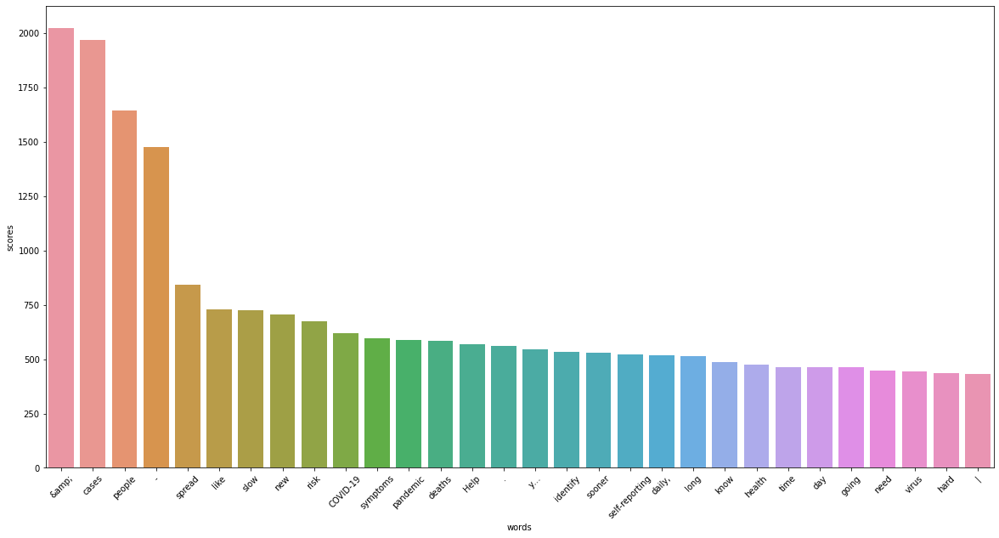

In [51]:
plt.figure(figsize=(20,10))
sns.barplot(x='words',y='scores',data=neg_df)
plt.xticks(rotation=45)
plt.show()

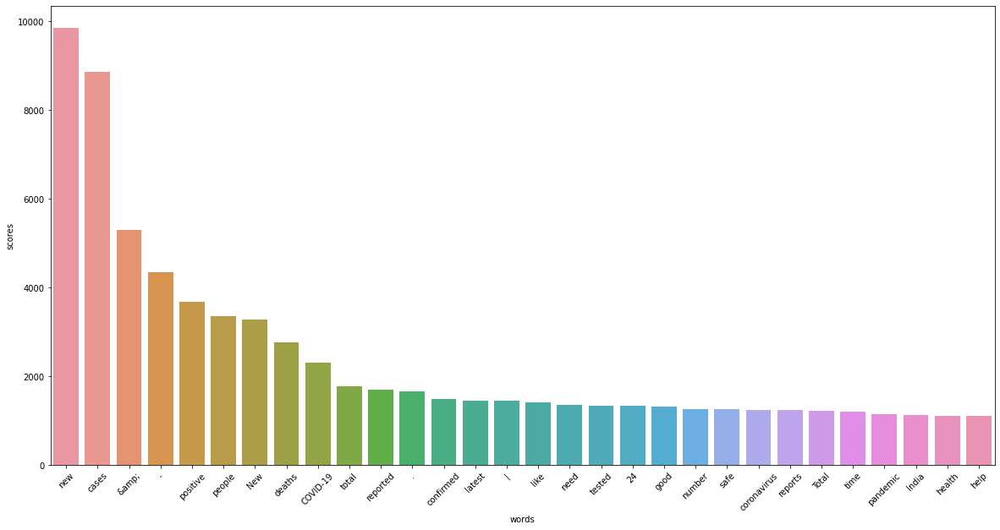

In [52]:
# Plot with seaborn
pos_df = pd.DataFrame(most_common_pos_words,columns=['words','scores'])
plt.figure(figsize=(20,10))
sns.barplot(x='words',y='scores',data=pos_df)
plt.xticks(rotation=45)
plt.show()

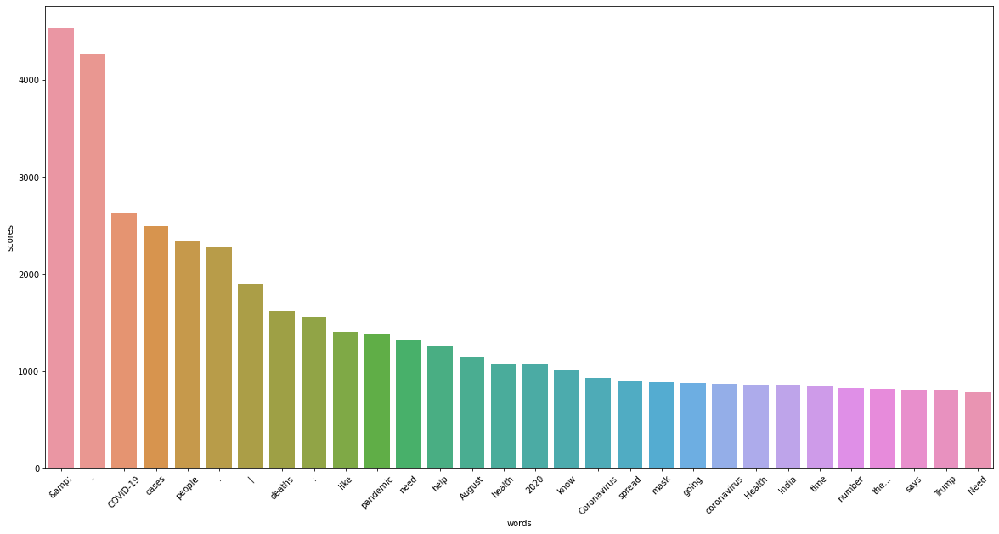

In [53]:
# Plot with seaborn
neut_df = pd.DataFrame(most_common_neut_words,columns=['words','scores'])
plt.figure(figsize=(20,10))
sns.barplot(x='words',y='scores',data=neut_df)
plt.xticks(rotation=45)
plt.show()

In [54]:
### Word Cloud
import wordcloud
from wordcloud import WordCloud

In [55]:
def plot_wordcloud(docx):
    plt.figure(figsize=(20,10))
    mywordcloud = WordCloud().generate(docx)
    plt.imshow(mywordcloud,interpolation='bilinear')
    plt.axis('off')
    plt.show()

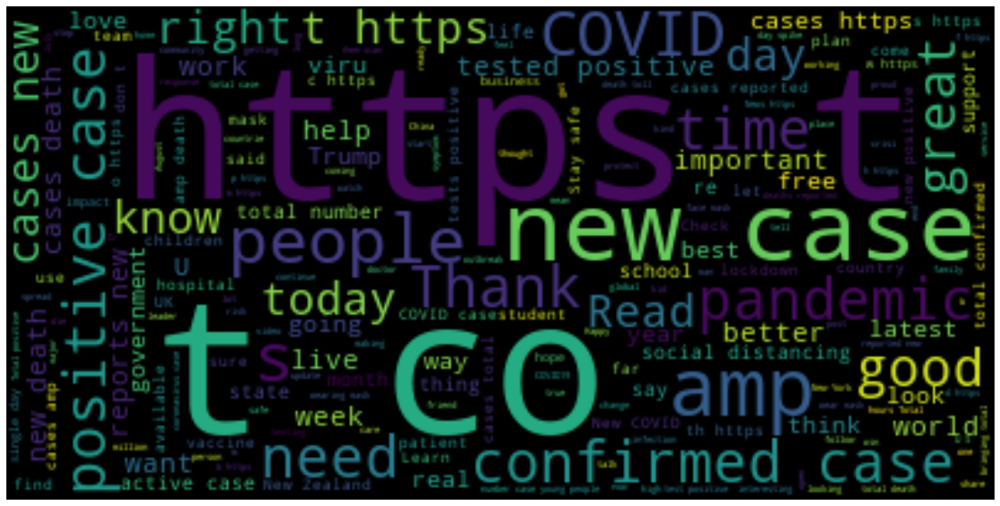

In [56]:
pos_docx = ' '.join(pos_tokens)
neg_docx = ' '.join(neg_tokens)
neu_docx = ' '.join(neut_tokens)
plot_wordcloud(pos_docx)


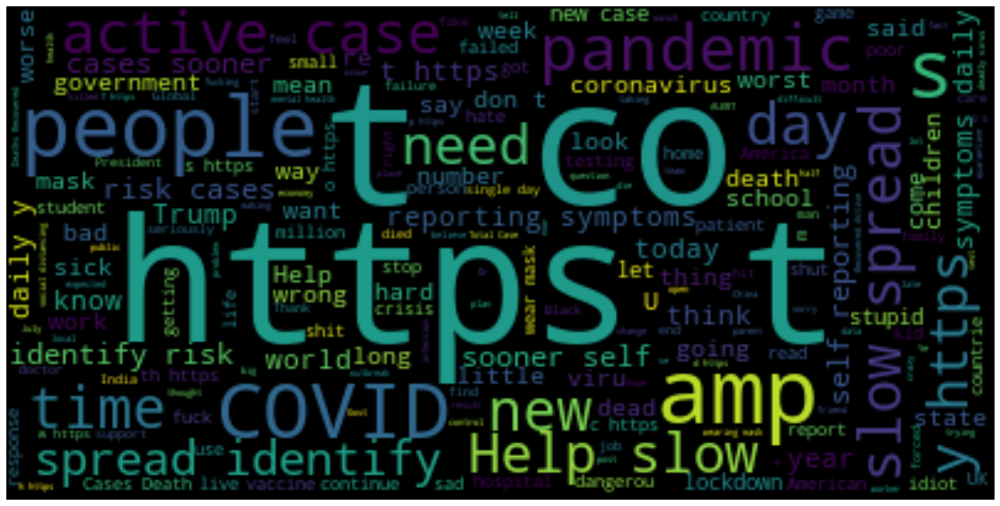

In [57]:
plot_wordcloud(neg_docx)


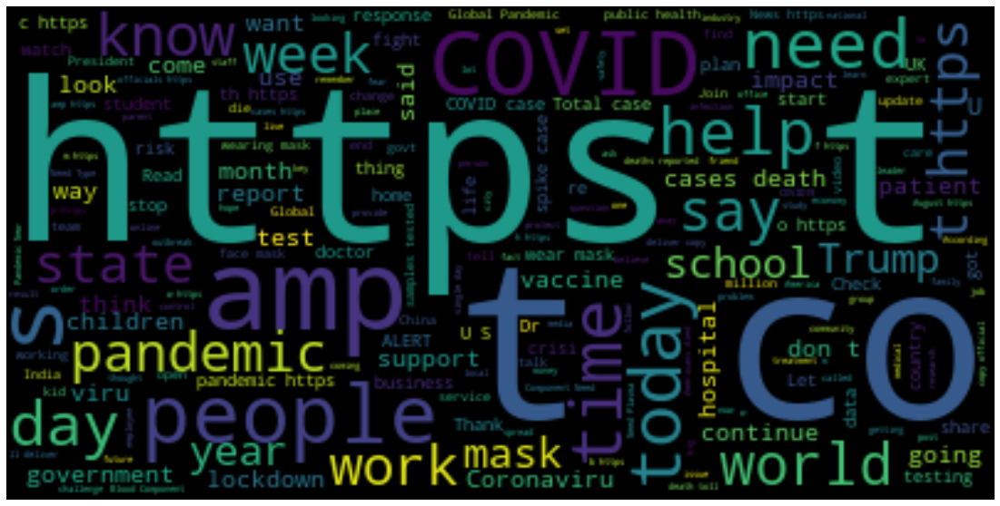

In [58]:
plot_wordcloud(neu_docx)

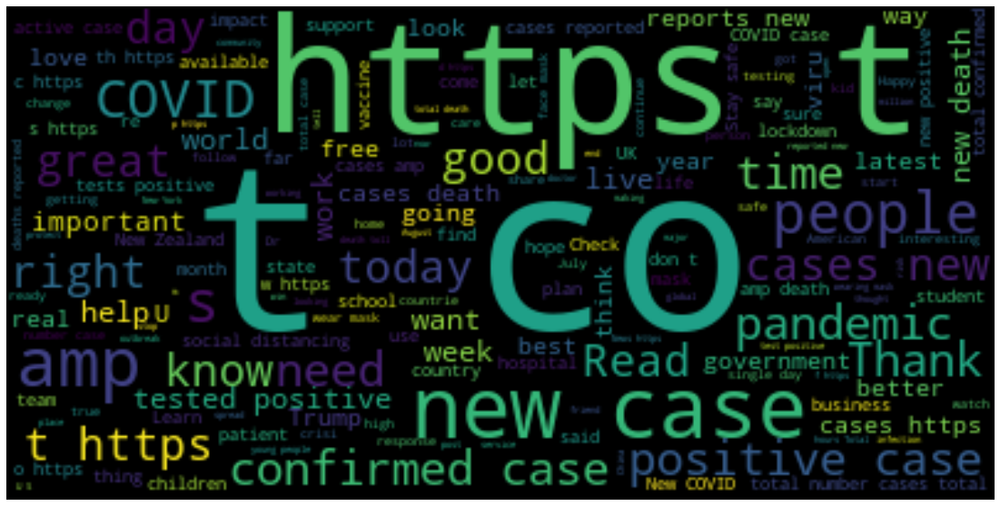

In [59]:
plot_wordcloud(pos_docx)